# configuration (套件相關引入與設定)

In [ ]:
import pickle

In [ ]:
# Load packages
import os
import ast
import warnings
import numpy as np
import random
import joblib
# import lightgbm as lgb
from sklearn.linear_model import ElasticNet
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, Input, LeakyReLU, Layer
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.constraints import MaxNorm
import tensorflow.keras.backend as K
from functools import partial
from tensorflow.python.framework.ops import disable_eager_execution
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

In [ ]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
warnings.filterwarnings("ignore")

# Load real-world data variables: mean_train, cov_train, mean_test, cov_test, f_hat
rw_data = np.load('/content/rw_data.npz')
mean_train = rw_data['mean_train']
cov_train = rw_data['cov_train']
mean_test = rw_data['mean_test']
cov_test = rw_data['cov_test']
diff_vec = mean_test - mean_train
sig_y = rw_data['sig_y']

['due_dates', 'mean_train', 'cov_train', 'mean_test', 'cov_test', 'sig_y']


In [ ]:
print("Train len: " + str(len(rw_data['mean_train'])))
print("Test len: " + str(len(rw_data['mean_test'])))
print("Cov Train len: " + str(len(rw_data['cov_train'])))
print("Cov Test len: " + str(len(rw_data['cov_test'])))

Train len: 20
Test len: 20
Cov Train len: 20
Cov Test len: 20


In [ ]:
# nonlin = 'rf'
# if nonlin == 'rf':
#     f_hat = joblib.load("/content/rf_model.pickle")
# elif nonlin == 'gbm':
#     f_hat = lgb.Booster(model_file='/content/lgb_model.txt')

In [ ]:
error = 'gaussian'

# 事前測試

## Monthly ( Average )

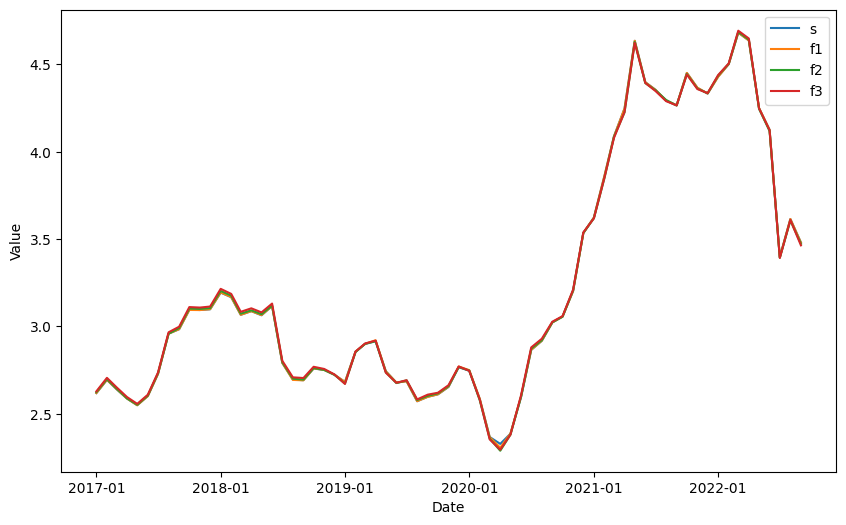

In [ ]:
# 讀取數據
dfs = pd.read_csv('/content/coppers.csv')

# 將 'date' 列轉換為 datetime 對象
dfs['date'] = pd.to_datetime(dfs['date'])

# 設定 'date' 列為索引
dfs = dfs.set_index('date')

# 對每個月進行抽樣
monthly_dfs = dfs.resample('M').mean()

# 將索引改為每個月的第一天
monthly_dfs.index = monthly_dfs.index.to_period('M').to_timestamp()

# 讀取數據
dff = pd.read_csv('/content/copperf.csv')

# 將 'date' 列轉換為 datetime 對象
dff['date'] = pd.to_datetime(dff['date'])

# 設定 'date' 列為索引
dff = dff.set_index('date')

# 對每個月進行抽樣
monthly_dff = dff.resample('M').mean()

# 將索引改為每個月的第一天
monthly_dff.index = monthly_dff.index.to_period('M').to_timestamp()

monthlyTest = pd.concat([monthly_dfs, monthly_dff], axis=1)

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 繪製折線圖
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(monthlyTest['s'], label='s')
ax.plot(monthlyTest['f1'], label='f1')
ax.plot(monthlyTest['f2'], label='f2')
ax.plot(monthlyTest['f3'], label='f3')

# 設定日期格式
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# 添加圖例和標籤
plt.legend()
plt.xlabel('Date')
plt.ylabel('Value')

# 顯示圖形
plt.show()

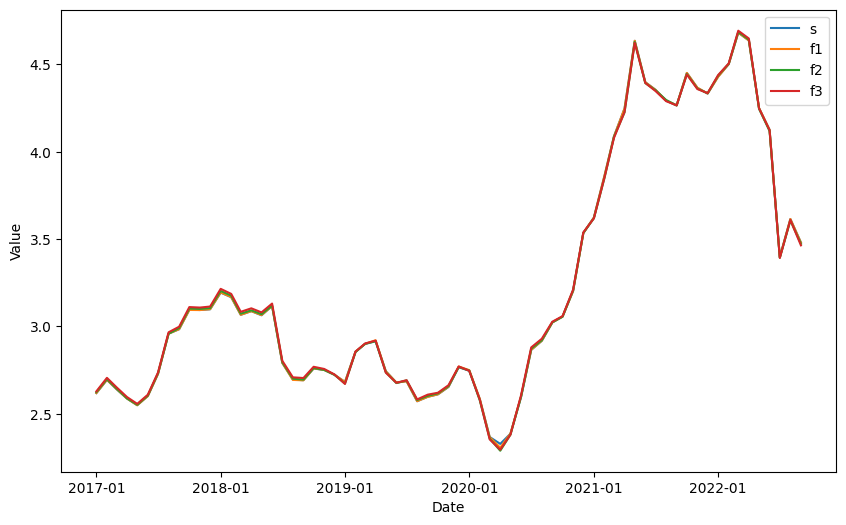

In [ ]:
monthlyTest = pd.concat([monthly_dfs, monthly_dff], axis=1)

# 繪製折線圖
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(monthlyTest['s'], label='s')
ax.plot(monthlyTest['f1'], label='f1')
ax.plot(monthlyTest['f2'], label='f2')
ax.plot(monthlyTest['f3'], label='f3')

# 設定日期格式
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# 添加圖例和標籤
plt.legend()
plt.xlabel('Date')
plt.ylabel('Value')

# 顯示圖形
plt.show()

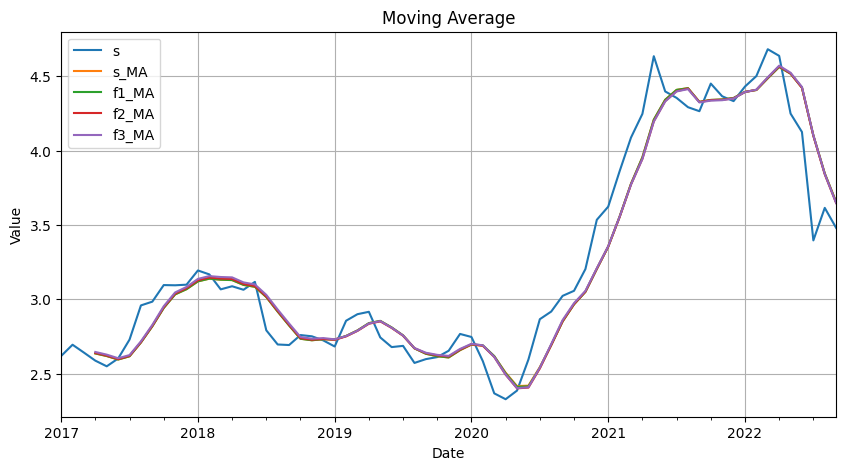

In [ ]:
df = monthlyTest

df['s_MA'] = df['s'].rolling(window=4).mean()
df['f1_MA'] = df['f1'].rolling(window=4).mean()
df['f2_MA'] = df['f2'].rolling(window=4).mean()
df['f3_MA'] = df['f3'].rolling(window=4).mean()

df[['s', 's_MA', 'f1_MA', 'f2_MA', 'f3_MA']].plot(kind='line', figsize=(10, 5))

plt.title('Moving Average')
plt.xlabel('Date')
plt.ylabel('Value')
plt.grid(True)
plt.show()

## Weekly ( Average )

In [ ]:
# 讀取數據
Wdfs = pd.read_csv('/content/coppers.csv')

# 將 'date' 列轉換為 datetime 對象
Wdfs['date'] = pd.to_datetime(Wdfs['date'])

# 設定 'date' 列為索引
Wdfs = Wdfs.set_index('date')

# 對每個月進行抽樣
weekly_dfs = Wdfs.resample('W').mean()

In [ ]:
# 將索引改為每週的第一天
weekly_dfs.index = weekly_dfs.index.to_period('W').to_timestamp()
weekly_dfs

,s
date,
2017-01-02,2.524125
2017-01-09,2.614800
2017-01-16,2.610750
2017-01-23,2.677700
2017-01-30,2.672200
...,...
2022-08-29,3.505200
2022-09-05,3.506000
2022-09-12,3.567300


In [ ]:
# 讀取數據
Wdff = pd.read_csv('/content/copperf.csv')

# 將 'date' 列轉換為 datetime 對象
Wdff['date'] = pd.to_datetime(Wdff['date'])

# 設定 'date' 列為索引
Wdff = Wdff.set_index('date')

# 對每個月進行抽樣
weekly_dff = Wdff.resample('W').mean()

In [ ]:
# 將索引改為每週的第一天
weekly_dff.index = weekly_dff.index.to_period('W').to_timestamp()
weekly_dff

,f1,f2,f3
date,,,
2017-01-02,2.5250,2.5275,2.5350
2017-01-09,2.6140,2.6240,2.6240
2017-01-16,2.6125,2.6150,2.6225
2017-01-23,2.6780,2.6800,2.6860
2017-01-30,2.6720,2.6820,2.6840
...,...,...,...
2022-08-29,3.5060,3.5020,3.5020
2022-09-05,3.5075,3.5050,3.4975
2022-09-12,3.5680,3.5580,3.5500


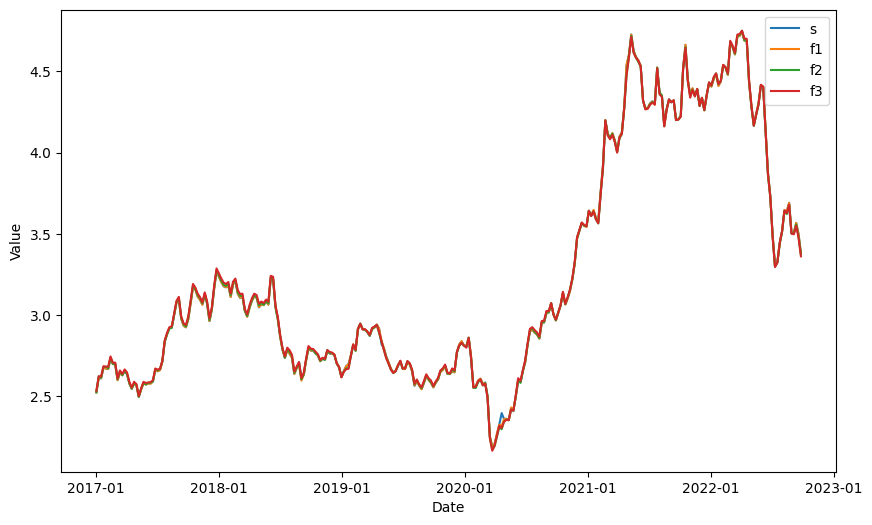

In [ ]:
weeklyTest = pd.concat([weekly_dfs, weekly_dff], axis=1)

# 繪製折線圖
fig1, ax1 = plt.subplots(figsize=(10, 6))
ax1.plot(weeklyTest['s'], label='s')
ax1.plot(weeklyTest['f1'], label='f1')
ax1.plot(weeklyTest['f2'], label='f2')
ax1.plot(weeklyTest['f3'], label='f3')

# 設定日期格式
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# 添加圖例和標籤
plt.legend()
plt.xlabel('Date')
plt.ylabel('Value')

# 顯示圖形
plt.show()

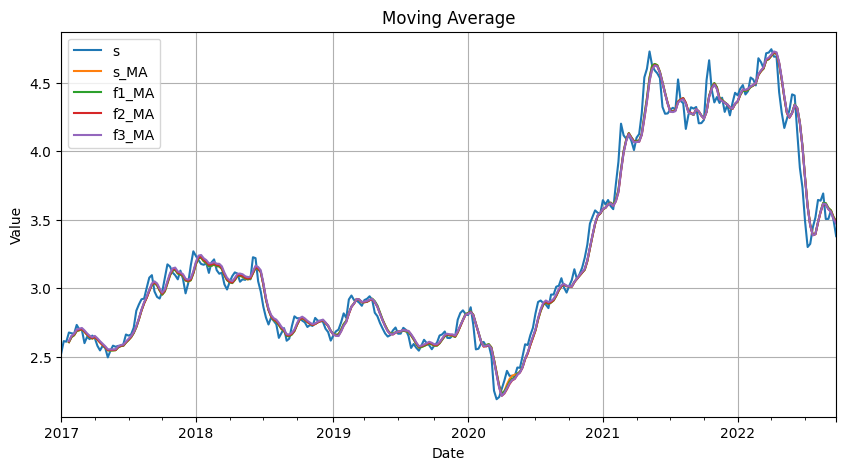

In [ ]:
df = weeklyTest

df['s_MA'] = df['s'].rolling(window=4).mean()
df['f1_MA'] = df['f1'].rolling(window=4).mean()
df['f2_MA'] = df['f2'].rolling(window=4).mean()
df['f3_MA'] = df['f3'].rolling(window=4).mean()

df[['s', 's_MA', 'f1_MA', 'f2_MA', 'f3_MA']].plot(kind='line', figsize=(10, 5))

plt.title('Moving Average')
plt.xlabel('Date')
plt.ylabel('Value')
plt.grid(True)
plt.show()

## Daily

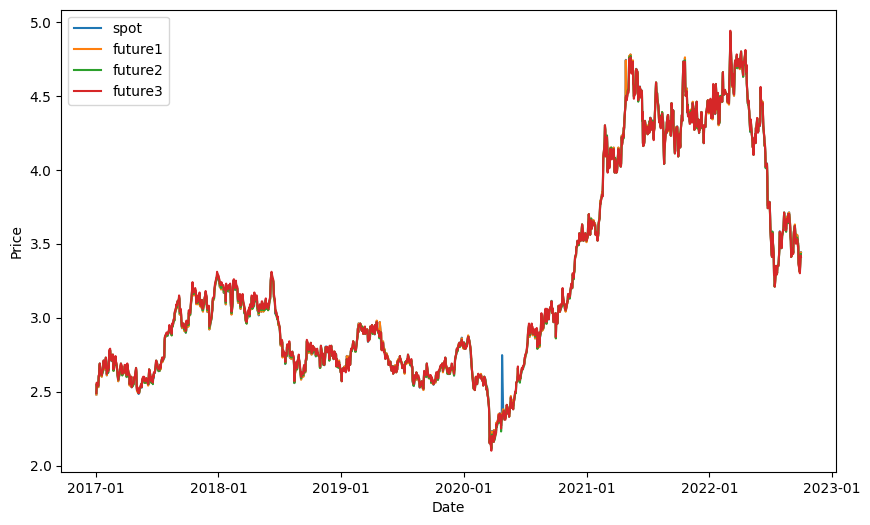

In [ ]:
# 讀取數據
Ddfs = pd.read_csv('/content/coppers.csv')

# 將 'date' 列轉換為 datetime 對象
Ddfs['date'] = pd.to_datetime(Ddfs['date'])

# 設定 'date' 列為索引
Ddfs = Ddfs.set_index('date')
Ddfs.sort_index(inplace=True)

# 讀取數據
Ddff = pd.read_csv('/content/copperf.csv')

# 將 'date' 列轉換為 datetime 對象
Ddff['date'] = pd.to_datetime(Ddff['date'])

# 設定 'date' 列為索引
Ddff = Ddff.set_index('date')
Ddff.sort_index(inplace=True)

Ddfs = Ddfs[~Ddfs.index.duplicated(keep='first')]

dailyTest = pd.concat([Ddfs, Ddff], axis=1)

dailyTest.dropna(inplace=True)

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 繪製折線圖
fig2, ax2 = plt.subplots(figsize=(10, 6))
ax2.plot(dailyTest['s'], label='spot')
ax2.plot(dailyTest['f1'], label='future1')
ax2.plot(dailyTest['f2'], label='future2')
ax2.plot(dailyTest['f3'], label='future3')

# 設定日期格式
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
# 只顯示數據的開始和結束日期
# start_date = dailyTest.index[0]
# end_date = dailyTest.index[1040]
# ax2.set_xlim(start_date, end_date)

# 設定 x 軸刻度間隔為一定的範圍，例如每隔一段時間顯示一個日期點
# date_range = pd.date_range(start=start_date, end=end_date, freq='28D')  # 每隔5天顯示一個日期點，可以根據需要調整
# ax2.set_xticks(date_range)

# 添加圖例和標籤
plt.legend()
plt.xlabel('Date')
plt.ylabel('Price')

plt.savefig('/content/copperzoomin.png')

# 顯示圖形
plt.show()

In [ ]:
Ddfs = Ddfs[~Ddfs.index.duplicated(keep='first')]

In [ ]:
print(Ddfs.index.duplicated().any())  # 檢查 Ddfs 是否存在重複索引
print(Ddff.index.duplicated().any())  # 檢查 Ddff 是否存在重複索引
print(Ddfs.index.isnull().any())  # 檢查 Ddfs 是否存在空的索引值
print(Ddff.index.isnull().any())  # 檢查 Ddff 是否存在空的索引值

False
False
False
False


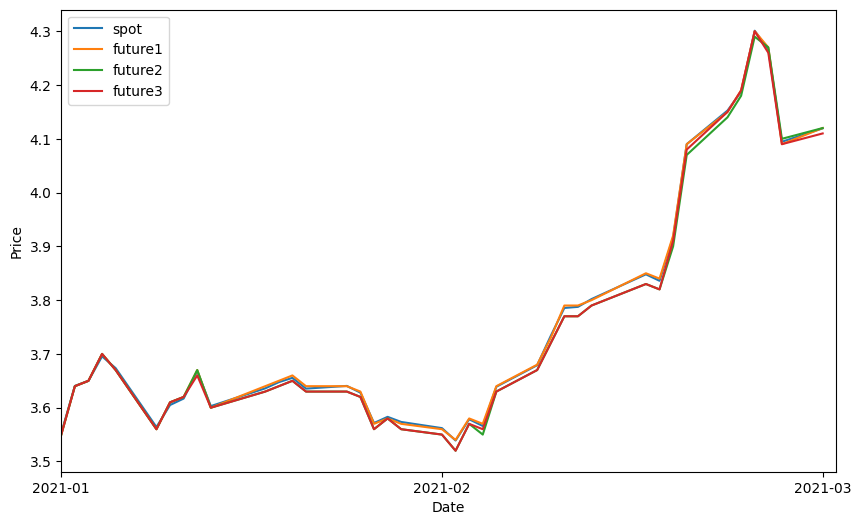

In [ ]:
dailyTest = pd.concat([Ddfs, Ddff], axis=1)

dailyTest.dropna(inplace=True)

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 繪製折線圖
fig2, ax2 = plt.subplots(figsize=(10, 6))
ax2.plot(dailyTest['s'][1001:1040], label='spot')
ax2.plot(dailyTest['f1'][1001:1040], label='future1')
ax2.plot(dailyTest['f2'][1001:1040], label='future2')
ax2.plot(dailyTest['f3'][1001:1040], label='future3')

# 設定日期格式
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
# 只顯示數據的開始和結束日期
start_date = dailyTest.index[1001]
end_date = dailyTest.index[1040]
ax2.set_xlim(start_date, end_date)

# 設定 x 軸刻度間隔為一定的範圍，例如每隔一段時間顯示一個日期點
date_range = pd.date_range(start=start_date, end=end_date, freq='28D')  # 每隔5天顯示一個日期點，可以根據需要調整
ax2.set_xticks(date_range)

# 添加圖例和標籤
plt.legend()
plt.xlabel('Date')
plt.ylabel('Price')

plt.savefig('/content/copperzoomin.png')

# 顯示圖形
plt.show()

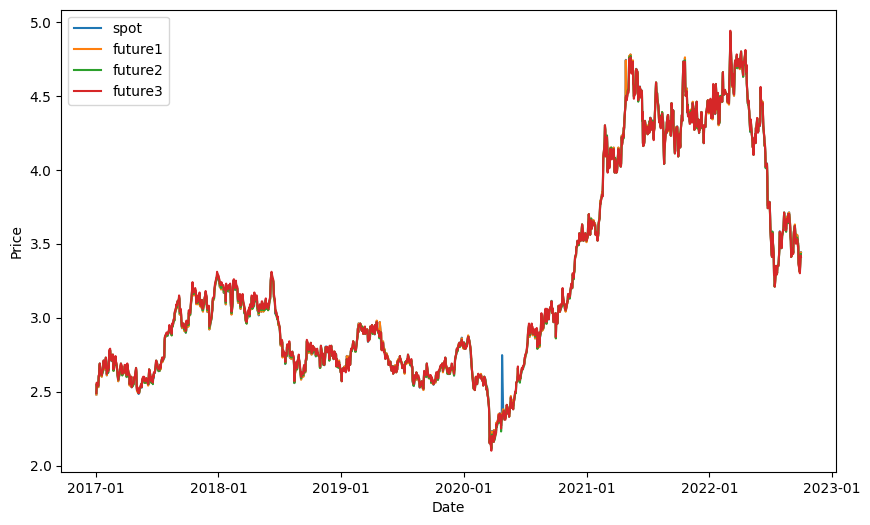

In [ ]:
dailyTest = pd.concat([Ddfs, Ddff], axis=1)

dailyTest.dropna(inplace=True)

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 繪製折線圖
fig2, ax2 = plt.subplots(figsize=(10, 6))
ax2.plot(dailyTest['s'], label='spot')
ax2.plot(dailyTest['f1'], label='future1')
ax2.plot(dailyTest['f2'], label='future2')
ax2.plot(dailyTest['f3'], label='future3')

# 設定日期格式
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# 添加圖例和標籤
plt.legend()
plt.xlabel('Date')
plt.ylabel('Price')

# 顯示圖形
plt.show()

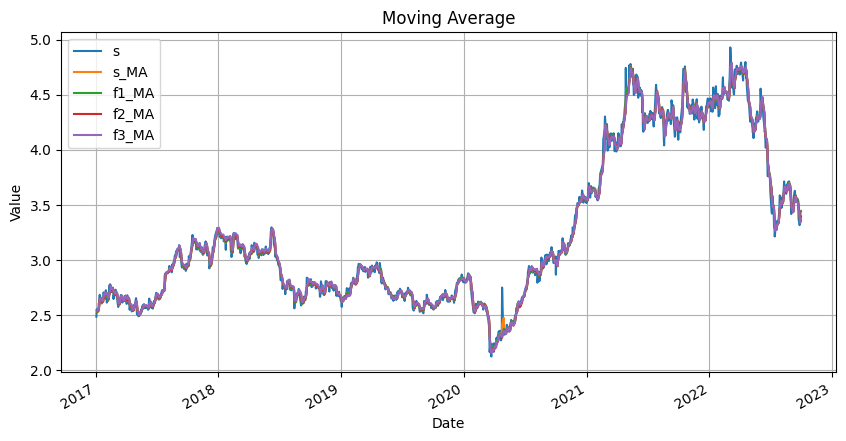

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = dailyTest

df['s_MA'] = df['s'].rolling(window=4).mean()
df['f1_MA'] = df['f1'].rolling(window=4).mean()
df['f2_MA'] = df['f2'].rolling(window=4).mean()
df['f3_MA'] = df['f3'].rolling(window=4).mean()

df[['s', 's_MA', 'f1_MA', 'f2_MA', 'f3_MA']].plot(kind='line', figsize=(10, 5))

plt.title('Moving Average')
plt.xlabel('Date')
plt.ylabel('Value')
plt.grid(True)
plt.show()

# Bootstrap 方法定義

In [ ]:
realTrain = dailyTest[0:]

In [ ]:
pip install arch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 45.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.9/233.9 kB 19.8 MB/s eta 0:00:00


In [ ]:
from arch.bootstrap import MovingBlockBootstrap
from numpy.random import standard_normal

In [ ]:
import seaborn as sns
from pandas.plotting import register_matplotlib_converters

register_matplotlib_converters()
sns.set_style("darkgrid")

In [ ]:
def drawTest(monthlyTest):
    # 繪製折線圖
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(monthlyTest['s'], label='s')
    ax.plot(monthlyTest['f1'], label='f1')
    ax.plot(monthlyTest['f2'], label='f2')
    ax.plot(monthlyTest['f3'], label='f3')

    # 設定日期格式
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

    # 添加圖例和標籤
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Value')

    # 顯示圖形
    plt.show()

In [ ]:
def timeProcess(trainData, timeType):
    df = pd.DataFrame(trainData)

    # 计算每5条记录的平均值
    n = 5  # 每组5条数据
    grouped_means = []

    # 使用 numpy 的 array_split 来分割 DataFrame
    for group in np.array_split(df, np.arange(n, len(df), n)):
        mean_values = group.mean()
        grouped_means.append(mean_values)

    # 将结果转换为 DataFrame
    result_df = pd.DataFrame(grouped_means)
    result_df = result_df.drop(columns=['date'])

    return result_df

In [ ]:
!pip install prophet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.4/14.4 MB 49.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.5/94.5 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 48.2 MB/s eta 0:00:00


In [ ]:
from prophet import Prophet
from copy import deepcopy

# len(trainMonth)//4 + len(testMonth)//4 => period

def predictSpot(trainData, period, partitionType, timeType):
    dailyFcM=[]

    trainData = trainData.reset_index()
    # 将 DataFrame 的行索引赋值给 'index' 列
    trainData['index'] = trainData.index
    # 设置起始日期
    start_date = pd.Timestamp('2017-01-01')

    # 为每个索引创建一个新的日期，每个索引对应不同的天
    trainData['date'] = [start_date + pd.DateOffset(days=x) for x in range(len(trainData))]

    # 将 'index' 列的值转换为 datetime 类型
    trainData = trainData.rename(columns={'date': 'ds', 's': 'y'})

    settings = {
        'overlap':{
            'M':{
                'start': 0,
                'interval': 22,
                'end': 84,
                'fPeriod': 66,
                'round': 2,
            },
            'W':{
                'start': 0,
                'interval': 5,
                'end': 20,
                'fPeriod': 21,
                'round': 2,
            }
        },
        'non-overlap':{
            'M':{
                'start': 0,
                'interval': 22,
                'end': 84,
                'fPeriod': 66,
                'round': 4,
            },
            'W':{
                'start': 0,
                'interval': 5,
                'end': 20,
                'fPeriod': 21,
                'round': 4,
            }
        },
    }
    partitionType = 'non-overlap'
    timeType = 'W'
    method = 1

    if partitionType in settings and timeType in settings[partitionType]:
        config = settings[partitionType][timeType]
        start=config['start']
        fPeriod=config['fPeriod']
        interval=config['interval']
        end=config['end']
        round=config['round']


    for i in range(1, period):
        trainPrice=trainData[i*20: i*20+95][['ds', 'y']]

        trainPrice['y'] = np.log(trainPrice['y'] + 1e-8)

        modelTest = Prophet(uncertainty_samples=2000)

        modelTest.fit(trainPrice)

        futureTest = modelTest.make_future_dataframe(periods=fPeriod)

        forecastTestM = modelTest.predict(futureTest)
        forecastTestM = forecastTestM[forecastTestM['ds'] > max(trainPrice['ds'])]

        forecastTestM['yhat'] = np.exp(forecastTestM['yhat'])

        median_yhat = np.median(forecastTestM['yhat'])
        mad = np.median(np.abs(forecastTestM['yhat'] - median_yhat))
        threshold = 3 * mad
        forecastTestM['yhat'] = forecastTestM['yhat'].apply(lambda x: median_yhat if np.abs(x - median_yhat) > threshold else x)

        fcM = forecastTestM['yhat']
        dailyFcM.append(fcM)
    dailyFcM.append(dailyFcM[-1])
    return dailyFcM

In [ ]:
from concurrent.futures import ProcessPoolExecutor

In [ ]:
import traceback
# 替 y 做 Label (from real data)
def makeXFeature(trainData, period, fcData, partitionType, timeType):

    settings = {
        'overlap':{
            'M':{
                'end': 69,
                'round': 2,
            },
            'W':{
                'end': 21,
                'round': 2,
            }
        },
        'non-overlap':{
            'M':{
                'end': 69,
                'round': 4,
            },
            'W':{
                'end': 21,
                'round': 4,
            }
        },
    }

    if partitionType in settings and timeType in settings[partitionType]:
        config = settings[partitionType][timeType]
        end=config['end']
        round=config['round']
    x_data = np.zeros([period, 4+len(fcData[0])])

    try:
        for t in range(period):
            x_data[t,0] = trainData['s'][t*round]   ## 第一天的現貨
            x_data[t,1] = trainData['f1'][t*round]   ## 第一天的期貨(tau=1)
            x_data[t,2] = trainData['f2'][t*round]   ## 第一天的期貨(tau=2)
            x_data[t,3] = trainData['f3'][t*round]   ## 第一天的期貨(tau=3)
            # prophet 出來的值
            # Fill in the data
            i=0
            for index, value in fcData[t].items():
                x_data[t, 4+i] = value
                i += 1
            # for i in range(0, 21):
            #     x_data[t,4+i] = fcData[t][i+97]
    except Exception as e:
        traceback.print_exc()

    return x_data

In [ ]:
import traceback

def makeXRealFeature(trainData, period, partitionType, timeType, method):

    settings = {
        'overlap':{
            'round': 2
        },
        'non-overlap':{
            'round': 4
        },
    }

    if partitionType in settings:
        config = settings[partitionType]
        round = config['round']

    x_dataR = np.zeros([period, 10])

    try:
        for t in range(period):
            x_dataR[t,0] = trainData['s'][t*round]
            x_dataR[t,1] = trainData['f1'][t*round]
            x_dataR[t,2] = trainData['f2'][t*round]
            x_dataR[t,3] = trainData['f3'][t*round]
            x_dataR[t,4] = trainData['s'][t*round+1]
            x_dataR[t,5] = trainData['f1'][t*round+1]
            x_dataR[t,6] = trainData['f2'][t*round+1]
            x_dataR[t,7] = trainData['s'][t*round+2]
            x_dataR[t,8] = trainData['f1'][t*round+2]
            x_dataR[t,9] = trainData['s'][t*round+3]
    except Exception as e:
        traceback.print_exc()


    # Construct Y （一個用-1,1 一個用softmax)
    if method == 1:
        y_train = np.full((period, 10), 0.0)
        deltas = np.full((period, 10), 0.0)
        for i in range(period):
            for j in range(10):
                deltas[i][j]=x_dataR[i][j]-min(x_dataR[i])
            deltas[i] = np.exp(-np.array(deltas[i]))
        for i in range(period):
            for j in range(10):
                y_train[i][j] = (deltas[i][j] / np.sum(deltas[i]))
    else:
        y_train = np.full((period, 10), -1.0)
        for i in range(period):
            min_index=np.argmin(x_dataR[i])
            y_train[i][min_index]=1

    return [x_dataR, y_train]

In [ ]:
from statsmodels.tsa.seasonal import STL

def makeBootstrap(dailyData, blockSize, sim):

    residuals = pd.DataFrame()
    trends = pd.DataFrame()
    seasonals = pd.DataFrame()

    # 假設 df 是你的 DataFrame，並且每一個欄位都是一個時間序列
    for column in dailyData.columns:
        stl = STL(dailyData[column], period=12)
        res = stl.fit()
        residuals[column] = res.resid
        trends[column] = res.trend
        seasonals[column] = res.seasonal
        # print(res.seasonal+res.trend-dailyTest[column])

    # 創建子圖
    fig, axs = plt.subplots(2, 2, figsize=(14, 10))

    # 繪製第一張圖
    axs[0, 0].plot(trends.index, trends['s'], linestyle='-')
    axs[0, 0].set_title('Trends')
    axs[0, 0].set_xlabel('Index')
    axs[0, 0].set_ylabel('Values')
    axs[0, 0].grid(True)

    # 繪製第二張圖
    axs[0, 1].plot(seasonals.index, seasonals['s'], linestyle='-')
    axs[0, 1].set_title('Seasonals')
    axs[0, 1].set_xlabel('Index')
    axs[0, 1].set_ylabel('Values')
    axs[0, 1].grid(True)

    # 繪製第三張圖
    axs[1, 0].plot(residuals.index, residuals['s'], linestyle='-')
    axs[1, 0].set_title('Residual')
    axs[1, 0].set_xlabel('Index')
    axs[1, 0].set_ylabel('Values')
    axs[1, 0].grid(True)

    # 繪製第四張圖
    axs[1, 1].plot(dailyData.reset_index().index, dailyData['s'], linestyle='-')
    axs[1, 1].set_title('Real Data')
    axs[1, 1].set_xlabel('Index')
    axs[1, 1].set_ylabel('Values')
    axs[1, 1].grid(True)

    # 調整子圖之間的間距
    plt.tight_layout()
    plt.show()

    bs2 = MovingBlockBootstrap(blockSize, residuals, seed=2)
    test2=[]
    for data in bs2.bootstrap(sim):
        test2.append(data[0][0].reset_index())

    trends = trends.reset_index()
    seasonals = seasonals.reset_index()

    for df in test2:
        df['s'] = df['s'] + trends['s'] + seasonals['s']
        df['f1'] = df['f1'] + trends['f1'] + seasonals['f1']
        df['f2'] = df['f2'] + trends['f2'] + seasonals['f2']
        df['f3'] = df['f3'] + trends['f3'] + seasonals['f3']

    return test2

In [ ]:
def MBB3(dailyData, blockSize, sim, partitionType, timeType, method):
    dailyData = dailyData.dropna()
    fcb_trainData = []
    fcb_trainData.append(dailyData)

    x_list=[]
    y_list=[]
    z_list=[]

    for i in range(len(fcb_trainData)):
        # Construct X
        trainData = timeProcess(fcb_trainData[i][90:], timeType)
        # Deal with trainData with nan value (average)
        trainData = trainData.interpolate()
        # print(trainData)
        y_trainList = makeXRealFeature(trainData, len(trainData)//4, partitionType, timeType, method)
        y_list.append(y_trainList[1])
        z_list.append(y_trainList[0])

    return [z_list, y_list, x_list]

In [ ]:
def MBB2(dailyData, blockSize, sim, partitionType, timeType, method):

    dailyData = dailyData.dropna()
    fcb_trainData = []
    fcb_trainData.append(dailyData)

    x_list=[]
    y_list=[]
    z_list=[]

    round=4
    for i in range(len(fcb_trainData)):
        # Construct X
        trainData = timeProcess(fcb_trainData[i][90:], timeType)
        # Deal with trainData with nan value (average)
        trainData = trainData.interpolate()

        # Modify fcData
        fcData = predictSpot(fcb_trainData[i], len(trainData)//4, partitionType, timeType)

        # Modify with 分開 train & val & final test
        x_train = makeXFeature(trainData, len(trainData)//4, fcData, partitionType, timeType)
        y_trainList = makeXRealFeature(trainData, len(trainData)//4, partitionType, timeType, method)
        x_list.append(x_train)
        y_list.append(y_trainList[1])
        z_list.append(y_trainList[0])

    return [x_list, y_list, z_list]

In [ ]:
def MBB(dailyData, blockSize, sim, partitionType, timeType, method):

    dailyData = dailyData.dropna()
    fcb_trainData = makeBootstrap(dailyData, blockSize, sim)

    x_list=[]
    y_list=[]
    z_list=[]

    round=4
    for i in range(len(fcb_trainData)):
        # Construct X
        trainData = timeProcess(fcb_trainData[i][90:], timeType)
        # Deal with trainData with nan value (average)
        trainData = trainData.interpolate()

        # Modify fcData
        fcData = predictSpot(fcb_trainData[i], len(trainData)//4, partitionType, timeType)

        # Modify with 分開 train & val & final test
        x_train = makeXFeature(trainData, len(trainData)//4, fcData, partitionType, timeType)
        y_trainList = makeXRealFeature(trainData, len(trainData)//4, partitionType, timeType, method)
        x_list.append(x_train)
        y_list.append(y_trainList[1])
        z_list.append(y_trainList[0])

    return [x_list, y_list, z_list]

In [ ]:
import traceback

def makeXRealFeature2(trainData, period, partitionType, timeType, method):

    settings = {
        'overlap':{
            'round': 2
        },
        'non-overlap':{
            'round': 4
        },
    }

    if partitionType in settings:
        config = settings[partitionType]
        round = config['round']

    x_dataR = np.zeros([period, 10])

    try:
        for t in range(period):
            x_dataR[t,0] = trainData['s'][t*round]
            x_dataR[t,1] = trainData['f1'][t*round]
            x_dataR[t,2] = trainData['f2'][t*round]
            x_dataR[t,3] = trainData['f3'][t*round]
            x_dataR[t,4] = trainData['s'][t*round+1]
            x_dataR[t,5] = trainData['f1'][t*round+1]
            x_dataR[t,6] = trainData['f2'][t*round+1]
            x_dataR[t,7] = trainData['s'][t*round+2]
            x_dataR[t,8] = trainData['f1'][t*round+2]
            x_dataR[t,9] = trainData['s'][t*round+3]
    except Exception as e:
        traceback.print_exc()


    return x_dataR

In [ ]:
def check_order(row):
    return row['f3'] > row['f2'] > row['f1'] > row['s']

# 使用 apply 函數檢查每一行
realTrain['is_ordered'] = realTrain.apply(check_order, axis=1)

print(realTrain)

                 s    f1    f2    f3      s_MA   f1_MA   f2_MA   f3_MA  \
date                                                                     
2017-01-03  2.4810  2.48  2.49  2.49       NaN     NaN     NaN     NaN   
2017-01-04  2.5480  2.55  2.55  2.56       NaN     NaN     NaN     NaN   
2017-01-05  2.5295  2.53  2.53  2.54       NaN     NaN     NaN     NaN   
2017-01-06  2.5380  2.54  2.54  2.55  2.524125  2.5250  2.5275  2.5350   
2017-01-09  2.5300  2.53  2.54  2.54  2.536375  2.5375  2.5400  2.5475   
...            ...   ...   ...   ...       ...     ...     ...     ...   
2022-09-26  3.3135  3.31  3.32  3.31  3.423875  3.4225  3.4175  3.4075   
2022-09-27  3.3230  3.32  3.31  3.30  3.376625  3.3750  3.3725  3.3625   
2022-09-28  3.3820  3.38  3.38  3.37  3.347500  3.3450  3.3450  3.3350   
2022-09-29  3.4400  3.44  3.43  3.42  3.364625  3.3625  3.3600  3.3500   
2022-09-30  3.4420  3.44  3.43  3.41  3.396750  3.3950  3.3875  3.3750   

            is_ordered  
date        

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 各種原物料的價格走向

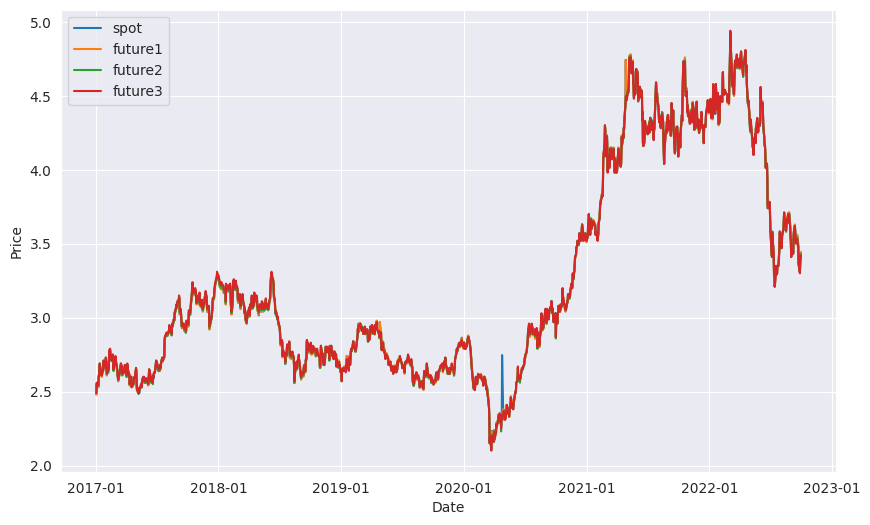

In [ ]:
# 讀取數據
Ddfs = pd.read_csv('/content/coppers.csv')

# 將 'date' 列轉換為 datetime 對象
Ddfs['date'] = pd.to_datetime(Ddfs['date'])

# 設定 'date' 列為索引
Ddfs = Ddfs.set_index('date')
Ddfs.sort_index(inplace=True)

# 讀取數據
Ddff = pd.read_csv('/content/copperf.csv')

# 將 'date' 列轉換為 datetime 對象
Ddff['date'] = pd.to_datetime(Ddff['date'])

# 設定 'date' 列為索引
Ddff = Ddff.set_index('date')
Ddff.sort_index(inplace=True)

Ddfs = Ddfs[~Ddfs.index.duplicated(keep='first')]

dailyTest = pd.concat([Ddfs, Ddff], axis=1)

dailyTest.dropna(inplace=True)

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 繪製折線圖
fig2, ax2 = plt.subplots(figsize=(10, 6))
ax2.plot(dailyTest['s'], label='spot')
ax2.plot(dailyTest['f1'], label='future1')
ax2.plot(dailyTest['f2'], label='future2')
ax2.plot(dailyTest['f3'], label='future3')

# 設定日期格式
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
# 只顯示數據的開始和結束日期
# start_date = dailyTest.index[0]
# end_date = dailyTest.index[1040]
# ax2.set_xlim(start_date, end_date)

# 設定 x 軸刻度間隔為一定的範圍，例如每隔一段時間顯示一個日期點
# date_range = pd.date_range(start=start_date, end=end_date, freq='28D')  # 每隔5天顯示一個日期點，可以根據需要調整
# ax2.set_xticks(date_range)

# 添加圖例和標籤
plt.legend()
plt.xlabel('Date')
plt.ylabel('Price')

plt.savefig('/content/copper.png')

# 顯示圖形
plt.show()

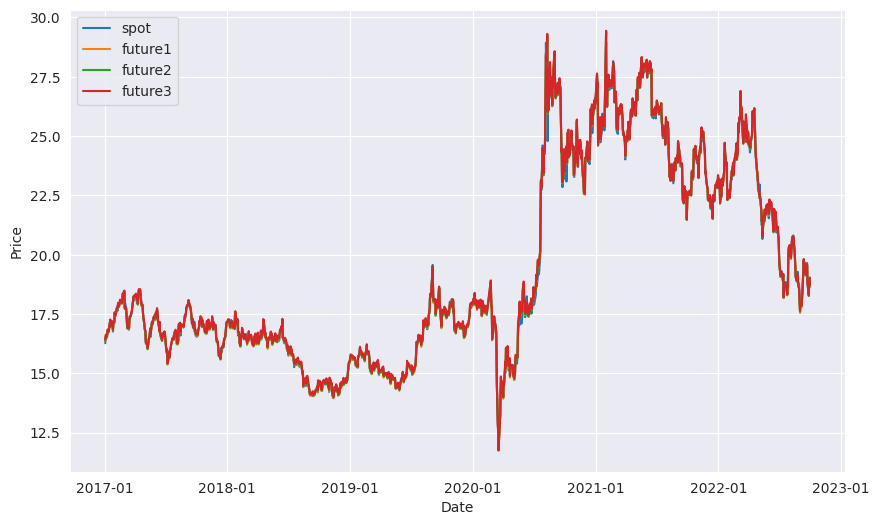

In [ ]:
import pandas as pd

# 讀取數據
Ddfs_s = pd.read_csv('/content/silvers.csv')

# 將 'date' 列轉換為 datetime 對象
Ddfs_s['date'] = pd.to_datetime(Ddfs_s['date'])

# 設定 'date' 列為索引
Ddfs_s = Ddfs_s.set_index('date')
Ddfs_s.sort_index(inplace=True)

# 讀取數據
Ddff_s = pd.read_csv('/content/silverf.csv')

# 將 'date' 列轉換為 datetime 對象
Ddff_s['date'] = pd.to_datetime(Ddff_s['date'])

# 設定 'date' 列為索引
Ddff_s = Ddff_s.set_index('date')
Ddff_s.sort_index(inplace=True)

Ddfs_s = Ddfs_s[~Ddfs_s.index.duplicated(keep='first')]

dailyTest_s = pd.concat([Ddfs_s, Ddff_s], axis=1)

dailyTest_s.dropna(inplace=True)

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 繪製折線圖
fig2_s, ax2_s = plt.subplots(figsize=(10, 6))
ax2_s.plot(dailyTest_s['s'], label='spot')
ax2_s.plot(dailyTest_s['f1'], label='future1')
ax2_s.plot(dailyTest_s['f2'], label='future2')
ax2_s.plot(dailyTest_s['f3'], label='future3')

# 設定日期格式
ax2_s.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
# 只顯示數據的開始和結束日期
# start_date_s = dailyTest_s.index[0]
# end_date_s = dailyTest_s.index[1040]
# ax2_s.set_xlim(start_date_s, end_date_s)

# 設定 x 軸刻度間隔為一定的範圍，例如每隔一段時間顯示一個日期點
# date_range_s = pd.date_range(start=start_date_s, end=end_date_s, freq='28D')  # 每隔5天顯示一個日期點，可以根據需要調整
# ax2_s.set_xticks(date_range_s)

# 添加圖例和標籤
plt.legend()
plt.xlabel('Date')
plt.ylabel('Price')

plt.savefig('/content/silver.png')

# 顯示圖形
plt.show()


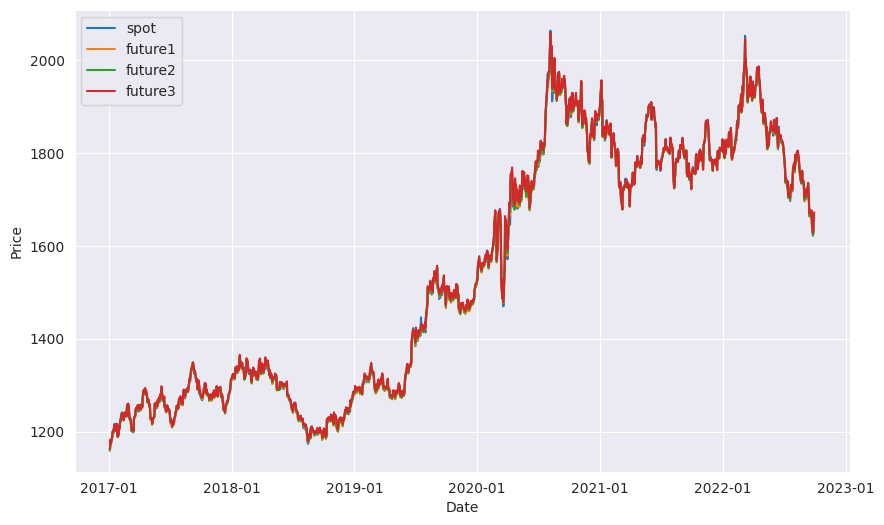

In [ ]:
import pandas as pd

# 讀取數據
Ddfs_g = pd.read_csv('/content/golds.csv')

# 將 'date' 列轉換為 datetime 對象
Ddfs_g['date'] = pd.to_datetime(Ddfs_g['date'])

# 設定 'date' 列為索引
Ddfs_g = Ddfs_g.set_index('date')
Ddfs_g.sort_index(inplace=True)

# 讀取數據
Ddff_g = pd.read_csv('/content/goldf.csv')

# 將 'date' 列轉換為 datetime 對象
Ddff_g['date'] = pd.to_datetime(Ddff_g['date'])

# 設定 'date' 列為索引
Ddff_g = Ddff_g.set_index('date')
Ddff_g.sort_index(inplace=True)

Ddfs_g['s'] = Ddfs_g['s'].str.replace(',', '').astype(float)
Ddff_g['f1'] = Ddff_g['f1'].str.replace(',', '').astype(float)
Ddff_g['f2'] = Ddff_g['f2'].str.replace(',', '').astype(float)
Ddff_g['f3'] = Ddff_g['f3'].str.replace(',', '').astype(float)

Ddfs_g = Ddfs_g[~Ddfs_g.index.duplicated(keep='first')]

dailyTest_g = pd.concat([Ddfs_g, Ddff_g], axis=1)

dailyTest_g.dropna(inplace=True)

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 繪製折線圖
fig2_g, ax2_g = plt.subplots(figsize=(10, 6))
ax2_g.plot(dailyTest_g['s'], label='spot')
ax2_g.plot(dailyTest_g['f1'], label='future1')
ax2_g.plot(dailyTest_g['f2'], label='future2')
ax2_g.plot(dailyTest_g['f3'], label='future3')

# 設定日期格式
ax2_g.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
# 只顯示數據的開始和結束日期
# start_date_g = dailyTest_g.index[0]
# end_date_g = dailyTest_g.index[1040]
# ax2_g.set_xlim(start_date_g, end_date_g)

# 設定 x 軸刻度間隔為一定的範圍，例如每隔一段時間顯示一個日期點
# date_range_g = pd.date_range(start=start_date_g, end=end_date_g, freq='28D')  # 每隔5天顯示一個日期點，可以根據需要調整
# ax2_g.set_xticks(date_range_g)

# 添加圖例和標籤
plt.legend()
plt.xlabel('Date')
plt.ylabel('Price')

plt.savefig('/content/gold.png')

# 顯示圖形
plt.show()


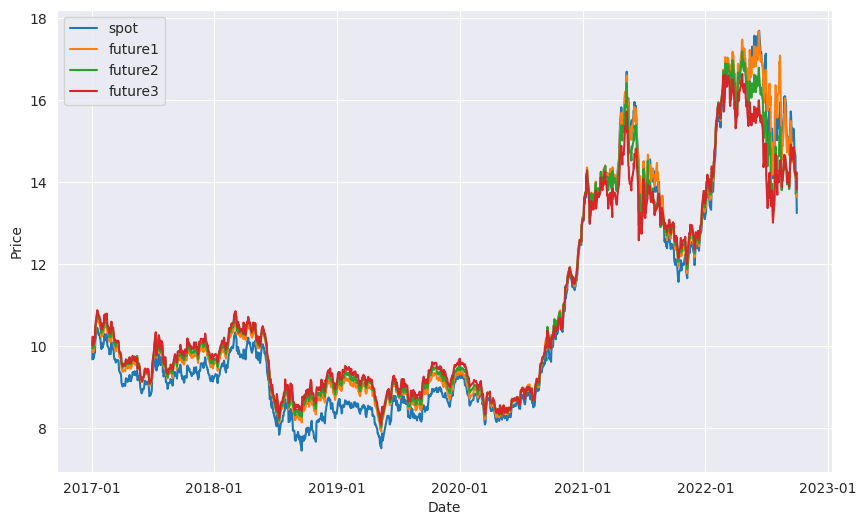

In [ ]:
import pandas as pd

# 讀取數據
Ddfs_so = pd.read_csv('/content/soys.csv')

# 將 'date' 列轉換為 datetime 對象
Ddfs_so['date'] = pd.to_datetime(Ddfs_so['date'])

# 設定 'date' 列為索引
Ddfs_so = Ddfs_so.set_index('date')
Ddfs_so.sort_index(inplace=True)

# 讀取數據
Ddff_so = pd.read_csv('/content/soyf.csv')

# 將 'date' 列轉換為 datetime 對象
Ddff_so['date'] = pd.to_datetime(Ddff_so['date'])

# 設定 'date' 列為索引
Ddff_so = Ddff_so.set_index('date')
Ddff_so.sort_index(inplace=True)

Ddfs_so = Ddfs_so[~Ddfs_so.index.duplicated(keep='first')]

dailyTest_so = pd.concat([Ddfs_so, Ddff_so], axis=1)

dailyTest_so.dropna(inplace=True)

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 繪製折線圖
fig2_so, ax2_so = plt.subplots(figsize=(10, 6))
ax2_so.plot(dailyTest_so['s'], label='spot')
ax2_so.plot(dailyTest_so['f1'], label='future1')
ax2_so.plot(dailyTest_so['f2'], label='future2')
ax2_so.plot(dailyTest_so['f3'], label='future3')

# 設定日期格式
ax2_so.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
# 只顯示數據的開始和結束日期
# start_date_so = dailyTest_so.index[0]
# end_date_so = dailyTest_so.index[1040]
# ax2_so.set_xlim(start_date_so, end_date_so)

# 設定 x 軸刻度間隔為一定的範圍，例如每隔一段時間顯示一個日期點
# date_range_so = pd.date_range(start=start_date_so, end=end_date_so, freq='28D')  # 每隔5天顯示一個日期點，可以根據需要調整
# ax2_so.set_xticks(date_range_so)

# 添加圖例和標籤
plt.legend()
plt.xlabel('Date')
plt.ylabel('Price')

plt.savefig('/content/soy.png')

# 顯示圖形
plt.show()


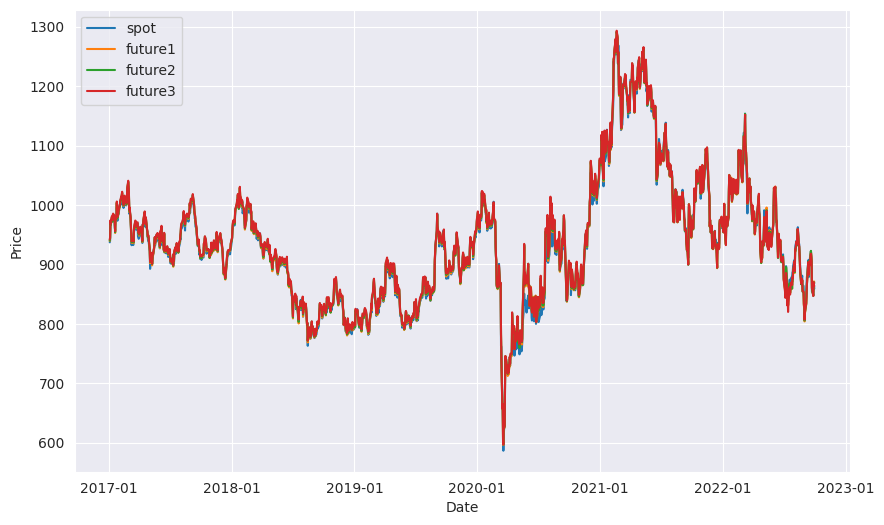

In [ ]:
import pandas as pd

# 讀取數據
Ddfs_p = pd.read_csv('/content/plats.csv')

# 將 'date' 列轉換為 datetime 對象
Ddfs_p['date'] = pd.to_datetime(Ddfs_p['date'])

# 設定 'date' 列為索引
Ddfs_p = Ddfs_p.set_index('date')
Ddfs_p.sort_index(inplace=True)

# 讀取數據
Ddff_p = pd.read_csv('/content/platf.csv')

# 將 'date' 列轉換為 datetime 對象
Ddff_p['date'] = pd.to_datetime(Ddff_p['date'])

# 設定 'date' 列為索引
Ddff_p = Ddff_p.set_index('date')
Ddff_p.sort_index(inplace=True)

Ddfs_p['s'] = Ddfs_p['s'].str.replace(',', '').astype(float)
Ddff_p['f1'] = Ddff_p['f1'].str.replace(',', '').astype(float)
Ddff_p['f2'] = Ddff_p['f2'].str.replace(',', '').astype(float)
Ddff_p['f3'] = Ddff_p['f3'].str.replace(',', '').astype(float)

Ddfs_p = Ddfs_p[~Ddfs_p.index.duplicated(keep='first')]

dailyTest_p = pd.concat([Ddfs_p, Ddff_p], axis=1)

dailyTest_p.dropna(inplace=True)

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 繪製折線圖
fig2_p, ax2_p = plt.subplots(figsize=(10, 6))
ax2_p.plot(dailyTest_p['s'], label='spot')
ax2_p.plot(dailyTest_p['f1'], label='future1')
ax2_p.plot(dailyTest_p['f2'], label='future2')
ax2_p.plot(dailyTest_p['f3'], label='future3')

# 設定日期格式
ax2_p.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
# 只顯示數據的開始和結束日期
# start_date_p = dailyTest_p.index[0]
# end_date_p = dailyTest_p.index[1040]
# ax2_p.set_xlim(start_date_p, end_date_p)

# 設定 x 軸刻度間隔為一定的範圍，例如每隔一段時間顯示一個日期點
# date_range_p = pd.date_range(start=start_date_p, end=end_date_p, freq='28D')  # 每隔5天顯示一個日期點，可以根據需要調整
# ax2_p.set_xticks(date_range_p)

# 添加圖例和標籤
plt.legend(loc='upper left')
plt.xlabel('Date')
plt.ylabel('Price')

plt.savefig('/content/plat.png')

# 顯示圖形
plt.show()


In [ ]:
# from matplotlib import pyplot as plt
# _df_51['s'].plot(kind='line', figsize=(8, 4), title='s')
# plt.gca().spines[['top', 'right']].set_visible(False)

# 各種原物料的訓練與測試資料生產

## silver

In [ ]:
test_noB = MBB2(dailyTest_s.reset_index(), 22, 5, 'non-overlap', 'W', 1)
test_noBReg = MBB2(dailyTest_s.reset_index(), 22, 5, 'non-overlap', 'W', 2)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmrsmu_0h/7qgamy0n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmrsmu_0h/08xbsl5a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74307', 'data', 'file=/tmp/tmpmrsmu_0h/7qgamy0n.json', 'init=/tmp/tmpmrsmu_0h/08xbsl5a.json', 'output', 'file=/tmp/tmpmrsmu_0h/prophet_model82kua4h_/prophet_model-20240717130636.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:06:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:06:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonali

In [ ]:
# testReg = MBB(dailyTest_s, 22, 50, 'non-overlap', 'W', 2)
# test = MBB(dailyTest_s, 22, 50, 'non-overlap', 'W', 1)

In [ ]:
# import pickle

# with open('/content/drive/MyDrive/iLovePDF/testReg.pkl', 'wb') as f:
#     pickle.dump(testReg, f)

# with open('/content/drive/MyDrive/iLovePDF/test.pkl', 'wb') as f:
#     pickle.dump(test, f)

In [ ]:
# # 读取并加载文件
# with open('/content/drive/MyDrive/iLovePDF/testReg.pkl', 'rb') as f:
#     testReg = pickle.load(f)

# # 现在 testReg 对象已经被加载，可以使用它进行后续操作
# print(testReg[0][0].shape)

In [ ]:
# 載入 pkl 檔案
with open('/content/drive/MyDrive/iLovePDF/testReg.pkl', 'rb') as f:
    testReg_s = pickle.load(f)

# 載入 pkl 檔案
with open('/content/drive/MyDrive/iLovePDF/test.pkl', 'rb') as f:
    test_s = pickle.load(f)

## gold

In [ ]:
# testReg_g = MBB(dailyTest_g, 22, 50, 'non-overlap', 'W', 2)
# test_g = MBB(dailyTest_g, 22, 50, 'non-overlap', 'W', 1)

In [ ]:
test_noB_g = MBB2(dailyTest_g.reset_index(), 22, 5, 'non-overlap', 'W', 1)
test_noBReg_g = MBB2(dailyTest_g.reset_index(), 22, 5, 'non-overlap', 'W', 2)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmrsmu_0h/fn_jgfe3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmrsmu_0h/hp9x3wpk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68016', 'data', 'file=/tmp/tmpmrsmu_0h/fn_jgfe3.json', 'init=/tmp/tmpmrsmu_0h/hp9x3wpk.json', 'output', 'file=/tmp/tmpmrsmu_0h/prophet_model50vhz7lh/prophet_model-20240717130731.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:07:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:07:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonali

In [ ]:
import pickle

In [ ]:
# with open('/content/drive/MyDrive/iLovePDF/testReg_g.pkl', 'wb') as f:
#     pickle.dump(testReg_g, f)

# with open('/content/drive/MyDrive/iLovePDF/test_g.pkl', 'wb') as f:
#     pickle.dump(test_g, f)

In [ ]:
# 載入 pkl 檔案
with open('/content/drive/MyDrive/iLovePDF/testReg_g.pkl', 'rb') as f:
    testReg_g = pickle.load(f)

# 載入 pkl 檔案
with open('/content/drive/MyDrive/iLovePDF/test_g.pkl', 'rb') as f:
    test_g = pickle.load(f)

## soy

In [ ]:
test_noB_so = MBB2(dailyTest_so.reset_index(), 22, 5, 'non-overlap', 'W', 1)
test_noBReg_so = MBB2(dailyTest_so.reset_index(), 22, 5, 'non-overlap', 'W', 2)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmrsmu_0h/yjnrja7k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmrsmu_0h/6yseq2rp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62271', 'data', 'file=/tmp/tmpmrsmu_0h/yjnrja7k.json', 'init=/tmp/tmpmrsmu_0h/6yseq2rp.json', 'output', 'file=/tmp/tmpmrsmu_0h/prophet_modelqw6wkavs/prophet_model-20240717130809.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:08:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:08:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonali

In [ ]:
# testReg_so = MBB(dailyTest_so, 22, 50, 'non-overlap', 'W', 2)
# test_so = MBB(dailyTest_so, 22, 50, 'non-overlap', 'W', 1)

In [ ]:
import pickle

In [ ]:
# with open('/content/drive/MyDrive/iLovePDF/testReg_so.pkl', 'wb') as f:
#     pickle.dump(testReg_so, f)

# with open('/content/drive/MyDrive/iLovePDF/test_so.pkl', 'wb') as f:
#     pickle.dump(test_so, f)

In [ ]:
# 載入 pkl 檔案
with open('/content/drive/MyDrive/iLovePDF/testReg_so.pkl', 'rb') as f:
    testReg_so = pickle.load(f)

# 載入 pkl 檔案
with open('/content/drive/MyDrive/iLovePDF/test_so.pkl', 'rb') as f:
    test_so = pickle.load(f)

## platinum

In [ ]:
test_noB_p = MBB2(dailyTest_p.reset_index(), 22, 5, 'non-overlap', 'W', 1)
test_noBReg_p = MBB2(dailyTest_p.reset_index(), 22, 5, 'non-overlap', 'W', 2)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmrsmu_0h/47m0_9cs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmrsmu_0h/9r1e11a2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76795', 'data', 'file=/tmp/tmpmrsmu_0h/47m0_9cs.json', 'init=/tmp/tmpmrsmu_0h/9r1e11a2.json', 'output', 'file=/tmp/tmpmrsmu_0h/prophet_modelnqk_d4zv/prophet_model-20240717130859.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:08:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:09:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonali

In [ ]:
# testReg_p = MBB(dailyTest_p, 22, 50, 'non-overlap', 'W', 2)
# test_p = MBB(dailyTest_p, 22, 50, 'non-overlap', 'W', 1)

In [ ]:
# with open('/content/drive/MyDrive/iLovePDF/testReg_p.pkl', 'wb') as f:
#     pickle.dump(testReg_p, f)

# with open('/content/drive/MyDrive/iLovePDF/test_p.pkl', 'wb') as f:
#     pickle.dump(test_p, f)

In [ ]:
import pickle

In [ ]:
# 載入 pkl 檔案
with open('/content/drive/MyDrive/iLovePDF/testReg_p.pkl', 'rb') as f:
    testReg_p = pickle.load(f)

# 載入 pkl 檔案
with open('/content/drive/MyDrive/iLovePDF/test_p.pkl', 'rb') as f:
    test_p = pickle.load(f)

## copper

In [ ]:
# testReg_c = MBB(dailyTest, 22, 50, 'non-overlap', 'W', 2)
# test_c = MBB(dailyTest, 22, 50, 'non-overlap', 'W', 1)

In [ ]:
test_noB_c = MBB2(dailyTest.reset_index(), 22, 5, 'non-overlap', 'W', 1)
test_noBReg_c = MBB2(dailyTest.reset_index(), 22, 5, 'non-overlap', 'W', 2)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmrsmu_0h/31j19qnk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmrsmu_0h/iruw6w_b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66198', 'data', 'file=/tmp/tmpmrsmu_0h/31j19qnk.json', 'init=/tmp/tmpmrsmu_0h/iruw6w_b.json', 'output', 'file=/tmp/tmpmrsmu_0h/prophet_model075o426y/prophet_model-20240717130943.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:09:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:09:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonali

In [ ]:
# with open('/content/drive/MyDrive/iLovePDF/testReg_c.pkl', 'wb') as f:
#     pickle.dump(testReg_c, f)

# with open('/content/drive/MyDrive/iLovePDF/test_c.pkl', 'wb') as f:
#     pickle.dump(test_c, f)

In [ ]:
# 載入 pkl 檔案
with open('/content/drive/MyDrive/iLovePDF/testReg_c.pkl', 'rb') as f:
    testReg_c = pickle.load(f)

# 載入 pkl 檔案
with open('/content/drive/MyDrive/iLovePDF/test_c.pkl', 'rb') as f:
    test_c = pickle.load(f)

# 各種原物料的訓練資料敘述統計

## silver

### 資料生成

In [ ]:
def construct_np_silver_data(thisData):
    x_train=[]
    y_train=[]
    x_test=[]
    y_test=[]
    x_final_test=[]
    y_final_test=[]
    x_bs_real=[]
    x_real_test=[]
    x_final_real=[]
    x_bs_train=[]
    y_bs_train=[]
    # 塞進去 x_train 和 y_train 裡面
    for round in range(len(thisData[0])):
        for j in range(len(thisData[0][round])):
            # train case & val case
            if j<60:
                if j>=39:
                    # thisData[0][round][j][-1] = 1
                    x_test.append(thisData[0][round][j])
                x_train.append(thisData[0][round][j])
                if j<39:
                    x_bs_train.append(thisData[0][round][j])
            # final test case
            else:
                x_final_test.append(thisData[0][round][j])

    for round in range(len(thisData[1])):
        for w in range(len(thisData[1][round])):
            # train case & val case
            if w<60:
                if w>=39:
                    y_test.append(thisData[1][round][w])
                y_train.append(thisData[1][round][w])
                if w<39:
                    y_bs_train.append(thisData[1][round][w])
            # final test case
            else:
                y_final_test.append(thisData[1][round][w])

    # Real Data
    for round in range(len(thisData[2])):
        for n in range(len(thisData[2][round])):
            if n<60:
                if n>=39:
                    x_real_test.append(thisData[2][round][n])
                else:
                    x_bs_real.append(thisData[2][round][n])
            elif n>=60:
                x_final_real.append(thisData[2][round][n])

    x_train = np.array(x_train)
    x_test = np.array(x_test)
    y_train = np.array(y_train)
    y_test = np.array(y_test)
    x_final_test = np.array(x_final_test)
    y_final_test = np.array(y_final_test)
    x_bs_real = np.array(x_bs_real)
    x_real_test = np.array(x_real_test)
    x_bs_train = np.array(x_bs_train)
    y_bs_train = np.array(y_bs_train)
    x_final_real = np.array(x_final_real)

    return [x_train, y_train, x_test, y_test, x_final_test, y_final_test, x_bs_real, x_real_test, x_final_real, x_bs_train, y_bs_train]

In [ ]:
trainW_s = construct_np_silver_data(test_s)
trainWReg_s = construct_np_silver_data(testReg_s)

In [ ]:
x_train_wReg_s = trainWReg_s[0]
y_train_wReg_s = trainWReg_s[1]
x_val_wReg_s = trainWReg_s[2]
y_val_wReg_s = trainWReg_s[3]
x_final_wReg_s = trainWReg_s[4]
y_final_wReg_s = trainWReg_s[5]
x_bs_train_wReg_s = trainWReg_s[9]
y_bs_train_wReg_s = trainWReg_s[10]

In [ ]:
x_train_ws = trainW_s[0]
y_train_ws = trainW_s[1]
x_val_ws = trainW_s[2]
y_val_ws = trainW_s[3]
x_final_ws = trainW_s[4]
y_final_ws = trainW_s[5]
x_bs_train_ws = trainW_s[9]
y_bs_train_ws = trainW_s[10]

In [ ]:
realData_s = construct_np_silver_data(test_noB)
realDataReg_s = construct_np_silver_data(test_noBReg)

In [ ]:
x_bs_train_wsReal = trainWReg_s[6]
x_val_wsReal = trainWReg_s[7]

x_bs_train_wsRReal = realData_s[6]
x_val_wsRReal = realData_s[7]

In [ ]:
x_train_wsR = realData_s[0]
y_train_wsR = realData_s[1]
x_val_wsR = realData_s[2]
y_val_wsR = realData_s[3]
x_final_wsR = realData_s[4]
y_final_wsR = realData_s[5]
x_final_real_wsR = realData_s[8]
x_bs_train_wsR = realData_s[9]
y_bs_train_wsR = realData_s[10]

x_train_wReg_sR = realDataReg_s[0]
y_train_wReg_sR = realDataReg_s[1]
x_val_wReg_sR = realDataReg_s[2]
y_val_wReg_sR = realDataReg_s[3]
x_final_wReg_sR = realDataReg_s[4]
y_final_wReg_sR = realDataReg_s[5]
x_final_real_wReg_sR = realDataReg_s[8]
x_bs_train_wReg_sR = realDataReg_s[9]
y_bs_train_wReg_sR = realDataReg_s[10]

In [ ]:
y_final_wsR

array([[0.17397088, 0.16017836, 0.15985832, 0.15637984, 0.08616016,
        0.08066364, 0.08034163, 0.03060942, 0.02637161, 0.04546614],
       [0.09711634, 0.08485209, 0.0840078 , 0.08267437, 0.09425365,
        0.07647085, 0.07631806, 0.16599698, 0.14415795, 0.09415192],
       [0.01089858, 0.00951883, 0.00948083, 0.0091456 , 0.06315502,
        0.05816434, 0.05781639, 0.14820143, 0.16130103, 0.47231794],
       [0.12491775, 0.12205301, 0.12426986, 0.12059713, 0.08379183,
        0.08934055, 0.09132782, 0.08288511, 0.08116268, 0.07965426],
       [0.03873198, 0.04140765, 0.04066898, 0.03884058, 0.04836834,
        0.04622245, 0.04567109, 0.14210206, 0.15562754, 0.40235934],
       [0.11679933, 0.12528327, 0.12329469, 0.11941171, 0.13098428,
        0.14182265, 0.14125649, 0.03485363, 0.04047066, 0.0258233 ],
       [0.02968441, 0.02962807, 0.02904139, 0.02779127, 0.08891333,
        0.09738986, 0.0960359 , 0.13251848, 0.16479827, 0.30419901],
       [0.08741053, 0.09715385, 0.0952300

In [ ]:
x_final_real_wsR

array([[23.9834 , 24.066  , 24.068  , 24.09   , 24.68608, 24.752  ,
        24.756  , 25.72098, 25.87   , 25.32532],
       [25.061  , 25.196  , 25.206  , 25.222  , 25.09092, 25.3    ,
        25.302  , 24.52494, 24.666  , 25.092  ],
       [25.28664, 25.422  , 25.426  , 25.462  , 23.52968, 23.612  ,
        23.618  , 22.6767 , 22.592  , 21.51762],
       [21.5148 , 21.538  , 21.52   , 21.55   , 21.91412, 21.85   ,
        21.828  , 21.925  , 21.946  , 21.96476],
       [21.4708 , 21.404  , 21.422  , 21.468  , 21.24862, 21.294  ,
        21.306  , 20.17092, 20.08   , 19.13012],
       [18.73412, 18.664  , 18.68   , 18.712  , 18.6195 , 18.54   ,
        18.544  , 19.94342, 19.794  , 20.2433 ],
       [20.4081 , 20.41   , 20.43   , 20.474  , 19.31106, 19.22   ,
        19.234  , 18.912  , 18.694  , 18.08104],
       [19.22768, 19.122  , 19.142  , 19.186  , 19.446  , 19.252  ,
        19.256  , 18.82874, 18.772  , 18.9075 ]])

In [ ]:
x_final_real_wsR

array([[23.9834 , 24.066  , 24.068  , 24.09   , 24.68608, 24.752  ,
        24.756  , 25.72098, 25.87   , 25.32532],
       [25.061  , 25.196  , 25.206  , 25.222  , 25.09092, 25.3    ,
        25.302  , 24.52494, 24.666  , 25.092  ],
       [25.28664, 25.422  , 25.426  , 25.462  , 23.52968, 23.612  ,
        23.618  , 22.6767 , 22.592  , 21.51762],
       [21.5148 , 21.538  , 21.52   , 21.55   , 21.91412, 21.85   ,
        21.828  , 21.925  , 21.946  , 21.96476],
       [21.4708 , 21.404  , 21.422  , 21.468  , 21.24862, 21.294  ,
        21.306  , 20.17092, 20.08   , 19.13012],
       [18.73412, 18.664  , 18.68   , 18.712  , 18.6195 , 18.54   ,
        18.544  , 19.94342, 19.794  , 20.2433 ],
       [20.4081 , 20.41   , 20.43   , 20.474  , 19.31106, 19.22   ,
        19.234  , 18.912  , 18.694  , 18.08104],
       [19.22768, 19.122  , 19.142  , 19.186  , 19.446  , 19.252  ,
        19.256  , 18.82874, 18.772  , 18.9075 ]])

In [ ]:
y_train_ws.shape

(3000, 10)

In [ ]:
y_train_wsR.shape

(60, 10)

### x_train/x_test/y_train/y_test[還未預測過的] 的敘述統計 (silver)

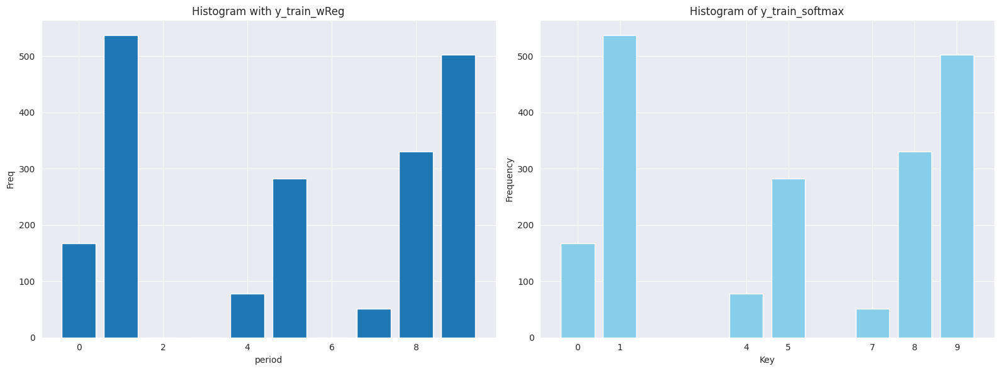

In [ ]:
#y_train
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_train_wReg 每一欄 1 的出現頻率
y_reg_freq_s = np.mean(y_bs_train_wReg_s == 1, axis=0)*len(y_bs_train_wReg_s)
x_reg_freq_s = range(len(y_reg_freq_s))  # 創建 x 軸的索引

# 計算 y_train_w 的最大值索引出現次數
count_s = dict()
for i in range(len(y_bs_train_ws)):
    max_index = np.argmax(y_bs_train_ws[i])
    if max_index in count_s:
        count_s[max_index] += 1
    else:
        count_s[max_index] = 1

keys = list(count_s.keys())
values = list(count_s.values())
values_n = [i for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq_s, y_reg_freq_s)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_train_wReg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of y_train_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.show()


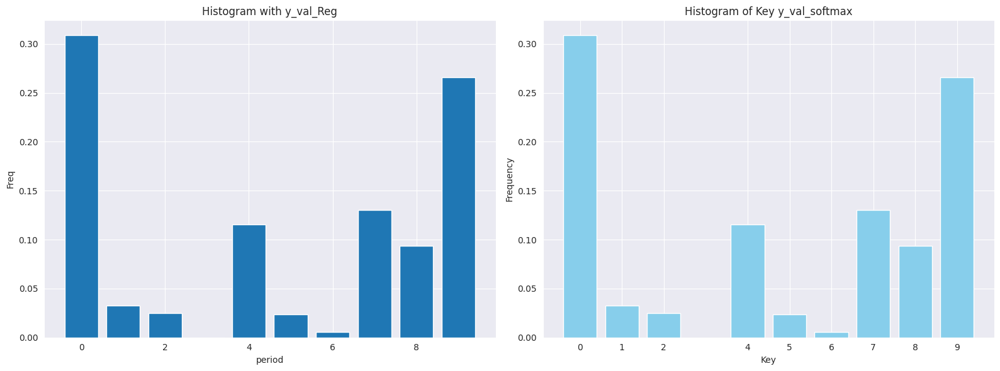

In [ ]:
#y_val
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_val_wReg 每一欄 1 的出現頻率
y_reg_freq_s = np.mean(y_val_wReg_s == 1, axis=0)
x_reg_freq_s = range(len(y_reg_freq_s))  # 創建 x 軸的索引

# 計算 y_val_w 的最大值索引出現次數
count_ss = dict()
for i in range(len(y_val_ws)):
    max_index = np.argmax(y_val_ws[i])
    if max_index in count_ss:
        count_ss[max_index] += 1
    else:
        count_ss[max_index] = 1

keys = list(count_ss.keys())
values = list(count_ss.values())
values_n = [i/len(y_val_ws) for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq_s, y_reg_freq_s)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_val_Reg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of Key y_val_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.preprocessing import StandardScaler

x_bs_train_wReg_s_2 = pd.DataFrame(x_bs_train_wReg_s)
x_bs_train_wReg_s_2.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,1950.000000,1950.000000,1950.000000,1950.000000,1950.000000,1950.000000,1950.000000,1950.000000,1950.000000,1950.000000,...,1950.000000,1950.000000,1950.000000,1950.000000,1950.000000,1950.000000,1950.000000,1950.000000,1950.000000,1950.000000
mean,16.195383,16.177996,16.204223,16.246143,16.222664,16.227607,16.234756,16.238096,16.241432,16.244097,...,16.271619,16.275289,16.282186,16.284393,16.289110,16.298775,16.304129,16.309316,16.313786,16.321369
std,1.150707,1.155562,1.156620,1.156543,1.274740,1.300226,1.326776,1.349069,1.376162,1.399464,...,1.593237,1.622402,1.654103,1.698846,1.733869,1.772842,1.804236,1.838069,1.870493,1.904105
min,13.732412,13.768773,13.799696,13.843732,12.857578,12.721325,12.587897,12.456490,12.237663,12.073260,...,11.106682,10.957472,10.757364,10.590850,10.493777,10.395986,10.261943,10.080223,9.944803,9.763188
25%,15.182815,15.159658,15.188667,15.236110,15.214144,15.214527,15.197406,15.186175,15.165217,15.138434,...,15.064282,15.064066,15.049455,15.043576,15.028907,15.038739,15.031994,15.026630,15.031177,15.029367
50%,16.430774,16.391190,16.419903,16.458420,16.430131,16.427668,16.426651,16.408121,16.394922,16.379544,...,16.371349,16.366316,16.384997,16.365622,16.367714,16.363608,16.366042,16.369165,16.361455,16.361690
75%,16.996800,17.007609,17.042918,17.085530,17.167191,17.163940,17.206964,17.226441,17.265731,17.297409,...,17.454632,17.476089,17.498854,17.518166,17.532332,17.542766,17.578571,17.595358,17.598012,17.619386
max,18.787697,18.745135,18.794036,18.837818,18.826805,19.134431,19.250296,19.378407,19.516830,19.562931,...,20.452566,20.500878,20.567629,20.675389,21.013221,21.105751,21.281152,21.433167,21.483794,21.553746


In [ ]:
x_bs_train_wReg_sR = pd.DataFrame(x_bs_train_wReg_sR)
x_bs_train_wReg_sR.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,...,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000
mean,16.207356,16.193487,16.219897,16.262051,16.234474,16.235990,16.243924,16.248385,16.258222,16.263861,...,16.299178,16.305878,16.309617,16.317573,16.321987,16.329132,16.335973,16.348964,16.356702,16.361579
std,1.215174,1.220733,1.223936,1.224280,1.364936,1.391666,1.419829,1.449973,1.494522,1.528248,...,1.767584,1.804921,1.839602,1.897338,1.932247,1.973399,2.013615,2.068107,2.107414,2.144930
min,14.161000,14.198000,14.210000,14.254000,12.662962,12.552639,12.461291,12.312694,12.081441,11.932600,...,10.928564,10.793926,10.639467,10.361533,10.271261,10.196515,10.074924,9.885700,9.763911,9.624191
25%,15.134500,15.108000,15.140000,15.187000,15.195619,15.203047,15.152416,15.110559,15.056255,15.016608,...,14.911889,14.888498,14.973813,14.956180,14.893472,14.916897,14.890302,14.954410,14.952173,14.980690
50%,16.368000,16.324000,16.366000,16.410000,16.405417,16.364126,16.346870,16.304866,16.386976,16.327035,...,16.458887,16.422698,16.476177,16.480890,16.454133,16.416434,16.376012,16.426279,16.390162,16.359931
75%,17.017600,16.977000,17.017000,17.055000,17.062385,17.056828,17.093509,17.125340,17.201888,17.224817,...,17.526178,17.484480,17.480806,17.499644,17.548455,17.576859,17.634290,17.783425,17.746319,17.865347
max,18.788000,18.658000,18.712000,18.758000,18.878927,18.930665,19.060648,19.263373,19.384617,19.419108,...,20.219800,20.255778,20.422567,20.540764,20.597056,20.738481,20.959051,21.090968,21.128495,21.302470


In [ ]:
x_val_wReg_s_2 = pd.DataFrame(x_val_wReg_s)
x_val_wReg_s_2.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,...,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000
mean,24.545260,24.607069,24.618342,24.644386,24.879869,24.892996,24.909475,24.932158,24.964576,24.994385,...,25.135931,25.169751,25.189739,25.221153,25.239348,25.260510,25.289732,25.328325,25.364853,25.387574
std,2.200840,2.206958,2.208517,2.201495,1.897233,1.940965,1.969828,1.983157,2.034069,2.081469,...,2.454593,2.528125,2.604158,2.699637,2.785090,2.854779,2.920073,3.014749,3.106759,3.196451
min,17.350268,17.522090,17.544580,17.622572,21.157398,21.268625,21.416740,21.279362,21.135061,20.903504,...,20.266929,20.044883,19.993283,19.907026,19.839791,19.712210,19.640605,19.434456,19.221531,19.172050
25%,23.640278,23.676016,23.679600,23.692762,23.625897,23.611368,23.605952,23.608425,23.648917,23.652914,...,23.834895,23.872869,23.863246,23.818242,23.788605,23.741099,23.744977,23.724696,23.667616,23.633613
50%,24.429923,24.461033,24.475327,24.498287,24.480863,24.528410,24.496195,24.525981,24.514463,24.524444,...,24.472533,24.517704,24.520467,24.514763,24.489637,24.475460,24.479008,24.480634,24.464653,24.446825
75%,26.192629,26.276718,26.291920,26.311762,26.546002,26.477913,26.565889,26.495895,26.504242,26.498685,...,26.339651,26.361314,26.312235,26.410861,26.421813,26.528867,26.578729,26.705111,26.932789,27.066543
max,28.157808,28.273475,28.284372,28.299877,29.389876,29.600766,29.751792,30.161004,30.502877,31.062717,...,33.245185,33.855356,34.163067,34.911913,35.162427,35.341829,35.761103,36.234035,36.899062,37.234437


In [ ]:
x_val_wReg_sR = pd.DataFrame(x_val_wReg_sR)
x_val_wReg_sR.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,...,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000
mean,24.616228,24.683333,24.694476,24.720190,24.912754,24.935629,24.938848,24.970710,25.008204,25.059188,...,25.200414,25.254957,25.266829,25.290917,25.319366,25.323493,25.371764,25.416313,25.474623,25.488627
std,2.349993,2.353589,2.356506,2.346381,2.053006,2.158971,2.209364,2.296641,2.325803,2.363502,...,2.838747,2.904041,2.963827,3.022749,3.178180,3.274854,3.428491,3.490182,3.576190,3.645062
min,17.691000,17.804000,17.820000,17.910000,21.130854,21.042075,21.370199,21.452659,21.266765,21.199135,...,20.508084,20.442866,20.412767,20.395507,20.344281,20.219193,19.949336,19.776469,19.713578,19.684552
25%,23.930000,23.942000,23.950000,23.966000,23.747415,23.620675,23.618027,23.473821,23.656240,23.717281,...,23.568562,23.710665,23.765327,23.882503,23.850234,23.926558,23.644594,23.569643,23.660333,23.546519
50%,24.408000,24.448000,24.470000,24.486000,24.618525,24.617322,24.460922,24.583377,24.577396,24.462984,...,24.506847,24.449537,24.485046,24.403916,24.249830,24.222147,24.432440,24.583327,24.489818,24.374212
75%,26.166080,26.198000,26.206000,26.218000,26.807740,26.839257,27.178881,27.218795,27.033632,27.266225,...,27.262254,27.288958,27.285360,27.319588,27.262254,27.121342,27.262254,27.284984,27.311711,27.308110
max,27.788000,27.850000,27.866000,27.880000,28.891189,29.442233,29.691147,30.257586,30.582727,30.932653,...,33.178605,33.558234,33.803442,34.003942,34.652502,34.945464,35.612144,35.994823,36.406675,36.672697


### bootstrap 後資料與原始資料的比較

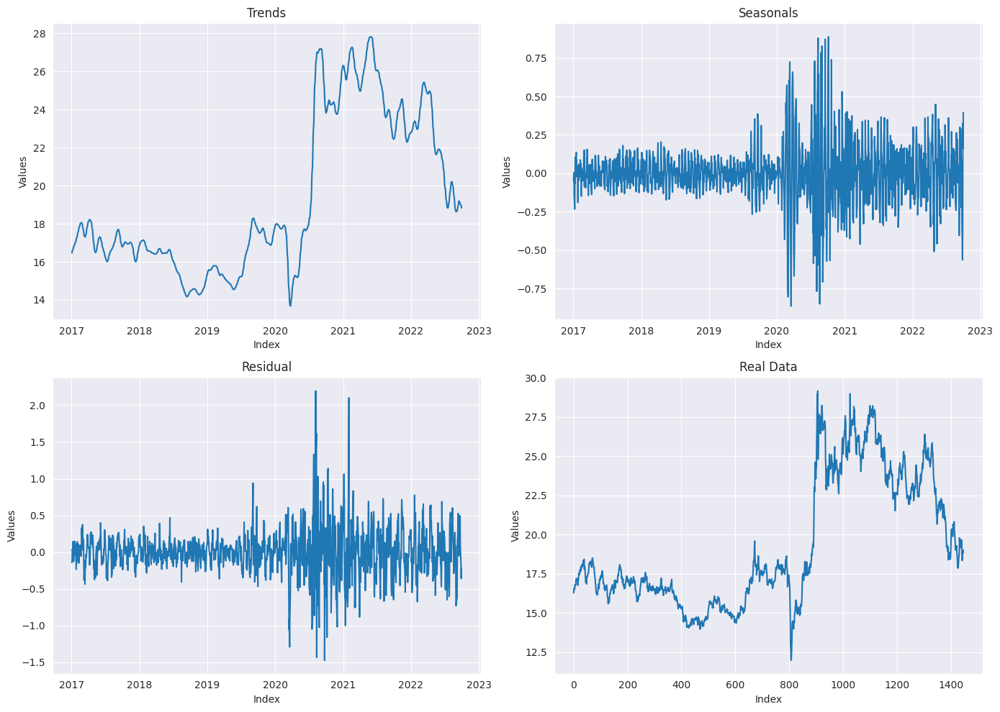

In [ ]:
sivler_b = makeBootstrap(dailyTest_s, 22, 3)
dailyTest_s2 = deepcopy(dailyTest_s)
dailyTest_s2 = dailyTest_s2.reset_index()

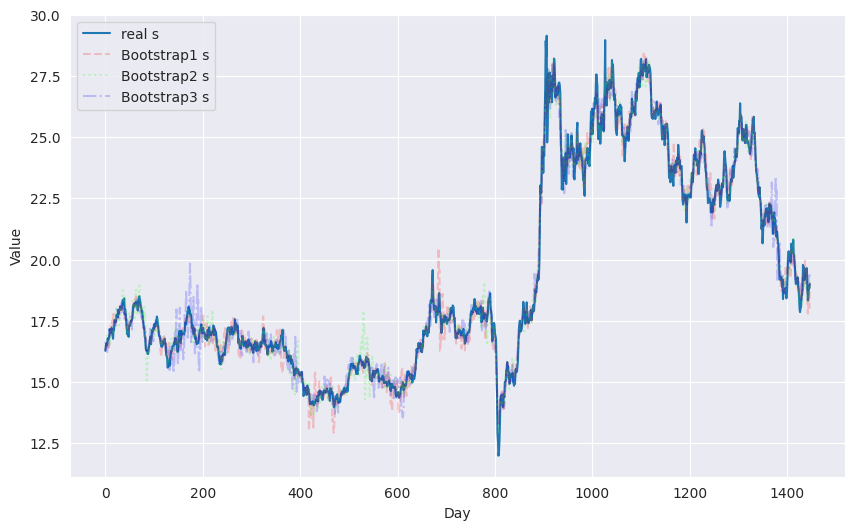

In [ ]:
from statsmodels.tsa.seasonal import STL
from copy import deepcopy
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))  # 創建一個新的圖片，並設定大小

for column in ['s']:
    plt.plot(dailyTest_s2[column], label=f'real {column}', linestyle='-')
    plt.plot(sivler_b[0][column], label=f'Bootstrap1 {column}', color=(1, 0, 0, 0.2), linestyle='--')
    plt.plot(sivler_b[1][column], label=f'Bootstrap2 {column}', color=(0, 1, 0, 0.2), linestyle=':')
    plt.plot(sivler_b[2][column], label=f'Bootstrap3 {column}', color=(0, 0, 1, 0.2), linestyle='-.')

plt.xlabel('Day')  # 設定 x 軸的標籤
plt.ylabel('Value')  # 設定 y 軸的標籤

plt.legend()  # 顯示圖例

plt.show()  # 顯示圖片

## gold

### 資料生成

In [ ]:
def construct_np_gold_data(thisData):
    x_train=[]
    y_train=[]
    x_test=[]
    y_test=[]
    x_final_test=[]
    y_final_test=[]
    x_bs_real=[]
    x_real_test=[]
    x_final_real=[]
    x_bs_train=[]
    y_bs_train=[]
    # 塞進去 x_train 和 y_train 裡面
    for round in range(len(thisData[0])):
        for j in range(len(thisData[0][round])):
            # train case & val case
            if j<60:
                if j>=37:
                    # thisData[0][round][j][-1] = 1
                    x_test.append(thisData[0][round][j])
                x_train.append(thisData[0][round][j])
                if j<37:
                    x_bs_train.append(thisData[0][round][j])
            # final test case
            else:
                x_final_test.append(thisData[0][round][j])

    for round in range(len(thisData[1])):
        for w in range(len(thisData[1][round])):
            # train case & val case
            if w<60:
                if w>=37:
                    y_test.append(thisData[1][round][w])
                y_train.append(thisData[1][round][w])
                if w<37:
                    y_bs_train.append(thisData[1][round][w])
            # final test case
            else:
                y_final_test.append(thisData[1][round][w])

    # Real Data
    for round in range(len(thisData[2])):
        for n in range(len(thisData[2][round])):
            if n<60:
                if n>=37:
                    x_real_test.append(thisData[2][round][n])
                else:
                    x_bs_real.append(thisData[2][round][n])
            elif n>=60:
                x_final_real.append(thisData[2][round][n])

    x_train = np.array(x_train)
    x_test = np.array(x_test)
    y_train = np.array(y_train)
    y_test = np.array(y_test)
    x_final_test = np.array(x_final_test)
    y_final_test = np.array(y_final_test)
    x_bs_real = np.array(x_bs_real)
    x_real_test = np.array(x_real_test)
    x_bs_train = np.array(x_bs_train)
    y_bs_train = np.array(y_bs_train)
    x_final_real = np.array(x_final_real)

    return [x_train, y_train, x_test, y_test, x_final_test, y_final_test, x_bs_real, x_real_test, x_final_real, x_bs_train, y_bs_train]

In [ ]:
trainW_g = construct_np_gold_data(test_g)
trainWReg_g = construct_np_gold_data(testReg_g)

In [ ]:
trainW_gR = construct_np_gold_data(test_noB_g)
trainWReg_gR = construct_np_gold_data(test_noBReg_g)

In [ ]:
x_train_wg = trainW_g[0]
y_train_wg = trainW_g[1]
x_val_wg = trainW_g[2]
y_val_wg = trainW_g[3]
x_bs_train_wgReal = trainW_g[6]
x_val_wgReal = trainW_g[7]
x_bs_train_wg = trainW_g[9]
y_bs_train_wg = trainW_g[10]

In [ ]:
x_train_wReg_g = trainWReg_g[0]
y_train_wReg_g = trainWReg_g[1]
x_val_wReg_g = trainWReg_g[2]
y_val_wReg_g = trainWReg_g[3]
x_final_wReg_g = trainWReg_g[4]
y_final_wReg_g = trainWReg_g[5]
x_bs_train_wReg_gReal = trainWReg_g[6]
x_val_wReg_gReal = trainWReg_g[7]
x_bs_train_wReg_g = trainWReg_g[9]
y_bs_train_wReg_g = trainWReg_g[10]

In [ ]:
x_train_wgR = trainW_gR[0]
y_train_wgR = trainW_gR[1]
x_val_wgR = trainW_gR[2]
y_val_wgR = trainW_gR[3]
x_final_wgR = trainW_gR[4]
y_final_wgR = trainW_gR[5]
x_final_real_wgR = trainW_gR[8]
x_bs_train_wgRReal = trainW_gR[6]
x_val_wgRReal = trainW_gR[7]
x_bs_train_wgR = trainW_gR[9]
y_bs_train_wgR = trainW_gR[10]

x_train_wReg_gR = trainWReg_gR[0]
y_train_wReg_gR = trainWReg_gR[1]
x_val_wReg_gR = trainWReg_gR[2]
y_val_wReg_gR = trainWReg_gR[3]
x_final_wReg_gR = trainWReg_gR[4]
y_final_wReg_gR = trainWReg_gR[5]
x_final_real_wReg_gR = trainWReg_gR[8]
x_bs_train_wReg_gR = trainWReg_gR[9]
y_bs_train_wReg_gR = trainWReg_gR[10]

In [ ]:
x_final_real_wgR

array([[1882.9399 , 1886.08   , 1886.36   , 1887.38   , 1909.8752 ,
        1912.52   , 1913.38   , 1976.05886, 1970.88   , 1968.31896],
       [1929.81006, 1925.52   , 1926.54   , 1929.3    , 1940.1297 ,
        1940.72   , 1941.14   , 1930.15718, 1930.78   , 1944.70546],
       [1967.3968 , 1968.56   , 1969.38   , 1972.12   , 1914.1181 ,
        1911.28   , 1911.52   , 1880.44274, 1879.12   , 1860.79626],
       [1817.38866, 1815.76   , 1816.32   , 1819.38   , 1851.8696 ,
        1848.42   , 1848.56   , 1850.70476, 1850.24   , 1848.92048],
       [1837.5842 , 1834.     , 1835.06   , 1838.06   , 1831.58084,
        1831.34   , 1832.08   , 1815.32018, 1811.02   , 1743.55208],
       [1717.25566, 1714.72   , 1715.98   , 1719.92   , 1714.2462 ,
        1713.66   , 1714.16   , 1748.66712, 1743.8    , 1775.67956],
       [1791.2668 , 1791.86   , 1794.3    , 1798.94   , 1755.66426,
        1754.08   , 1755.22   , 1746.33678, 1745.     , 1708.58758],
       [1713.32854, 1714.52   , 1717.1   

### x & y 的敘述型統計

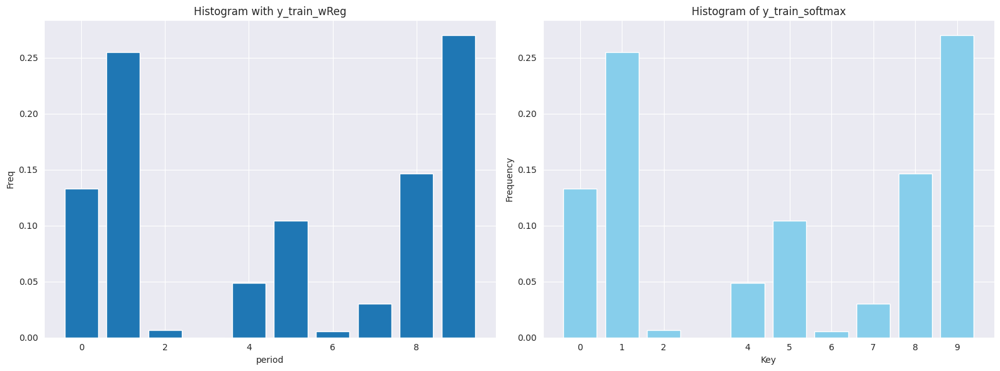

In [ ]:
#y_train
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_train_wReg 每一欄 1 的出現頻率
y_reg_freq_g = np.mean(y_train_wReg_g == 1, axis=0)
x_reg_freq_g = range(len(y_reg_freq_g))  # 創建 x 軸的索引

# 計算 y_train_w 的最大值索引出現次數
count_g = dict()
for i in range(len(y_train_wg)):
    max_index = np.argmax(y_train_wg[i])
    if max_index in count_g:
        count_g[max_index] += 1
    else:
        count_g[max_index] = 1

keys = list(count_g.keys())
values = list(count_g.values())
values_n = [i/len(y_train_wg) for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq_g, y_reg_freq_g)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_train_wReg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of y_train_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.show()


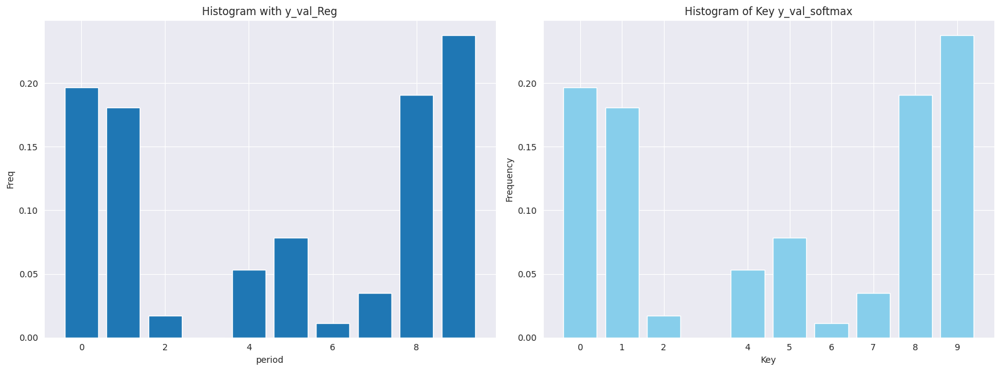

In [ ]:
#y_val
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_train_wReg 每一欄 1 的出現頻率
y_reg_freq_g = np.mean(y_val_wReg_g == 1, axis=0)
x_reg_freq_g = range(len(y_reg_freq_g))  # 創建 x 軸的索引

# 計算 y_train_w 的最大值索引出現次數
count_gg = dict()
for i in range(len(y_val_wg)):
    max_index = np.argmax(y_val_wg[i])
    if max_index in count_gg:
        count_gg[max_index] += 1
    else:
        count_gg[max_index] = 1

keys = list(count_gg.keys())
values = list(count_gg.values())
values_n = [i/len(y_val_wg) for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq_g, y_reg_freq_g)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_val_Reg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of Key y_val_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.preprocessing import StandardScaler

x_bs_train_wReg_g_2 = pd.DataFrame(x_bs_train_wReg_g)
x_bs_train_wReg_g_2.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,...,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000
mean,1341.178108,1340.848088,1342.519743,1345.306510,1354.943164,1355.608911,1356.296443,1356.954417,1357.520127,1358.253324,...,1362.251918,1362.990249,1363.793101,1364.386961,1365.061953,1365.784722,1366.519787,1367.154839,1367.907408,1368.720267
std,116.850913,117.779061,118.127952,118.628140,131.852602,133.151523,133.999355,135.148967,136.273452,137.354896,...,144.829102,146.082007,147.481078,148.782026,150.444958,151.654804,153.128881,154.524404,155.950142,157.505487
min,1172.006706,1170.624119,1171.236620,1173.491745,1164.732514,1162.943391,1163.524389,1157.181746,1150.757164,1146.763055,...,1130.449150,1126.525527,1129.684730,1123.985963,1122.259430,1123.823958,1116.699348,1110.499522,1106.645141,1109.748591
25%,1260.845649,1261.530503,1262.960984,1264.928840,1267.119843,1265.551886,1264.465578,1263.448215,1262.656456,1261.997305,...,1260.155910,1259.352799,1260.007456,1259.974218,1258.291342,1259.105782,1258.699891,1258.502113,1258.412457,1257.330217
50%,1304.273537,1302.943153,1304.619388,1307.308732,1311.887866,1311.508248,1311.998864,1312.520542,1312.570262,1314.162233,...,1320.598482,1320.475220,1321.177899,1322.474698,1323.579186,1325.480205,1326.395992,1327.105058,1327.505975,1328.274458
75%,1415.374208,1412.767457,1415.598812,1419.025182,1461.713118,1463.048156,1462.737668,1461.276393,1459.767850,1461.912214,...,1472.667764,1472.650409,1474.937246,1475.685205,1475.817481,1476.907455,1477.397167,1475.835435,1478.163656,1476.452599
max,1634.725902,1633.797102,1636.242357,1641.864207,1746.183049,1752.873069,1761.065651,1769.533134,1778.519530,1780.875651,...,1828.567606,1830.990029,1840.841550,1849.367467,1858.406632,1858.836785,1870.870048,1880.024051,1882.514642,1892.643387


In [ ]:
x_bs_train_wReg_gR = pd.DataFrame(x_bs_train_wReg_gR)
x_bs_train_wReg_gR.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,...,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000
mean,1341.894781,1341.899459,1343.626486,1346.406486,1354.971188,1355.748236,1356.519332,1357.441757,1357.701191,1358.627467,...,1362.516820,1363.466537,1364.317280,1364.886139,1365.408348,1366.476212,1367.115004,1367.536710,1368.510270,1369.840794
std,119.962718,121.556572,121.851390,122.368780,134.275618,135.024142,136.403219,138.738529,139.932557,140.980859,...,149.467302,150.651392,152.221932,152.974704,154.306985,156.144003,158.573362,160.359343,161.661230,163.218357
min,1194.294000,1193.800000,1194.180000,1196.460000,1181.165699,1180.589517,1179.103669,1175.342887,1175.447473,1175.051386,...,1162.962362,1162.570482,1158.077165,1156.207260,1155.643252,1154.188800,1150.507485,1150.609862,1150.222144,1145.776554
25%,1259.536000,1262.180000,1263.280000,1264.900000,1268.821912,1263.862526,1264.543622,1265.427128,1261.318516,1261.978961,...,1262.550464,1262.217118,1261.639406,1258.617524,1258.015792,1261.495879,1259.146721,1263.913530,1265.372290,1266.303491
50%,1302.280500,1301.460000,1302.840000,1305.300000,1319.481274,1318.142005,1317.934824,1312.834353,1312.827958,1315.206173,...,1322.644420,1321.985086,1324.397230,1327.963582,1323.461069,1321.602832,1318.511075,1324.501413,1324.779232,1326.116413
75%,1402.990000,1401.120000,1403.960000,1407.280000,1458.438602,1453.994166,1452.370991,1447.259961,1445.675980,1452.179493,...,1475.287570,1481.924294,1483.987106,1483.394075,1480.948414,1484.645219,1480.848391,1477.511731,1479.838501,1474.447953
max,1632.353660,1632.680000,1634.020000,1636.860000,1744.997021,1743.422087,1748.747970,1766.789247,1774.816928,1777.596311,...,1823.150516,1826.005590,1842.540575,1841.334179,1839.672297,1845.292210,1864.329502,1872.800373,1875.733199,1892.718481


In [ ]:
x_val_wReg_g_2 = pd.DataFrame(x_val_wReg_g)
x_val_wReg_g_2.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,...,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000
mean,1816.488483,1815.963780,1817.017960,1819.678417,1825.391242,1825.943112,1826.534622,1826.862635,1827.581605,1828.052990,...,1831.492752,1831.988116,1832.668316,1833.238779,1833.773382,1834.413003,1834.813835,1835.621881,1836.135161,1836.868359
std,68.413810,67.824588,68.065075,67.849140,72.515024,74.084417,74.922445,76.186224,77.512531,79.523587,...,90.571445,92.953118,95.040155,97.850057,100.120988,101.698857,103.670383,105.833352,108.420330,110.800094
min,1680.542294,1682.523137,1684.789742,1693.954625,1675.642382,1664.543414,1657.553597,1656.736411,1651.261404,1642.192586,...,1601.151311,1592.357700,1587.186340,1575.485560,1565.050002,1558.477982,1557.709641,1552.561887,1544.035132,1539.020704
25%,1759.856454,1760.738666,1761.437767,1764.615273,1766.007444,1761.719945,1759.156846,1760.674104,1760.985189,1763.338912,...,1771.029022,1771.451511,1772.781392,1771.753506,1771.080660,1771.153188,1771.339080,1772.996076,1771.748706,1772.769060
50%,1809.201236,1809.676092,1810.324901,1811.472115,1821.234853,1820.601057,1821.722250,1821.540938,1821.087558,1822.771334,...,1824.133525,1825.621226,1827.179106,1830.633221,1831.323433,1832.858209,1833.019362,1833.368855,1834.892287,1835.555409
75%,1872.146228,1870.918075,1871.928439,1874.448933,1883.598351,1884.969961,1885.794298,1886.583225,1889.038828,1891.419852,...,1901.070225,1902.073171,1902.234111,1904.098487,1908.402517,1908.854723,1908.927958,1911.722644,1911.758449,1910.875088
max,1976.731725,1976.587837,1978.511375,1981.943246,2014.181083,2013.821924,2014.773806,2021.468867,2020.014703,2029.166311,...,2050.865272,2060.156647,2069.962296,2077.408511,2081.680463,2081.638870,2086.567542,2098.292872,2109.514747,2113.287305


In [ ]:
x_val_wReg_gR = pd.DataFrame(x_val_wReg_gR)
x_val_wReg_gR.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,...,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000
mean,1817.377584,1816.836522,1817.672174,1820.501739,1826.255758,1826.751669,1827.575982,1826.712198,1827.134084,1828.708364,...,1831.448933,1832.666084,1833.591454,1834.831534,1835.506042,1836.291126,1835.500262,1836.014116,1837.519907,1838.204634
std,71.553659,71.265097,71.674867,71.311122,78.253328,79.268338,81.330840,84.056906,85.813116,86.973880,...,100.554494,102.340811,103.169352,106.782714,108.744443,111.258958,114.470281,117.129005,119.153014,120.064862
min,1708.984380,1707.220000,1707.560000,1709.120000,1682.703047,1676.941285,1674.211533,1661.820928,1655.118722,1657.805781,...,1611.121590,1613.737220,1609.911870,1594.431308,1588.971798,1586.385244,1574.644630,1568.294010,1570.840110,1567.116447
25%,1760.370050,1761.430000,1762.540000,1766.170000,1766.056134,1769.513799,1768.735715,1767.909284,1771.936101,1776.212289,...,1772.663410,1776.709539,1778.812079,1779.457893,1778.941498,1778.765232,1773.984370,1771.835311,1775.367088,1776.820371
50%,1814.348460,1814.300000,1814.980000,1816.000000,1820.332139,1821.109658,1820.078373,1816.501486,1825.264369,1824.637286,...,1833.745757,1828.686627,1831.610947,1831.973460,1842.698512,1844.591099,1850.840785,1851.742590,1843.206876,1846.154415
75%,1862.835670,1858.640000,1860.090000,1862.250000,1892.731135,1895.275226,1892.217098,1887.510204,1888.032874,1885.930277,...,1888.526004,1891.794273,1899.011185,1902.345073,1901.889756,1905.029048,1903.639024,1905.234733,1909.942877,1914.206042
max,1962.561740,1967.360000,1969.460000,1972.480000,1992.222407,1996.017627,2002.919325,2004.511371,2012.059298,2014.000714,...,2033.054942,2035.016617,2033.172085,2034.016632,2037.891470,2044.937956,2046.563402,2054.269674,2056.251819,2054.388040


### bootstrap 後資料與原始資料的比較

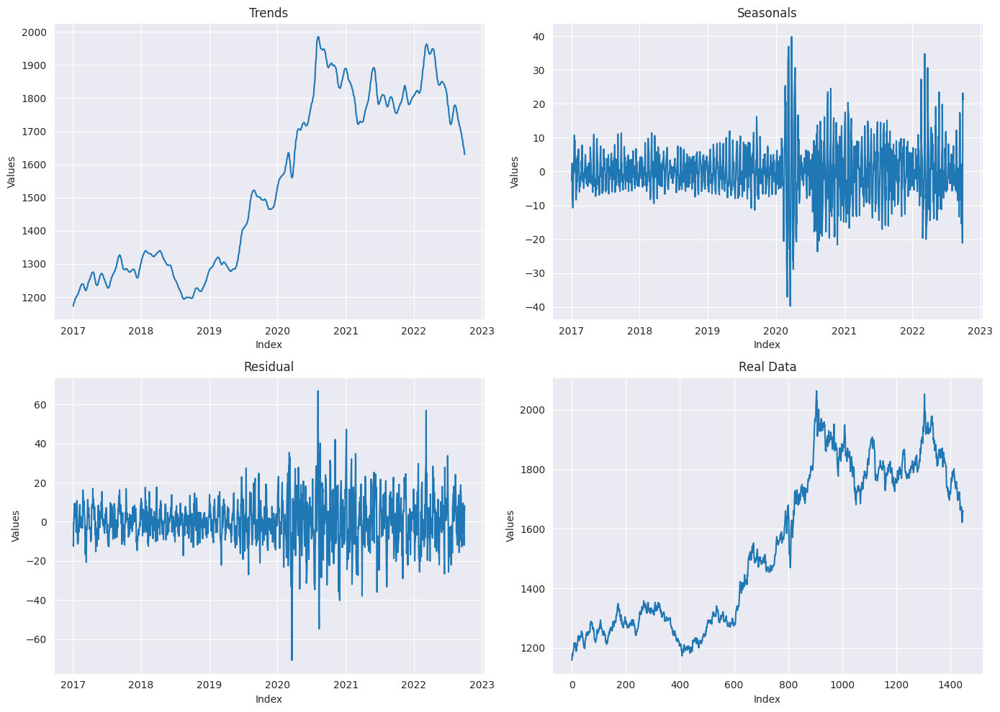

In [ ]:
gold_b = makeBootstrap(dailyTest_g, 22, 3)
dailyTest_g2 = deepcopy(dailyTest_g)
dailyTest_g2 = dailyTest_g2.reset_index()

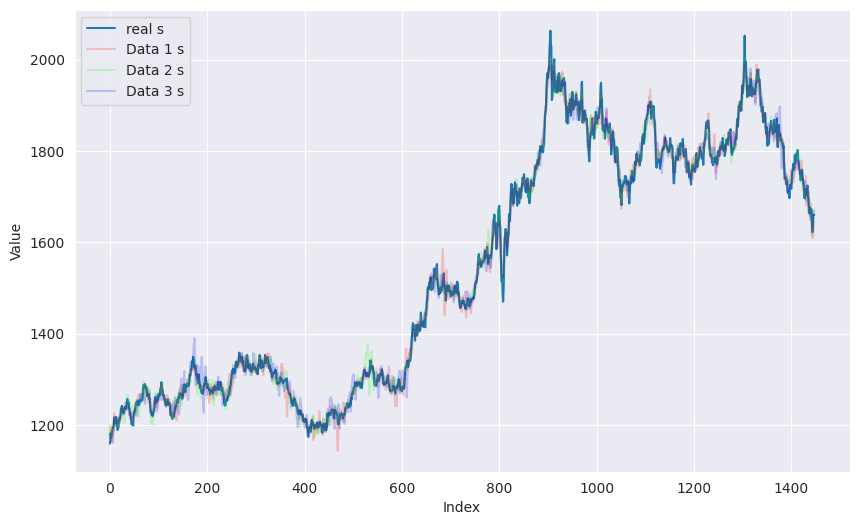

In [ ]:
from statsmodels.tsa.seasonal import STL
from copy import deepcopy
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))  # 創建一個新的圖片，並設定大小

for column in ['s']:
    plt.plot(dailyTest_g2[column], label=f'real {column}')
    plt.plot(gold_b[0][column], label=f'Data 1 {column}', color=(1, 0, 0, 0.2))
    plt.plot(gold_b[1][column], label=f'Data 2 {column}', color=(0, 1, 0, 0.2))
    plt.plot(gold_b[2][column], label=f'Data 3 {column}', color=(0, 0, 1, 0.2))

plt.xlabel('Index')  # 設定 x 軸的標籤
plt.ylabel('Value')  # 設定 y 軸的標籤

plt.legend()  # 顯示圖例

plt.show()  # 顯示圖片

## copper

### 生成資料

In [ ]:
def construct_np_copper_data(thisData):
    x_train=[]
    y_train=[]
    x_test=[]
    y_test=[]
    x_final_test=[]
    y_final_test=[]
    x_bs_real=[]
    x_real_test=[]
    x_final_real=[]
    x_bs_train=[]
    y_bs_train=[]
    # 塞進去 x_train 和 y_train 裡面
    for round in range(len(thisData[0])):
        for j in range(len(thisData[0][round])):
            # train case & val case
            if j<60:
                if j>=45:
                    # thisData[0][round][j][-1] = 1
                    x_test.append(thisData[0][round][j])
                x_train.append(thisData[0][round][j])
                if j<45:
                    x_bs_train.append(thisData[0][round][j])
            # final test case
            else:
                x_final_test.append(thisData[0][round][j])

    for round in range(len(thisData[1])):
        for w in range(len(thisData[1][round])):
            # train case & val case
            if w<60:
                if w>=45:
                    y_test.append(thisData[1][round][w])
                y_train.append(thisData[1][round][w])
                if w<45:
                    y_bs_train.append(thisData[1][round][w])
            # final test case
            else:
                y_final_test.append(thisData[1][round][w])

    # Real Data
    for round in range(len(thisData[2])):
        for n in range(len(thisData[2][round])):
            if n<60:
                if n>=45:
                    x_real_test.append(thisData[2][round][n])
                else:
                    x_bs_real.append(thisData[2][round][n])
            elif n>=60:
                x_final_real.append(thisData[2][round][n])

    x_train = np.array(x_train)
    x_test = np.array(x_test)
    y_train = np.array(y_train)
    y_test = np.array(y_test)
    x_final_test = np.array(x_final_test)
    y_final_test = np.array(y_final_test)
    x_bs_real = np.array(x_bs_real)
    x_real_test = np.array(x_real_test)
    x_bs_train = np.array(x_bs_train)
    y_bs_train = np.array(y_bs_train)
    x_final_real = np.array(x_final_real)

    return [x_train, y_train, x_test, y_test, x_final_test, y_final_test, x_bs_real, x_real_test, x_final_real, x_bs_train, y_bs_train]

In [ ]:
trainW_c = construct_np_copper_data(test_c)
trainWReg_c = construct_np_copper_data(testReg_c)

In [ ]:
trainW_cR = construct_np_copper_data(test_noB_c)
trainWReg_cR = construct_np_copper_data(test_noBReg_c)

In [ ]:
x_train_wc = trainW_c[0]
y_train_wc = trainW_c[1]
x_val_wc = trainW_c[2]
y_val_wc = trainW_c[3]
x_bs_train_wcReal = trainW_c[6]
x_val_wcReal = trainW_c[7]
x_bs_train_wc = trainW_c[9]
y_bs_train_wc = trainW_c[10]

x_train_wReg_c = trainWReg_c[0]
y_train_wReg_c = trainWReg_c[1]
x_val_wReg_c = trainWReg_c[2]
y_val_wReg_c = trainWReg_c[3]
x_bs_train_wReg_c = trainWReg_c[9]
y_bs_train_wReg_c = trainWReg_c[10]

In [ ]:
x_train_wcR = trainW_cR[0]
y_train_wcR = trainW_cR[1]
x_val_wcR = trainW_cR[2]
y_val_wcR = trainW_cR[3]
x_final_wcR = trainW_cR[4]
y_final_wcR = trainW_cR[5]
x_final_real_wcR = trainW_cR[8]
x_bs_train_wcRReal = trainW_cR[6]
x_val_wcRReal = trainW_cR[7]
x_bs_train_wcR = trainW_cR[9]
y_bs_train_wcR = trainW_cR[10]

x_train_wReg_cR = trainWReg_cR[0]
y_train_wReg_cR = trainWReg_cR[1]
x_val_wReg_cR = trainWReg_cR[2]
y_val_wReg_cR = trainWReg_cR[3]
x_final_wReg_cR = trainWReg_cR[4]
y_final_wReg_cR = trainWReg_cR[5]
x_final_real_wReg_cR = trainWReg_cR[8]
x_bs_train_wReg_cR = trainWReg_cR[9]
y_bs_train_wReg_cR = trainWReg_cR[10]

### x_train/x_test/y_train/y_test[還未預測過的] 的敘述統計 (copper)

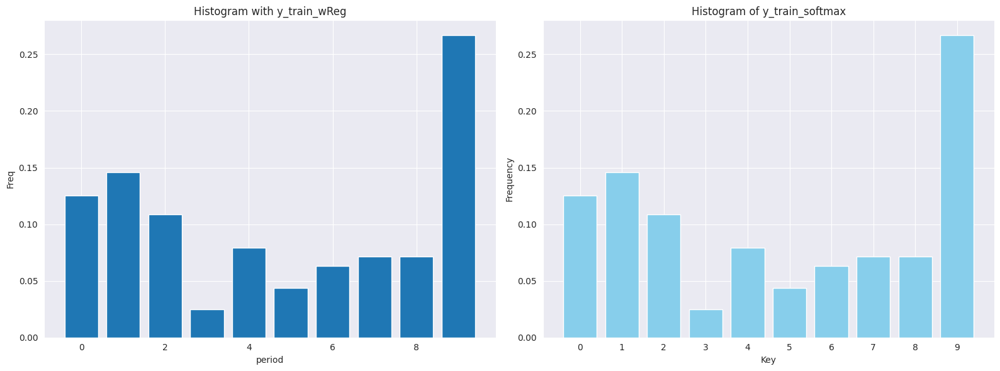

In [ ]:
#y_train
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_train_wReg 每一欄 1 的出現頻率
y_reg_freq = np.mean(y_bs_train_wReg_c == 1, axis=0)
x_reg_freq = range(len(y_reg_freq))  # 創建 x 軸的索引

# 計算 y_train_w 的最大值索引出現次數
count = dict()
for i in range(len(y_bs_train_wc)):
    max_index = np.argmax(y_bs_train_wc[i])
    if max_index in count:
        count[max_index] += 1
    else:
        count[max_index] = 1

keys = list(count.keys())
values = list(count.values())
values_n = [i/len(y_bs_train_wc) for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq, y_reg_freq)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_train_wReg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of y_train_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.show()


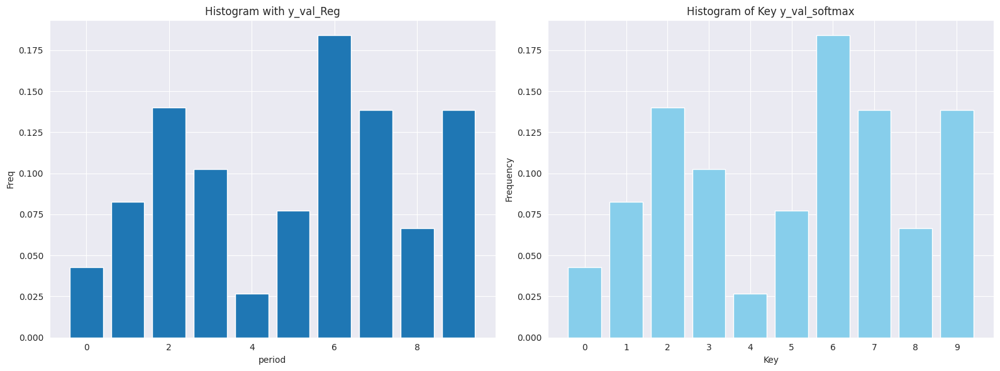

In [ ]:
#y_val
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_train_wReg 每一欄 1 的出現頻率
y_reg_freq = np.mean(y_val_wReg_c == 1, axis=0)
x_reg_freq = range(len(y_reg_freq))  # 創建 x 軸的索引

# 計算 y_train_w 的最大值索引出現次數
count = dict()
for i in range(len(y_val_wc)):
    max_index = np.argmax(y_val_wc[i])
    if max_index in count:
        count[max_index] += 1
    else:
        count[max_index] = 1

keys = list(count.keys())
values = list(count.values())
values_n = [i/len(y_val_wc) for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq, y_reg_freq)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_val_Reg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of Key y_val_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.show()


In [ ]:
x_bs_train_wReg_c_2 = pd.DataFrame(x_bs_train_wReg_c)
x_bs_train_wReg_c_2.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,2250.000000,2250.000000,2250.000000,2250.000000,2250.000000,2250.000000,2250.000000,2250.000000,2250.000000,2250.000000,...,2250.000000,2250.000000,2250.000000,2250.000000,2250.000000,2250.000000,2250.000000,2250.000000,2250.000000,2250.000000
mean,2.814724,2.814532,2.816098,2.821362,2.841920,2.843217,2.844439,2.845434,2.847074,2.848595,...,2.856973,2.858573,2.860092,2.861731,2.863083,2.864565,2.865843,2.867662,2.869309,2.870754
std,0.233674,0.234859,0.237869,0.240108,0.272303,0.275596,0.278818,0.282074,0.285533,0.289048,...,0.314497,0.318679,0.322801,0.329365,0.333919,0.338556,0.342892,0.347468,0.352157,0.356756
min,2.184051,2.172480,2.157710,2.161591,2.122118,2.112733,2.089975,2.071566,2.063023,2.048374,...,1.964534,1.946552,1.935995,1.918329,1.911393,1.887359,1.870735,1.866879,1.849791,1.839759
25%,2.654905,2.654348,2.656490,2.660363,2.652856,2.647055,2.645583,2.640938,2.637819,2.633587,...,2.615113,2.611703,2.607290,2.606234,2.601809,2.603978,2.605294,2.606278,2.600605,2.601283
50%,2.771892,2.771801,2.772391,2.779164,2.800130,2.796522,2.800168,2.800647,2.808368,2.821255,...,2.866193,2.875097,2.874983,2.886882,2.885261,2.884223,2.884699,2.887205,2.882369,2.884589
75%,3.017817,3.019109,3.022702,3.030985,3.044525,3.045371,3.045276,3.047288,3.046857,3.049655,...,3.079748,3.084819,3.088653,3.092078,3.095591,3.095986,3.096833,3.098473,3.102110,3.106063
max,3.317325,3.318676,3.328240,3.337144,3.741542,3.758033,3.773842,3.787111,3.804213,3.831763,...,3.959846,3.988523,4.013488,4.048761,4.071810,4.088939,4.100540,4.121847,4.151696,4.175013


In [ ]:
x_bs_train_wReg_cR = pd.DataFrame(x_bs_train_wReg_cR)
x_bs_train_wReg_cR.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,...,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000
mean,2.809844,2.809778,2.811467,2.816844,2.837562,2.839831,2.840603,2.841218,2.842658,2.843834,...,2.851539,2.852877,2.854806,2.856374,2.858150,2.858804,2.859688,2.861337,2.862836,2.863035
std,0.238786,0.239287,0.241965,0.244731,0.283181,0.289526,0.293671,0.297058,0.300175,0.302731,...,0.334258,0.337447,0.341511,0.351505,0.357791,0.363164,0.368170,0.372383,0.376041,0.381968
min,2.222000,2.222000,2.206000,2.210000,2.106209,2.097387,2.092806,2.071247,2.069162,2.057595,...,1.968915,1.957908,1.941705,1.907068,1.899080,1.894932,1.875412,1.873524,1.863050,1.847632
25%,2.658800,2.658000,2.654000,2.660000,2.645240,2.636082,2.637901,2.635553,2.633670,2.620915,...,2.601985,2.593147,2.600772,2.581481,2.586316,2.587604,2.581503,2.575970,2.567983,2.575107
50%,2.777400,2.778000,2.778000,2.788000,2.764693,2.759642,2.767897,2.768118,2.770460,2.766711,...,2.807955,2.835528,2.832555,2.883186,2.858169,2.875695,2.871168,2.878775,2.888228,2.886007
75%,3.004500,3.006000,3.012000,3.022000,3.054860,3.049565,3.058227,3.043600,3.043683,3.049348,...,3.064771,3.085679,3.084867,3.117917,3.109259,3.103208,3.083897,3.086005,3.095583,3.106240
max,3.244400,3.246000,3.256000,3.266000,3.646591,3.682581,3.709802,3.741228,3.757098,3.757771,...,3.891264,3.891961,3.896700,3.911681,3.950288,3.979487,4.013198,4.030221,4.030944,4.035851


In [ ]:
x_val_wReg_c_2 = pd.DataFrame(x_val_wReg_c)
x_val_wReg_c_2.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000,...,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000
mean,4.225857,4.226119,4.222953,4.221654,4.307686,4.311825,4.315191,4.317815,4.320934,4.325178,...,4.348891,4.353414,4.359203,4.363379,4.367841,4.371652,4.374780,4.377905,4.382629,4.387400
std,0.295412,0.295361,0.295353,0.293961,0.268101,0.271085,0.270471,0.272754,0.275219,0.278263,...,0.300445,0.305270,0.310639,0.316901,0.323066,0.325282,0.331949,0.336525,0.342944,0.349618
min,3.496522,3.496483,3.500413,3.502270,3.595288,3.601927,3.604209,3.585168,3.578766,3.554822,...,3.568952,3.545074,3.549486,3.602244,3.593636,3.584468,3.565532,3.559165,3.535352,3.539752
25%,4.111112,4.111299,4.107072,4.104234,4.187417,4.192653,4.202994,4.198266,4.202099,4.209263,...,4.203376,4.209034,4.211758,4.210337,4.209322,4.208434,4.208432,4.205551,4.202311,4.199918
50%,4.311334,4.312254,4.312398,4.311881,4.309077,4.303485,4.303697,4.300688,4.296688,4.298010,...,4.281083,4.279168,4.278180,4.272921,4.273793,4.279448,4.281334,4.284038,4.288661,4.296849
75%,4.411181,4.412477,4.410435,4.407917,4.466369,4.469556,4.467940,4.477381,4.469775,4.483365,...,4.509131,4.512899,4.518175,4.521510,4.535213,4.533564,4.536276,4.538852,4.545817,4.552782
max,4.812940,4.812462,4.798743,4.793619,4.840185,4.902432,4.917155,4.944325,4.967332,5.006938,...,5.179652,5.220951,5.224896,5.262799,5.324822,5.340813,5.372708,5.401048,5.444112,5.448226


In [ ]:
x_val_wReg_cR = pd.DataFrame(x_val_wReg_cR)
x_val_wReg_cR.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,...,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000
mean,4.222420,4.222667,4.219333,4.218133,4.303122,4.309590,4.311150,4.311034,4.314464,4.322134,...,4.341484,4.349408,4.358379,4.360752,4.363982,4.365609,4.365721,4.369688,4.377877,4.386912
std,0.300284,0.299806,0.301718,0.299765,0.286683,0.295395,0.292009,0.290463,0.296765,0.306116,...,0.332168,0.344247,0.345051,0.351402,0.367766,0.365619,0.367623,0.379702,0.393943,0.394568
min,3.574100,3.574000,3.574000,3.578000,3.654496,3.659365,3.664607,3.678107,3.689458,3.684346,...,3.721948,3.716790,3.712428,3.719142,3.724097,3.729432,3.743171,3.754723,3.749520,3.745119
25%,4.162100,4.162000,4.154000,4.153000,4.187744,4.188668,4.193721,4.196909,4.180440,4.175237,...,4.187485,4.182218,4.183389,4.178701,4.191288,4.201809,4.210890,4.179710,4.184352,4.175367
50%,4.313300,4.314000,4.314000,4.314000,4.260229,4.273996,4.279620,4.263844,4.259029,4.266873,...,4.222475,4.224575,4.240853,4.248183,4.229317,4.245834,4.219387,4.256200,4.247787,4.266350
75%,4.373100,4.373000,4.372000,4.367000,4.472214,4.465352,4.445077,4.438817,4.433991,4.452983,...,4.457524,4.479310,4.503832,4.503523,4.512879,4.486735,4.483206,4.483397,4.505799,4.530466
max,4.715800,4.716000,4.710000,4.704000,4.860988,4.924934,4.930289,4.945652,4.985591,5.054382,...,5.207063,5.278909,5.269956,5.302452,5.372206,5.378048,5.394806,5.438372,5.513410,5.504059


### bootstrap 後的資料與原始資料

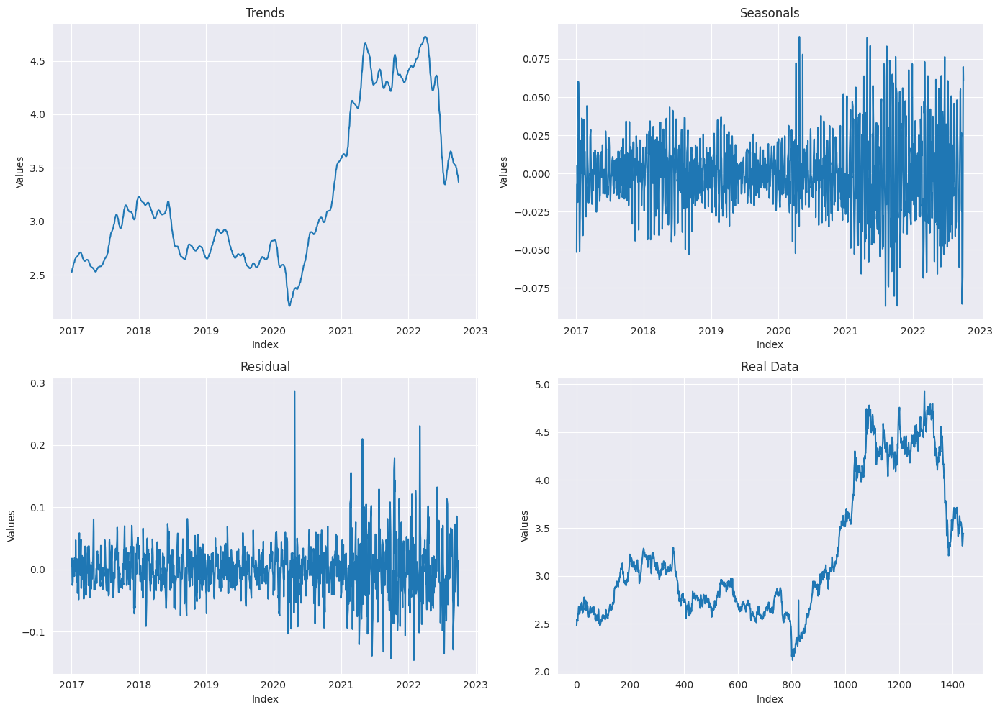

In [ ]:
copper_b = makeBootstrap(dailyTest, 22, 3)
dailyTest_c2 = deepcopy(dailyTest)
dailyTest_c2 = dailyTest_c2.reset_index()

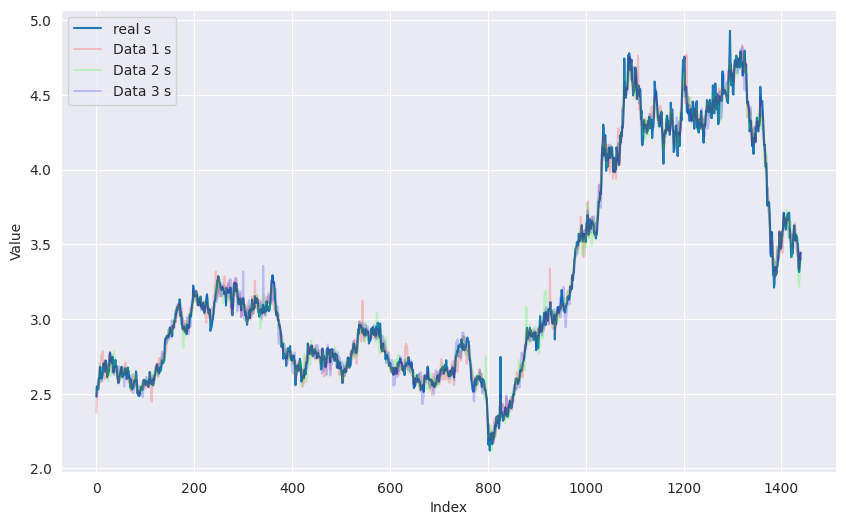

In [ ]:
from statsmodels.tsa.seasonal import STL
from copy import deepcopy
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))  # 創建一個新的圖片，並設定大小

for column in ['s']:
    plt.plot(dailyTest_c2[column], label=f'real {column}')
    plt.plot(copper_b[0][column], label=f'Data 1 {column}', color=(1, 0, 0, 0.2))
    plt.plot(copper_b[1][column], label=f'Data 2 {column}', color=(0, 1, 0, 0.2))
    plt.plot(copper_b[2][column], label=f'Data 3 {column}', color=(0, 0, 1, 0.2))

plt.xlabel('Index')  # 設定 x 軸的標籤
plt.ylabel('Value')  # 設定 y 軸的標籤

plt.legend()  # 顯示圖例

plt.show()  # 顯示圖片

## soy

### 資料生成

In [ ]:
def construct_np_soy_data(thisData):
    x_train=[]
    y_train=[]
    x_test=[]
    y_test=[]
    x_final_test=[]
    y_final_test=[]
    x_bs_real=[]
    x_real_test=[]
    x_final_real=[]
    x_bs_train=[]
    y_bs_train=[]
    # 塞進去 x_train 和 y_train 裡面
    for round in range(len(thisData[0])):
        for j in range(len(thisData[0][round])):
            # train case & val case
            if j<60:
                if j>=43:
                    # thisData[0][round][j][-1] = 1
                    x_test.append(thisData[0][round][j])
                x_train.append(thisData[0][round][j])
                if j<43:
                    x_bs_train.append(thisData[0][round][j])
            # final test case
            else:
                x_final_test.append(thisData[0][round][j])

    for round in range(len(thisData[1])):
        for w in range(len(thisData[1][round])):
            # train case & val case
            if w<60:
                if w>=43:
                    y_test.append(thisData[1][round][w])
                y_train.append(thisData[1][round][w])
                if w<43:
                    y_bs_train.append(thisData[1][round][w])
            # final test case
            else:
                y_final_test.append(thisData[1][round][w])

    # Real Data
    for round in range(len(thisData[2])):
        for n in range(len(thisData[2][round])):
            if n<60:
                if n>=43:
                    x_real_test.append(thisData[2][round][n])
                else:
                    x_bs_real.append(thisData[2][round][n])
            elif n>=60:
                x_final_real.append(thisData[2][round][n])

    x_train = np.array(x_train)
    x_test = np.array(x_test)
    y_train = np.array(y_train)
    y_test = np.array(y_test)
    x_final_test = np.array(x_final_test)
    y_final_test = np.array(y_final_test)
    x_bs_real = np.array(x_bs_real)
    x_real_test = np.array(x_real_test)
    x_bs_train = np.array(x_bs_train)
    y_bs_train = np.array(y_bs_train)
    x_final_real = np.array(x_final_real)

    return [x_train, y_train, x_test, y_test, x_final_test, y_final_test, x_bs_real, x_real_test, x_final_real, x_bs_train, y_bs_train]

In [ ]:
trainW_soR = construct_np_soy_data(test_noB_so)
trainWReg_soR = construct_np_soy_data(test_noBReg_so)

x_train_wsoR = trainW_soR[0]
y_train_wsoR = trainW_soR[1]
x_val_wsoR = trainW_soR[2]
y_val_wsoR = trainW_soR[3]
x_final_wsoR = trainW_soR[4]
y_final_wsoR = trainW_soR[5]
x_final_real_wsoR = trainW_soR[8]
x_bs_train_wsoRReal = trainW_soR[6]
x_val_wsoRReal = trainW_soR[7]
x_bs_train_wsoR = trainW_soR[9]
y_bs_train_wsoR = trainW_soR[10]

x_train_wReg_soR = trainWReg_soR[0]
y_train_wReg_soR = trainWReg_soR[1]
x_val_wReg_soR = trainWReg_soR[2]
y_val_wReg_soR = trainWReg_soR[3]
x_final_wReg_soR = trainWReg_soR[4]
y_final_wReg_soR = trainWReg_soR[5]
x_final_real_wReg_soR = trainWReg_soR[8]
x_bs_train_wReg_soR = trainWReg_soR[9]
y_bs_train_wReg_soR = trainWReg_soR[10]

In [ ]:
trainW_so = construct_np_soy_data(test_so)
trainWReg_so = construct_np_soy_data(testReg_so)

In [ ]:
x_train_wso = trainW_so[0]
y_train_wso = trainW_so[1]
x_val_wso = trainW_so[2]
y_val_wso = trainW_so[3]
x_bs_train_wsoReal= trainW_so[6]
x_val_wsoReal = trainW_so[7]
x_bs_train_wso = trainW_so[9]
y_bs_train_wso = trainW_so[10]

In [ ]:
x_train_wReg_so = trainWReg_so[0]
y_train_wReg_so = trainWReg_so[1]
x_val_wReg_so = trainWReg_so[2]
y_val_wReg_so = trainWReg_so[3]
x_bs_train_wReg_so = trainWReg_so[9]
y_bs_train_wReg_so = trainWReg_so[10]

In [ ]:
x_bs_train_wso

array([[ 9.13018037,  9.4000135 ,  9.43990041, ...,  8.81572734,
         8.78629282,  8.79867372],
       [ 8.9551944 ,  9.11951408,  9.26369202, ..., 10.40011036,
        10.47731864, 10.49873056],
       [ 9.58714765,  9.88433358,  9.927016  , ...,  8.61444278,
         8.56149422,  8.58121471],
       ...,
       [ 9.32715282,  9.53962635,  9.53960391, ..., 11.02956888,
        11.05335511, 11.09749712],
       [10.09101794, 10.34083527, 10.37108482, ..., 11.29385081,
        11.3074075 , 11.36976288],
       [10.69633793, 10.8497793 , 10.83920162, ..., 12.62873083,
        12.70677472, 12.72017958]])

In [ ]:
x_val_wso

array([[11.55084179, 11.6626377 , 11.69286445, ..., 14.78190007,
        14.90267025, 15.00082714],
       [12.95483058, 13.05732944, 13.04831783, ..., 13.77317123,
        13.79810029, 13.77651815],
       [13.51956689, 13.63745202, 13.61967046, ..., 14.64366128,
        14.72291648, 14.78428461],
       ...,
       [14.31970637, 14.50431307, 14.56397419, ..., 18.28734106,
        18.37441773, 18.47346168],
       [16.12601999, 16.31729997, 16.26493263, ..., 17.18109457,
        17.23857666, 17.29746643],
       [16.64687184, 16.92685789, 16.74110645, ..., 17.41578858,
        17.43344076, 17.47157459]])

### 敘述型統計

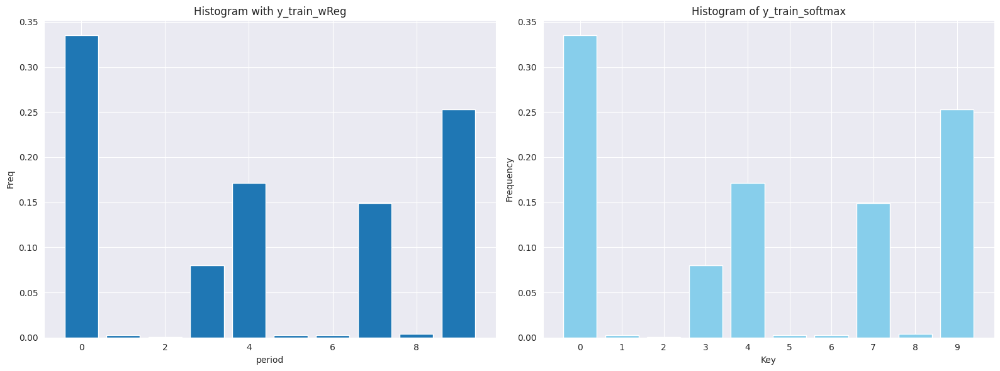

In [ ]:
#y_train
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_train_wReg 每一欄 1 的出現頻率
y_reg_freq_so = np.mean(y_train_wReg_so == 1, axis=0)
x_reg_freq_so = range(len(y_reg_freq_so))  # 創建 x 軸的索引

# 計算 y_train_w 的最大值索引出現次數
count_so = dict()
for i in range(len(y_train_wso)):
    max_index = np.argmax(y_train_wso[i])
    if max_index in count_so:
        count_so[max_index] += 1
    else:
        count_so[max_index] = 1

keys = list(count_so.keys())
values = list(count_so.values())
values_n = [i/len(y_train_wso) for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq_so, y_reg_freq_so)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_train_wReg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of y_train_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.show()


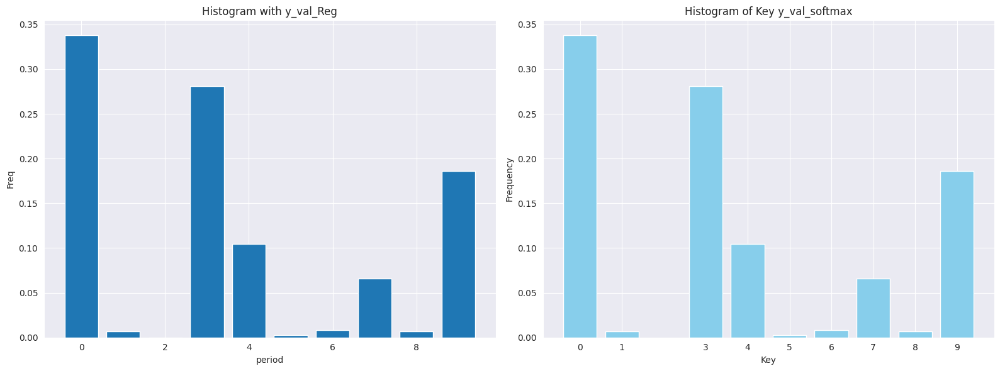

In [ ]:
#y_val
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_train_wReg 每一欄 1 的出現頻率
y_reg_freq_so = np.mean(y_val_wReg_so == 1, axis=0)
x_reg_freq_so = range(len(y_reg_freq_so))  # 創建 x 軸的索引

# 計算 y_train_w 的最大值索引出現次數
count_soo = dict()
for i in range(len(y_val_wso)):
    max_index = np.argmax(y_val_wso[i])
    if max_index in count_soo:
        count_soo[max_index] += 1
    else:
        count_soo[max_index] = 1

keys = list(count_soo.keys())
values = list(count_soo.values())
values_n = [i/len(y_val_wso) for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq_so, y_reg_freq_so)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_val_Reg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of Key y_val_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.preprocessing import StandardScaler

x_bs_train_wReg_so_2 = pd.DataFrame(x_bs_train_wReg_so)
x_bs_train_wReg_so_2.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,...,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000
mean,8.917382,9.234260,9.314077,9.387492,8.985747,8.991332,8.994536,8.996344,8.999778,9.004832,...,9.031996,9.037263,9.042243,9.050045,9.055936,9.060245,9.062562,9.066912,9.072252,9.077206
std,0.642485,0.625867,0.620292,0.603594,0.822433,0.832477,0.845688,0.858083,0.871606,0.886262,...,0.980417,0.997179,1.012585,1.036563,1.051246,1.068880,1.084886,1.101887,1.119995,1.136590
min,7.545235,7.789401,8.030098,8.211162,7.395808,7.400364,7.264979,7.237417,7.139514,7.117368,...,6.750738,6.729798,6.677001,6.612274,6.616347,6.495305,6.470663,6.383132,6.363332,6.313410
25%,8.465476,8.753736,8.817478,8.894474,8.459805,8.454155,8.448459,8.450661,8.444123,8.451063,...,8.417220,8.419143,8.422930,8.417134,8.405032,8.396345,8.392784,8.386649,8.387600,8.377475
50%,8.760325,9.088043,9.211277,9.326006,8.772526,8.784231,8.805310,8.813924,8.824406,8.829513,...,8.866069,8.867638,8.882524,8.891119,8.895764,8.901419,8.895412,8.908975,8.914636,8.908828
75%,9.385931,9.722453,9.775031,9.857049,9.459428,9.463860,9.469655,9.477769,9.473147,9.476382,...,9.539156,9.533673,9.537373,9.571616,9.588048,9.604245,9.615319,9.619785,9.640797,9.643094
max,10.754039,10.892298,10.924830,10.855484,12.117542,12.228710,12.263479,12.272701,12.306715,12.316018,...,12.776735,12.786392,12.845477,13.046978,13.166674,13.204109,13.228044,13.264705,13.274732,13.329011


In [ ]:
x_bs_train_wReg_soR = pd.DataFrame(x_bs_train_wReg_soR)
x_bs_train_wReg_soR.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,...,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000
mean,8.927628,9.238570,9.318128,9.394360,9.004953,9.007342,9.010971,9.013898,9.017960,9.023522,...,9.060288,9.066295,9.074279,9.086159,9.094339,9.098322,9.100751,9.106024,9.112480,9.118030
std,0.621126,0.606367,0.603565,0.590047,0.828800,0.844285,0.862539,0.873540,0.888880,0.905774,...,1.007683,1.026695,1.037799,1.064239,1.082407,1.104975,1.120857,1.141998,1.162540,1.175946
min,7.768000,8.158500,8.286500,8.350500,7.638895,7.597195,7.555362,7.548403,7.490303,7.451009,...,7.204955,7.167157,7.104305,7.067963,7.029379,6.990673,6.984234,6.930477,6.894119,6.833662
25%,8.508000,8.837500,8.867250,8.952750,8.497762,8.499299,8.472381,8.465144,8.451670,8.457064,...,8.459235,8.444319,8.445700,8.445180,8.443883,8.415037,8.410208,8.396183,8.401511,8.389466
50%,8.770000,9.106000,9.233000,9.362000,8.802915,8.792992,8.806937,8.821201,8.823155,8.824633,...,8.900459,8.892474,8.903743,8.929957,8.941279,8.924522,8.934364,8.912646,8.870237,8.882312
75%,9.388000,9.697000,9.745500,9.822000,9.509065,9.511583,9.490619,9.467964,9.458744,9.489997,...,9.542228,9.587724,9.635342,9.652311,9.642636,9.634208,9.615391,9.634301,9.647816,9.664659
max,10.430000,10.550500,10.626500,10.627500,11.955939,12.000979,12.099101,12.125194,12.170159,12.256840,...,12.595249,12.684957,12.697004,12.805740,12.853982,12.959079,12.987026,13.035187,13.128029,13.140496


In [ ]:
x_val_wReg_so_2 = pd.DataFrame(x_val_wReg_so)
x_val_wReg_so_2.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,...,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000
mean,13.847814,13.987568,13.891786,13.738723,14.195612,14.215884,14.234028,14.250046,14.263398,14.280368,...,14.393291,14.411585,14.433963,14.453496,14.477242,14.497945,14.516678,14.532624,14.552578,14.576571
std,1.415155,1.394942,1.299373,1.156402,1.530539,1.548921,1.578096,1.602981,1.625329,1.647778,...,1.834101,1.864078,1.894560,1.936713,1.972247,2.014381,2.053867,2.088087,2.124208,2.160413
min,11.282265,11.469917,11.446365,11.425313,11.591003,11.589767,11.610115,11.546098,11.515046,11.424643,...,11.328348,11.239411,11.259645,11.218191,11.216995,11.236689,11.174730,11.144678,11.057182,11.077089
25%,12.976507,13.095420,13.050198,13.068835,13.129257,13.206599,13.226895,13.207990,13.109321,13.028573,...,12.621017,12.587105,12.586043,12.584276,12.595021,12.583034,12.603594,12.579385,12.595691,12.630152
50%,13.908200,13.964559,13.707512,13.543437,14.028460,14.020889,14.015024,14.015519,14.022425,14.017987,...,14.309733,14.344264,14.374006,14.404216,14.472175,14.467349,14.500819,14.495523,14.536062,14.568991
75%,14.348850,14.556873,14.617677,14.347274,15.529880,15.516759,15.521466,15.496451,15.460335,15.447241,...,15.347605,15.332265,15.341343,15.330207,15.381797,15.513931,15.521722,15.554283,15.677490,15.746202
max,16.662188,17.303883,16.920059,16.448788,17.045944,17.078403,17.149596,17.202888,17.251120,17.241106,...,17.918688,18.004017,18.167867,18.288827,18.448804,18.622830,18.763803,18.767264,18.856634,19.028243


In [ ]:
x_val_wReg_soR = pd.DataFrame(x_val_wReg_soR)
x_val_wReg_soR.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,...,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000
mean,13.865059,14.016029,13.913706,13.763441,14.197944,14.237936,14.256501,14.266742,14.274825,14.291461,...,14.416107,14.434374,14.463697,14.490588,14.522513,14.544021,14.558189,14.569263,14.589211,14.620508
std,1.462520,1.437590,1.342752,1.197249,1.616719,1.641370,1.679605,1.698506,1.715788,1.747635,...,1.963686,2.003172,2.044785,2.093986,2.138689,2.188752,2.229857,2.263275,2.308510,2.357640
min,11.536000,11.629500,11.645000,11.625500,11.669952,11.651927,11.680961,11.751582,11.760504,11.652729,...,11.607374,11.501002,11.476860,11.368028,11.350470,11.378752,11.447546,11.456237,11.351250,11.327423
25%,13.174000,13.301500,13.156000,13.209500,13.305637,13.246358,13.147930,13.020547,12.923164,12.900535,...,12.599051,12.631215,12.604666,12.650675,12.673146,12.653425,12.639830,12.728686,12.761180,12.734358
50%,13.838000,13.886500,13.678000,13.610500,13.979945,13.992764,13.951889,13.930574,13.947036,13.997223,...,14.466496,14.505287,14.548836,14.593676,14.661412,14.596043,14.696902,14.681285,14.720651,14.763622
75%,14.162000,14.337000,14.406500,14.262500,15.355222,15.315406,15.344547,15.292336,15.251248,15.263313,...,15.030440,15.042331,15.033621,15.077506,15.238459,15.336728,15.526003,15.633732,15.774888,15.959740
max,16.708000,16.981000,16.789500,16.323000,16.967735,17.086923,17.293714,17.271146,17.245684,17.291446,...,17.677473,17.674903,17.849342,17.991641,18.086471,18.136151,18.292250,18.412153,18.409477,18.591165


### bootstrap 後資料與原始資料

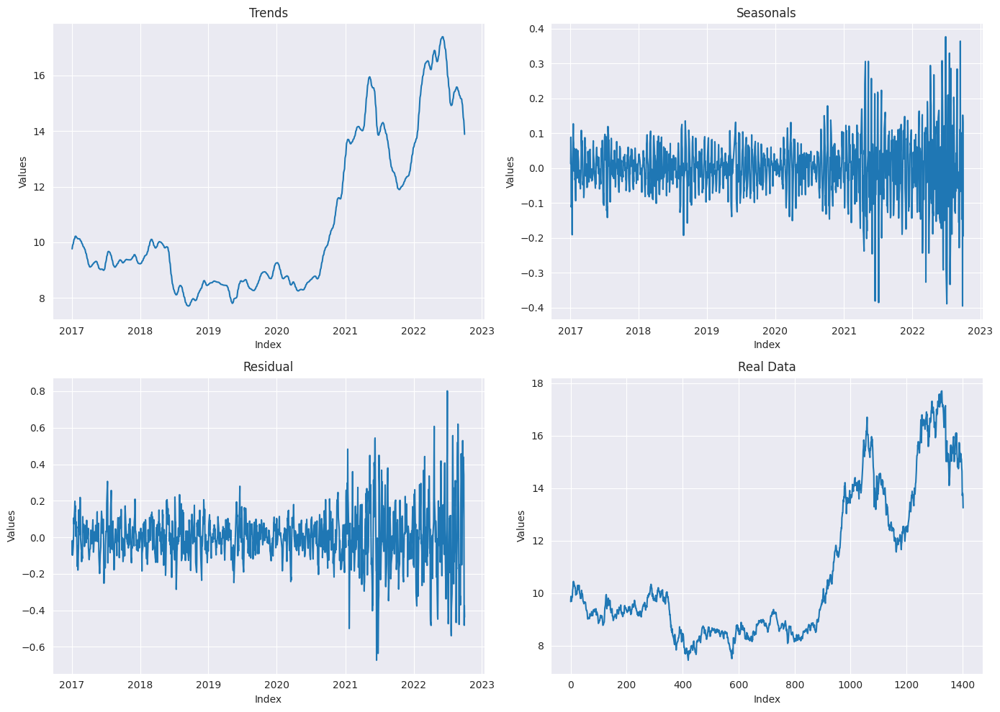

In [ ]:
soy_b = makeBootstrap(dailyTest_so, 22, 3)
dailyTest_so2 = deepcopy(dailyTest_so)
dailyTest_so2 = dailyTest_so2.reset_index()

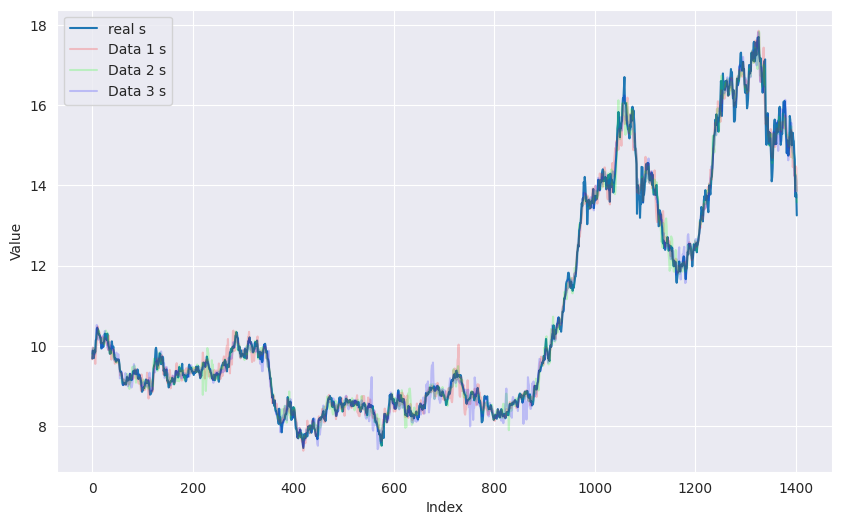

In [ ]:
from statsmodels.tsa.seasonal import STL
from copy import deepcopy
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))  # 創建一個新的圖片，並設定大小

for column in ['s']:
    plt.plot(dailyTest_so2[column], label=f'real {column}')
    plt.plot(soy_b[0][column], label=f'Data 1 {column}', color=(1, 0, 0, 0.2))
    plt.plot(soy_b[1][column], label=f'Data 2 {column}', color=(0, 1, 0, 0.2))
    plt.plot(soy_b[2][column], label=f'Data 3 {column}', color=(0, 0, 1, 0.2))

plt.xlabel('Index')  # 設定 x 軸的標籤
plt.ylabel('Value')  # 設定 y 軸的標籤

plt.legend()  # 顯示圖例

plt.show()  # 顯示圖片

## platinum

### 資料生成

In [ ]:
def construct_np_plat_data(thisData):
    x_train=[]
    y_train=[]
    x_test=[]
    y_test=[]
    x_final_test=[]
    y_final_test=[]
    x_bs_real=[]
    x_real_test=[]
    x_final_real=[]
    x_bs_train=[]
    y_bs_train=[]
    # 塞進去 x_train 和 y_train 裡面
    for round in range(len(thisData[0])):
        for j in range(len(thisData[0][round])):
            # train case & val case
            if j<60:
                if j>=47:
                    # thisData[0][round][j][-1] = 1
                    x_test.append(thisData[0][round][j])
                x_train.append(thisData[0][round][j])
                if j<47:
                    x_bs_train.append(thisData[0][round][j])
            # final test case
            else:
                x_final_test.append(thisData[0][round][j])

    for round in range(len(thisData[1])):
        for w in range(len(thisData[1][round])):
            # train case & val case
            if w<60:
                if w>=47:
                    y_test.append(thisData[1][round][w])
                y_train.append(thisData[1][round][w])
                if w<47:
                    y_bs_train.append(thisData[1][round][w])
            # final test case
            else:
                y_final_test.append(thisData[1][round][w])

    # Real Data
    for round in range(len(thisData[2])):
        for n in range(len(thisData[2][round])):
            if n<60:
                if n>=47:
                    x_real_test.append(thisData[2][round][n])
                else:
                    x_bs_real.append(thisData[2][round][n])
            elif n>=60:
                x_final_real.append(thisData[2][round][n])

    x_train = np.array(x_train)
    x_test = np.array(x_test)
    y_train = np.array(y_train)
    y_test = np.array(y_test)
    x_final_test = np.array(x_final_test)
    y_final_test = np.array(y_final_test)
    x_bs_real = np.array(x_bs_real)
    x_real_test = np.array(x_real_test)
    x_bs_train = np.array(x_bs_train)
    y_bs_train = np.array(y_bs_train)
    x_final_real = np.array(x_final_real)

    return [x_train, y_train, x_test, y_test, x_final_test, y_final_test, x_bs_real, x_real_test, x_final_real, x_bs_train, y_bs_train]

In [ ]:
trainW_p = construct_np_plat_data(test_p)
trainWReg_p = construct_np_plat_data(testReg_p)

In [ ]:
trainW_pR = construct_np_plat_data(test_noB_p)
trainWReg_pR = construct_np_plat_data(test_noBReg_p)

x_train_wpR = trainW_pR[0]
y_train_wpR = trainW_pR[1]
x_val_wpR = trainW_pR[2]
y_val_wpR = trainW_pR[3]
x_final_wpR = trainW_pR[4]
y_final_wpR = trainW_pR[5]
x_final_real_wpR = trainW_pR[8]
x_bs_train_wpRReal = trainW_pR[6]
x_val_wpRReal = trainW_pR[7]
x_bs_train_wpR = trainW_pR[9]
y_bs_train_wpR = trainW_pR[10]

x_train_wReg_pR = trainWReg_pR[0]
y_train_wReg_pR = trainWReg_pR[1]
x_val_wReg_pR = trainWReg_pR[2]
y_val_wReg_pR = trainWReg_pR[3]
x_final_wReg_pR = trainWReg_pR[4]
y_final_wReg_pR = trainWReg_pR[5]
x_final_real_wReg_pR = trainWReg_pR[8]
x_bs_train_wReg_pR = trainWReg_pR[9]
y_bs_train_wReg_pR = trainWReg_pR[10]

In [ ]:
x_train_wp = trainW_p[0]
y_train_wp = trainW_p[1]
x_val_wp = trainW_p[2]
y_val_wp = trainW_p[3]
x_bs_train_wpReal= trainW_p[6]
x_val_wpReal = trainW_p[7]
x_bs_train_wp = trainW_p[9]
y_bs_train_wp = trainW_p[10]

In [ ]:
x_train_wReg_p = trainWReg_p[0]
y_train_wReg_p = trainWReg_p[1]
x_val_wReg_p = trainWReg_p[2]
y_val_wReg_p = trainWReg_p[3]
x_bs_train_wReg_p = trainWReg_p[9]
y_bs_train_wReg_p = trainWReg_p[10]

In [ ]:
x_bs_train_wp

array([[ 934.61289033,  933.69353397,  935.70577702, ...,  907.70486322,
         908.39776147,  905.49968787],
       [ 916.78215803,  920.26706378,  921.45711928, ...,  916.14591925,
         912.26772139,  914.01891011],
       [ 920.69308297,  923.07999053,  923.37052734, ..., 1001.86480865,
        1006.42157784, 1005.7853087 ],
       ...,
       [ 900.94684622,  902.32059688,  903.57034594, ..., 1207.68190825,
        1221.48934721, 1234.32904509],
       [1046.47141991, 1056.62080608, 1058.08781605, ..., 1120.99839239,
        1115.0437162 , 1127.67053038],
       [1062.67801014, 1063.2580698 , 1064.53252977, ..., 1332.28963861,
        1341.27330124, 1338.70442441]])

In [ ]:
x_val_wp

array([[1202.4431122 , 1211.17167659, 1212.08269244, ..., 1084.76671547,
        1083.83140993, 1077.33145813],
       [1165.79116742, 1166.74727498, 1167.90166838, ..., 1212.64346867,
        1217.69776333, 1219.08192087],
       [1200.72632472, 1205.6439075 , 1205.81631956, ..., 1270.83668818,
        1278.15458342, 1280.62991885],
       ...,
       [ 982.83426813,  982.52702165,  983.09445834, ...,  933.13820909,
         935.62960285,  936.47761001],
       [ 949.90149218,  949.87576521,  949.7595593 , ..., 1042.37245852,
        1050.24712046, 1058.17408273],
       [1005.13584846, 1008.90690058, 1008.5091086 , ..., 1194.67172571,
        1194.66348261, 1200.49911056]])

### 敘述型統計

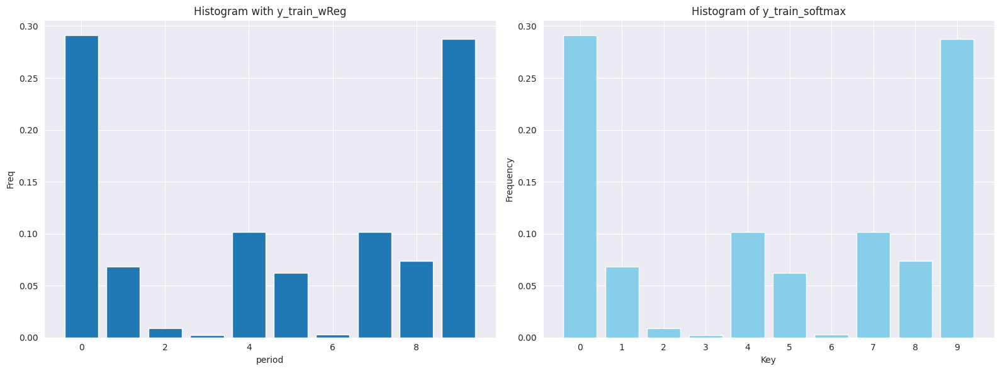

In [ ]:
#y_train
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_train_wReg 每一欄 1 的出現頻率
y_reg_freq_p = np.mean(y_train_wReg_p == 1, axis=0)
x_reg_freq_p = range(len(y_reg_freq_p))  # 創建 x 軸的索引

# 計算 y_train_w 的最大值索引出現次數
count_p = dict()
for i in range(len(y_train_wp)):
    max_index = np.argmax(y_train_wp[i])
    if max_index in count_p:
        count_p[max_index] += 1
    else:
        count_p[max_index] = 1

keys = list(count_p.keys())
values = list(count_p.values())
values_n = [i/len(y_train_wp) for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq_p, y_reg_freq_p)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_train_wReg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of y_train_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.show()


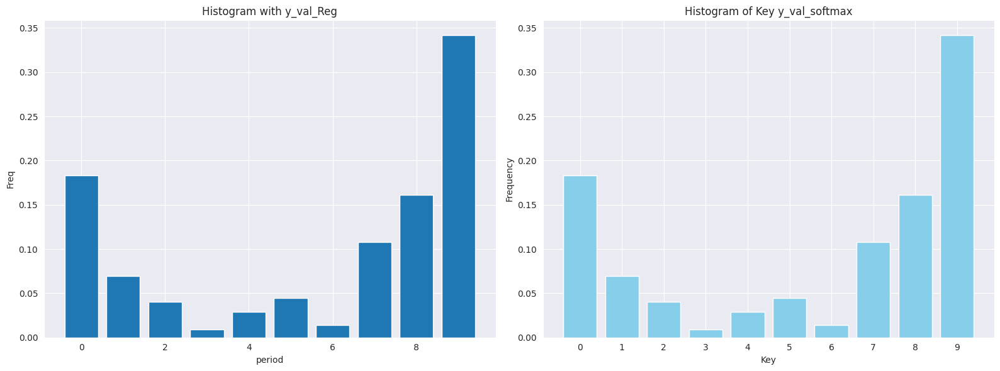

In [ ]:
#y_val
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_train_wReg 每一欄 1 的出現頻率
y_reg_freq_p = np.mean(y_val_wReg_p == 1, axis=0)
x_reg_freq_p = range(len(y_reg_freq_p))  # 創建 x 軸的索引

# 計算 y_train_w 的最大值索引出現次數
count_pp = dict()
for i in range(len(y_val_wp)):
    max_index = np.argmax(y_val_wp[i])
    if max_index in count_pp:
        count_pp[max_index] += 1
    else:
        count_pp[max_index] = 1

keys = list(count_pp.keys())
values = list(count_pp.values())
values_n = [i/len(y_val_wp) for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq_p, y_reg_freq_p)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_val_Reg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of Key y_val_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.preprocessing import StandardScaler

x_bs_train_wReg_p_2 = pd.DataFrame(x_bs_train_wReg_p)
x_bs_train_wReg_p_2.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,2350.000000,2350.000000,2350.000000,2350.000000,2350.000000,2350.000000,2350.000000,2350.000000,2350.000000,2350.000000,...,2350.000000,2350.000000,2350.000000,2350.000000,2350.000000,2350.000000,2350.000000,2350.000000,2350.000000,2350.000000
mean,888.337342,892.004414,893.261317,895.041805,894.935059,895.413406,895.935883,896.275529,896.873374,897.324173,...,900.322736,900.824634,901.217240,901.735309,902.335444,903.003980,903.470736,904.186858,904.787303,905.218842
std,71.319318,70.765579,70.872311,71.011365,90.891430,92.381608,93.870978,95.693597,97.579727,99.646983,...,111.882784,114.185296,116.084370,118.857826,120.921829,123.053406,125.319223,127.742920,130.207520,132.180895
min,715.380728,710.424260,711.660283,712.392018,644.809062,635.274339,629.901368,618.995335,614.731985,602.804731,...,555.045541,545.251463,537.787168,525.150792,517.385443,513.009543,506.892318,501.123084,492.461019,486.295216
25%,832.389725,838.121043,838.915916,840.862744,832.779108,834.020583,834.648673,833.812209,833.937234,834.537445,...,833.778749,833.263281,833.049129,832.857040,831.430727,831.620923,831.355175,830.593258,829.814677,828.703203
50%,896.824862,900.133792,901.741577,903.709090,897.516791,897.555510,897.877088,895.974570,895.914302,894.966796,...,890.738425,889.328120,889.781856,889.319287,888.155546,888.317690,888.018743,887.898614,887.454283,888.069825
75%,930.312573,932.608599,934.234624,935.766707,939.642104,940.102705,941.888870,942.090693,943.448156,945.143653,...,953.502002,953.829000,955.823636,956.693368,960.037762,962.382383,962.857173,966.110016,966.825651,969.490892
max,1094.425885,1098.869009,1100.267172,1101.907869,1224.061982,1229.651293,1232.640645,1247.442294,1255.037383,1268.102279,...,1319.422207,1333.157347,1331.646530,1342.579622,1352.765488,1362.356407,1378.715693,1387.110044,1401.549812,1399.961489


In [ ]:
x_bs_train_wReg_pR = pd.DataFrame(x_bs_train_wReg_pR)
x_bs_train_wReg_pR.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,...,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000
mean,889.025481,893.312340,894.517447,896.257872,895.442153,895.833525,896.490026,896.581876,897.579235,897.781387,...,901.398986,901.668196,902.481028,903.045305,903.558211,904.445244,904.551914,905.733934,906.068953,906.976321
std,72.662010,72.087959,72.331028,72.537851,94.577654,95.990902,97.481622,99.005196,101.366259,103.190569,...,116.847211,118.897679,121.813609,125.058086,126.956706,128.853607,130.845938,133.847147,136.048107,139.214367
min,729.269700,729.620000,729.560000,729.900000,633.372318,626.607342,623.264923,611.697662,603.818529,593.478127,...,544.021470,534.705094,524.574968,514.136322,508.644892,505.931703,496.542045,490.146204,481.752443,472.625518
25%,830.124000,832.930000,834.270000,835.900000,829.664083,831.825798,829.482415,831.354446,833.059739,834.334274,...,831.874859,831.961325,832.886256,833.043307,828.907852,830.064749,831.466503,829.207034,832.022658,832.893916
50%,893.273100,897.200000,900.120000,902.560000,898.642382,897.000003,895.798534,897.738207,895.656685,891.552076,...,886.573038,885.498214,888.830221,884.134290,886.482442,886.254694,885.982891,887.831107,889.724981,889.156791
75%,933.308160,935.840000,937.160000,938.840000,940.667162,944.868735,945.978236,947.552265,951.137686,950.702123,...,957.534386,956.199016,958.409350,956.247180,961.064931,963.801012,961.019411,966.935450,964.559276,974.354746
max,1076.800060,1079.140000,1080.760000,1082.800000,1190.659294,1190.260267,1203.234599,1205.868494,1216.892683,1224.917546,...,1261.291842,1269.609498,1270.902856,1279.128337,1278.699661,1292.638019,1295.467619,1307.310934,1315.932065,1317.272612


In [ ]:
x_val_wReg_p_2 = pd.DataFrame(x_val_wReg_p)
x_val_wReg_p_2.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,650.000000,650.000000,650.000000,650.000000,650.000000,650.000000,650.000000,650.000000,650.000000,650.000000,...,650.000000,650.000000,650.000000,650.000000,650.000000,650.000000,650.000000,650.000000,650.000000,650.000000
mean,1080.782311,1081.707647,1082.214708,1083.075970,1068.072532,1067.134510,1066.774151,1066.637620,1066.301490,1065.885856,...,1063.165195,1062.814790,1062.465050,1061.795535,1060.926678,1060.667984,1060.639998,1060.408770,1060.113922,1059.731882
std,95.927643,97.864352,98.209868,98.557644,89.773500,90.127533,90.917673,91.353155,92.300489,92.892704,...,98.238965,99.238825,99.507185,101.112184,102.340971,104.402750,105.655910,107.350140,108.604214,109.293042
min,932.149365,930.755905,931.406211,931.175890,927.953115,922.666770,921.307123,917.323816,921.732150,916.412488,...,912.581124,907.314276,913.873489,909.619003,904.437104,898.920187,898.473883,895.173228,893.541986,885.692789
25%,994.416035,991.253237,991.273841,991.758631,993.351598,992.671500,990.050037,988.914038,987.101950,984.789629,...,975.933891,974.492874,972.227691,970.570688,967.063631,965.575079,963.938927,963.373804,961.841607,960.144987
50%,1045.101691,1047.802425,1048.179836,1049.058145,1053.968403,1053.331261,1054.321123,1052.317173,1050.213773,1049.679024,...,1052.954703,1055.482717,1058.148924,1059.311566,1066.053079,1062.173079,1065.014322,1064.206375,1067.423091,1067.330957
75%,1184.129988,1185.853666,1186.569412,1187.603480,1150.466373,1148.575240,1145.551914,1141.931336,1141.052483,1137.848700,...,1124.281349,1123.487261,1122.153008,1124.025140,1122.498689,1123.749256,1122.540429,1124.891500,1125.975685,1127.216645
max,1267.923832,1270.591486,1271.498785,1272.601070,1257.074615,1263.269349,1270.370387,1275.290102,1273.004143,1276.783962,...,1300.675005,1301.465958,1303.747682,1305.875685,1323.277251,1330.715602,1335.869014,1331.208979,1331.886688,1328.950925


In [ ]:
x_val_wReg_pR = pd.DataFrame(x_val_wReg_pR)
x_val_wReg_pR.describe()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
count,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,...,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000
mean,1084.366738,1085.553846,1086.066154,1086.809231,1068.882033,1066.079374,1066.039062,1067.264160,1066.053759,1065.550604,...,1062.495916,1062.041696,1061.537087,1060.565293,1059.142579,1059.302636,1060.531585,1059.373774,1058.967977,1058.551487
std,102.947798,105.248258,105.643527,106.013571,89.541181,91.720306,94.581714,96.015285,94.448117,93.758498,...,100.442839,100.399172,101.135261,104.027243,105.598115,110.298931,111.627897,110.670561,111.165551,112.743368
min,963.652940,963.640000,963.980000,963.860000,958.732210,953.902188,939.302369,937.657685,937.243390,944.530695,...,925.694948,932.892460,937.137771,935.251326,931.705060,916.297353,914.692950,914.288802,921.397629,925.590630
25%,1005.634040,1003.100000,1003.260000,1003.620000,1006.770289,1009.518218,1002.704053,998.654876,998.810904,1002.320126,...,980.749186,981.203889,977.677534,971.496280,974.602164,980.128293,979.541993,980.389986,976.066705,975.049830
50%,1037.205760,1035.020000,1035.200000,1035.720000,1044.357492,1046.707858,1042.417677,1040.418909,1044.269442,1043.313694,...,1063.242150,1063.910455,1065.732202,1064.231479,1072.699642,1069.470395,1075.600102,1069.332573,1063.486810,1055.177636
75%,1195.901740,1196.660000,1197.860000,1198.740000,1147.300070,1141.837989,1137.625800,1144.146142,1137.479194,1131.260892,...,1103.254997,1105.549910,1104.254347,1107.263803,1108.842936,1118.427420,1115.842418,1114.944577,1121.183664,1124.226786
max,1241.795960,1247.220000,1248.420000,1249.520000,1252.846742,1250.178112,1261.515675,1268.323003,1261.559853,1263.340253,...,1284.251488,1286.063912,1288.750829,1298.321903,1295.556409,1307.305496,1314.359913,1307.351278,1309.196302,1311.931547


### bootstrap 後與原始資料

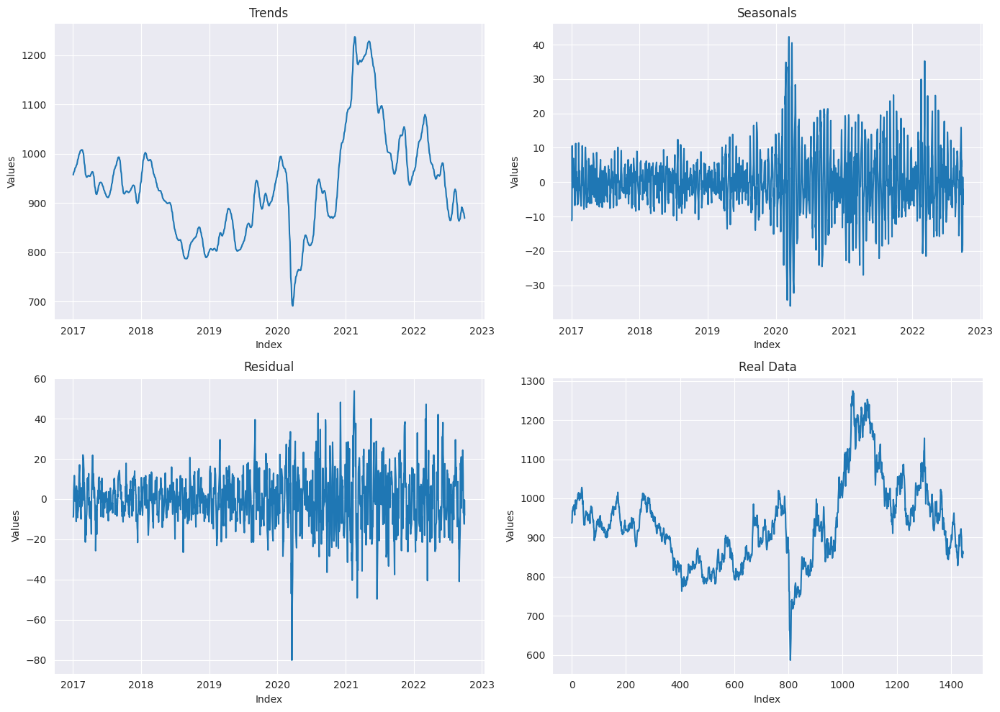

In [ ]:
platform_b = makeBootstrap(dailyTest_p, 22, 3)
dailyTest_p2 = deepcopy(dailyTest_p)
dailyTest_p2 = dailyTest_p2.reset_index()

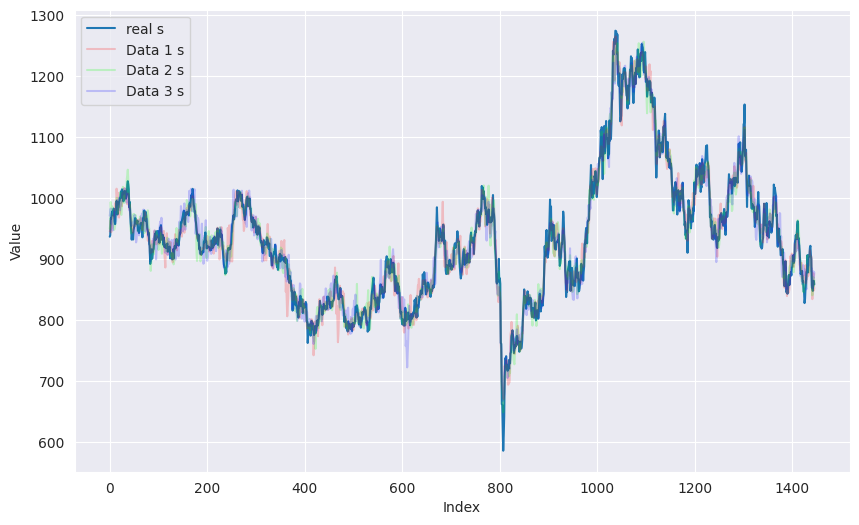

In [ ]:
from statsmodels.tsa.seasonal import STL
from copy import deepcopy
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))  # 創建一個新的圖片，並設定大小

for column in ['s']:
    plt.plot(dailyTest_p2[column], label=f'real {column}')
    plt.plot(platform_b[0][column], label=f'Data 1 {column}', color=(1, 0, 0, 0.2))
    plt.plot(platform_b[1][column], label=f'Data 2 {column}', color=(0, 1, 0, 0.2))
    plt.plot(platform_b[2][column], label=f'Data 3 {column}', color=(0, 0, 1, 0.2))

plt.xlabel('Index')  # 設定 x 軸的標籤
plt.ylabel('Value')  # 設定 y 軸的標籤

plt.legend()  # 顯示圖例

plt.show()  # 顯示圖片

# 對不同原物料之間做 correlation

In [ ]:
df = pd.DataFrame({
    'Silver': dailyTest_s2['s'],
    'Gold': dailyTest_g2['s'],
    'SoyBean': dailyTest_so2['s'],
    'Platinum': dailyTest_p2['s'],
    'Copper': dailyTest_c2['s']
})

df.corr()

,Silver,Gold,SoyBean,Platinum,Copper
Silver,1.000000,0.853093,0.806279,0.746852,0.785342
Gold,0.853093,1.000000,0.737616,0.424581,0.664056
SoyBean,0.806279,0.737616,1.000000,0.658668,0.887151
Platinum,0.746852,0.424581,0.658668,1.000000,0.694893
Copper,0.785342,0.664056,0.887151,0.694893,1.000000


## Copper

### bootAll (0-1)

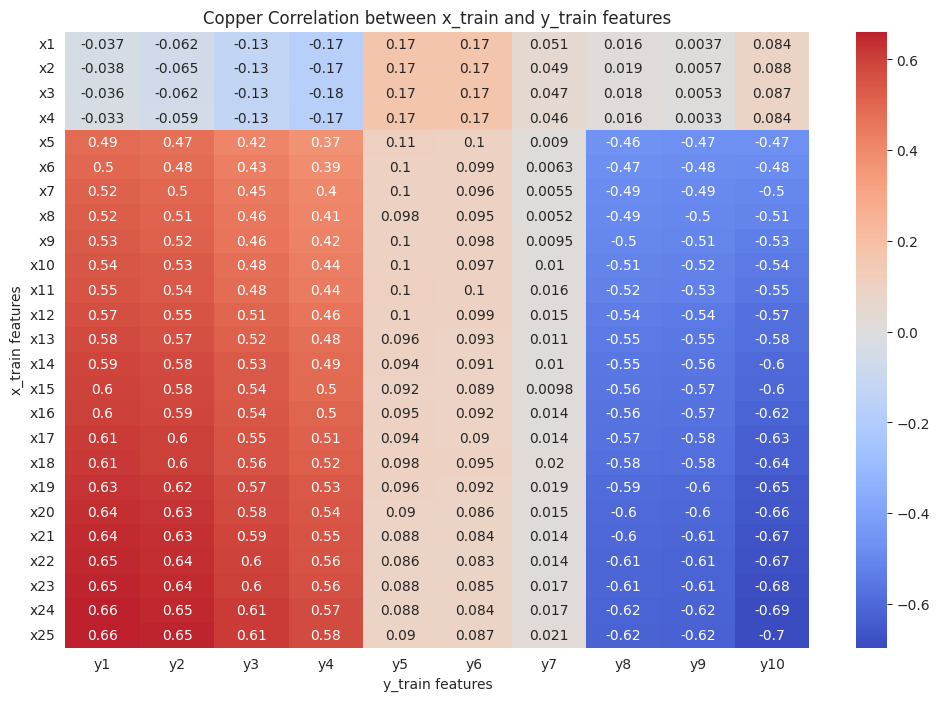

In [ ]:
x_dfc = pd.DataFrame(X_train_c, columns=[f'x{i+1}' for i in range(25)])
y_dfc = pd.DataFrame(y_train_c, columns=[f'y{i+1}' for i in range(10)])

correlation_dfc = pd.DataFrame(index=x_dfc.columns, columns=y_dfc.columns)

for x_col in x_dfc.columns:
    for y_col in y_dfc.columns:
        correlation_dfc.loc[x_col, y_col] = x_dfc[x_col].corr(y_dfc[y_col])

# 将相关系数转换为浮点数
correlation_dfc = correlation_dfc.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfc, annot=True, cmap='coolwarm', center=0)
plt.title('Copper Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### bootAll (-1,1)

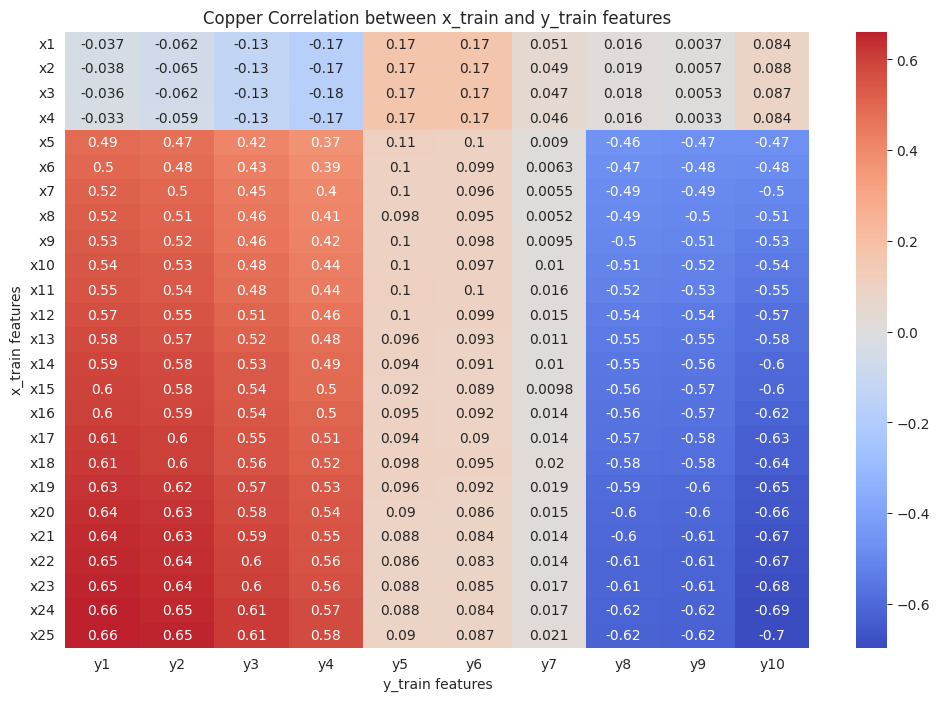

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 假設 X_train_c 和 y_train_c 已經定義

x_dfc1 = pd.DataFrame(X_train_c, columns=[f'x{i+1}' for i in range(25)])
y_dfc1 = pd.DataFrame(y_train_c, columns=[f'y{i+1}' for i in range(10)])

correlation_dfc1 = pd.DataFrame(index=x_dfc1.columns, columns=y_dfc1.columns)

for x_col in x_dfc1.columns:
    for y_col in y_dfc1.columns:
        correlation_dfc1.loc[x_col, y_col] = x_dfc1[x_col].corr(y_dfc1[y_col])

# 将相关系数转换为浮点数
correlation_dfc1 = correlation_dfc1.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfc1, annot=True, cmap='coolwarm', center=0)
plt.title('Copper Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()


### Raw (0-1)

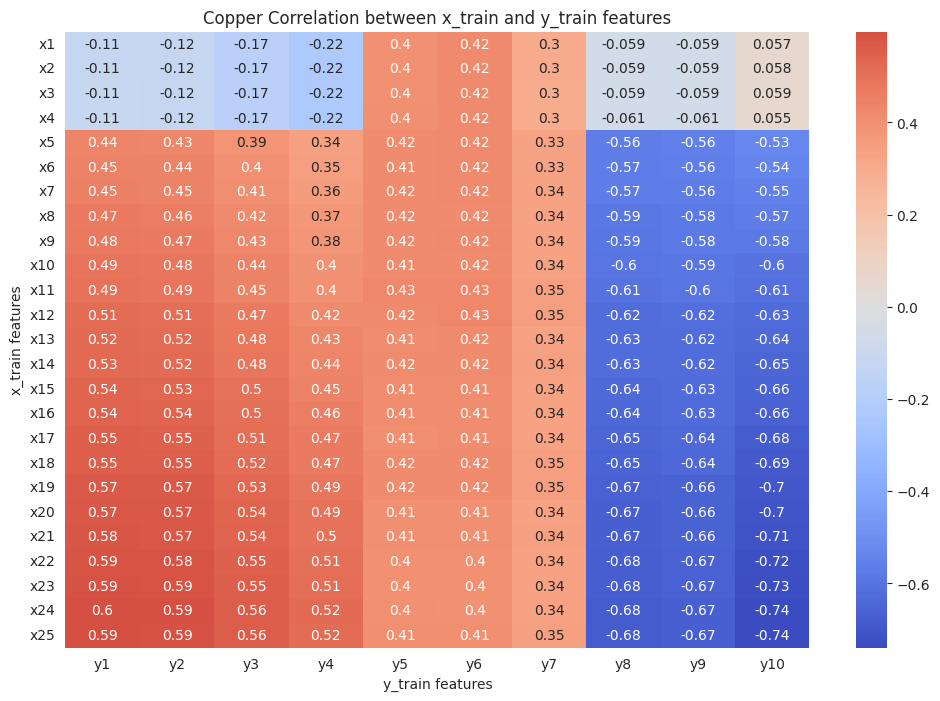

In [ ]:
x_dfc2 = pd.DataFrame(X_train_cReal, columns=[f'x{i+1}' for i in range(25)])
y_dfc2 = pd.DataFrame(y_train_cReal, columns=[f'y{i+1}' for i in range(10)])

correlation_dfc2 = pd.DataFrame(index=x_dfc2.columns, columns=y_dfc2.columns)

for x_col in x_dfc2.columns:
    for y_col in y_dfc2.columns:
        correlation_dfc2.loc[x_col, y_col] = x_dfc2[x_col].corr(y_dfc2[y_col])

# 将相关系数转换为浮点数
correlation_dfc2 = correlation_dfc2.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfc2, annot=True, cmap='coolwarm', center=0)
plt.title('Copper Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### Raw (-1,1)

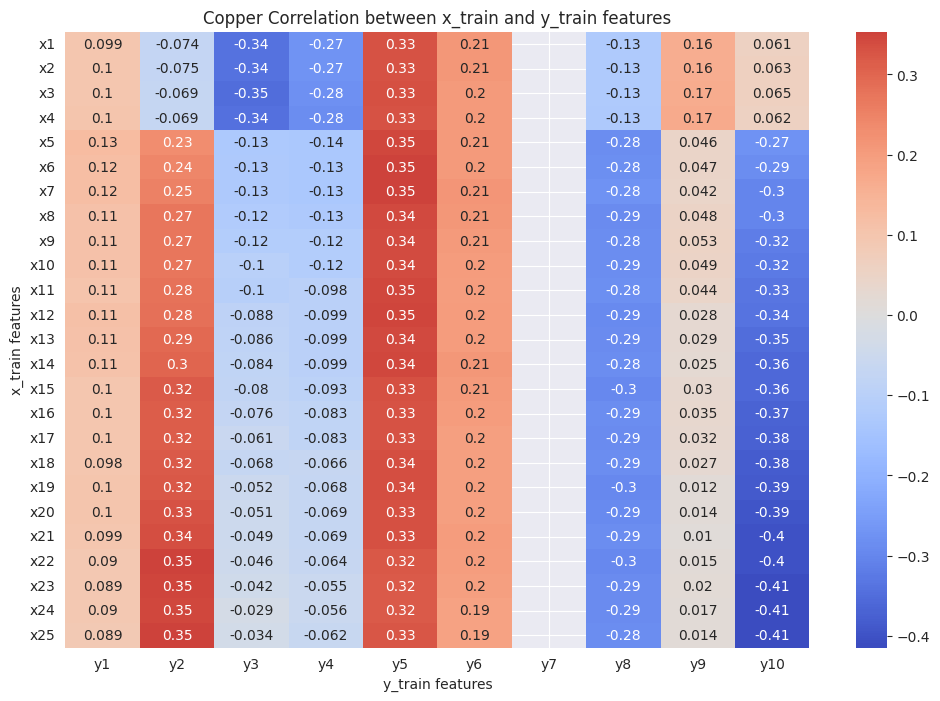

In [ ]:
x_dfc = pd.DataFrame(X_train_cRegReal, columns=[f'x{i+1}' for i in range(25)])
y_dfc = pd.DataFrame(y_train_cRegReal, columns=[f'y{i+1}' for i in range(10)])

correlation_dfc = pd.DataFrame(index=x_dfc.columns, columns=y_dfc.columns)

for x_col in x_dfc.columns:
    for y_col in y_dfc.columns:
        correlation_dfc.loc[x_col, y_col] = x_dfc[x_col].corr(y_dfc[y_col])

# 将相关系数转换为浮点数
correlation_dfc = correlation_dfc.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfc, annot=True, cmap='coolwarm', center=0)
plt.title('Copper Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

## Platinum

### bootAll (0-1)

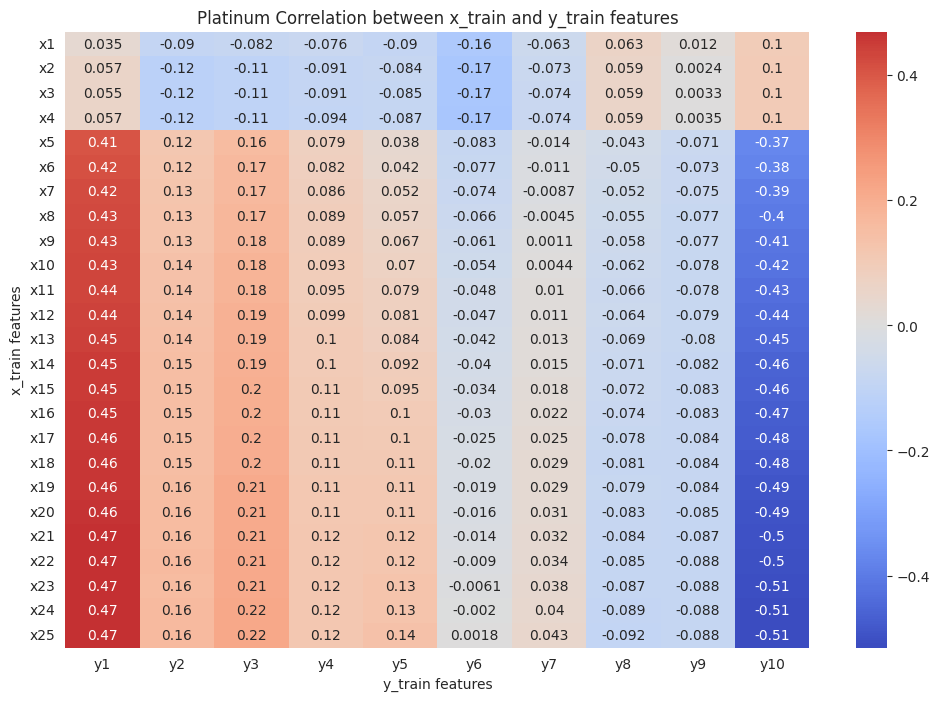

In [ ]:
x_dfp = pd.DataFrame(X_train_p, columns=[f'x{i+1}' for i in range(25)])
y_dfp = pd.DataFrame(y_train_p, columns=[f'y{i+1}' for i in range(10)])

correlation_dfp = pd.DataFrame(index=x_dfp.columns, columns=y_dfp.columns)

for x_col in x_dfp.columns:
    for y_col in y_dfp.columns:
        correlation_dfp.loc[x_col, y_col] = x_dfp[x_col].corr(y_dfp[y_col])

# 将相关系数转换为浮点数
correlation_dfp = correlation_dfp.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfp, annot=True, cmap='coolwarm', center=0)
plt.title('Platinum Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### bootAll (-1,1)

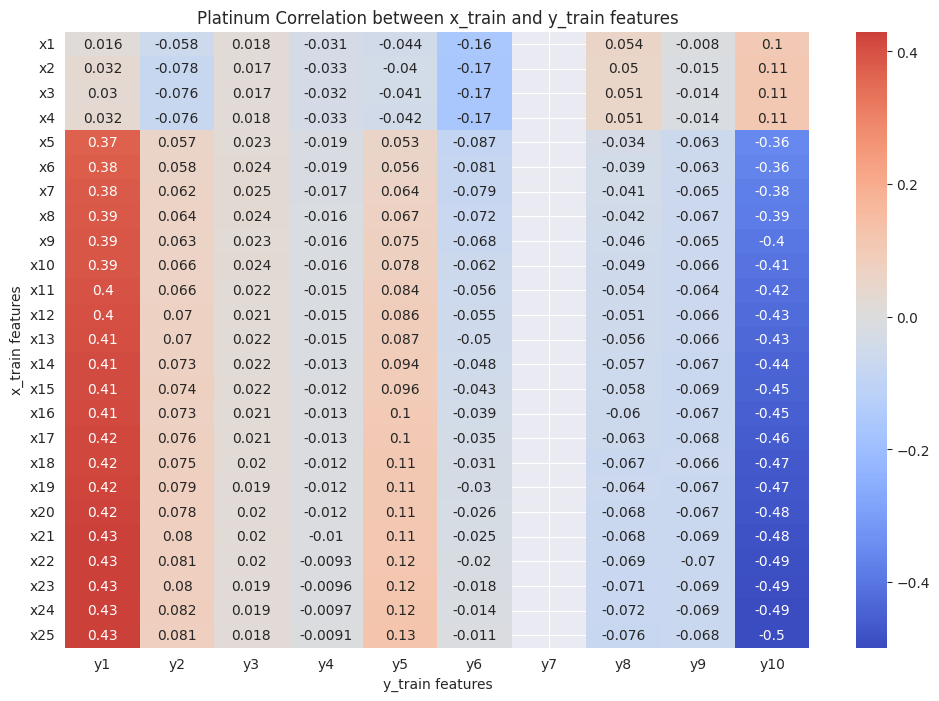

In [ ]:
x_dfp = pd.DataFrame(X_train_pReg, columns=[f'x{i+1}' for i in range(25)])
y_dfp = pd.DataFrame(y_train_pReg, columns=[f'y{i+1}' for i in range(10)])

correlation_dfp = pd.DataFrame(index=x_dfp.columns, columns=y_dfp.columns)

for x_col in x_dfp.columns:
    for y_col in y_dfp.columns:
        correlation_dfp.loc[x_col, y_col] = x_dfp[x_col].corr(y_dfp[y_col])

# 将相关系数转换为浮点数
correlation_dfp = correlation_dfp.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfp, annot=True, cmap='coolwarm', center=0)
plt.title('Platinum Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### Raw (0-1)

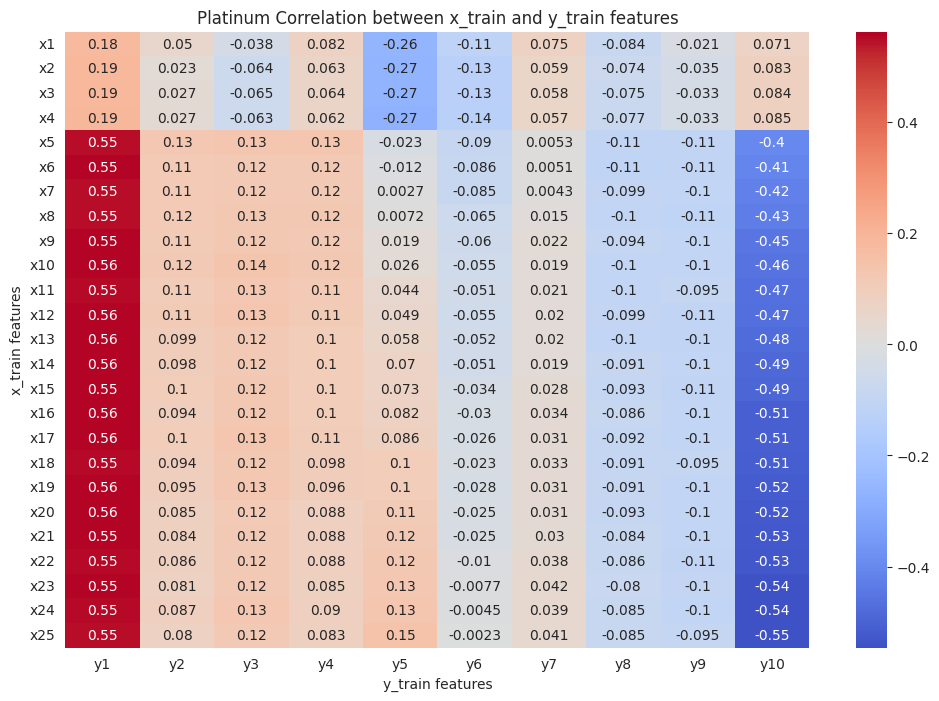

In [ ]:
x_dfp = pd.DataFrame(X_train_pReal, columns=[f'x{i+1}' for i in range(25)])
y_dfp = pd.DataFrame(y_train_pReal, columns=[f'y{i+1}' for i in range(10)])

correlation_dfp = pd.DataFrame(index=x_dfp.columns, columns=y_dfp.columns)

for x_col in x_dfp.columns:
    for y_col in y_dfp.columns:
        correlation_dfp.loc[x_col, y_col] = x_dfp[x_col].corr(y_dfp[y_col])

# 将相关系数转换为浮点数
correlation_dfp = correlation_dfp.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfp, annot=True, cmap='coolwarm', center=0)
plt.title('Platinum Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### Raw (-1,1)

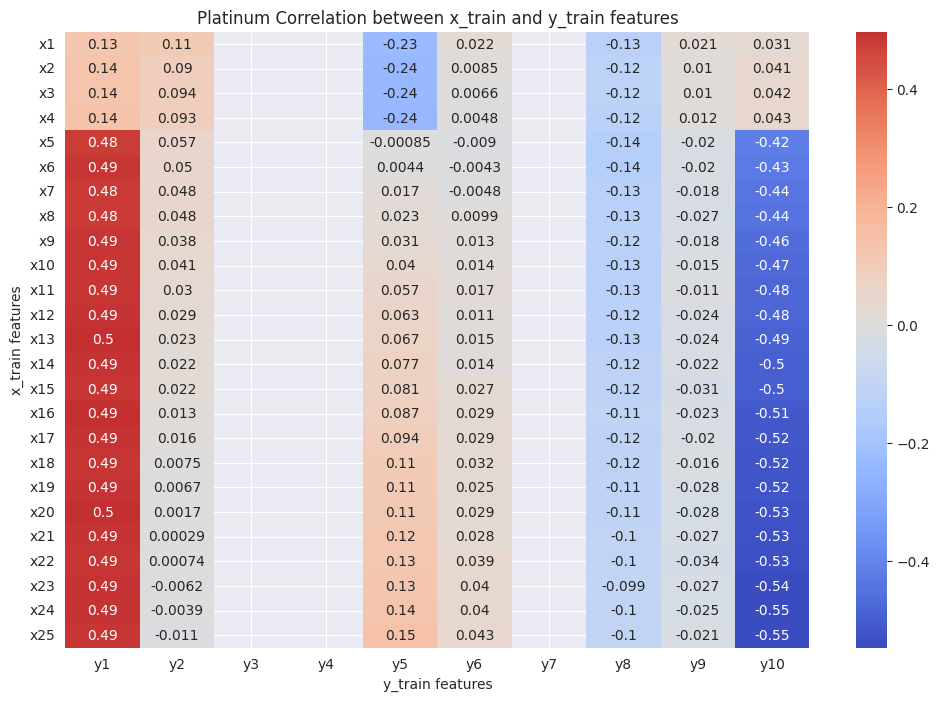

In [ ]:
x_dfp = pd.DataFrame(X_train_pRegReal, columns=[f'x{i+1}' for i in range(25)])
y_dfp = pd.DataFrame(y_train_pRegReal, columns=[f'y{i+1}' for i in range(10)])

correlation_dfp = pd.DataFrame(index=x_dfp.columns, columns=y_dfp.columns)

for x_col in x_dfp.columns:
    for y_col in y_dfp.columns:
        correlation_dfp.loc[x_col, y_col] = x_dfp[x_col].corr(y_dfp[y_col])

# 将相关系数转换为浮点数
correlation_dfp = correlation_dfp.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfp, annot=True, cmap='coolwarm', center=0)
plt.title('Platinum Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

## Soybean

### bootAll (0-1)

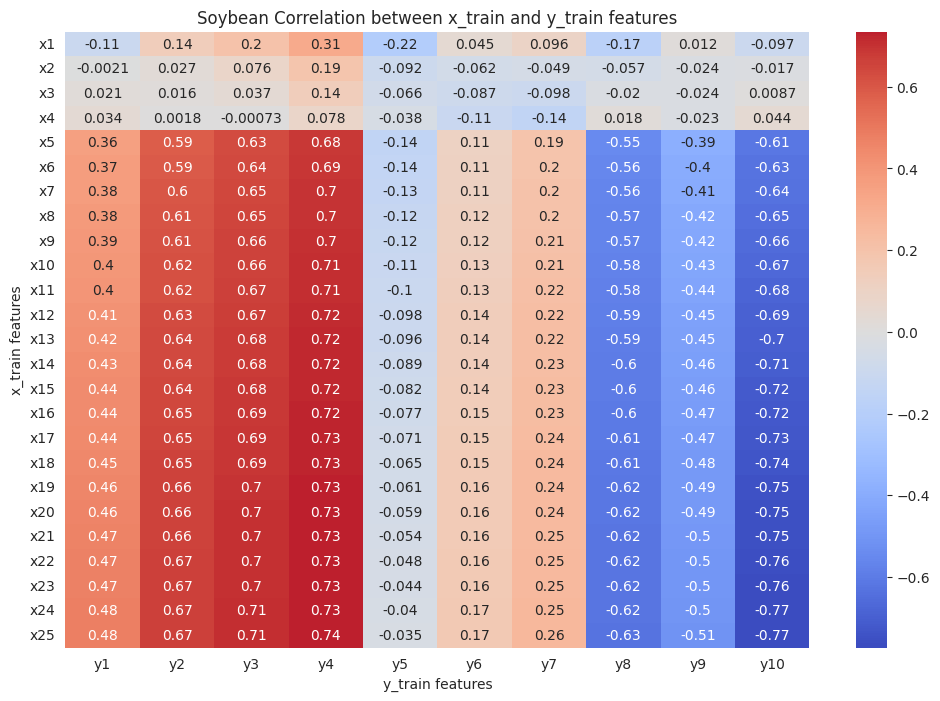

In [ ]:
x_dfso = pd.DataFrame(X_train_so, columns=[f'x{i+1}' for i in range(25)])
y_dfso = pd.DataFrame(y_train_so, columns=[f'y{i+1}' for i in range(10)])

correlation_dfso = pd.DataFrame(index=x_dfso.columns, columns=y_dfso.columns)

for x_col in x_dfso.columns:
    for y_col in y_dfso.columns:
        correlation_dfso.loc[x_col, y_col] = x_dfso[x_col].corr(y_dfso[y_col])

# 将相关系数转换为浮点数
correlation_dfso = correlation_dfso.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfso, annot=True, cmap='coolwarm', center=0)
plt.title('Soybean Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### bootAll (-1,1)

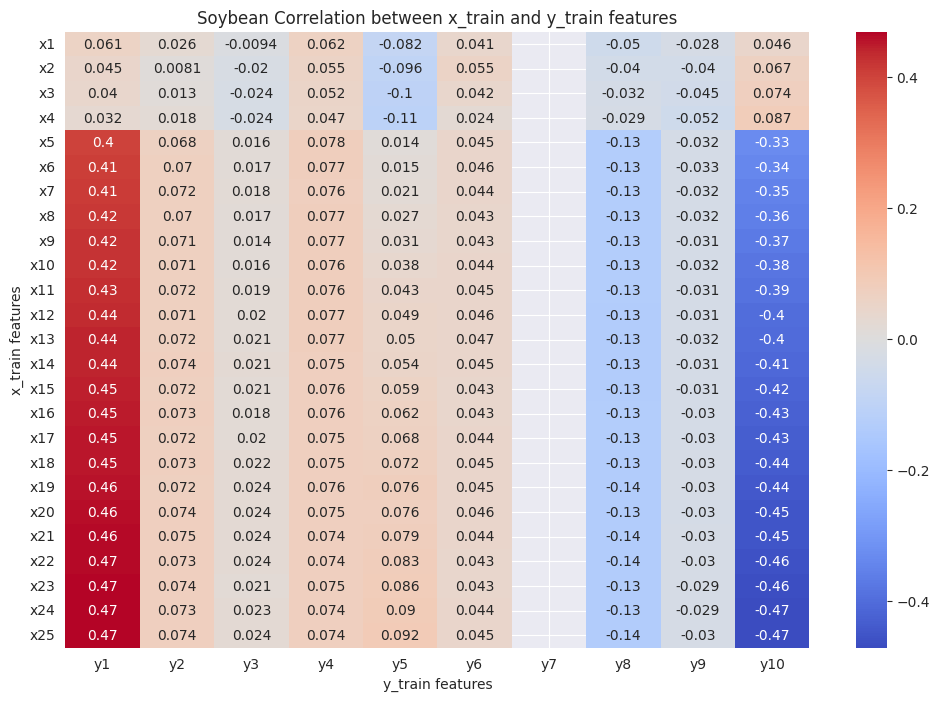

In [ ]:
x_dfso = pd.DataFrame(X_train_soReg, columns=[f'x{i+1}' for i in range(25)])
y_dfso = pd.DataFrame(y_train_soReg, columns=[f'y{i+1}' for i in range(10)])

correlation_dfso = pd.DataFrame(index=x_dfso.columns, columns=y_dfso.columns)

for x_col in x_dfso.columns:
    for y_col in y_dfso.columns:
        correlation_dfso.loc[x_col, y_col] = x_dfso[x_col].corr(y_dfso[y_col])

# 将相关系数转换为浮点数
correlation_dfso = correlation_dfso.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfso, annot=True, cmap='coolwarm', center=0)
plt.title('Soybean Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### Raw (0-1)

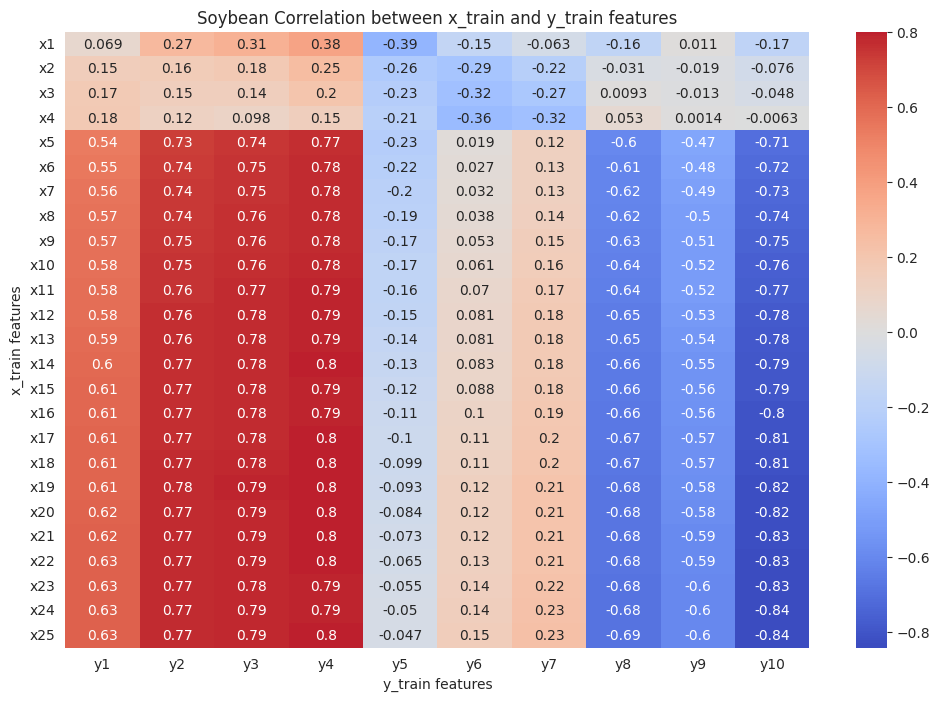

In [ ]:
x_dfso = pd.DataFrame(X_train_soReal, columns=[f'x{i+1}' for i in range(25)])
y_dfso = pd.DataFrame(y_train_soReal, columns=[f'y{i+1}' for i in range(10)])

correlation_dfso = pd.DataFrame(index=x_dfso.columns, columns=y_dfso.columns)

for x_col in x_dfso.columns:
    for y_col in y_dfso.columns:
        correlation_dfso.loc[x_col, y_col] = x_dfso[x_col].corr(y_dfso[y_col])

# 将相关系数转换为浮点数
correlation_dfso = correlation_dfso.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfso, annot=True, cmap='coolwarm', center=0)
plt.title('Soybean Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### Raw (-1,1)

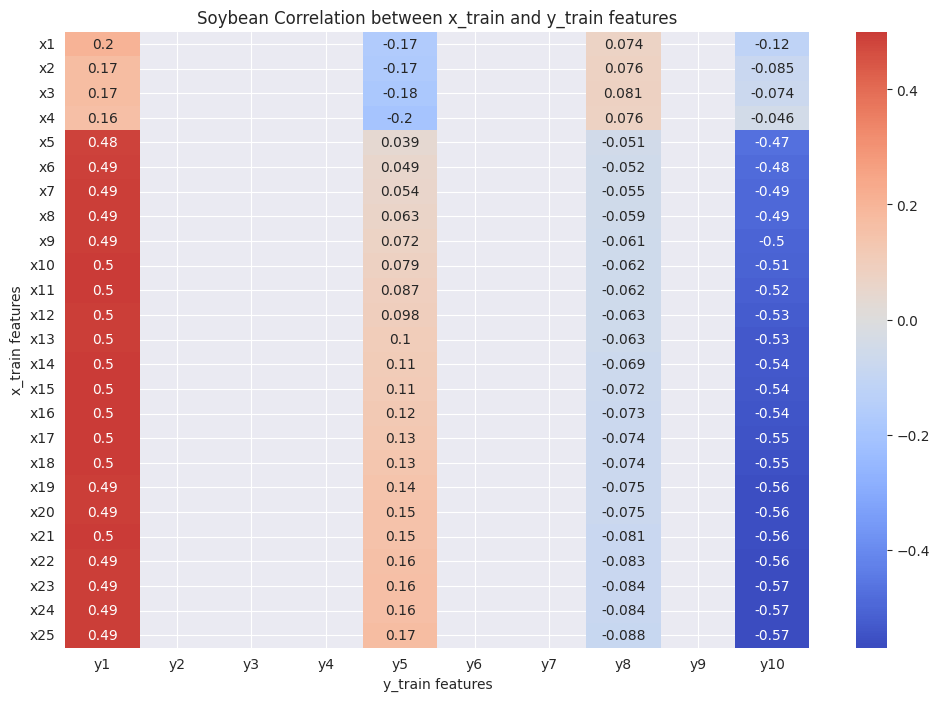

In [ ]:
x_dfso = pd.DataFrame(X_train_soRegReal, columns=[f'x{i+1}' for i in range(25)])
y_dfso = pd.DataFrame(y_train_soRegReal, columns=[f'y{i+1}' for i in range(10)])

correlation_dfso = pd.DataFrame(index=x_dfso.columns, columns=y_dfso.columns)

for x_col in x_dfso.columns:
    for y_col in y_dfso.columns:
        correlation_dfso.loc[x_col, y_col] = x_dfso[x_col].corr(y_dfso[y_col])

# 将相关系数转换为浮点数
correlation_dfso = correlation_dfso.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfso, annot=True, cmap='coolwarm', center=0)
plt.title('Soybean Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

## Gold

### BootAll(0-1)

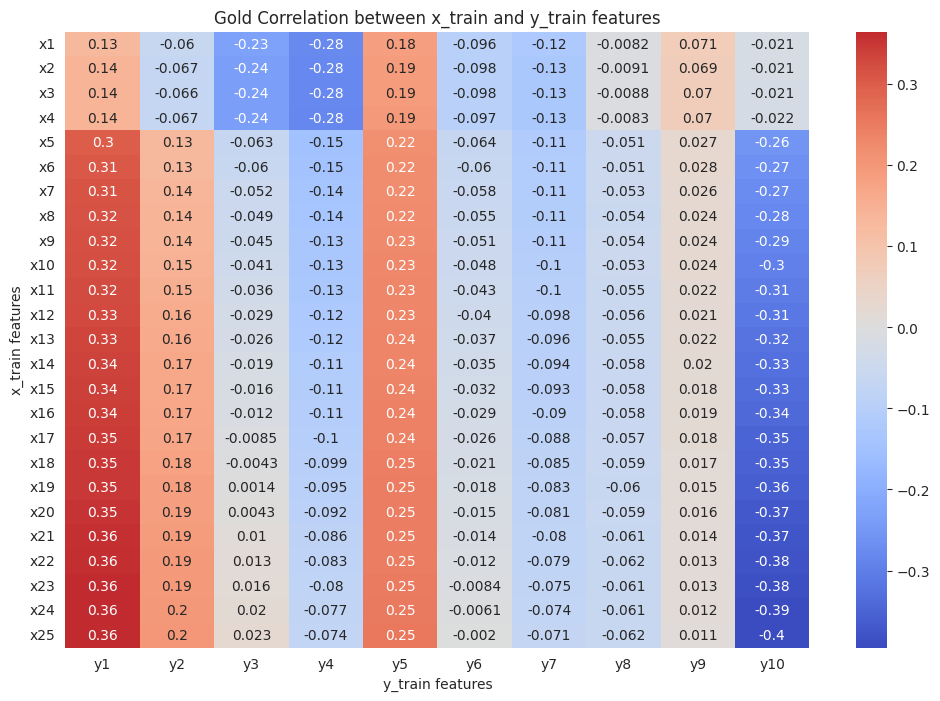

In [ ]:
x_dfg = pd.DataFrame(X_train_g, columns=[f'x{i+1}' for i in range(25)])
y_dfg = pd.DataFrame(y_train_g, columns=[f'y{i+1}' for i in range(10)])

correlation_dfg = pd.DataFrame(index=x_dfg.columns, columns=y_dfg.columns)

for x_col in x_dfg.columns:
    for y_col in y_dfg.columns:
        correlation_dfg.loc[x_col, y_col] = x_dfg[x_col].corr(y_dfg[y_col])

# 将相关系数转换为浮点数
correlation_dfg = correlation_dfg.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfg, annot=True, cmap='coolwarm', center=0)
plt.title('Gold Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### BootAll(-1,1)

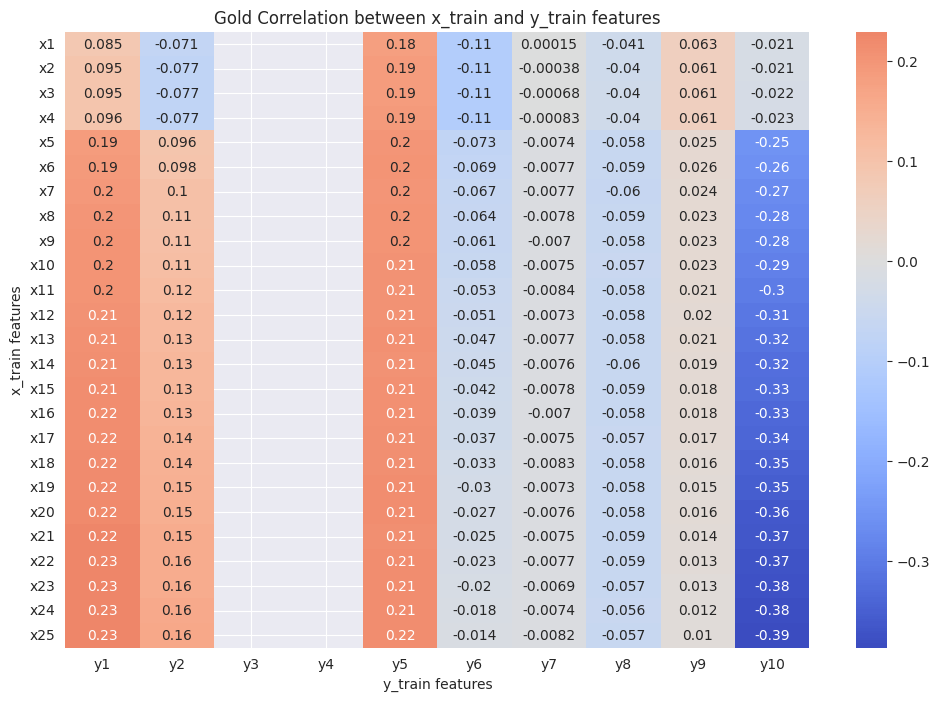

In [ ]:
x_dfg1 = pd.DataFrame(X_train_g, columns=[f'x{i+1}' for i in range(25)])
y_dfg1 = pd.DataFrame(y_train_gReg, columns=[f'y{i+1}' for i in range(10)])

correlation_dfg1 = pd.DataFrame(index=x_dfg1.columns, columns=y_dfg1.columns)

for x_col in x_dfg1.columns:
    for y_col in y_dfg1.columns:
        correlation_dfg1.loc[x_col, y_col] = x_dfg1[x_col].corr(y_dfg1[y_col])

# 将相关系数转换为浮点数
correlation_dfg1 = correlation_dfg1.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfg1, annot=True, cmap='coolwarm', center=0)
plt.title('Gold Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### Raw(0-1)

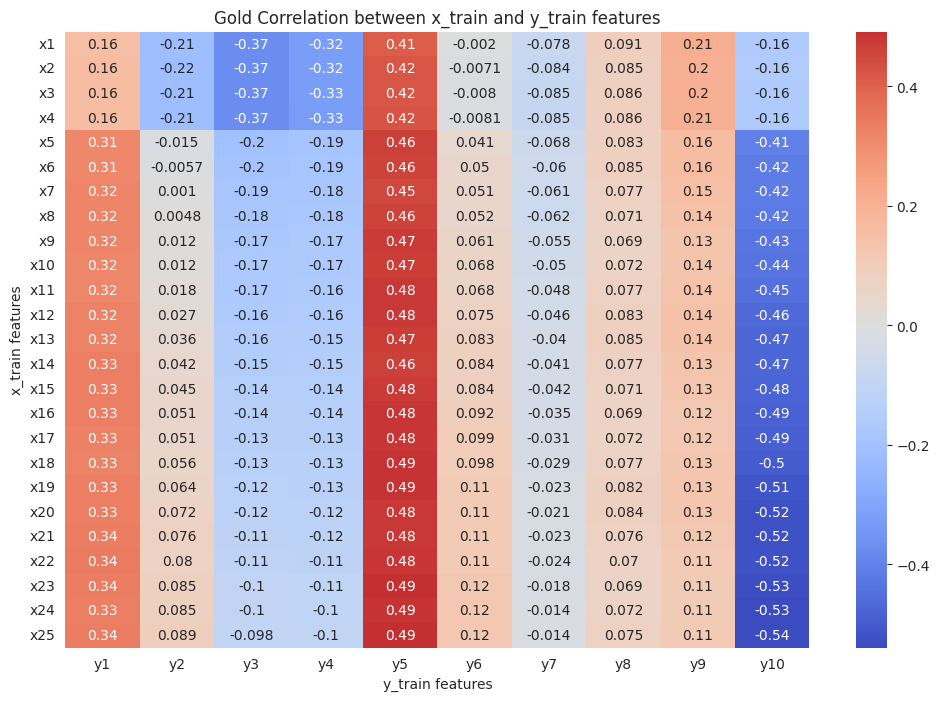

In [ ]:
x_dfg2 = pd.DataFrame(X_train_gReal, columns=[f'x{i+1}' for i in range(25)])
y_dfg2 = pd.DataFrame(y_train_gReal, columns=[f'y{i+1}' for i in range(10)])

correlation_dfg2 = pd.DataFrame(index=x_dfg2.columns, columns=y_dfg2.columns)

for x_col in x_dfg2.columns:
    for y_col in y_dfg2.columns:
        correlation_dfg2.loc[x_col, y_col] = x_dfg2[x_col].corr(y_dfg2[y_col])

# 将相关系数转换为浮点数
correlation_dfg2 = correlation_dfg2.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfg2, annot=True, cmap='coolwarm', center=0)
plt.title('Gold Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### Raw(-1,1)

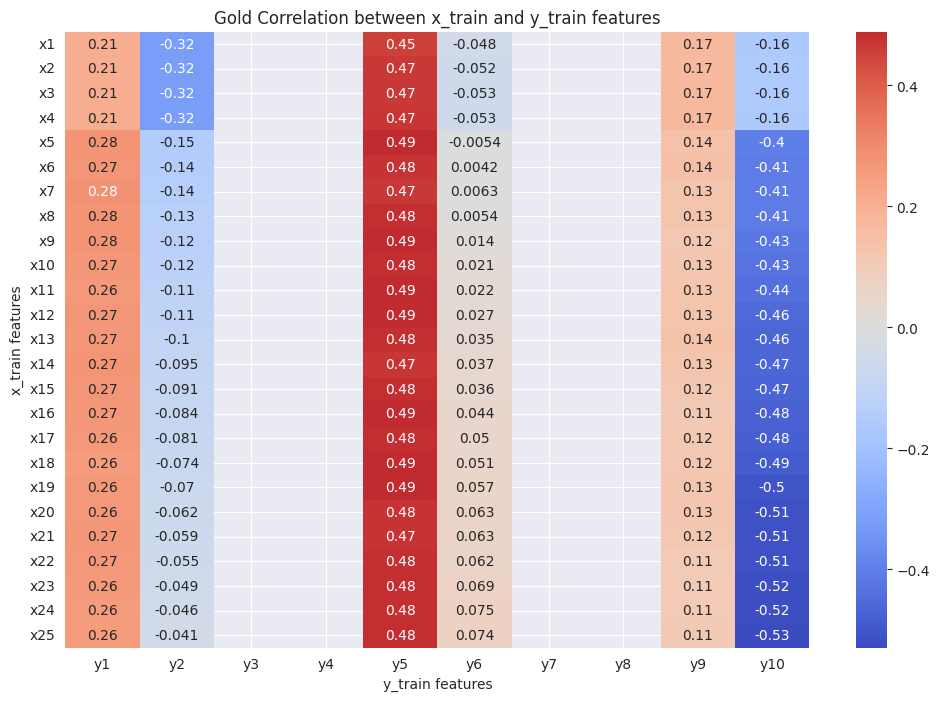

In [ ]:
x_dfg3 = pd.DataFrame(X_train_gReal, columns=[f'x{i+1}' for i in range(25)])
y_dfg3 = pd.DataFrame(y_train_gRegReal, columns=[f'y{i+1}' for i in range(10)])

correlation_dfg3 = pd.DataFrame(index=x_dfg3.columns, columns=y_dfg3.columns)

for x_col in x_dfg3.columns:
    for y_col in y_dfg3.columns:
        correlation_dfg3.loc[x_col, y_col] = x_dfg3[x_col].corr(y_dfg3[y_col])

# 将相关系数转换为浮点数
correlation_dfg3 = correlation_dfg3.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_dfg3, annot=True, cmap='coolwarm', center=0)
plt.title('Gold Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

## Silver

### BootAll (0-1)

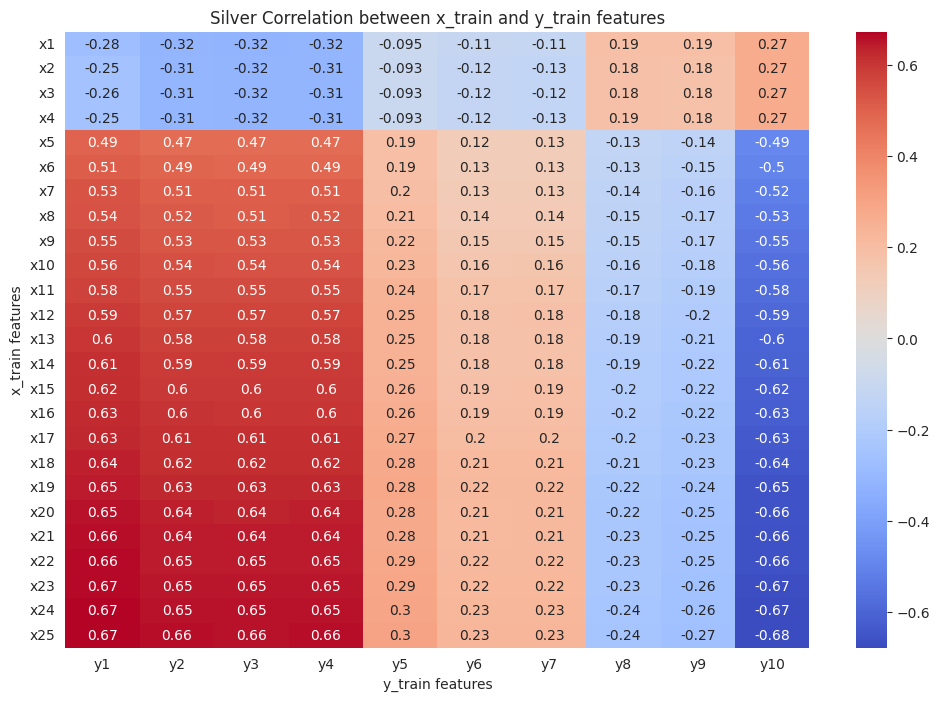

In [ ]:
# 将 x_train 和 y_train 转换为 DataFrame
x_df = pd.DataFrame(X_train_s, columns=[f'x{i+1}' for i in range(25)])
y_df = pd.DataFrame(y_train_s, columns=[f'y{i+1}' for i in range(10)])

# 初始化存储相关系数的 DataFrame
correlation_df = pd.DataFrame(index=x_df.columns, columns=y_df.columns)

# 计算每个 x 特征与每个 y 特征之间的相关系数
for x_col in x_df.columns:
    for y_col in y_df.columns:
        correlation_df.loc[x_col, y_col] = x_df[x_col].corr(y_df[y_col])

# 将相关系数转换为浮点数
correlation_df = correlation_df.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_df, annot=True, cmap='coolwarm', center=0)
plt.title('Silver Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### BootAll(-1,1)

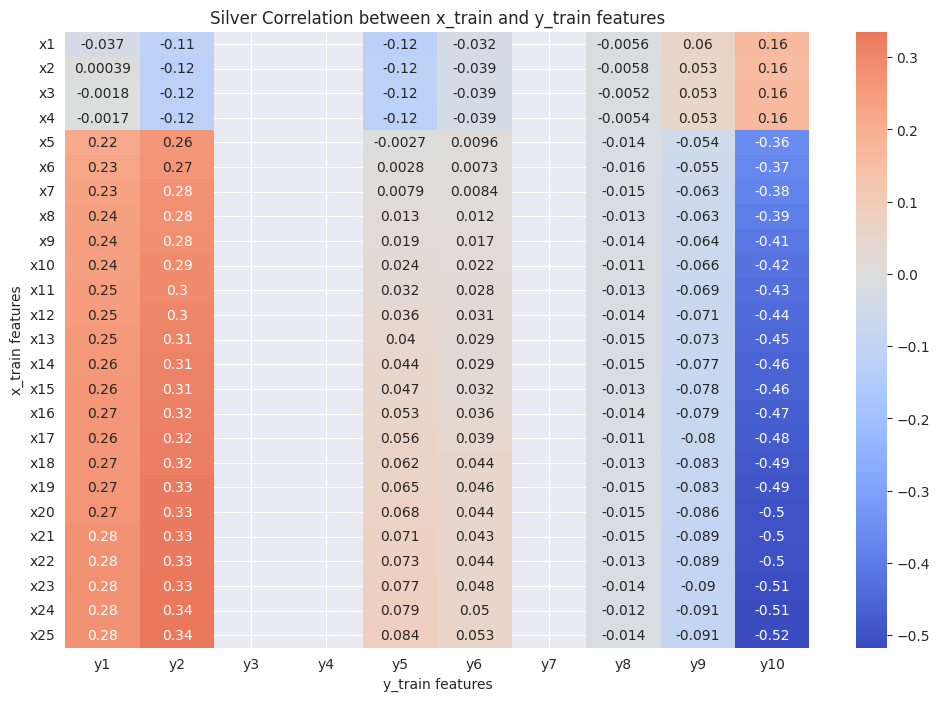

In [ ]:
# 将 x_train 和 y_train 转换为 DataFrame
x_df1 = pd.DataFrame(X_train_s, columns=[f'x{i+1}' for i in range(25)])
y_df1 = pd.DataFrame(y_train_sReg, columns=[f'y{i+1}' for i in range(10)])

# 初始化存储相关系数的 DataFrame
correlation_df1 = pd.DataFrame(index=x_df1.columns, columns=y_df1.columns)

# 计算每个 x 特征与每个 y 特征之间的相关系数
for x_col in x_df1.columns:
    for y_col in y_df1.columns:
        correlation_df1.loc[x_col, y_col] = x_df1[x_col].corr(y_df1[y_col])

# 将相关系数转换为浮点数
correlation_df1 = correlation_df1.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_df1, annot=True, cmap='coolwarm', center=0)
plt.title('Silver Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### Raw (0-1)

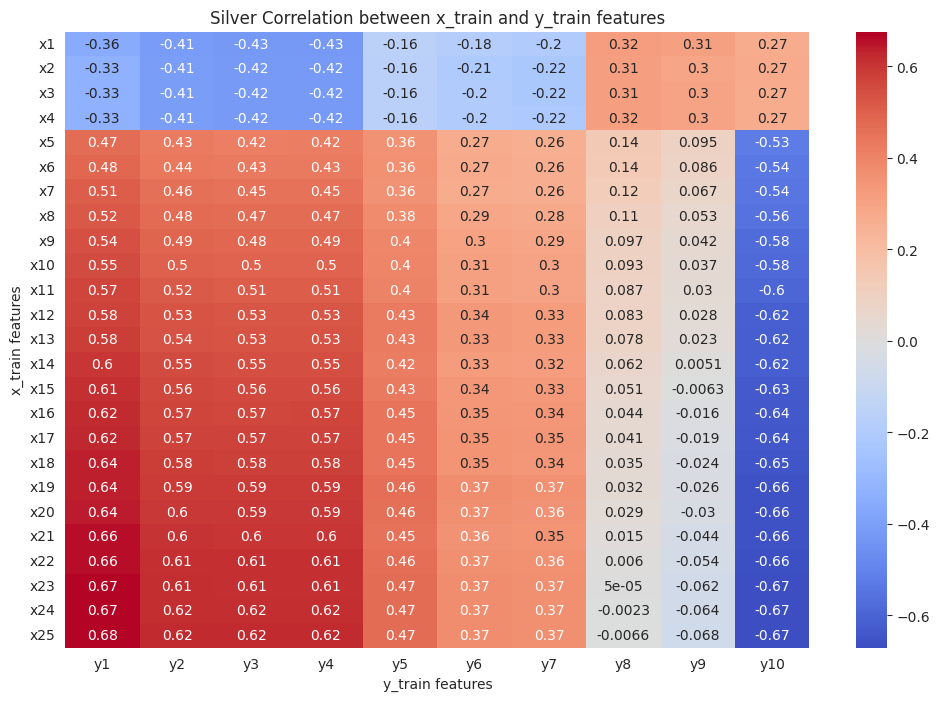

In [ ]:
# 将 x_train 和 y_train 转换为 DataFrame
x_df2 = pd.DataFrame(X_train_sReal, columns=[f'x{i+1}' for i in range(25)])
y_df2 = pd.DataFrame(y_train_sReal, columns=[f'y{i+1}' for i in range(10)])

# 初始化存储相关系数的 DataFrame
correlation_df2= pd.DataFrame(index=x_df2.columns, columns=y_df2.columns)

# 计算每个 x 特征与每个 y 特征之间的相关系数
for x_col in x_df2.columns:
    for y_col in y_df2.columns:
        correlation_df2.loc[x_col, y_col] = x_df2[x_col].corr(y_df2[y_col])

# 将相关系数转换为浮点数
correlation_df2 = correlation_df2.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_df2, annot=True, cmap='coolwarm', center=0)
plt.title('Silver Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### Raw(-1,1)

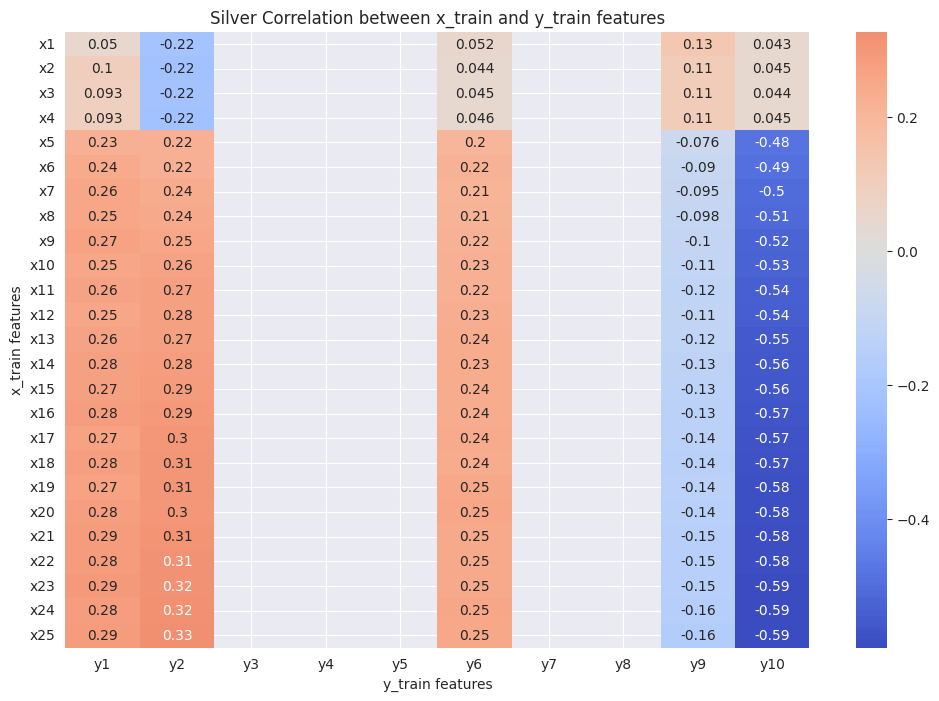

In [ ]:
# 将 x_train 和 y_train 转换为 DataFrame
x_df3 = pd.DataFrame(X_train_sReal, columns=[f'x{i+1}' for i in range(25)])
y_df3 = pd.DataFrame(y_train_sRegReal, columns=[f'y{i+1}' for i in range(10)])

# 初始化存储相关系数的 DataFrame
correlation_df3 = pd.DataFrame(index=x_df3.columns, columns=y_df3.columns)

# 计算每个 x 特征与每个 y 特征之间的相关系数
for x_col in x_df3.columns:
    for y_col in y_df3.columns:
        correlation_df3.loc[x_col, y_col] = x_df3[x_col].corr(y_df3[y_col])

# 将相关系数转换为浮点数
correlation_df3 = correlation_df3.astype(float)

# 绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_df3, annot=True, cmap='coolwarm', center=0)
plt.title('Silver Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

### Raw (-1,1)

## Correlation

In [ ]:
# 确定较小的样本数量
n_samples = min(X_train_s.shape[0], X_train_g.shape[0], X_train_so.shape[0], X_train_p.shape[0], X_train_c.shape[0])

In [ ]:
# 合并 x_train_s 和 x_train_g
x_train_combined = np.concatenate((X_train_s[:n_samples], X_train_g[:n_samples], X_train_so[:n_samples], X_train_p[:n_samples], X_train_c[:n_samples]), axis=1)

x_dfC = pd.DataFrame(x_train_combined, columns=[f'x{i+1}' for i in range(len(x_train_combined[0]))])

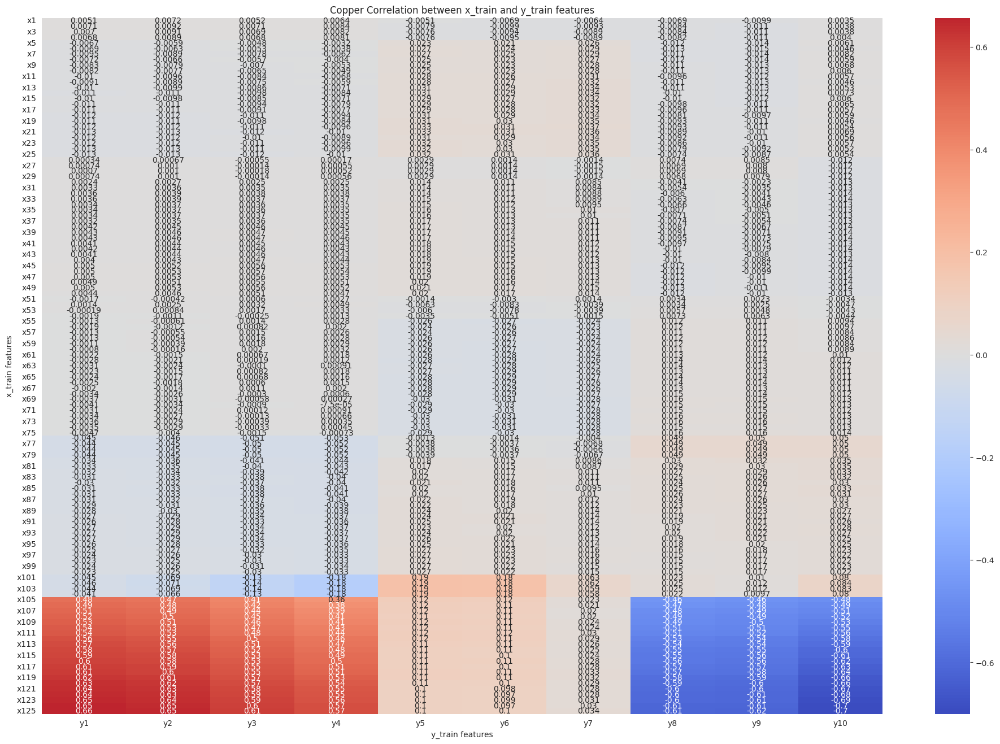

In [ ]:
correlation_dfCc = pd.DataFrame(index=x_dfC.columns, columns=y_dfc.columns)

for x_col in x_dfC.columns:
    for y_col in y_dfc.columns:
        correlation_dfCc.loc[x_col, y_col] = x_dfC[x_col].corr(y_dfc[y_col])

# 将相关系数转换为浮点数
correlation_dfCc = correlation_dfCc.astype(float)

# 绘制热图
plt.figure(figsize=(24, 16))
sns.heatmap(correlation_dfCc, annot=True, cmap='coolwarm', center=0)
plt.title('Copper Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

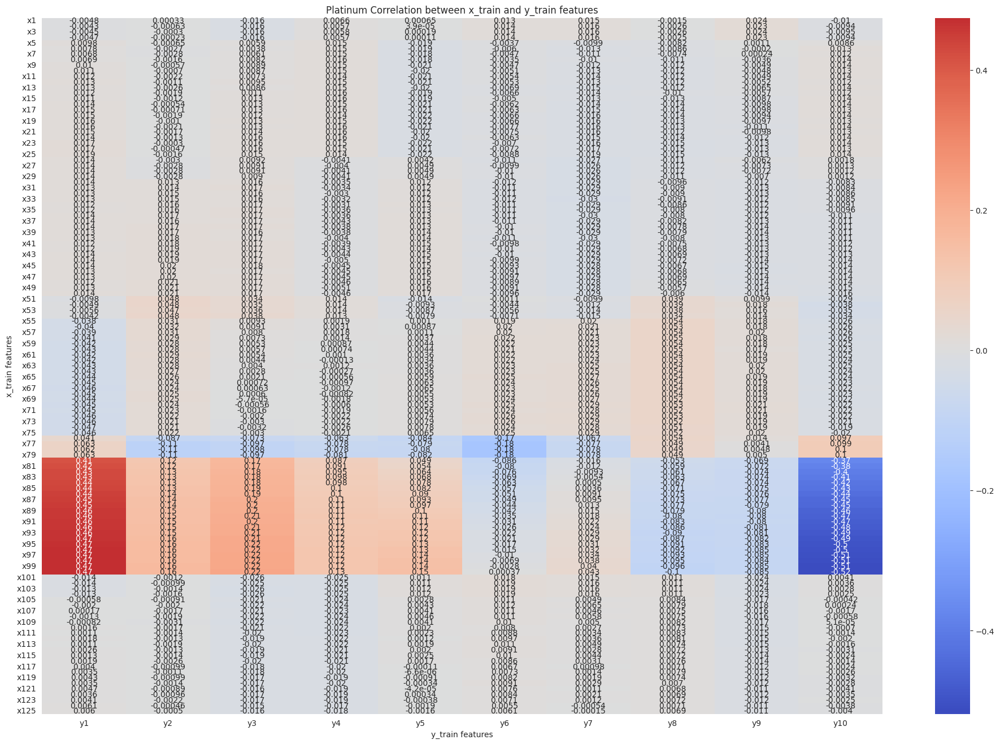

In [ ]:
correlation_dfCp = pd.DataFrame(index=x_dfC.columns, columns=y_dfp.columns)

for x_col in x_dfC.columns:
    for y_col in y_dfp.columns:
        correlation_dfCp.loc[x_col, y_col] = x_dfC[x_col].corr(y_dfp[y_col])

correlation_dfCp = correlation_dfCp.astype(float)

# 绘制热图
plt.figure(figsize=(24, 16))
sns.heatmap(correlation_dfCp, annot=True, cmap='coolwarm', center=0)
plt.title('Platinum Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

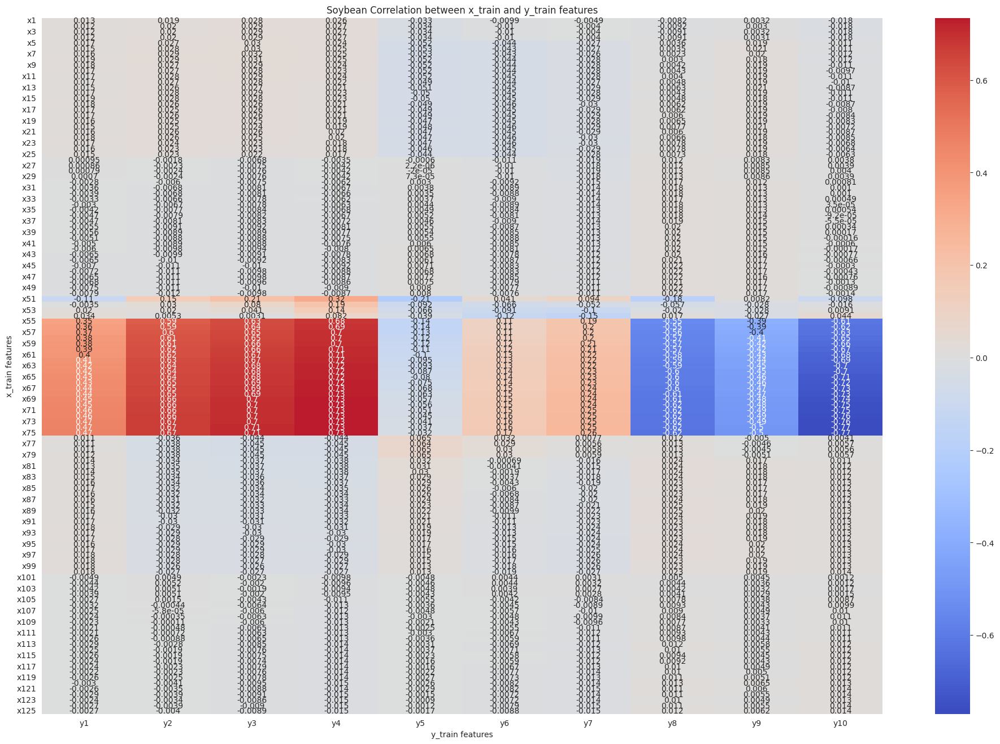

In [ ]:
correlation_dfCso = pd.DataFrame(index=x_dfC.columns, columns=y_dfso.columns)

for x_col in x_dfC.columns:
    for y_col in y_dfso.columns:
        correlation_dfCso.loc[x_col, y_col] = x_dfC[x_col].corr(y_dfso[y_col])

# 将相关系数转换为浮点数
correlation_dfCso = correlation_dfCso.astype(float)

# 绘制热图
plt.figure(figsize=(24, 16))
sns.heatmap(correlation_dfCso, annot=True, cmap='coolwarm', center=0)
plt.title('Soybean Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

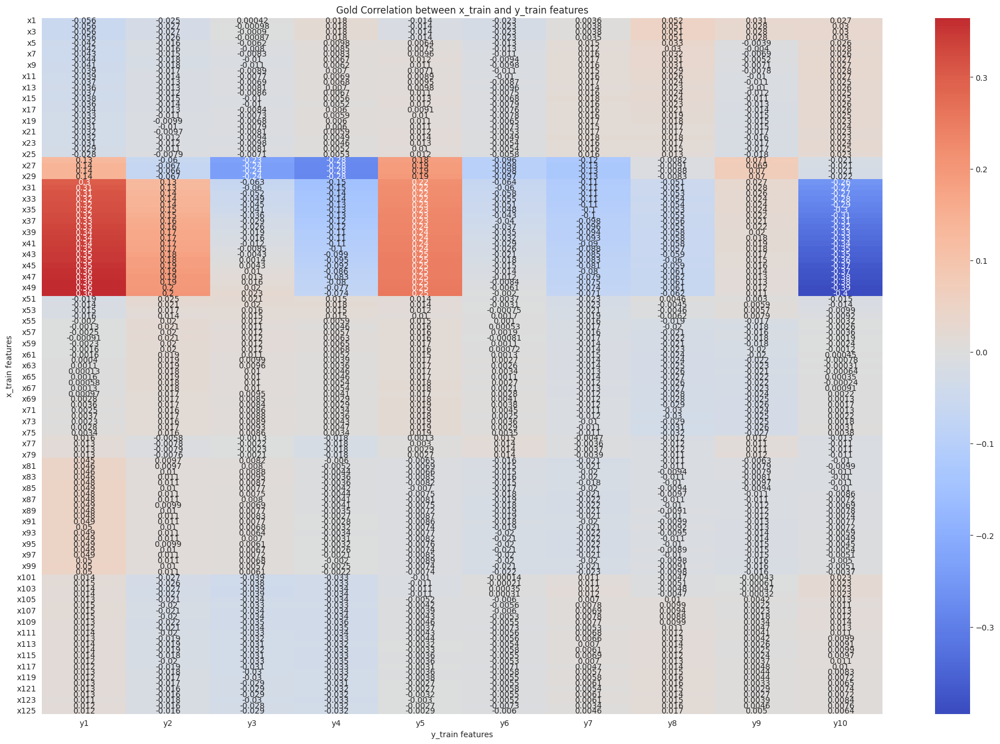

In [ ]:
correlation_dfCg = pd.DataFrame(index=x_dfC.columns, columns=y_dfg.columns)

for x_col in x_dfC.columns:
    for y_col in y_dfg.columns:
        correlation_dfCg.loc[x_col, y_col] = x_dfC[x_col].corr(y_dfg[y_col])

# 将相关系数转换为浮点数
correlation_dfCg = correlation_dfCg.astype(float)

# 绘制热图
plt.figure(figsize=(24, 16))
sns.heatmap(correlation_dfCg, annot=True, cmap='coolwarm', center=0)
plt.title('Gold Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

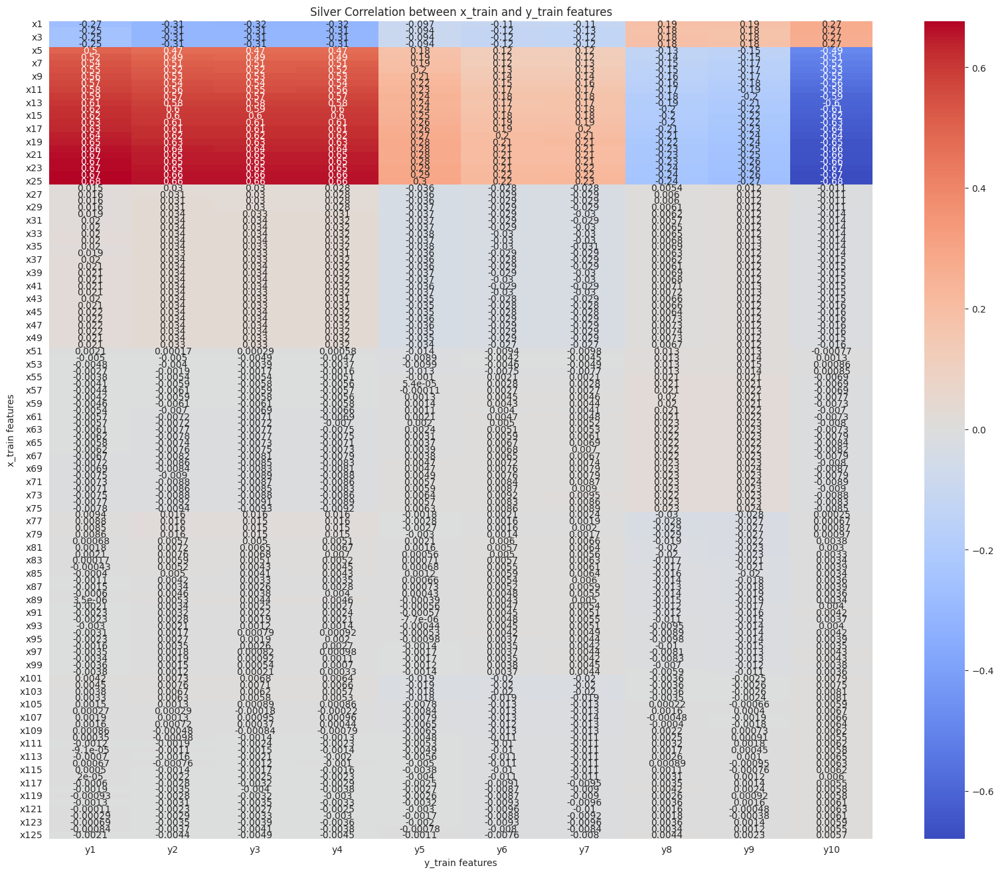

In [ ]:
# 初始化存储相关系数的 DataFrame
correlation_dfC = pd.DataFrame(index=x_dfC.columns, columns=y_df.columns)

# 计算每个 x 特征与每个 y 特征之间的相关系数
for x_col in x_dfC.columns:
    for y_col in y_df.columns:
        correlation_dfC.loc[x_col, y_col] = x_dfC[x_col].corr(y_df[y_col])

# 将相关系数转换为浮点数
correlation_dfC = correlation_dfC.astype(float)

# 绘制热图
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_dfC, annot=True, cmap='coolwarm', center=0)
plt.title('Silver Correlation between x_train and y_train features')
plt.xlabel('y_train features')
plt.ylabel('x_train features')
plt.show()

            Silver_b    Gold_b  SoyBean_b  Platinum_b  Copper_b
Silver_b    1.000000  0.854978   0.814534    0.751052  0.791525
Gold_b      0.854978  1.000000   0.741342    0.424799  0.666640
SoyBean_b   0.814534  0.741342   1.000000    0.672682  0.891761
Platinum_b  0.751052  0.424799   0.672682    1.000000  0.706002
Copper_b    0.791525  0.666640   0.891761    0.706002  1.000000


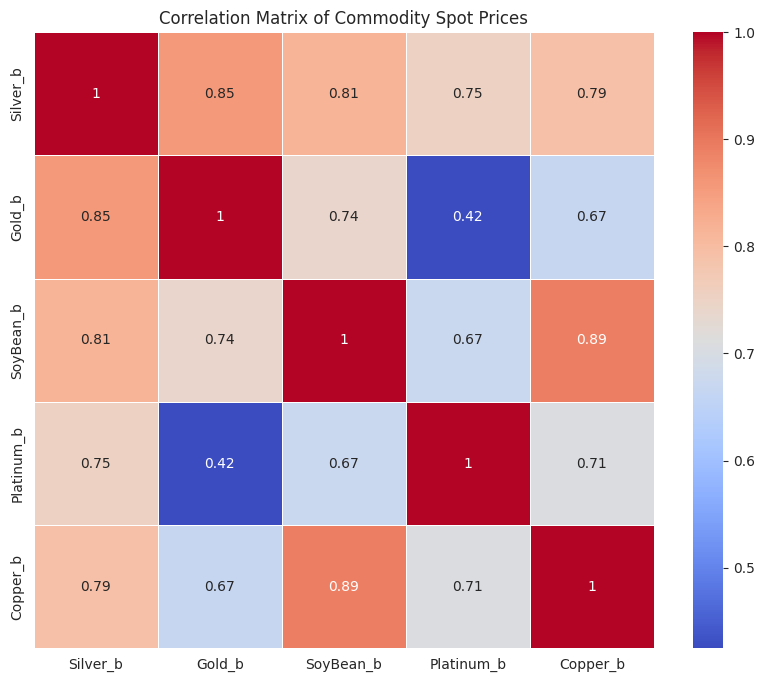

In [ ]:
cor_b = df_b.corr()

print(cor_b)

plt.figure(figsize=(10, 8))
sns.heatmap(cor_b, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Commodity Spot Prices')
plt.show()

            Silver      Gold   SoyBean  Platinum    Copper
Silver    1.000000  0.853093  0.806279  0.746852  0.785342
Gold      0.853093  1.000000  0.737616  0.424581  0.664056
SoyBean   0.806279  0.737616  1.000000  0.658668  0.887151
Platinum  0.746852  0.424581  0.658668  1.000000  0.694893
Copper    0.785342  0.664056  0.887151  0.694893  1.000000


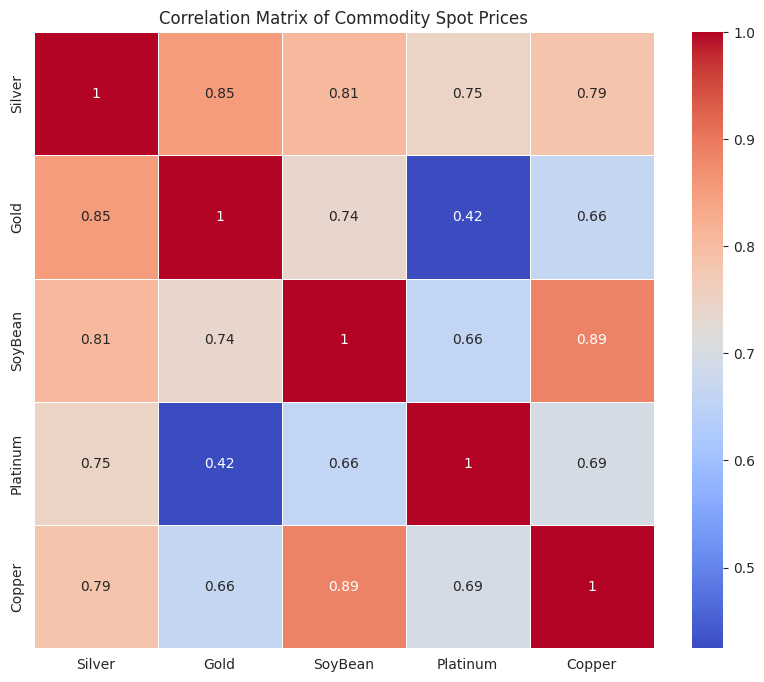

In [ ]:
# 計算相關性矩陣
correlation_matrix = df.corr()

# 打印相關性矩陣
print(correlation_matrix)

# 可視化相關性矩陣
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Commodity Spot Prices')
plt.show()

# 再來先針對資料做標準化，準備進行學習

### silver

In [ ]:
from sklearn.preprocessing import StandardScaler

scalers = StandardScaler()
scalers.fit(x_bs_train_wReg_s)
x_bs_train_wReg_s_s = scalers.transform(x_bs_train_wReg_s)
x_val_wReg_s_s = scalers.transform(x_val_wReg_s)

scalers2 = StandardScaler()
scalers2.fit(x_bs_train_ws)
x_bs_train_ws_s = scalers2.transform(x_bs_train_ws)
x_val_ws_s = scalers2.transform(x_val_ws)

scalersR = StandardScaler()
scalersR.fit(x_bs_train_wsR)
x_bs_train_wsR_s = scalersR.transform(x_bs_train_wsR)
x_val_wsR_s = scalersR.transform(x_val_wsR)

scalersR2 = StandardScaler()
scalersR2.fit(x_bs_train_wReg_sR)
x_bs_train_wReg_sR_s = scalersR2.transform(x_bs_train_wReg_sR)
x_val_wReg_sR_s = scalersR2.transform(x_val_wReg_sR)

# scalerRRaw = StandardScaler()
# scalerRRaw.fit(x_train_wRaw_s)
# x_train_wRaw_s_s = scalerRRaw.transform(x_train_wRaw_s)
# x_val_wRaw_s_s = scalerRRaw.transform(x_val_wRaw_s)

# scalerRRawReg = StandardScaler()
# scalerRRawReg.fit(x_train_RawReg_s)
# x_train_RawReg_s_s = scalerRRawReg.transform(x_train_RawReg_s)
# x_val_RawReg_s_s = scalerRRawReg.transform(x_val_RawReg_s)

In [ ]:
X_train_sReg=x_bs_train_wReg_s_s
y_train_sReg=y_bs_train_wReg_s
X_test_sReg=x_val_wReg_s_s
y_test_sReg=y_val_wReg_s

X_train_s=x_bs_train_ws_s
y_train_s=y_bs_train_ws
X_test_s=x_val_ws_s
y_test_s=y_val_ws

X_train_sReal=x_bs_train_wsR_s
y_train_sReal=y_bs_train_wsR
X_test_sReal=x_val_wsR_s
y_test_sReal=y_val_wsR

X_train_sRegReal=x_bs_train_wReg_sR_s
y_train_sRegReal=y_bs_train_wReg_sR
X_test_sRegReal=x_val_wReg_sR_s
y_test_sRegReal=y_val_wReg_sR

# X_train_sRawReal=x_train_wRaw_s_s
# y_train_sRawReal=y_train_wRaw_s
# X_test_sRawReal=x_val_wRaw_s_s
# y_test_sRawReal=y_val_wRaw_s

# X_train_sRawRegReal=x_train_RawReg_s_s
# y_train_sRawRegReal=y_train_RawReg_s
# X_test_sRawRegReal=x_val_RawReg_s_s

In [ ]:
x_bs_train_wReg_sTrim = [d[:4] for d in x_bs_train_wReg_s]
x_val_wReg_sTrim = [d[:4] for d in x_val_wReg_s]

scalersTrim = StandardScaler()
scalersTrim.fit(x_bs_train_wReg_sTrim)
x_bs_train_wReg_sTrim_s = scalersTrim.transform(x_bs_train_wReg_sTrim)
x_val_wReg_sTrim_s = scalersTrim.transform(x_val_wReg_sTrim)

x_bs_train_wReg_sTrim = np.array(x_bs_train_wReg_sTrim)
x_val_wReg_sTrim = np.array(x_val_wReg_sTrim)

x_bs_train_ws_sTrim = [d[:4] for d in x_bs_train_ws]
x_val_ws_sTrim = [d[:4] for d in x_val_ws]

scalersTrim2 = StandardScaler()
scalersTrim2.fit(x_bs_train_ws_sTrim)
x_bs_train_ws_sTrim_s = scalersTrim2.transform(x_bs_train_ws_sTrim)
x_val_ws_sTrim_s = scalersTrim2.transform(x_val_ws_sTrim)

x_bs_train_ws_sTrim = np.array(x_bs_train_ws_sTrim)
x_val_ws_sTrim = np.array(x_val_ws_sTrim)

### gold

In [ ]:
from sklearn.preprocessing import StandardScaler

scalerg = StandardScaler()
scalerg.fit(x_bs_train_wReg_g)
x_bs_train_wReg_g_s = scalerg.transform(x_bs_train_wReg_g)
x_val_wReg_g_s = scalerg.transform(x_val_wReg_g)

scalerg2 = StandardScaler()
scalerg2.fit(x_bs_train_wg)
x_bs_train_wg_s = scalerg2.transform(x_bs_train_wg)
x_val_wg_s = scalerg2.transform(x_val_wg)

scalergR = StandardScaler()
scalergR.fit(x_bs_train_wReg_gR)
x_bs_train_wReg_gR_s = scalergR.transform(x_bs_train_wReg_gR)
x_val_wReg_gR_s = scalergR.transform(x_val_wReg_gR)

scalergR2 = StandardScaler()
scalergR2.fit(x_bs_train_wgR)
x_bs_train_wgR_s = scalergR2.transform(x_bs_train_wgR)
x_val_wgR_s = scalergR2.transform(x_val_wgR)

# scalergRR = StandardScaler()
# scalergRR.fit(x_bs_train_wRaw_g)
# x_bs_train_wRaw_g_s = scalergRR.transform(x_bs_train_wRaw_g)
# x_val_wRaw_g_s = scalergRR.transform(x_val_wRaw_g)

# scalergRR2 = StandardScaler()
# scalergRR2.fit(x_bs_train_RawReg_g)
# x_bs_train_RawReg_g_s = scalergRR2.transform(x_bs_train_RawReg_g)
# x_val_RawReg_g_s = scalergRR2.transform(x_val_RawReg_g)

In [ ]:
x_bs_train_wReg_g_sTrim = [d[:4] for d in x_bs_train_wReg_g_s]
x_val_wReg_g_sTrim = [d[:4] for d in x_val_wReg_g_s]

scalersTrim_g = StandardScaler()
scalersTrim_g.fit(x_bs_train_wReg_g_sTrim)
x_bs_train_wReg_g_sTrim_s = scalersTrim_g.transform(x_bs_train_wReg_g_sTrim)
x_val_wReg_g_sTrim_s = scalersTrim_g.transform(x_val_wReg_g_sTrim)

x_bs_train_wReg_g_sTrim = np.array(x_bs_train_wReg_g_sTrim)
x_val_wReg_g_sTrim = np.array(x_val_wReg_g_sTrim)

x_bs_train_wg_sTrim = [d[:4] for d in x_bs_train_wg_s]
x_val_wg_sTrim = [d[:4] for d in x_val_wg_s]

scalersTrim_g2 = StandardScaler()
scalersTrim_g2.fit(x_bs_train_wg_sTrim)
x_bs_train_wg_sTrim_s = scalersTrim_g2.transform(x_bs_train_wg_sTrim)
x_val_wg_sTrim_s = scalersTrim_g2.transform(x_val_wg_sTrim)

In [ ]:
X_train_gReg = x_bs_train_wReg_g_s
X_test_gReg = x_val_wReg_g_s
y_train_gReg = y_bs_train_wReg_g
y_test_gReg = y_val_wReg_g

X_train_g = x_bs_train_wg_s
X_test_g = x_val_wg_s
y_train_g = y_bs_train_wg
y_test_g = y_val_wg

X_train_gRegReal = x_bs_train_wReg_gR_s
X_test_gRegReal = x_val_wReg_gR_s
y_train_gRegReal = y_bs_train_wReg_gR
y_test_gRegReal = y_val_wReg_gR

X_train_gReal = x_bs_train_wgR_s
X_test_gReal = x_val_wgR_s
y_train_gReal = y_bs_train_wgR
y_test_gReal = y_val_wgR

# X_train_gRawReal = x_bs_train_wRaw_g_s
# X_test_gRawReal = x_val_wRaw_g_s
# y_train_gRawReal = y_bs_train_wRaw_g
# y_test_gRawReal = y_val_wRaw_g

# X_train_gRawRegReal = x_bs_train_RawReg_g_s
# X_test_gRawRegReal = x_val_RawReg_g_s
# y_train_gRawRegReal = y_bs_train_RawReg_g
# y_test_gRawRegReal = y_val_RawReg_g

### soybean

In [ ]:
from sklearn.preprocessing import StandardScaler

scalerso = StandardScaler()
scalerso.fit(x_bs_train_wReg_so)
x_bs_train_wReg_so_s = scalerso.transform(x_bs_train_wReg_so)
x_val_wReg_so_s = scalerso.transform(x_val_wReg_so)

scalersso2 = StandardScaler()
scalersso2.fit(x_bs_train_wso)
x_bs_train_wso_s = scalersso2.transform(x_bs_train_wso)
x_val_wso_s = scalersso2.transform(x_val_wso)

scalersoR = StandardScaler()
scalersoR.fit(x_bs_train_wReg_soR)
x_bs_train_wReg_soR_s = scalersoR.transform(x_bs_train_wReg_soR)
x_val_wReg_soR_s = scalersoR.transform(x_val_wReg_soR)

scalersoR2 = StandardScaler()
scalersoR2.fit(x_bs_train_wsoR)
x_bs_train_wsoR_s = scalersoR2.transform(x_bs_train_wsoR)
x_val_wsoR_s = scalersoR2.transform(x_val_wsoR)

# scalersoRR = StandardScaler()
# scalersoRR.fit(x_bs_train_wRaw_so)
# x_bs_train_wRaw_so_s = scalersoRR.transform(x_bs_train_wRaw_so)
# x_val_wRaw_so_s = scalersoRR.transform(x_val_wRaw_so)

# scalersoRR2 = StandardScaler()
# scalersoRR2.fit(x_bs_train_RawReg_so)
# x_bs_train_RawReg_so_s = scalersoRR2.transform(x_bs_train_RawReg_so)
# x_val_RawReg_so_s = scalersoRR2.transform(x_val_RawReg_so)

In [ ]:
X_train_soReg = x_bs_train_wReg_so_s
y_train_soReg = y_bs_train_wReg_so
X_test_soReg = x_val_wReg_so_s
y_test_soReg = y_val_wReg_so

X_train_so = x_bs_train_wso_s
y_train_so = y_bs_train_wso
X_test_so = x_val_wso_s
y_test_so = y_val_wso

X_train_soRegReal = x_bs_train_wReg_soR_s
y_train_soRegReal = y_bs_train_wReg_soR
X_test_soRegReal = x_val_wReg_soR_s
y_test_soRegReal = y_val_wReg_soR

X_train_soReal = x_bs_train_wsoR_s
y_train_soReal = y_bs_train_wsoR
X_test_soReal = x_val_wsoR_s
y_test_soReal = y_val_wsoR

# X_train_soRawReal = x_bs_train_wRaw_so_s
# y_train_soRawReal = y_bs_train_wRaw_so
# X_test_soRawReal = x_val_wRaw_so_s

# X_train_soRawRegReal = x_bs_train_RawReg_so_s
# y_train_soRawRegReal = y_bs_train_RawReg_so
# X_test_soRawRegReal = x_val_RawReg_so_s

### platinum

In [ ]:
from sklearn.preprocessing import StandardScaler

scalerp = StandardScaler()
scalerp.fit(x_bs_train_wReg_p)
x_bs_train_wReg_p_s = scalerp.transform(x_bs_train_wReg_p)
x_val_wReg_p_s = scalerp.transform(x_val_wReg_p)

scalersp2 = StandardScaler()
scalersp2.fit(x_bs_train_wp)
x_bs_train_wp_s = scalersp2.transform(x_bs_train_wp)
x_val_wp_s = scalersp2.transform(x_val_wp)

scalerpR = StandardScaler()
scalerpR.fit(x_bs_train_wReg_pR)
x_bs_train_wReg_pR_s = scalerpR.transform(x_bs_train_wReg_pR)
x_val_wReg_pR_s = scalerpR.transform(x_val_wReg_pR)

scalerpR2 = StandardScaler()
scalerpR2.fit(x_bs_train_wpR)
x_bs_train_wpR_s = scalerpR2.transform(x_bs_train_wpR)
x_val_wpR_s = scalerpR2.transform(x_val_wpR)

# scalerpRR = StandardScaler()
# scalerpRR.fit(x_bs_train_wRaw_p)
# x_bs_train_wRaw_p_s = scalerpRR.transform(x_bs_train_wRaw_p)
# x_val_wRaw_p_s = scalerpRR.transform(x_val_wRaw_p)

# scalerpRR2 = StandardScaler()
# scalerpRR2.fit(x_bs_train_RawReg_p)
# x_bs_train_RawReg_p_s = scalerpRR2.transform(x_bs_train_RawReg_p)
# x_val_RawReg_p_s = scalerpRR2.transform(x_val_RawReg_p)

In [ ]:
X_train_pReg = x_bs_train_wReg_p_s
y_train_pReg = y_bs_train_wReg_p
X_test_pReg = x_val_wReg_p_s
y_test_pReg = y_val_wReg_p

X_train_p = x_bs_train_wp_s
y_train_p = y_bs_train_wp
X_test_p = x_val_wp_s
y_test_p = y_val_wp

X_train_pRegReal = x_bs_train_wReg_pR_s
y_train_pRegReal = y_bs_train_wReg_pR
X_test_pRegReal = x_val_wReg_pR_s
y_test_pRegReal = y_val_wReg_pR

X_train_pReal = x_bs_train_wpR_s
y_train_pReal = y_bs_train_wpR
X_test_pReal = x_val_wpR_s
y_test_pReal = y_val_wpR

# X_train_pRawReal = x_bs_train_wRaw_p_s
# y_train_pRawReal = y_bs_train_wRaw_p
# X_test_pRawReal = x_val_wRaw_p_s

# X_train_pRawRegReal = x_bs_train_RawReg_p_s
# y_train_pRawRegReal = y_bs_train_RawReg_p
# X_test_pRawRegReal = x_val_RawReg_p_s

### copper

In [ ]:
from sklearn.preprocessing import StandardScaler

scalerc = StandardScaler()
scalerc.fit(x_bs_train_wc)
x_bs_train_wc_s = scalerc.transform(x_bs_train_wc)
x_val_wc_s = scalerc.transform(x_val_wc)

scalerc2 = StandardScaler()
scalerc2.fit(x_bs_train_wReg_c)
x_bs_train_cReg_s = scalerc2.transform(x_bs_train_wReg_c)
x_val_wReg_c_s = scalerc2.transform(x_val_wReg_c)

scalercR = StandardScaler()
scalercR.fit(x_bs_train_wReg_cR)
x_bs_train_wReg_cR_s = scalercR.transform(x_bs_train_wReg_cR)
x_val_wReg_cR_s = scalercR.transform(x_val_wReg_cR)

scalercR2 = StandardScaler()
scalercR2.fit(x_bs_train_wcR)
x_bs_train_wcR_s = scalercR2.transform(x_bs_train_wcR)
x_val_wcR_s = scalercR2.transform(x_val_wcR)

# scalercRR = StandardScaler()
# scalercRR.fit(x_bs_train_wRaw_c)
# x_bs_train_wRaw_c_s = scalercRR.transform(x_bs_train_wRaw_c)
# x_val_wRaw_c_s = scalercRR.transform(x_val_wRaw_c)

# scalercRR2 = StandardScaler()
# scalercRR2.fit(x_bs_train_RawReg_c)
# x_bs_train_RawReg_c_s = scalercRR2.transform(x_bs_train_RawReg_c)
# x_val_RawReg_c_s = scalercRR2.transform(x_val_RawReg_c)

In [ ]:
X_train_cReg = x_bs_train_cReg_s
X_test_cReg = x_val_wReg_c_s
y_train_cReg= y_bs_train_wReg_c
y_test_cReg = y_val_wReg_c

X_train_c=x_bs_train_wc_s
X_test_c=x_val_wc
y_train_c=y_bs_train_wc
y_test_c=y_val_wc

X_train_cRegReal = x_bs_train_wReg_cR_s
X_test_cRegReal = x_val_wReg_cR_s
y_train_cRegReal = y_bs_train_wReg_cR
y_test_cRegReal = y_val_wReg_cR

X_train_cReal = x_bs_train_wcR_s
X_test_cReal = x_val_wcR_s
y_train_cReal = y_bs_train_wcR
y_test_cReal = y_val_wcR

# X_train_cRawReal = x_bs_train_wRaw_c_s
# X_test_cRawReal = x_val_wRaw_c_s
# y_train_cRawReal = y_bs_train_wRaw_c

# X_train_cRawRegReal = x_bs_train_RawReg_c_s
# X_test_cRawRegReal = x_val_RawReg_c_s
# y_train_cRawRegReal = y_bs_train_RawReg_c

# 模型訓練結果

In [ ]:
save_path='/content/drive/MyDrive/iLovePDF'

### Configuration

In [ ]:
!pip install scikit-learn tensorflow

In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
overallUnits=[24, 32, 64, 128, 256]

### silver

In [ ]:
pip install hyperopt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.3/491.3 kB 38.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.5/200.5 kB 19.9 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
from tensorflow.keras import Sequential, Input, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, LeakyReLU, Layer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.constraints import MaxNorm
import numpy as np
import os
import warnings
import ast
from functools import partial
from sklearn.model_selection import GridSearchCV
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK


os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
warnings.filterwarnings("ignore")

def get_best_hyparams(X_train, X_test, Y_train, LossFunc):
    def build_model(hparams):
        input_shape = (X_train.shape[1],)
        layerType='noneasy'
        neurons_fe=24
        lossFunc=0
        neurons_reg=24
        # Feature Extraction
        feature_extractor = keras.Sequential()
        if layerType == 'easy':
            feature_extractor.add(
                keras.layers.Dense(
                units=hp.Int('units_feature_extractor', min_value=32, max_value=512, step=32),
                input_shape=input_shape,
                kernel_regularizer=l2(hparams['l2_reg']),
                activation='relu',
                kernel_constraint=MaxNorm(3)
            ))
            feature_extractor.add(Dropout(hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.1)))
        else:
            feature_extractor.add(
                keras.layers.Dense(
                units=hparams['units'],
                activation='relu',
                kernel_regularizer=l2(hparams['l2_reg']),
                kernel_constraint=MaxNorm(3)
            ))
            feature_extractor.add(BatchNormalization())
            feature_extractor.add(Dropout(hparams['dropout']))

            feature_extractor.add(
                keras.layers.Dense(
                units=hparams['units'],
                activation='relu',
                kernel_regularizer=l2(hparams['l2_reg']),
                kernel_constraint=MaxNorm(3)
            ))
            feature_extractor.add(BatchNormalization())
            feature_extractor.add(Dropout(hparams['dropout']))

            feature_extractor.add(
                keras.layers.Dense(
                neurons_fe,
                kernel_regularizer=l2(hparams['l2_reg']),
                kernel_constraint=MaxNorm(3),
                activation='relu'
            ))
            feature_extractor.add(Dropout(hparams['dropout']))

        # Regressor
        regressor = keras.Sequential()
        if layerType == 'easy':
            regressor.add(
                keras.layers.Dense(neurons_reg, activation='relu', kernel_constraint=MaxNorm(3)))
            regressor.add(Dropout(hparams['dropout']))
        else:
            regressor.add(
                keras.layers.Dense(
                units=hparams['units'],
                activation='relu',
                kernel_regularizer=l2(hparams['l2_reg']),
                kernel_constraint=MaxNorm(3)
            ))
            regressor.add(BatchNormalization())
            regressor.add(Dropout(hparams['dropout']))

            if lossFunc == 0:
                regressor.add(
                    keras.layers.Dense(10, activation='linear'))
            elif lossFunc == 1:
                regressor.add(
                    keras.layers.Dense(10, activation='tanh'))
            else:
                regressor.add(
                    keras.layers.Dense(10, activation='softmax'))

        inputs = Input(shape=input_shape)
        features = feature_extractor(inputs)
        outputs = regressor(features)

        model = Model(inputs=inputs, outputs=outputs)
        if lossFunc == 2:
            model.compile(
                optimizer=tf.keras.optimizers.Adam(hparams['learning_rate']),
                loss='kullback_leibler_divergence',
                metrics=['kullback_leibler_divergence']
            )
        else:
            model.compile(
                optimizer=tf.keras.optimizers.Adam(hparams['learning_rate']),
                loss='mse',
                metrics=['mse']
            )

        return model

    def objective(hparams):
        model = build_model(hparams)
        model.fit(X_train, Y_train, epochs=10, batch_size=20, verbose=0)
        loss, acc = model.evaluate(X_train, Y_train, verbose=0)
        return {'loss': -acc, 'status': STATUS_OK}

    space = {
        'units': hp.choice('units', [24, 32, 64, 128, 256]),
        'dropout': hp.uniform('dropout', 0.05, 0.5),
        'learning_rate': hp.loguniform('learning_rate', -10, -1),
        'l2_reg': hp.loguniform('l2_reg', -10, -1)
    }

    trials = Trials()
    best = fmin(objective, space, algo=tpe.suggest, max_evals=20, trials=trials)
    return best

In [ ]:
# Raw Data
raw_best = get_best_hyparams(X_train_sRegReal, X_test_sRegReal, y_train_sRegReal, 0)
raw_best1 = get_best_hyparams(X_train_sRegReal, X_test_sRegReal, y_train_sRegReal, 1)
raw_best2 = get_best_hyparams(X_train_s, X_test_s, y_train_s, 2)

# BootAll Data
boot_best = get_best_hyparams(X_train_sReg, X_test_sReg, y_train_sReg, 0)
boot_best1 = get_best_hyparams(X_train_sReg, X_test_sReg, y_train_sReg, 1)
boot_best2 = get_best_hyparams(X_train_s, X_test_s, y_train_s, 2)

100%|██████████| 20/20 [01:42<00:00,  5.12s/trial, best loss: -0.13441507518291473]


In [ ]:
s_dropoutRaw, s_lrRaw, s_rl2Raw, s_unitsRaw = raw_best['dropout'], raw_best['learning_rate'], raw_best['l2_reg'], overallUnits[raw_best['units']]
s_dropoutRaw1, s_lrRaw1, s_rl2Raw1, s_unitsRaw1 = raw_best1['dropout'], raw_best1['learning_rate'], raw_best1['l2_reg'], overallUnits[raw_best1['units']]
s_dropoutRaw2, s_lrRaw2, s_rl2Raw2, s_unitsRaw2 = raw_best2['dropout'], raw_best2['learning_rate'], raw_best2['l2_reg'], overallUnits[raw_best2['units']]

s_dropoutBoot, s_lrBoot, s_rl2Boot, s_unitsBoot = boot_best['dropout'], boot_best['learning_rate'], boot_best['l2_reg'], overallUnits[boot_best['units']]
s_dropoutBoot1, s_lrBoot1, s_rl2Boot1, s_unitsBoot1 = boot_best1['dropout'], boot_best1['learning_rate'], boot_best1['l2_reg'], overallUnits[boot_best1['units']]
s_dropoutBoot2, s_lrBoot2, s_rl2Boot2, s_unitsBoot2 = boot_best2['dropout'], boot_best2['learning_rate'], boot_best2['l2_reg'], overallUnits[boot_best2['units']]

#### no Wasserstein

In [ ]:
# TrainReal
## Raw
# yOutcomeListRaw = model_train(X_train_sRegReal, X_test_sRegReal, y_train_sRegReal, y_train_sRegReal, X_train_sRegReal, y_train_sRegReal, 'noteasy', 0, 0, 'silver', s_unitsRaw, s_lrRaw, s_dropoutRaw, s_rl2Raw, 1, 'train')
# yOutcomeListRaw1 = model_train(X_train_sRegReal, X_test_sRegReal, y_train_sRegReal, y_train_sRegReal, X_train_sRegReal, y_train_sRegReal, 'noteasy', 0, 1, 'silver', s_unitsRaw1, s_lrRaw1, s_dropoutRaw1, s_rl2Raw1, 1, 'train')
# yOutcomeListRaw2 = model_train(X_train_sReal, X_test_sReal, y_train_sReal, y_train_sReal, X_train_sReal, y_train_sReal, 'noteasy', 0, 2, 'silver', s_unitsRaw2, s_lrRaw2, s_dropoutRaw2, s_rl2Raw2, 1, 'train')

## BootAll
# yOutcomeList = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_train_sReg, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 0, 0, 'silver', s_unitsBoot, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'train')
# yOutcomeList1 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_train_sReg, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 0, 1, 'silver', s_unitsBoot1, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'train')
# yOutcomeList2 = model_train(X_train_s, X_test_s, y_train_s, y_train_s, x_final_wsR, y_final_wsR, 'noteasy', 0, 2, 'silver', s_unitsBoot2, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'train')

# ValReal
## Raw
# yValRaws = model_train(X_train_sRegReal, X_test_sRegReal, y_train_sRegReal, y_test_sRegReal, X_test_sRegReal, y_test_sRegReal, 'noteasy', 0, 0, 'silver', s_unitsRaw, s_lrRaw, s_dropoutRaw, s_rl2Raw, 1, 'val')
# yValRaws1 = model_train(X_train_sRegReal, X_test_sRegReal, y_train_sRegReal, y_test_sRegReal, X_test_sRegReal, y_test_sRegReal, 'noteasy', 0, 1, 'silver', s_unitsRaw1, s_lrRaw1, s_dropoutRaw1, s_rl2Raw1, 1, 'val')
# yValRaws2 = model_train(X_train_sReal, X_test_sReal, y_train_sReal, y_train_sReal, X_test_sReal, y_test_sReal, 'noteasy', 0, 2, 'silver', s_unitsRaw2, s_lrRaw2, s_dropoutRaw2, s_rl2Raw2, 1, 'val')

## BootAll
# yValBoot = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_test_sRegReal, y_test_sRegReal, 'noteasy', 0, 0, 'silver', s_unitsBoot, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'val')
# yValBoot1 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_test_sRegReal, y_test_sRegReal, 'noteasy', 0, 1, 'silver', s_unitsBoot1, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'val')
# yValBoot2 = model_train(X_train_s, X_test_s, y_train_s, y_test_s, X_test_sReal, y_test_sReal, 'noteasy', 0, 2, 'silver', s_unitsBoot2, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'val')

# FinalTest
## BootAll
yFinalBoot = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 0, 0, 'silver', s_unitsBoot, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'final')
yFinalBoot1 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 0, 1, 'silver', s_unitsBoot1, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'final')
yFinalBoot2 = model_train(X_train_s, X_test_s, y_train_s, y_test_s, x_final_wsR, y_final_wsR, 'noteasy', 0, 2, 'silver', s_unitsBoot2, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'final')

#### Wasserstein

In [ ]:
yFinalBootWas = model_train(X_train_s, X_test_s, y_train_s, y_test_s, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 1, 2, 'silver', s_unitsBoot2, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'final')
yFinalBootWas1 = model_train(X_train_s, X_test_s, y_train_s, y_test_s, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 0.25, 2, 'silver', s_unitsBoot2, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'final')
yFinalBootWas2 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, x_final_wsR, y_final_wsR, 'noteasy', 1, 0, 'silver', s_unitsBoot, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'final')


# Wasserstein
## TrainReal
### BootAll
# # yOutcomeListWas = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_train_sRegReal, y_train_sRegReal, 'noteasy', 1, 0, 'silver', s_unitsBoot, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'train')
# # yOutcomeListWas1 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_train_sRegReal, y_train_sRegReal, 'noteasy', 1, 1, 'silver', s_unitsBoot1, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'train')
# yOutcomeListWas2 = model_train(X_train_s, X_test_s, y_train_s, y_test_s, X_train_sReal, y_train_sReal, 'noteasy', 1, 2, 'silver', s_unitsBoot2, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'train')

# # yOutcomeListWas_1 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_train_sRegReal, y_train_sRegReal, 'noteasy', 0.5, 0, 'silver', s_unitsBoot, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'train')
# # yOutcomeListWas1_1 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_train_sRegReal, y_train_sRegReal, 'noteasy', 0.5, 1, 'silver', s_unitsBoot1, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'train')
# yOutcomeListWas2_1 = model_train(X_train_s, X_test_s, y_train_s, y_test_s, X_train_sReal, y_train_sReal, 'noteasy', 0.5, 2, 'silver', s_unitsBoot2, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'train')

# # yOutcomeListWas_2 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_train_sRegReal, y_train_sRegReal, 'noteasy', 0.25, 0, 'silver', s_unitsBoot, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'train')
# # yOutcomeListWas1_2 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_train_sRegReal, y_train_sRegReal, 'noteasy', 0.25, 1, 'silver', s_unitsBoot1, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'train')
# yOutcomeListWas2_2 = model_train(X_train_s, X_test_s, y_train_s, y_test_s, X_train_sReal, y_train_sReal, 'noteasy', 0.25, 2, 'silver', s_unitsBoot2, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'train')

## ValReal
### BootAll
# yValBootWas = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_test_sRegReal, y_test_sRegReal, 'noteasy', 1, 0, 'silver', s_unitsBoot, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'val')
# # yValBootWas1 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_test_sRegReal, y_test_sRegReal, 'noteasy', 1, 1, 'silver', s_unitsBoot1, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'val')
# yValBootWas2 = model_train(X_train_s, X_test_s, y_train_s, y_test_s, X_test_sReal, y_test_sReal, 'noteasy', 1, 2, 'silver', s_unitsBoot2, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'val')

# # yValBootWas_1 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_test_sRegReal, y_test_sRegReal, 'noteasy', 0.5, 0, 'silver', s_unitsBoot, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'val')
# # yValBootWas1_1 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_test_sRegReal, y_test_sRegReal, 'noteasy', 0.5, 1, 'silver', s_unitsBoot1, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'val')
# # yValBootWas2_1 = model_train(X_train_s, X_test_s, y_train_s, y_test_s, X_test_sReal, y_test_sReal, 'noteasy', 0.5, 2, 'silver', s_unitsBoot2, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'val')

# # yValBootWas_2 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_test_sRegReal, y_test_sRegReal, 'noteasy', 0.25, 0, 'silver', s_unitsBoot, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'val')
# # yValBootWas1_2 = model_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, X_test_sRegReal, y_test_sRegReal, 'noteasy', 0.25, 1, 'silver', s_unitsBoot1, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'val')
# yValBootWas2_2 = model_train(X_train_s, X_test_s, y_train_s, y_test_s, X_test_sReal, y_test_sReal, 'noteasy', 0.25, 2, 'silver', s_unitsBoot2, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'val')

In [ ]:
yFinalWas= final_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 1, 0, 'silver', 256, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'val')
yFinalWas1= final_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 1, 1, 'silver', 32, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'val')
yFinalWas2= final_train(X_train_s, X_test_s, y_train_s, y_test_s, x_final_wsR, y_final_wsR, 'noteasy', 1, 2, 'silver', 64, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'val')

yFinalWas_1= final_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 0.5, 0, 'silver', 32, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'val')
yFinalWas1_1= final_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 0.5, 1, 'silver', 32, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'val')
yFinalWas2_1= final_train(X_train_s, X_test_s, y_train_s, y_test_s, x_final_wsR, y_final_wsR, 'noteasy', 0.5, 2, 'silver', 256, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'val')

yFinalWas_2= final_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 0.25, 0, 'silver', 32, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'val')
yFinalWas1_2= final_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 0.25, 1, 'silver', 32, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'val')
yFinalWas2_2= final_train(X_train_s, X_test_s, y_train_s, y_test_s, x_final_wsR, y_final_wsR, 'noteasy', 0.25, 2, 'silver', 64, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'val')

yFinalWas_3= final_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 0, 0, 'silver', 32, s_lrBoot, s_dropoutBoot, s_rl2Boot, 0, 'val')
yFinalWas1_3= final_train(X_train_sReg, X_test_sReg, y_train_sReg, y_test_sReg, x_final_wReg_sR, y_final_wReg_sR, 'noteasy', 0, 1, 'silver', 32, s_lrBoot1, s_dropoutBoot1, s_rl2Boot1, 0, 'val')
yFinalWas2_3= final_train(X_train_s, X_test_s, y_train_s, y_test_s, x_final_wsR, y_final_wsR, 'noteasy', 0, 2, 'silver', 256, s_lrBoot2, s_dropoutBoot2, s_rl2Boot2, 0, 'val')

1/1 [==============================] - 0s 237ms/step


In [ ]:
bootAll_y_final_was = yFinalWas[0]
bootAll_y_pred_final_was = yFinalWas[1]

bootAll_y_final_was1 = yFinalWas1[0]
bootAll_y_pred_final_was1 = yFinalWas1[1]

bootAll_y_final_was2 = yFinalWas2[0]
bootAll_y_pred_final_was2 = yFinalWas2[1]

bootAll_y_final_was_1 = yFinalWas_1[0]
bootAll_y_pred_final_was_1 = yFinalWas_1[1]

bootAll_y_final_was1_1 = yFinalWas1_1[0]
bootAll_y_pred_final_was1_1 = yFinalWas1_1[1]

bootAll_y_final_was2_1 = yFinalWas2_1[0]
bootAll_y_pred_final_was2_1 = yFinalWas2_1[1]

bootAll_y_final_was_2 = yFinalWas_2[0]
bootAll_y_pred_final_was_2 = yFinalWas_2[1]

bootAll_y_final_was1_2 = yFinalWas1_2[0]
bootAll_y_pred_final_was1_2 = yFinalWas1_2[1]

bootAll_y_final_was2_2 = yFinalWas2_2[0]
bootAll_y_pred_final_was2_2 = yFinalWas2_2[1]

bootAll_y_final_was_3 = yFinalWas_3[0]
bootAll_y_pred_final_was_3 = yFinalWas_3[1]

bootAll_y_final_was1_3 = yFinalWas1_3[0]
bootAll_y_pred_final_was1_3 = yFinalWas1_3[1]

bootAll_y_final_was2_3 = yFinalWas2_3[0]
bootAll_y_pred_final_was2_3 = yFinalWas2_3[1]

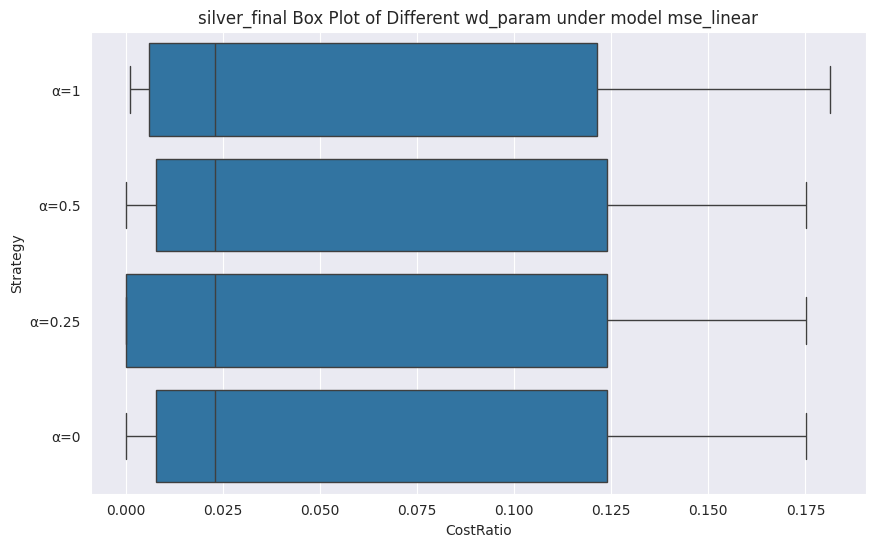

166.06392
166.06392
166.06392
166.06392


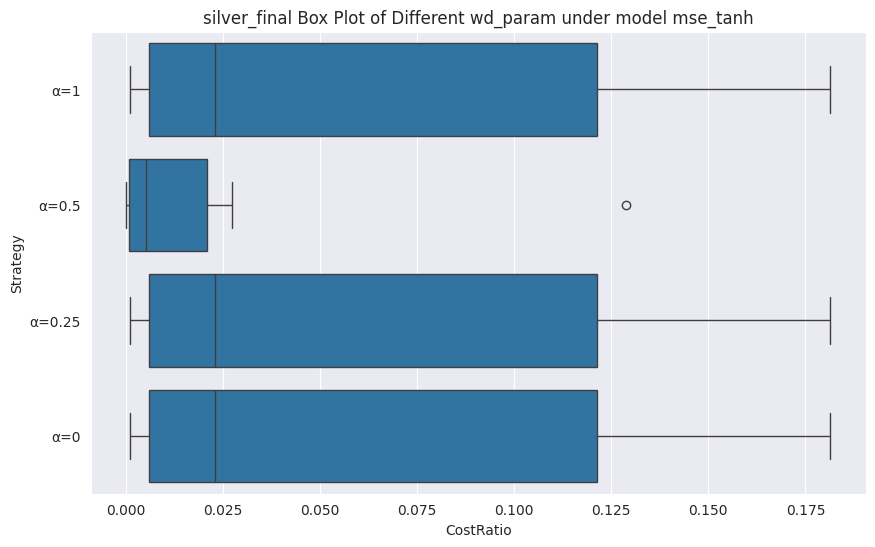

166.06392
166.06392
166.06392
166.06392


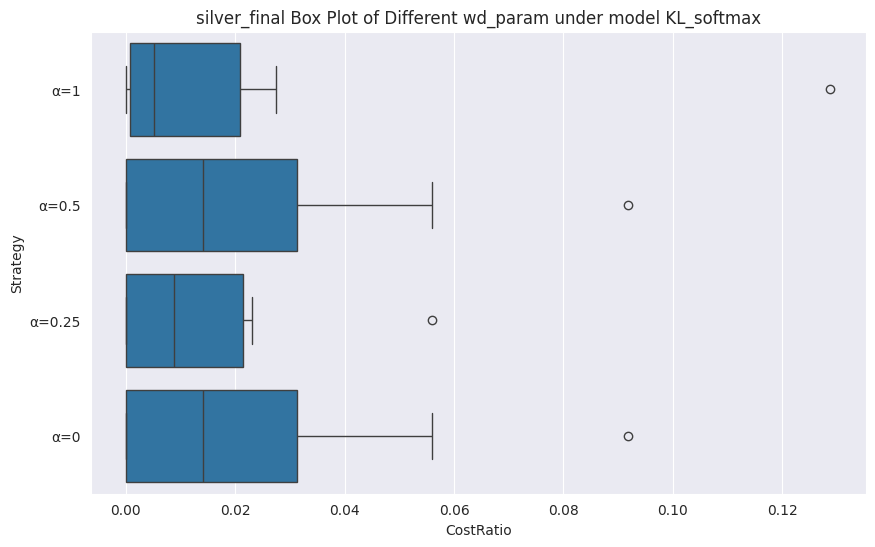

166.06392
166.06392
166.06392
166.06392


In [ ]:
silver_final_was = cost_func_forWas(bootAll_y_final_was, bootAll_y_pred_final_was, bootAll_y_pred_final_was_1, bootAll_y_pred_final_was_2, bootAll_y_pred_final_was_3, x_final_real_wsR, 'silver', 'mse_linear', 'final')
silver_final_was_m1 = cost_func_forWas(bootAll_y_final_was1, bootAll_y_pred_final_was1, bootAll_y_pred_final_was1_1, bootAll_y_pred_final_was1_2, bootAll_y_pred_final_was1_3, x_final_real_wsR, 'silver', 'mse_tanh', 'final')
silver_final_was_m2 = cost_func_forWas(bootAll_y_final_was2, bootAll_y_pred_final_was2, bootAll_y_pred_final_was2_1, bootAll_y_pred_final_was2_2, bootAll_y_pred_final_was2_3, x_final_real_wsR, 'silver', 'KL_softmax', 'final')

In [ ]:
silver_data_was = cost_func_forWas(bootAll_y_val_was, bootAll_y_pred_val_was, bootAll_y_pred_val_was_1, bootAll_y_pred_val_was_2, bootAll_pred_y_val, x_val_wsRReal, 'silver', 'mse_linear', 'val')
silver_data_was_m1 = cost_func_forWas(bootAll_y_val_was1, bootAll_y_pred_val_was1, bootAll_y_pred_val_was1_1, bootAll_y_pred_val_was1_2, bootAll_pred_y_val1, x_val_wsRReal, 'silver','mse_tanh', 'val')
silver_data_was_m2 = cost_func_forWas(bootAll_y_val_was2, bootAll_y_pred_val_was2, bootAll_y_pred_val_was2_1, bootAll_y_pred_val_was2_2, bootAll_pred_y_val2, x_val_wsRReal, 'silver', 'KL_softmax', 'val')

In [ ]:
# Was
# ValReal
## BootAll
### wd_param=1
yFinalWasg= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 1, 0, 'gold', g_unitsBoot, g_lrBoot, g_dropoutBoot, g_rl2Boot, 1, 'val')
yFinalWasg1= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 1, 1, 'gold', 128, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 1, 'val')
yFinalWasg2= final_train(X_train_g, X_test_g, y_train_g, y_train_g, x_final_wgR, y_final_wgR, 'noteasy', 1, 2, 'gold', 64, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 1, 'val')

### wd_param=0.5
yFinalWasg_1= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 0.5, 0, 'gold', g_unitsBoot, g_lrBoot, g_dropoutBoot, g_rl2Boot, 1, 'val')
yFinalWasg1_1= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 0.5, 1, 'gold', 128, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 1, 'val')
yFinalWasg2_1= final_train(X_train_g, X_test_g, y_train_g, y_train_g, x_final_wgR, y_final_wgR, 'noteasy', 0.5, 2, 'gold', 64, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 1, 'val')

### wd_param=0.25
yFinalWasg_2= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 0.25, 0, 'gold', g_unitsBoot, g_lrBoot, g_dropoutBoot, g_rl2Boot, 1, 'val')
yFinalWasg1_2= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 0.25, 1, 'gold', 128, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 1, 'val')
yFinalWasg2_2= final_train(X_train_g, X_test_g, y_train_g, y_train_g, x_final_wgR, y_final_wgR, 'noteasy', 0.25, 2, 'gold', 64, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 1, 'val')

### wd_param=0
yFinalWasg_3= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 0, 0, 'gold', 256, g_lrBoot, g_dropoutBoot, g_rl2Boot, 1, 'val')
yFinalWasg1_3= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 0, 1, 'gold', 128, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 1, 'val')
yFinalWasg2_3= final_train(X_train_g, X_test_g, y_train_g, y_train_g, x_final_wgR, y_final_wgR, 'noteasy', 0, 2, 'gold', 128, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 1, 'val')

In [ ]:
np.save(f'{save_path}/silver/yFinalBoot.npy', yFinalBoot)
np.save(f'{save_path}/silver/yFinalBoot1.npy', yFinalBoot1)
np.save(f'{save_path}/silver/yFinalBoot2.npy', yFinalBoot2)

np.save(f'{save_path}/silver/yFinalBootWas.npy', yFinalBootWas)
np.save(f'{save_path}/silver/yFinalBootWas1.npy', yFinalBootWas1)
np.save(f'{save_path}/silver/yFinalBootWas2.npy', yFinalBootWas2)

In [ ]:
yFinalBoot = np.load(f'{save_path}/silver/yFinalBoot.npy')
yFinalBoot1 = np.load(f'{save_path}/silver/yFinalBoot1.npy')
yFinalBoot2 = np.load(f'{save_path}/silver/yFinalBoot2.npy')

yFinalBootWas = np.load(f'{save_path}/silver/yFinalBootWas.npy')
yFinalBootWas1 = np.load(f'{save_path}/silver/yFinalBootWas1.npy')
yFinalBootWas2 = np.load(f'{save_path}/silver/yFinalBootWas2.npy')

In [ ]:
frealY = yFinalBoot[0]
fbootY = yFinalBoot[1]
frealY1 = yFinalBoot1[0]
fbootY1 = yFinalBoot1[1]
frealY2 = yFinalBoot2[0]
fbootY2 = yFinalBoot2[1]

frealYWas = yFinalBootWas[0]
fbootYWas = yFinalBootWas[1]
frealYWas1 = yFinalBootWas1[0]
fbootYWas1 = yFinalBootWas1[1]
frealYWas2 = yFinalBootWas2[0]
fbootYWas2 = yFinalBootWas2[1]

In [ ]:
silver_final_was = cost_func_forWas()

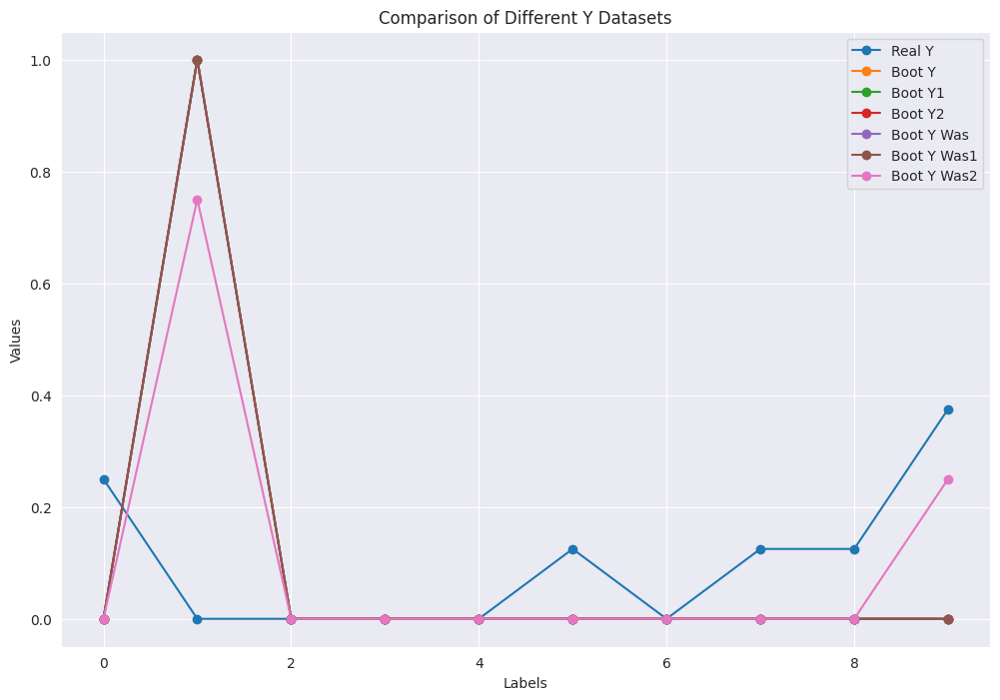

In [ ]:
# 將資料轉換為字典
dict_realY = transform_to_dict(frealY)
dict_bootY = transform_to_dict(fbootY)
dict_bootY1 = transform_to_dict(fbootY1)
dict_bootY2 = transform_to_dict(fbootY2)
dict_bootYWas = transform_to_dict(fbootYWas)
dict_bootYWas1 = transform_to_dict(fbootYWas1)
dict_bootYWas2 = transform_to_dict(fbootYWas2)

# 將字典轉換為可繪圖的資料格式
labels_realY, values_realY = zip(*dict_realY.items())
labels_bootY, values_bootY = zip(*dict_bootY.items())
labels_bootY1, values_bootY1 = zip(*dict_bootY1.items())
labels_bootY2, values_bootY2 = zip(*dict_bootY2.items())
labels_bootYWas, values_bootYWas = zip(*dict_bootYWas.items())
labels_bootYWas1, values_bootYWas1 = zip(*dict_bootYWas1.items())
labels_bootYWas2, values_bootYWas2 = zip(*dict_bootYWas2.items())

# 繪製折線圖
plt.figure(figsize=(12, 8))

plt.plot(labels_realY, values_realY, label='Real Y', marker='o')
plt.plot(labels_bootY, values_bootY, label='Boot Y', marker='o')
plt.plot(labels_bootY1, values_bootY1, label='Boot Y1', marker='o')
plt.plot(labels_bootY2, values_bootY2, label='Boot Y2', marker='o')
plt.plot(labels_bootYWas, values_bootYWas, label='Boot Y Was', marker='o')
plt.plot(labels_bootYWas1, values_bootYWas1, label='Boot Y Was1', marker='o')
plt.plot(labels_bootYWas2, values_bootYWas2, label='Boot Y Was2', marker='o')

plt.legend()

plt.title('Comparison of Different Y Datasets')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.show()

In [ ]:
frealY = yFinalBoot[0]
fbootY = yFinalBoot[1]
fbootY1 = yFinalBoot1[1]
fbootY2 = yFinalBoot2[1]
fbootYWas = yFinalBootWas[1]
fbootYWas1 = yFinalBootWas1[1]
fbootYWas2 = yFinalBootWas2[1]

array([[-0.61473459, -0.01350033, -0.98960173, -0.98963714, -0.84890878,
        -0.72810835, -0.99052405, -0.94203484, -0.86616063, -0.90866399],
       [-0.63500059, -0.04521522, -0.98954016, -0.98960656, -0.85577142,
        -0.70668787, -0.99036825, -0.94130343, -0.83567536, -0.903328  ],
       [-0.94789147, -0.85455269, -0.98531711, -0.98572576, -0.95264602,
        -0.73221081, -0.98519927, -0.91532767, -0.46698672, -0.03876474],
       [-0.64058948, -0.05363262, -0.98956382, -0.98963857, -0.85768574,
        -0.70064712, -0.99036574, -0.94118088, -0.82740343, -0.90232575],
       [-0.92058629, -0.72258461, -0.9889906 , -0.98925287, -0.94202209,
        -0.63490766, -0.98870093, -0.92238951, -0.44754088, -0.3424229 ],
       [-0.62320322, -0.02635783, -0.98952472, -0.98957509, -0.85172349,
        -0.71831262, -0.99041098, -0.94173026, -0.85298109, -0.90786135],
       [-0.78689682, -0.36232144, -0.99183238, -0.99193883, -0.9012965 ,
        -0.61063117, -0.99198043, -0.93518364

In [ ]:
np.save(f'{save_path}/silver/yOutcomeListWas.npy', yOutcomeListWas)
np.save(f'{save_path}/silver/yOutcomeListWas1.npy', yOutcomeListWas1)
np.save(f'{save_path}/silver/yOutcomeListWas2.npy', yOutcomeListWas2)
np.save(f'{save_path}/silver/yOutcomeListWas_1.npy', yOutcomeListWas_1)
np.save(f'{save_path}/silver/yOutcomeListWas1_1.npy', yOutcomeListWas1_1)
np.save(f'{save_path}/silver/yOutcomeListWas2_1.npy', yOutcomeListWas2_1)
np.save(f'{save_path}/silver/yOutcomeListWas_2.npy', yOutcomeListWas_2)
np.save(f'{save_path}/silver/yOutcomeListWas1_2.npy', yOutcomeListWas1_2)
np.save(f'{save_path}/silver/yOutcomeListWas2_2.npy', yOutcomeListWas2_2)

np.save(f'{save_path}/silver/yValBootWas.npy', yValBootWas)
np.save(f'{save_path}/silver/yValBootWas1.npy', yValBootWas1)
np.save(f'{save_path}/silver/yValBootWas2.npy', yValBootWas2)
np.save(f'{save_path}/silver/yValBootWas_1.npy', yValBootWas_1)
np.save(f'{save_path}/silver/yValBootWas1_1.npy', yValBootWas1_1)
np.save(f'{save_path}/silver/yValBootWas2_1.npy', yValBootWas2_1)
np.save(f'{save_path}/silver/yValBootWas_2.npy', yValBootWas_2)
np.save(f'{save_path}/silver/yValBootWas1_2.npy', yValBootWas1_2)
np.save(f'{save_path}/silver/yValBootWas2_2.npy', yValBootWas2_2)

In [ ]:
save_path = '/content/drive/MyDrive/iLovePDF'

In [ ]:
np.save(f'{save_path}/silver/yOutcomeListRaw.npy', yOutcomeListRaw)
np.save(f'{save_path}/silver/yOutcomeList.npy', yOutcomeList)
np.save(f'{save_path}/silver/yOutcomeListRaw1.npy', yOutcomeListRaw1)
np.save(f'{save_path}/silver/yOutcomeList1.npy', yOutcomeList1)
np.save(f'{save_path}/silver/yOutcomeListRaw2.npy', yOutcomeListRaw2)
np.save(f'{save_path}/silver/yOutcomeList2.npy', yOutcomeList2)
np.save(f'{save_path}/silver/yValRaws.npy', yValRaws)
np.save(f'{save_path}/silver/yValRaws1.npy', yValRaws1)
np.save(f'{save_path}/silver/yValRaws2.npy', yValRaws2)
np.save(f'{save_path}/silver/yValBoot.npy', yValBoot)
np.save(f'{save_path}/silver/yValBoot1.npy', yValBoot1)
np.save(f'{save_path}/silver/yValBoot2.npy', yValBoot2)

#### Load 入已經訓練好的資料

In [ ]:
yOutcomeListWas = np.load(f'{save_path}/silver/yOutcomeListWas.npy')
yOutcomeListWas1 = np.load(f'{save_path}/silver/yOutcomeListWas1.npy')
yOutcomeListWas2 = np.load(f'{save_path}/silver/yOutcomeListWas2.npy')
yOutcomeListWas_1 = np.load(f'{save_path}/silver/yOutcomeListWas_1.npy')
yOutcomeListWas1_1 = np.load(f'{save_path}/silver/yOutcomeListWas1_1.npy')
yOutcomeListWas2_1 = np.load(f'{save_path}/silver/yOutcomeListWas2_1.npy')
yOutcomeListWas_2 = np.load(f'{save_path}/silver/yOutcomeListWas_2.npy')
yOutcomeListWas1_2 = np.load(f'{save_path}/silver/yOutcomeListWas1_2.npy')
yOutcomeListWas2_2 = np.load(f'{save_path}/silver/yOutcomeListWas2_2.npy')

yValBootWas = np.load(f'{save_path}/silver/yValBootWas.npy')
yValBootWas1 = np.load(f'{save_path}/silver/yValBootWas1.npy')
yValBootWas2 = np.load(f'{save_path}/silver/yValBootWas2.npy')
yValBootWas_1 = np.load(f'{save_path}/silver/yValBootWas_1.npy')
yValBootWas1_1 = np.load(f'{save_path}/silver/yValBootWas1_1.npy')
yValBootWas2_1 = np.load(f'{save_path}/silver/yValBootWas2_1.npy')
yValBootWas_2 = np.load(f'{save_path}/silver/yValBootWas_2.npy')
yValBootWas1_2 = np.load(f'{save_path}/silver/yValBootWas1_2.npy')
yValBootWas2_2 = np.load(f'{save_path}/silver/yValBootWas2_2.npy')

In [ ]:
yOutcomeListRaw = np.load(f'{save_path}/silver/yOutcomeListRaw.npy')
yOutcomeList = np.load(f'{save_path}/silver/yOutcomeList.npy')
yOutcomeListRaw1 = np.load(f'{save_path}/silver/yOutcomeListRaw1.npy')
yOutcomeList1 = np.load(f'{save_path}/silver/yOutcomeList1.npy')
yOutcomeListRaw2 = np.load(f'{save_path}/silver/yOutcomeListRaw2.npy')
yOutcomeList2 = np.load(f'{save_path}/silver/yOutcomeList2.npy')
yValRaws = np.load(f'{save_path}/silver/yValRaws.npy')
yValRaws1 = np.load(f'{save_path}/silver/yValRaws1.npy')
yValRaws2 = np.load(f'{save_path}/silver/yValRaws2.npy')
yValBoot = np.load(f'{save_path}/silver/yValBoot.npy')
yValBoot1 = np.load(f'{save_path}/silver/yValBoot1.npy')
yValBoot2 = np.load(f'{save_path}/silver/yValBoot2.npy')

In [ ]:
# noWas
## x_train
raw_y=yOutcomeListRaw[0]
bootAll_y=yOutcomeList[0]
raw_pred_y=yOutcomeListRaw[1]
bootAll_pred_y=yOutcomeList[1]

raw_y1=yOutcomeListRaw1[0]
bootAll_y1=yOutcomeList1[0]
raw_pred_y1=yOutcomeListRaw1[1]
bootAll_pred_y1=yOutcomeList1[1]

raw_y2=yOutcomeListRaw2[0]
bootAll_y2=yOutcomeList2[0]
raw_pred_y2=yOutcomeListRaw2[1]
bootAll_pred_y2=yOutcomeList2[1]

# noWas
## x_val
raw_y_val=yValRaws[0]
bootAll_y_val=yValBoot[0]
raw_pred_y_val=yValRaws[1]
bootAll_pred_y_val=yValBoot[1]

raw_y_val1=yValRaws1[0]
bootAll_y_val1=yValBoot1[0]
raw_pred_y_val1=yValRaws1[1]
bootAll_pred_y_val1=yValBoot1[1]

raw_y_val2=yValRaws2[0]
bootAll_y_val2=yValBoot2[0]
raw_pred_y_val2=yValRaws2[1]
bootAll_pred_y_val2=yValBoot2[1]

In [ ]:
# Was
## x_train
### wd_param=1
bootAll_y_was=yOutcomeListWas[0]
bootAll_y_pred_was=yOutcomeListWas[1]

bootAll_y_was1=yOutcomeListWas1[0]
bootAll_y_pred_was1=yOutcomeListWas1[1]

bootAll_y_was2=yOutcomeListWas2[0]
bootAll_y_pred_was2=yOutcomeListWas2[1]

### wd_param=0.5
bootAll_y_was_1=yOutcomeListWas_1[0]
bootAll_y_pred_was_1=yOutcomeListWas_1[1]

bootAll_y_was1_1=yOutcomeListWas1_1[0]
bootAll_y_pred_was1_1=yOutcomeListWas1_1[1]

bootAll_y_was2_1=yOutcomeListWas2_1[0]
bootAll_y_pred_was2_1=yOutcomeListWas2_1[1]

### wd_param=0.25
bootAll_y_was_2=yOutcomeListWas_2[0]
bootAll_y_pred_was_2=yOutcomeListWas_2[1]

bootAll_y_was1_2=yOutcomeListWas1_2[0]
bootAll_y_pred_was1_2=yOutcomeListWas1_2[1]

bootAll_y_was2_2=yOutcomeListWas2_2[0]
bootAll_y_pred_was2_2=yOutcomeListWas2_2[1]


## x_val
### wd_param=1
bootAll_y_val_was=yValBootWas[0]
bootAll_y_pred_val_was=yValBootWas[1]

bootAll_y_val_was1=yValBootWas1[0]
bootAll_y_pred_val_was1=yValBootWas1[1]

bootAll_y_val_was2=yValBootWas2[0]
bootAll_y_pred_val_was2=yValBootWas2[1]

### wd_param=0.5
bootAll_y_val_was_1=yValBootWas_1[0]
bootAll_y_pred_val_was_1=yValBootWas_1[1]

bootAll_y_val_was1_1=yValBootWas1_1[0]
bootAll_y_pred_val_was1_1=yValBootWas1_1[1]

bootAll_y_val_was2_1=yValBootWas2_1[0]
bootAll_y_pred_val_was2_1=yValBootWas2_1[1]

### wd_param=0.25
bootAll_y_val_was_2=yValBootWas_2[0]
bootAll_y_pred_val_was_2=yValBootWas_2[1]

bootAll_y_val_was1_2=yValBootWas1_2[0]
bootAll_y_pred_val_was1_2=yValBootWas1_2[1]

bootAll_y_val_was2_2=yValBootWas2_2[0]
bootAll_y_pred_val_was2_2=yValBootWas2_2[1]

#### noWasTrain

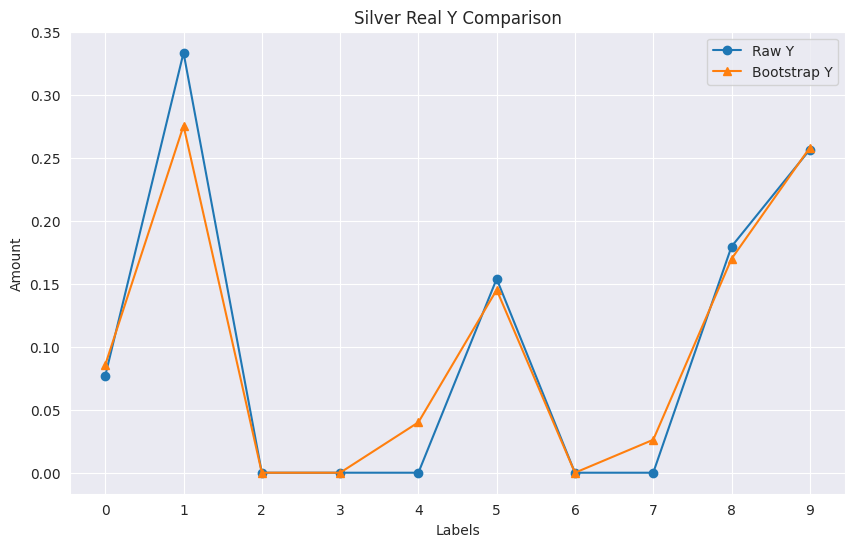

In [ ]:
raw_y_dict=transform_to_dict(raw_y)
bootAll_y_dict=transform_to_dict(y_train_sReg)

labels1, values1 = zip(*raw_y_dict.items())
labels2, values2 = zip(*bootAll_y_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels1, values1, label='Raw Y', marker='o')
plt.plot(labels2, values2, label='Bootstrap Y', marker='^')
# plt.plot(labels4, values4, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('Silver Real Y Comparison')
plt.xlabel('Labels')
plt.ylabel('Amount')

# 设置 x 轴刻度，使每个标签都显示
plt.xticks(range(0, 10))  # 假设标签范围是 1 到 9

# plt.savefig(f'{save_path}/silver/silver_ytrain_linear.png')

plt.show()

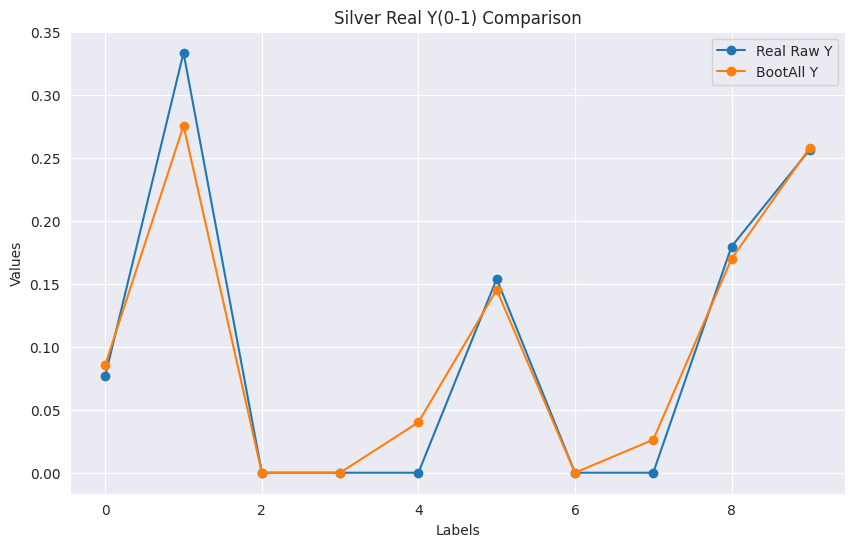

In [ ]:
raw_y_dict=transform_to_dict(y_train_sReal)
bootAll_y_dict=transform_to_dict(y_train_s)
# raw_pred_y_dict=transform_to_dict(raw_pred_y)
# bootAll_pred_y_dict=transform_to_dict(bootAll_pred_y)

labels1, values1 = zip(*raw_y_dict.items())
labels2, values2 = zip(*bootAll_y_dict.items())
# labels3, values3 = zip(*raw_pred_y_dict.items())
# labels4, values4 = zip(*bootAll_pred_y_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels1, values1, label='Real Raw Y', marker='o')
plt.plot(labels2, values2, label='BootAll Y', marker='o')
# plt.plot(labels4, values4, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('Silver Real Y(0-1) Comparison')
plt.xlabel('Labels')
plt.ylabel('Values')

# plt.savefig(f'{save_path}/silver/silver_ytrain_linear.png')

plt.show()

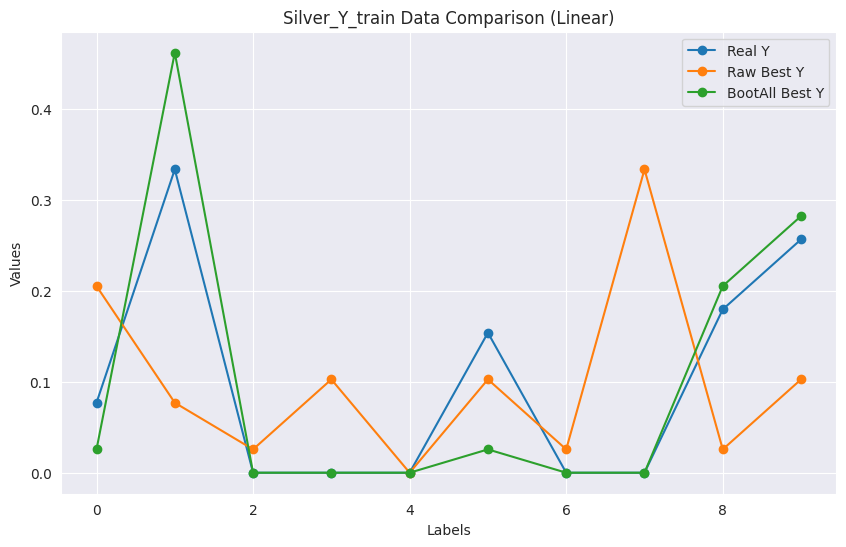

In [ ]:
raw_y_dict=transform_to_dict(raw_y)
bootAll_y_dict=transform_to_dict(y_train_sReg)
raw_pred_y_dict=transform_to_dict(raw_pred_y)
bootAll_pred_y_dict=transform_to_dict(bootAll_pred_y)

labels1, values1 = zip(*raw_y_dict.items())
labels2, values2 = zip(*bootAll_y_dict.items())
labels3, values3 = zip(*raw_pred_y_dict.items())
labels4, values4 = zip(*bootAll_pred_y_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels1, values1, label='Real Y', marker='o')
plt.plot(labels3, values3, label='Raw Best Y', marker='o')
plt.plot(labels4, values4, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('Silver_Y_train Data Comparison (Linear)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/silver/silver_ytrain_linear.png')

plt.show()

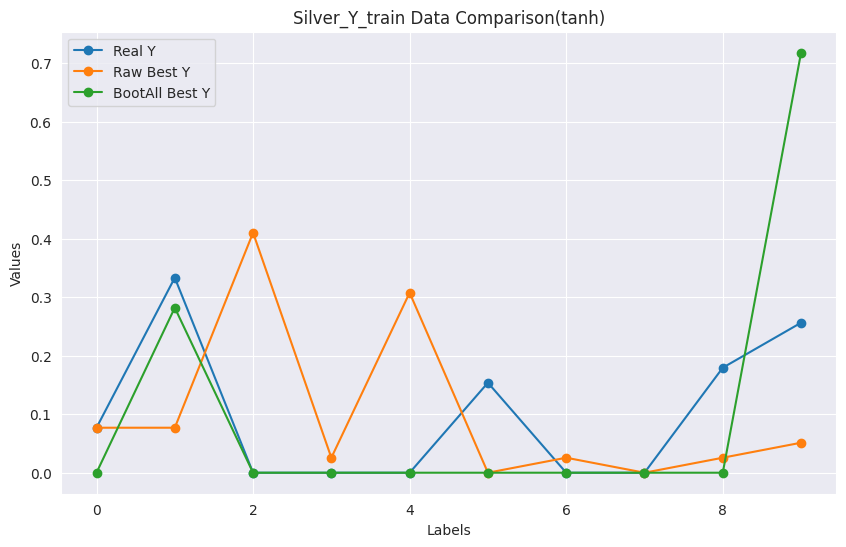

In [ ]:
raw_y1_dict=transform_to_dict(raw_y1)
bootAll_y1_dict=transform_to_dict(bootAll_y1)
raw_pred_y1_dict=transform_to_dict(raw_pred_y1)
bootAll_pred_y1_dict=transform_to_dict(bootAll_pred_y1)

labels11, values11 = zip(*raw_y1_dict.items())
labels21, values21 = zip(*bootAll_y1_dict.items())
labels31, values31 = zip(*raw_pred_y1_dict.items())
labels41, values41 = zip(*bootAll_pred_y1_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels11, values11, label='Real Y', marker='o')
plt.plot(labels31, values31, label='Raw Best Y', marker='o')
plt.plot(labels41, values41, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('Silver_Y_train Data Comparison(tanh)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/silver/silver_ytrain_tanh.png')

plt.show()

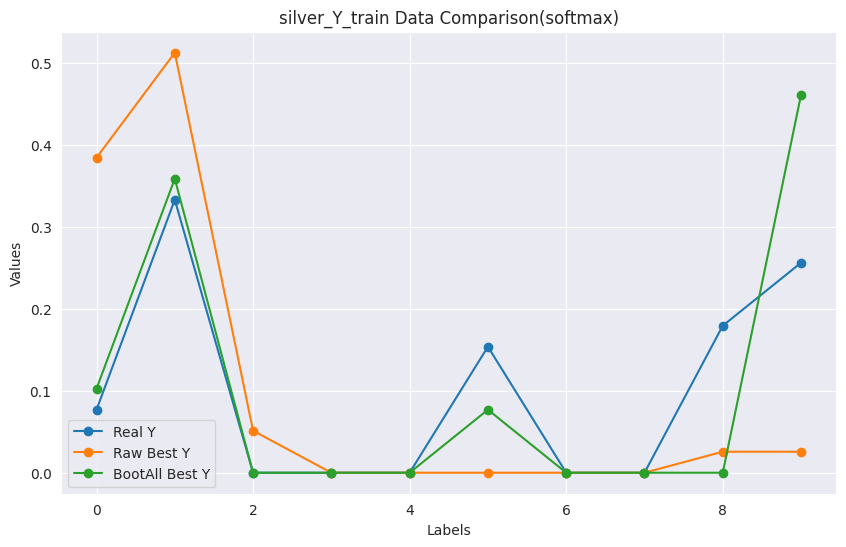

In [ ]:
raw_y2_dict=transform_to_dict(raw_y2)
bootAll_y2_dict=transform_to_dict(bootAll_y2)
raw_pred_y2_dict=transform_to_dict(raw_pred_y2)
bootAll_pred_y2_dict=transform_to_dict(bootAll_pred_y2)

labels12, values12 = zip(*raw_y2_dict.items())
labels22, values22 = zip(*bootAll_y2_dict.items())
labels32, values32 = zip(*raw_pred_y2_dict.items())
labels42, values42 = zip(*bootAll_pred_y2_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels12, values12, label='Real Y', marker='o')
plt.plot(labels32, values32, label='Raw Best Y', marker='o')
plt.plot(labels42, values42, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('silver_Y_train Data Comparison(softmax)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/silver/silver_ytrain_softmax.png')

plt.show()

#### noWasVal

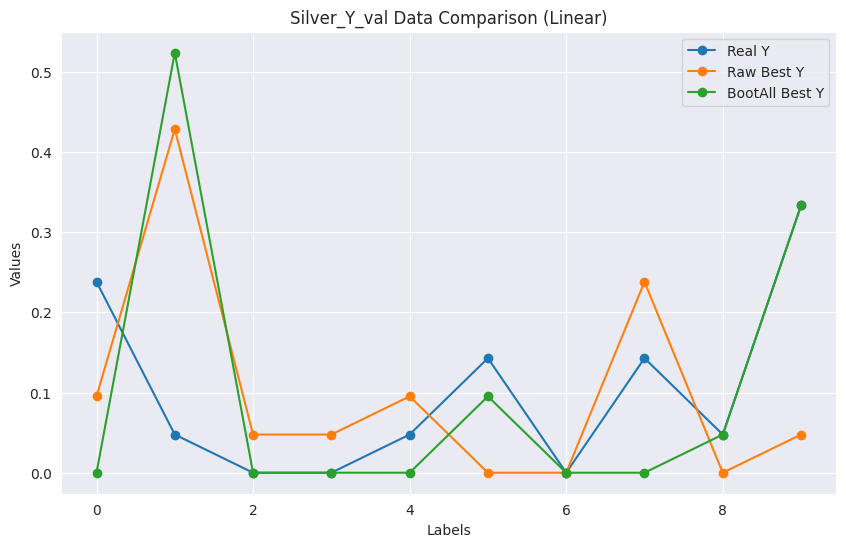

In [ ]:
raw_y_val_dict=transform_to_dict(raw_y_val)
bootAll_y_val_dict=transform_to_dict(bootAll_y_val)
raw_pred_y_val_dict=transform_to_dict(raw_pred_y_val)
bootAll_pred_y_val_dict=transform_to_dict(bootAll_pred_y_val)

labels1val, values1val = zip(*raw_y_val_dict.items())
labels2val, values2val = zip(*bootAll_y_val_dict.items())
labels3val, values3val = zip(*raw_pred_y_val_dict.items())
labels4val, values4val = zip(*bootAll_pred_y_val_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels1val, values1val, label='Real Y', marker='o')
plt.plot(labels3val, values3val, label='Raw Best Y', marker='o')
plt.plot(labels4val, values4val, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('Silver_Y_val Data Comparison (Linear)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/silver/silver_y_val_linear.png')

plt.show()

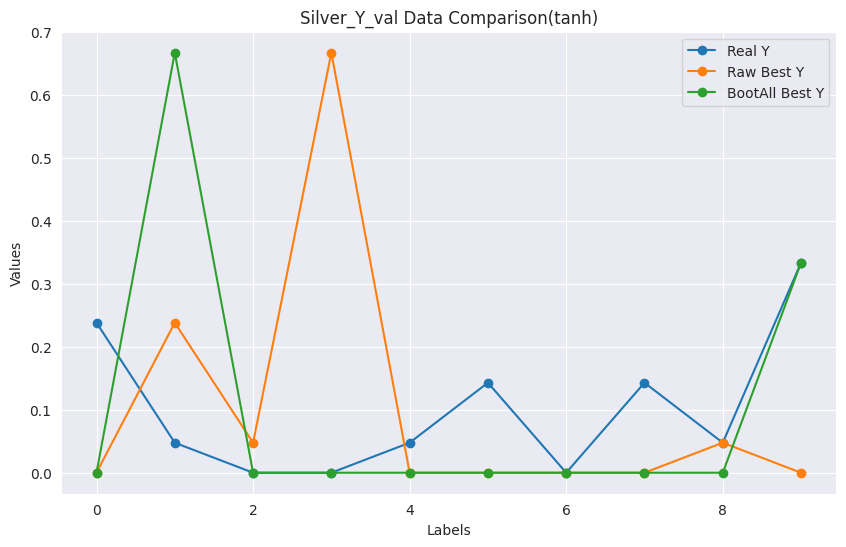

In [ ]:
raw_y_val_dict1=transform_to_dict(raw_y_val1)
bootAll_y_val_dict1=transform_to_dict(bootAll_y_val1)
raw_pred_y_val_dict1=transform_to_dict(raw_pred_y_val1)
bootAll_pred_y_val_dict1=transform_to_dict(bootAll_pred_y_val1)

labels11val, values11val = zip(*raw_y_val_dict1.items())
labels21val, values21val = zip(*bootAll_y_val_dict1.items())
labels31val, values31val = zip(*raw_pred_y_val_dict1.items())
labels41val, values41val = zip(*bootAll_pred_y_val_dict1.items())

plt.figure(figsize=(10, 6))

plt.plot(labels11val, values11val, label='Real Y', marker='o')
plt.plot(labels31val, values31val, label='Raw Best Y', marker='o')
plt.plot(labels41val, values41val, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('Silver_Y_val Data Comparison(tanh)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/silver/silver_y_val_tanh.png')

plt.show()

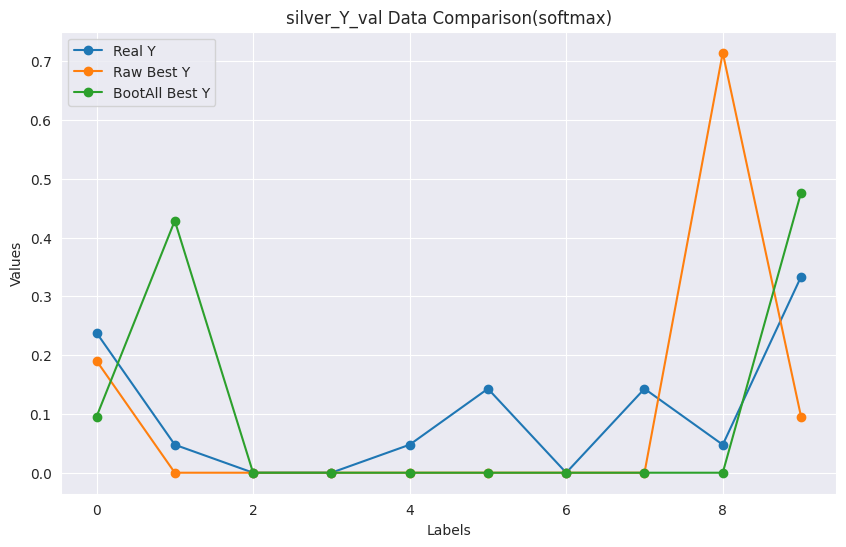

In [ ]:
raw_y_val_dict2=transform_to_dict(raw_y_val2)
bootAll_y_val_dict2=transform_to_dict(bootAll_y_val2)
raw_pred_y_val_dict2=transform_to_dict(raw_pred_y_val2)
bootAll_pred_y_val_dict2=transform_to_dict(bootAll_pred_y_val2)

labels12val, values12val = zip(*raw_y_val_dict2.items())
labels22val, values22val = zip(*bootAll_y_val_dict2.items())
labels32val, values32val = zip(*raw_pred_y_val_dict2.items())
labels42val, values42val = zip(*bootAll_pred_y_val_dict2.items())

plt.figure(figsize=(10, 6))

plt.plot(labels12val, values12val, label='Real Y', marker='o')
plt.plot(labels32val, values32val, label='Raw Best Y', marker='o')
plt.plot(labels42val, values42val, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('silver_Y_val Data Comparison(softmax)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/silver/silver_y_val_softmax.png')

plt.show()

#### WasTrain

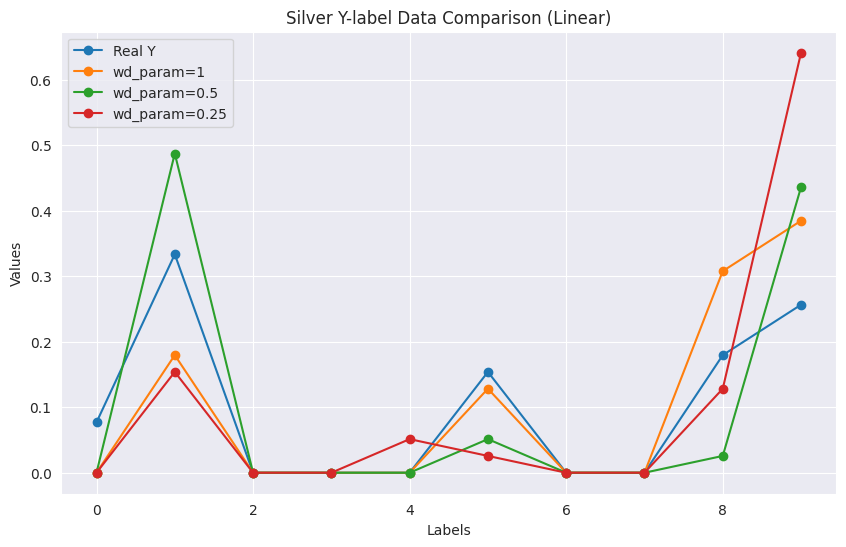

In [ ]:
bootAll_y_was_dict=transform_to_dict(bootAll_y_was)
bootAll_y_pred_was_dict=transform_to_dict(bootAll_y_pred_was)
bootAll_y_pred_was_dict_1=transform_to_dict(bootAll_y_pred_was_1)
bootAll_y_pred_was_dict_2=transform_to_dict(bootAll_y_pred_was_2)

labelsWas, valuesWas = zip(*bootAll_y_was_dict.items())
labelsWasPred, valuesWasPred = zip(*bootAll_y_pred_was_dict.items())
labelsWasPred1, valuesWasPred1 = zip(*bootAll_y_pred_was_dict_1.items())
labelsWasPred2, valuesWasPred2 = zip(*bootAll_y_pred_was_dict_2.items())

plt.figure(figsize=(10, 6))

plt.plot(labelsWas, valuesWas, label='Real Y', marker='o')
plt.plot(labelsWasPred, valuesWasPred, label='wd_param=1', marker='o')
plt.plot(labelsWasPred1, valuesWasPred1, label='wd_param=0.5', marker='o')
plt.plot(labelsWasPred2, valuesWasPred2, label='wd_param=0.25', marker='o')

plt.legend()

plt.title('Silver Y-label Data Comparison (Linear)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/silver/silver_ytrain_was_linear.png')

plt.show()

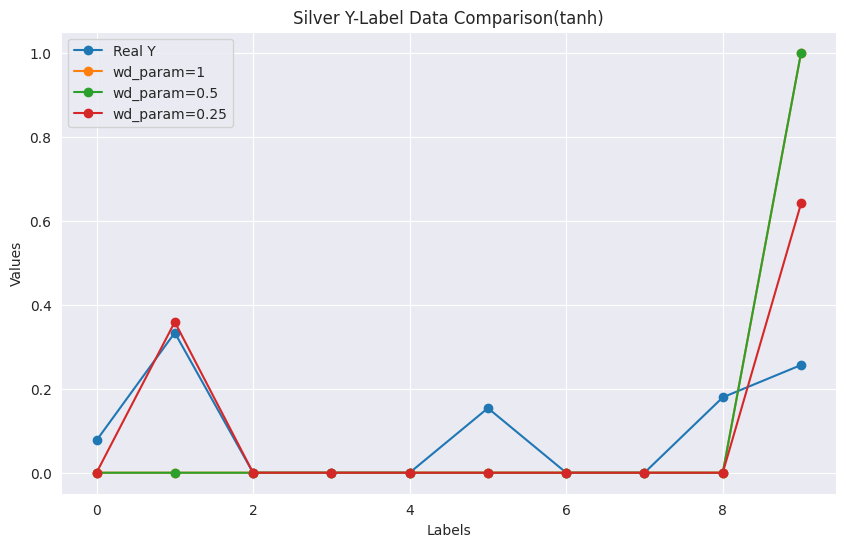

In [ ]:
bootAll_y_was_dict1=transform_to_dict(bootAll_y_was1)
bootAll_y_pred_was_dict1=transform_to_dict(bootAll_y_pred_was1)
bootAll_y_pred_was_dict1_1=transform_to_dict(bootAll_y_pred_was1_1)
bootAll_y_pred_was_dict1_2=transform_to_dict(bootAll_y_pred_was1_2)

labelsWas1, valuesWas1 = zip(*bootAll_y_was_dict1.items())
labelsWasPred_1, valuesWasPred_1 = zip(*bootAll_y_pred_was_dict1.items())
labelsWasPred_2, valuesWasPred_2 = zip(*bootAll_y_pred_was_dict1_1.items())
labelsWasPred_3, valuesWasPred_3 = zip(*bootAll_y_pred_was_dict1_2.items())

plt.figure(figsize=(10, 6))

plt.plot(labelsWas1, valuesWas1, label='Real Y', marker='o')
plt.plot(labelsWasPred_1, valuesWasPred_1, label='wd_param=1', marker='o')
plt.plot(labelsWasPred_2, valuesWasPred_2, label='wd_param=0.5', marker='o')
plt.plot(labelsWasPred_3, valuesWasPred_3, label='wd_param=0.25', marker='o')

plt.legend()

plt.title('Silver Y-Label Data Comparison(tanh)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/silver/silver_ytrain_was_tanh.png')

plt.show()

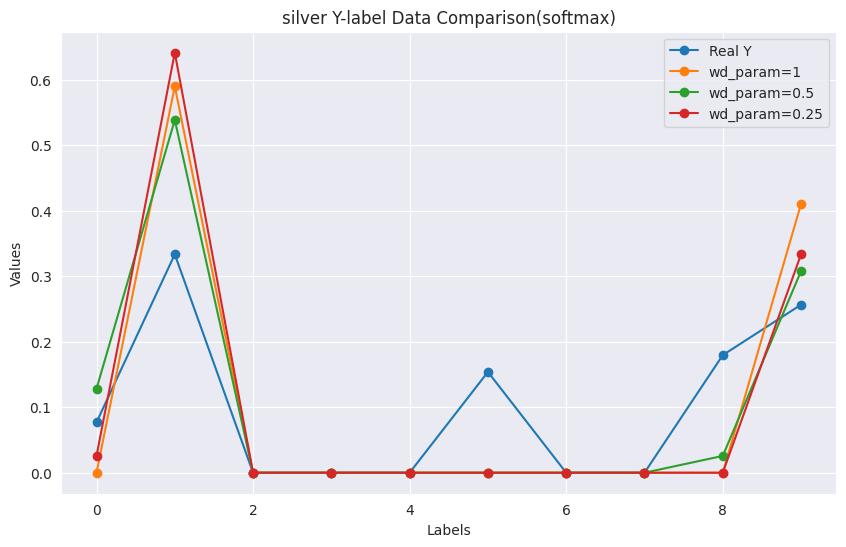

In [ ]:
bootAll_y_was_dict2=transform_to_dict(bootAll_y_was2)
bootAll_y_pred_was_dict2=transform_to_dict(bootAll_y_pred_was2)
bootAll_y_pred_was_dict2_1=transform_to_dict(bootAll_y_pred_was2_1)
bootAll_y_pred_was_dict2_2=transform_to_dict(bootAll_y_pred_was2_2)

labelsWas2, valuesWas2 = zip(*bootAll_y_was_dict2.items())
labelsWasPred1_1, valuesWasPred1_1 = zip(*bootAll_y_pred_was_dict2.items())
labelsWasPred1_2, valuesWasPred1_2 = zip(*bootAll_y_pred_was_dict2_1.items())
labelsWasPred1_3, valuesWasPred1_3 = zip(*bootAll_y_pred_was_dict2_2.items())

plt.figure(figsize=(10, 6))

plt.plot(labelsWas2, valuesWas2, label='Real Y', marker='o')
plt.plot(labelsWasPred1_1, valuesWasPred1_1, label='wd_param=1', marker='o')
plt.plot(labelsWasPred1_2, valuesWasPred1_2, label='wd_param=0.5', marker='o')
plt.plot(labelsWasPred1_3, valuesWasPred1_3, label='wd_param=0.25', marker='o')

plt.legend()

plt.title('silver Y-label Data Comparison(softmax)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/silver/silver_ytrain_was_softmax.png')

plt.show()

#### WasVal

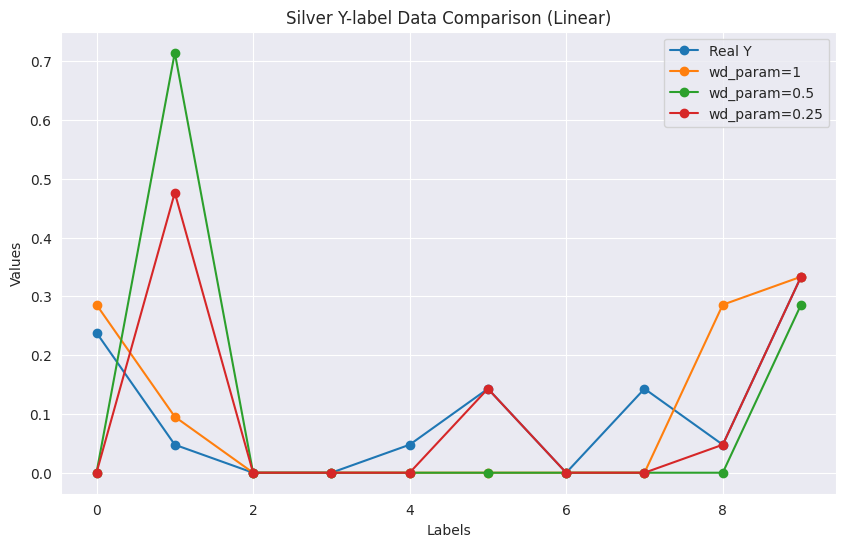

In [ ]:
bootAll_y_val_was_dict=transform_to_dict(bootAll_y_val_was)
bootAll_y_pred_val_was_dict=transform_to_dict(bootAll_y_pred_val_was)
bootAll_y_pred_val_was_dict_1=transform_to_dict(bootAll_y_pred_val_was_1)
bootAll_y_pred_val_was_dict_2=transform_to_dict(bootAll_y_pred_val_was_2)

labelsValWas, valuesValWas = zip(*bootAll_y_val_was_dict.items())
labelsValWasPred, valuesValWasPred = zip(*bootAll_y_pred_val_was_dict.items())
labelsValWasPred_1, valuesValWasPred_1 = zip(*bootAll_y_pred_val_was_dict_1.items())
labelsValWasPred_2, valuesValWasPred_2 = zip(*bootAll_y_pred_val_was_dict_2.items())

plt.figure(figsize=(10, 6))

plt.plot(labelsValWas, valuesValWas, label='Real Y', marker='o')
plt.plot(labelsValWasPred, valuesValWasPred, label='wd_param=1', marker='o')
plt.plot(labelsValWasPred_1, valuesValWasPred_1, label='wd_param=0.5', marker='o')
plt.plot(labelsValWasPred_2, valuesValWasPred_2, label='wd_param=0.25', marker='o')

plt.legend()

plt.title('Silver Y-label Data Comparison (Linear)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/silver/silver_y_val_was_linear.png')

plt.show()

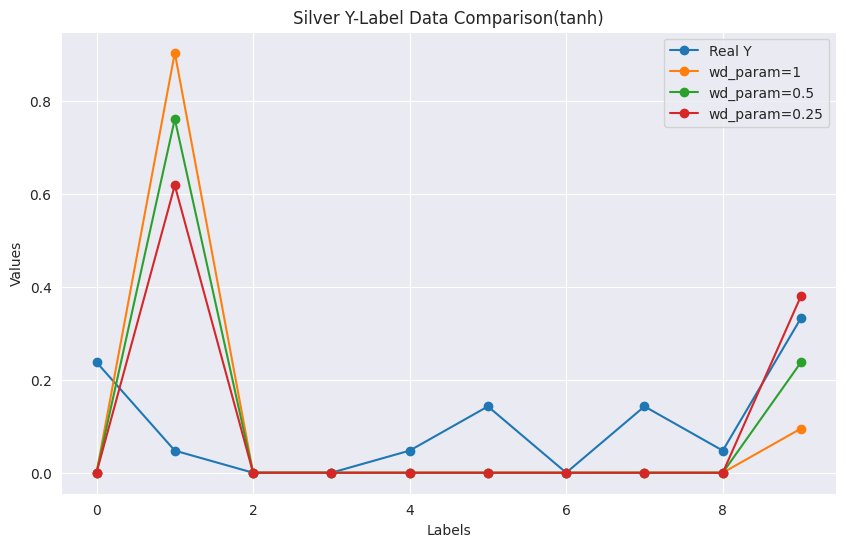

In [ ]:
bootAll_y_val_was_dict1=transform_to_dict(bootAll_y_val_was1)
bootAll_y_pred_val_was_dict1=transform_to_dict(bootAll_y_pred_val_was1)
bootAll_y_pred_val_was_dict1_1=transform_to_dict(bootAll_y_pred_val_was1_1)
bootAll_y_pred_val_was_dict1_2=transform_to_dict(bootAll_y_pred_val_was1_2)

labelsValWas1, valuesValWas1 = zip(*bootAll_y_val_was_dict1.items())
labelsValWasPred1, valuesValWasPred1 = zip(*bootAll_y_pred_val_was_dict1.items())
labelsValWasPred1_1, valuesValWasPred1_1 = zip(*bootAll_y_pred_val_was_dict1_1.items())
labelsValWasPred1_2, valuesValWasPred1_2 = zip(*bootAll_y_pred_val_was_dict1_2.items())

plt.figure(figsize=(10, 6))

plt.plot(labelsValWas1, valuesValWas1, label='Real Y', marker='o')
plt.plot(labelsValWasPred1, valuesValWasPred1, label='wd_param=1', marker='o')
plt.plot(labelsValWasPred1_1, valuesValWasPred1_1, label='wd_param=0.5', marker='o')
plt.plot(labelsValWasPred1_2, valuesValWasPred1_2, label='wd_param=0.25', marker='o')

plt.legend()

plt.title('Silver Y-Label Data Comparison(tanh)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/silver/silver_y_val_was_tanh.png')

plt.show()

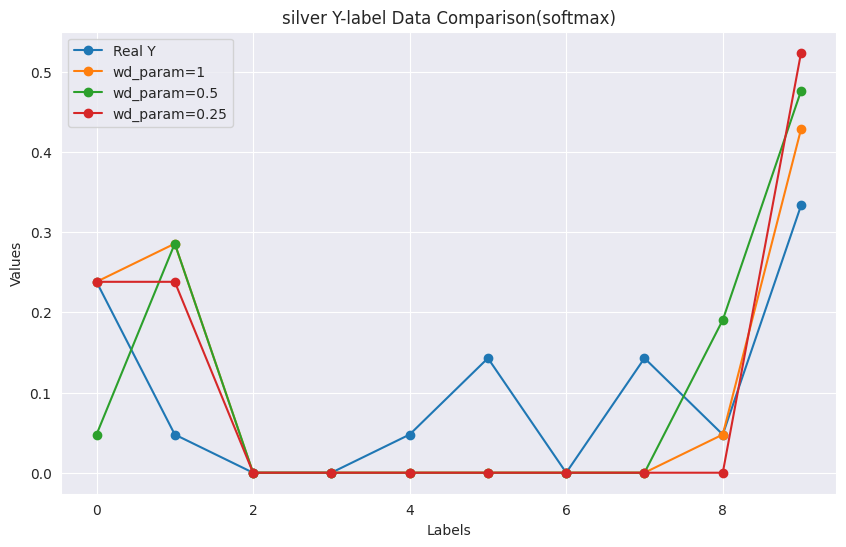

In [ ]:
bootAll_y_val_was_dict2=transform_to_dict(bootAll_y_val_was2)
bootAll_y_pred_val_was_dict2=transform_to_dict(bootAll_y_pred_val_was2)
bootAll_y_pred_val_was_dict2_1=transform_to_dict(bootAll_y_pred_val_was2_1)
bootAll_y_pred_val_was_dict2_2=transform_to_dict(bootAll_y_pred_val_was2_2)

labelsValWas2, valuesValWas2 = zip(*bootAll_y_val_was_dict2.items())
labelsValWasPred2, valuesValWasPred2 = zip(*bootAll_y_pred_val_was_dict2.items())
labelsValWasPred2_1, valuesValWasPred2_1 = zip(*bootAll_y_pred_val_was_dict2_1.items())
labelsValWasPred2_2, valuesValWasPred2_2 = zip(*bootAll_y_pred_val_was_dict2_2.items())

plt.figure(figsize=(10, 6))

plt.plot(labelsValWas2, valuesValWas2, label='Real Y', marker='o')
plt.plot(labelsValWasPred2, valuesValWasPred2, label='wd_param=1', marker='o')
plt.plot(labelsValWasPred2_1, valuesValWasPred2_1, label='wd_param=0.5', marker='o')
plt.plot(labelsValWasPred2_2, valuesValWasPred2_2, label='wd_param=0.25', marker='o')

plt.legend()

plt.title('silver Y-label Data Comparison(softmax)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/silver/silver_y_val_was_softmax.png')

plt.show()

#### Test

#### Cost Fucntion 的計算

In [ ]:
costm3=[]
dividem3=[]
realPointm3=[]
for k in range(len(bootAll_y_val_was2)):
    modelPredict3=np.argmax(bootAll_y_pred_val_was2_1[k])
    realPoint3=np.argmax(bootAll_y_val_was2[k])
    modelPredictPrice3=x_val_wsRReal[k][modelPredict3]
    realPointPrice3=x_val_wsRReal[k][realPoint3]
    dividem3.append((modelPredictPrice3-realPointPrice3))
    realPointm3.append(realPointPrice3)
    costm3.append((modelPredictPrice3-realPointPrice3)/realPointPrice3)
costm3=np.array(costm3)
np.sum(dividem3)/np.sum(realPointm3)

0.00576559727451785

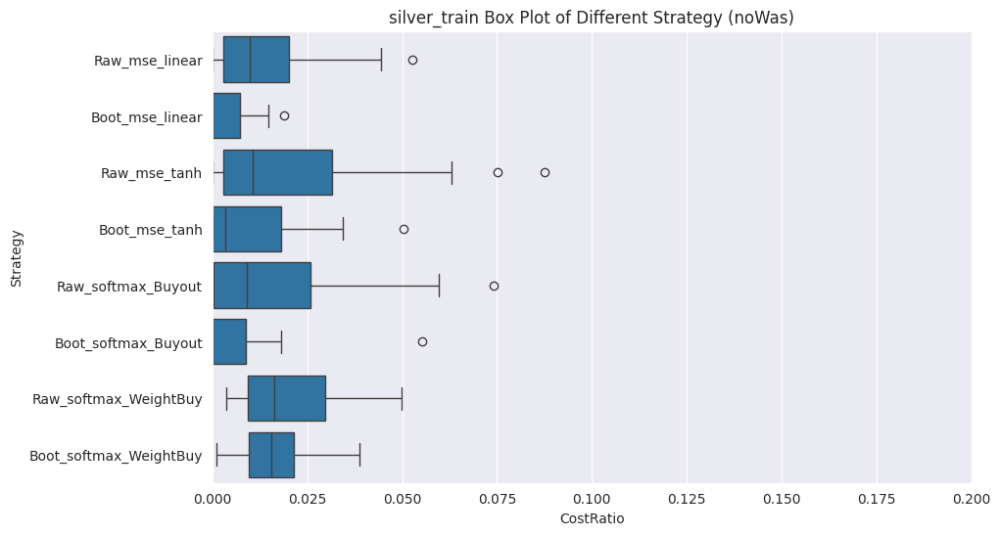

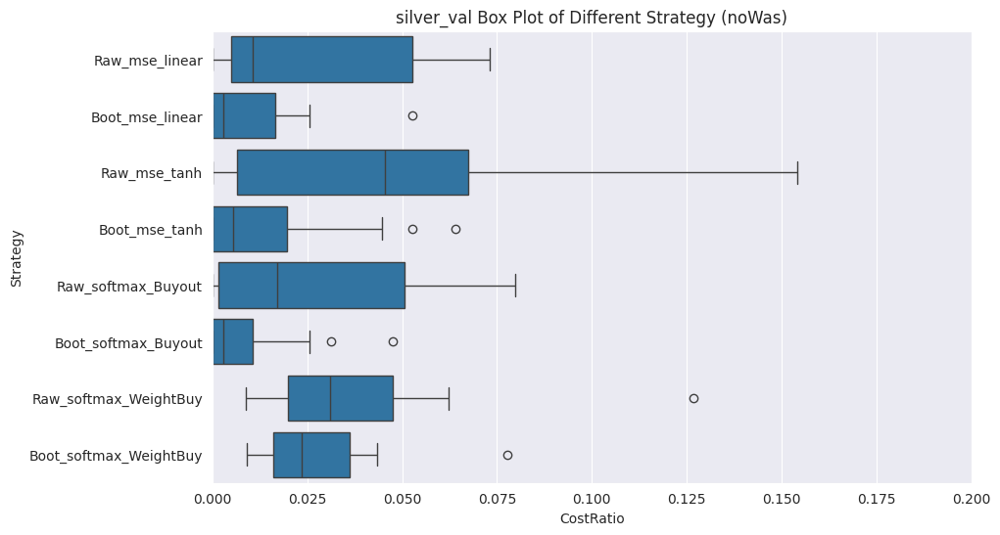

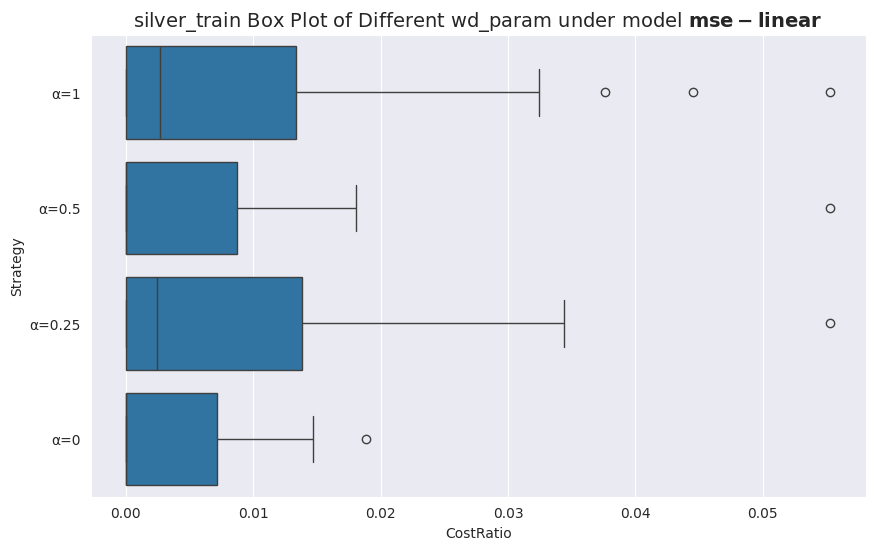

615.9426800000001
615.9426800000001
615.9426800000001
615.9426800000001


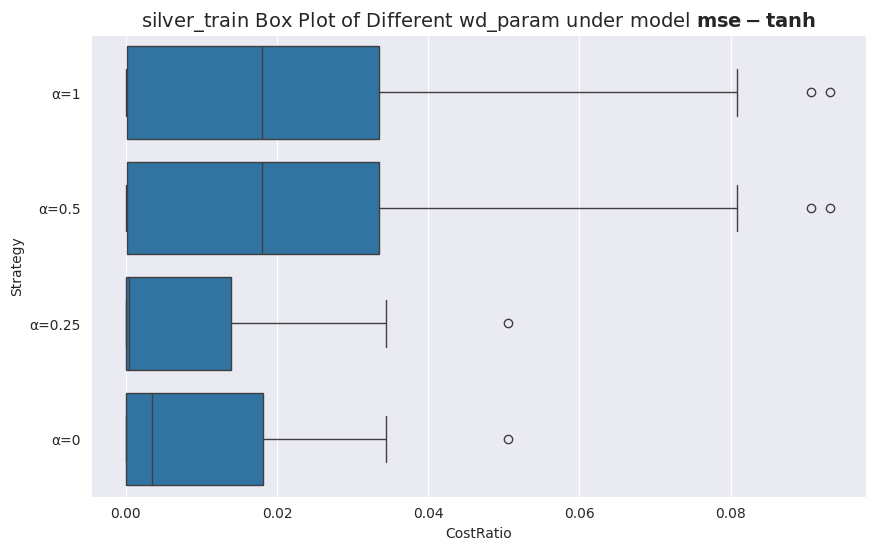

615.9426800000001
615.9426800000001
615.9426800000001
615.9426800000001


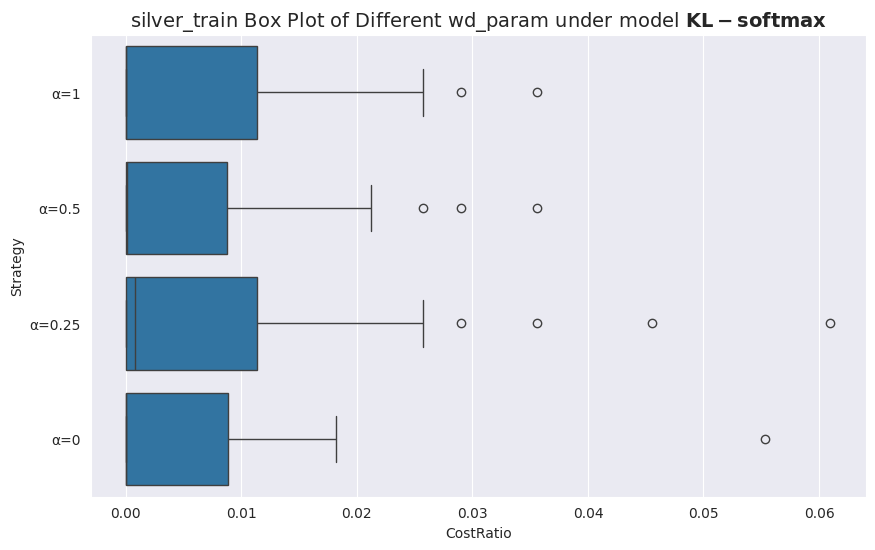

615.9426800000001
615.9426800000001
615.9426800000001
615.9426800000001


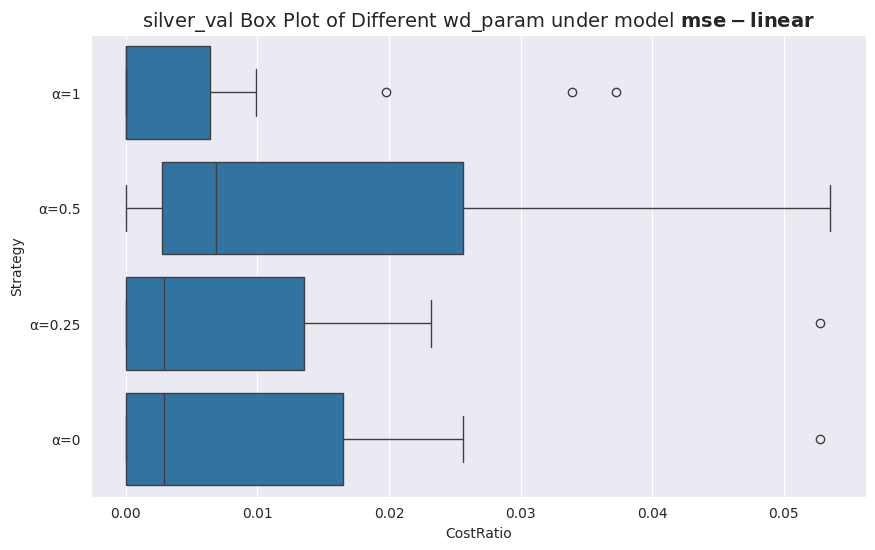

498.84164
498.84164
498.84164
498.84164


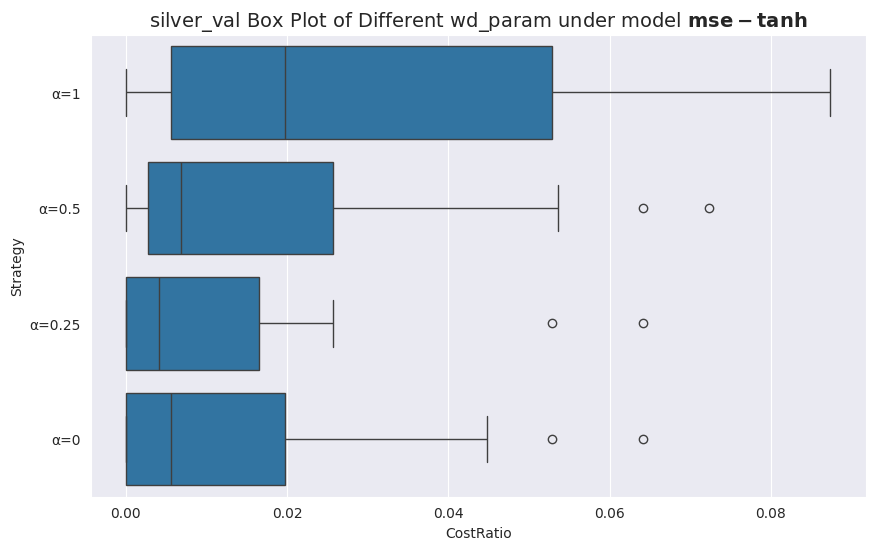

498.84164
498.84164
498.84164
498.84164


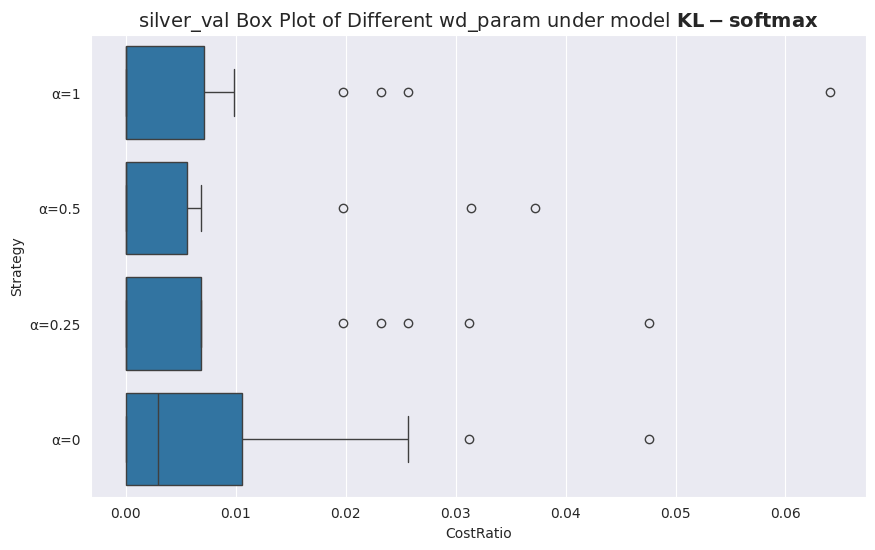

498.84164
498.84164
498.84164
498.84164


In [ ]:
# noWas
## train
silver_data_train = cost_func(raw_y, bootAll_y, raw_pred_y, bootAll_pred_y, raw_pred_y1, bootAll_pred_y1, raw_y2, bootAll_y2, raw_pred_y2, bootAll_pred_y2, x_bs_train_wsRReal, x_bs_train_wsRReal, 'silver', 'train')

## val
silver_data = cost_func(raw_y_val, bootAll_y_val, raw_pred_y_val, bootAll_pred_y_val, raw_pred_y_val1, bootAll_pred_y_val1, raw_y_val2, bootAll_y_val2, raw_pred_y_val2, bootAll_pred_y_val2, x_val_wsRReal, x_val_wsRReal, 'silver', 'val')

# was
## train
silver_data_was = cost_func_forWas(bootAll_y_was, bootAll_y_pred_was, bootAll_y_pred_was_1, bootAll_y_pred_was_2, bootAll_pred_y, x_bs_train_wsRReal, 'silver', 'mse-linear', 'train')
silver_data_was_m2 = cost_func_forWas(bootAll_y_was1, bootAll_y_pred_was1, bootAll_y_pred_was1_1, bootAll_y_pred_was1_2, bootAll_pred_y1, x_bs_train_wsRReal, 'silver', 'mse-tanh', 'train')
silver_data_was_m3 = cost_func_forWas(bootAll_y_was2, bootAll_y_pred_was2, bootAll_y_pred_was2_1, bootAll_y_pred_was2_2, bootAll_pred_y2, x_bs_train_wsRReal, 'silver', 'KL-softmax', 'train')

## val
silver_data_was = cost_func_forWas(bootAll_y_val_was, bootAll_y_pred_val_was, bootAll_y_pred_val_was_1, bootAll_y_pred_val_was_2, bootAll_pred_y_val, x_val_wsRReal, 'silver', 'mse-linear', 'val')
silver_data_was_m1 = cost_func_forWas(bootAll_y_val_was1, bootAll_y_pred_val_was1, bootAll_y_pred_val_was1_1, bootAll_y_pred_val_was1_2, bootAll_pred_y_val1, x_val_wsRReal, 'silver','mse-tanh', 'val')
silver_data_was_m2 = cost_func_forWas(bootAll_y_val_was2, bootAll_y_pred_val_was2, bootAll_y_pred_val_was2_1, bootAll_y_pred_val_was2_2, bootAll_pred_y_val2, x_val_wsRReal, 'silver', 'KL-softmax', 'val')

#### y_test 真實資料 (右下那組) 與預測資料的比較

In [ ]:
image_paths = [f'{save_path}/image{i}.png' for i in range(1, 6)]
image_paths = [
    f'{save_path}/histograms_noteasy_0_0_s.png',
    f'{save_path}/histograms_noteasy_0_1_s.png',
    f'{save_path}/histograms_noteasy_0_2_s.png',
    f'{save_path}/histograms_noteasy_1_0_s.png',
    f'{save_path}/histograms_easy_0_0_s.png',
    f'{save_path}/silver_y_test.png'
]
# 創建一個大的圖框，並設定每個子圖的位置
plt.figure(figsize=(100, 62))  # 可以調整整體圖片的大小

for i, path in enumerate(image_paths):
    # 加載圖片
    img = mpimg.imread(path)
    # 添加子圖 (假設要5行1列，這裡的5和1可以按實際需要調整排列方式)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')  # 不顯示坐標軸

### gold


In [ ]:
# Raw Data
raw_bestg = get_best_hyparams(X_train_gRegReal, X_test_gRegReal, y_train_gRegReal, 0)
raw_bestg1 = get_best_hyparams(X_train_gRegReal, X_test_gRegReal, y_train_gRegReal, 1)
raw_bestg2 = get_best_hyparams(X_train_gReal, X_test_gReal, y_train_gReal, 2)

# BootAll Data
boot_bestg = get_best_hyparams(X_train_gReg, X_test_gReg, y_train_gReg, 0)
boot_bestg1 = get_best_hyparams(X_train_gReg, X_test_gReg, y_train_gReg, 1)
boot_bestg2 = get_best_hyparams(X_train_g, X_test_g, y_train_g, 2)

 20%|██        | 4/20 [00:16<00:54,  3.40s/trial, best loss: -50.45743942260742]

 25%|██▌       | 5/20 [00:18<00:45,  3.03s/trial, best loss: -50.45743942260742]

100%|██████████| 20/20 [01:38<00:00,  4.94s/trial, best loss: -0.07500588148832321]


In [ ]:
g_dropoutRaw, g_lrRaw, g_rl2Raw, g_unitsRaw = raw_bestg['dropout'], raw_bestg['learning_rate'], raw_bestg['l2_reg'], overallUnits[raw_bestg['units']]
g_dropoutRaw1, g_lrRaw1, g_rl2Raw1, g_unitsRaw1 = raw_bestg1['dropout'], raw_bestg1['learning_rate'], raw_bestg1['l2_reg'], overallUnits[raw_bestg1['units']]
g_dropoutRaw2, g_lrRaw2, g_rl2Raw2, g_unitsRaw2 = raw_bestg2['dropout'], raw_bestg2['learning_rate'], raw_bestg2['l2_reg'], overallUnits[raw_bestg2['units']]

g_dropoutBoot, g_lrBoot, g_rl2Boot, g_unitsBoot = boot_bestg['dropout'], boot_bestg['learning_rate'], boot_bestg['l2_reg'], overallUnits[boot_bestg['units']]
g_dropoutBoot1, g_lrBoot1, g_rl2Boot1, g_unitsBoot1 = boot_bestg1['dropout'], boot_bestg1['learning_rate'], boot_bestg1['l2_reg'], overallUnits[boot_bestg1['units']]
g_dropoutBoot2, g_lrBoot2, g_rl2Boot2, g_unitsBoot2 = boot_bestg2['dropout'], boot_bestg2['learning_rate'], boot_bestg2['l2_reg'], overallUnits[boot_bestg2['units']]

In [ ]:
# noWas
# # TrainReal
# ## Raw
# yOutcomeListRawg = model_train(X_train_gRegReal, X_test_gRegReal, y_train_gRegReal, y_test_gRegReal, X_train_gRegReal, y_train_gRegReal, 'noteasy', 0, 0, 'gold', g_unitsRaw, g_lrRaw, g_dropoutRaw, g_rl2Raw, 1, 'train')
# yOutcomeListRawg1 = model_train(X_train_gRegReal, X_test_gRegReal, y_train_gRegReal, y_test_gRegReal, X_train_gRegReal, y_train_gRegReal, 'noteasy', 0, 1, 'gold', g_unitsRaw1, g_lrRaw1, g_dropoutRaw1, g_rl2Raw1, 1, 'train')
# yOutcomeListRawg2 = model_train(X_train_gReal, X_test_gReal, y_train_gReal, y_test_gReal, X_train_gReal, y_train_gReal, 'noteasy', 0, 2, 'gold', g_unitsRaw2, g_lrRaw2, g_dropoutRaw2, g_rl2Raw2, 1, 'train')

# ## BootAll
# yOutcomeListg = model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, X_train_gRegReal, y_train_gRegReal, 'noteasy', 0, 0, 'gold', g_unitsBoot, g_lrBoot, g_dropoutBoot, g_rl2Boot, 0, 'train')
# yOutcomeListg1 = model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, X_train_gRegReal, y_train_gRegReal, 'noteasy', 0, 1, 'gold', g_unitsBoot1, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 0, 'train')
# yOutcomeListg2 = model_train(X_train_g, X_test_g, y_train_g, y_train_g, X_train_gReal, y_train_gReal, 'noteasy', 0, 2, 'gold', g_unitsBoot2, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 0, 'train')

# ValReal
## Raw
yValRawg = model_train(X_train_gRegReal, X_test_gRegReal, y_train_gRegReal, y_train_gRegReal, X_test_gRegReal, y_test_gRegReal, 'noteasy', 0, 0, 'gold', g_unitsRaw, g_lrRaw, g_dropoutRaw, g_rl2Raw, 1, 'val')
yValRawg1 = model_train(X_train_gRegReal, X_test_gRegReal, y_train_gRegReal, y_train_gRegReal, X_test_gRegReal, y_test_gRegReal, 'noteasy', 0, 1, 'gold', g_unitsRaw1, g_lrRaw1, g_dropoutRaw1, g_rl2Raw1, 1, 'val')
yValRawg2 = model_train(X_train_gReal, X_test_gReal, y_train_gReal, y_train_gReal, X_test_gReal, y_test_gReal, 'noteasy', 0, 2, 'gold', g_unitsRaw2, g_lrRaw2, g_dropoutRaw2, g_rl2Raw2, 1, 'val')

## BootAll
yValBootg = model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, X_test_gRegReal, y_test_gRegReal, 'noteasy', 0, 0, 'gold', g_unitsBoot, g_lrBoot, g_dropoutBoot, g_rl2Boot, 0, 'val')
yValBootg1 = model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, X_test_gRegReal, y_test_gRegReal, 'noteasy', 0 , 1, 'gold', g_unitsBoot1, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 0, 'val')
yValBootg2 = model_train(X_train_g, X_test_g, y_train_g, y_train_g, X_test_gReal, y_test_gReal, 'noteasy', 0, 2, 'gold', g_unitsBoot2, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 0, 'val')

Instructions for updating:
Colocations handled automatically by placer.


In [ ]:
# np.save(f'{save_path}/gold/yOutcomeListRawg.npy', yOutcomeListRawg)
# np.save(f'{save_path}/gold/yOutcomeListg.npy', yOutcomeListg)
# np.save(f'{save_path}/gold/yOutcomeListRawg1.npy', yOutcomeListRawg1)
# np.save(f'{save_path}/gold/yOutcomeListg1.npy', yOutcomeListg1)
# np.save(f'{save_path}/gold/yOutcomeListRawg2.npy', yOutcomeListRawg2)
# np.save(f'{save_path}/gold/yOutcomeListg2.npy', yOutcomeListg2)

np.save(f'{save_path}/gold/yValRawg.npy', yValRawg)
np.save(f'{save_path}/gold/yValRawg1.npy', yValRawg1)
np.save(f'{save_path}/gold/yValRawg2.npy', yValRawg2)
np.save(f'{save_path}/gold/yValBootg.npy', yValBootg)
np.save(f'{save_path}/gold/yValBootg1.npy', yValBootg1)
np.save(f'{save_path}/gold/yValBootg2.npy', yValBootg2)

In [ ]:
# Was
# # TrainReal
# ## BootAll
# ### wd_param=1
# yTrainWas= model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_test_gReg, X_train_gRegReal, y_train_gRegReal, 'noteasy', 1, 0, 'gold', g_unitsRaw, g_lrRaw, g_dropoutRaw, g_rl2Raw, 1, 'train')
# yTrainWas1= model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_test_gReg, X_train_gRegReal, y_train_gRegReal, 'noteasy', 1, 1, 'gold', g_unitsRaw1, g_lrRaw1, g_dropoutRaw1, g_rl2Raw1, 1, 'train')
# yTrainWas2= model_train(X_train_g, X_test_g, y_train_g, y_test_g, X_train_gReal, y_train_gReal, 'noteasy', 1, 2, 'gold', g_unitsRaw2, g_lrRaw2, g_dropoutRaw2, g_rl2Raw2, 1, 'train')

# ### wd_param=0.5
# yTrainWas_1= model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_test_gReg, X_train_gRegReal, y_train_gRegReal, 'noteasy', 0.5, 0, 'gold', g_unitsRaw, g_lrRaw, g_dropoutRaw, g_rl2Raw, 1, 'train')
# yTrainWas1_1= model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_test_gReg, X_train_gRegReal, y_train_gRegReal, 'noteasy', 0.5, 1, 'gold', g_unitsRaw1, g_lrRaw1, g_dropoutRaw1, g_rl2Raw1, 1, 'train')
# yTrainWas2_1= model_train(X_train_g, X_test_g, y_train_g, y_test_g, X_train_gReal, y_train_gReal, 'noteasy', 0.5, 2, 'gold', g_unitsRaw2, g_lrRaw2, g_dropoutRaw2, g_rl2Raw2, 1, 'train')

# ### wd_param=0.25
# yTrainWas_2 = model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_test_gReg, X_train_gRegReal, y_train_gRegReal, 'noteasy', 0.25, 0, 'gold', g_unitsRaw, g_lrRaw, g_dropoutRaw, g_rl2Raw, 1, 'train')
# yTrainWas1_2 = model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_test_gReg, X_train_gRegReal, y_train_gRegReal, 'noteasy', 0.25, 1, 'gold', g_unitsRaw1, g_lrRaw1, g_dropoutRaw1, g_rl2Raw1, 1, 'train')
# yTrainWas2_2 = model_train(X_train_g, X_test_g, y_train_g, y_test_g, X_train_gReal, y_train_gReal, 'noteasy', 0.25, 2, 'gold', g_unitsRaw2, g_lrRaw2, g_dropoutRaw2, g_rl2Raw2, 1, 'train')

# ValReal
## BootAll
### wd_param=1
yValWasg= model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, X_test_gRegReal, y_test_gRegReal, 'noteasy', 1, 0, 'gold', g_unitsBoot, g_lrBoot, g_dropoutBoot, g_rl2Boot, 1, 'val')
yValWasg1= model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, X_test_gRegReal, y_test_gRegReal, 'noteasy', 1, 1, 'gold', g_unitsBoot1, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 1, 'val')
yValWasg2= model_train(X_train_g, X_test_g, y_train_g, y_train_g, X_test_gReal, y_test_gReal, 'noteasy', 1, 2, 'gold', g_unitsBoot2, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 1, 'val')

### wd_param=0.5
yValWasg_1= model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, X_test_gRegReal, y_test_gRegReal, 'noteasy', 0.5, 0, 'gold', g_unitsBoot, g_lrBoot, g_dropoutBoot, g_rl2Boot, 1, 'val')
yValWasg1_1= model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, X_test_gRegReal, y_test_gRegReal, 'noteasy', 0.5, 1, 'gold', g_unitsBoot1, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 1, 'val')
yValWasg2_1= model_train(X_train_g, X_test_g, y_train_g, y_train_g, X_test_gReal, y_test_gReal, 'noteasy', 0.5, 2, 'gold', g_unitsBoot2, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 1, 'val')

### wd_param=0.25
yValWasg_2= model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, X_test_gRegReal, y_test_gRegReal, 'noteasy', 0.25, 0, 'gold', g_unitsBoot, g_lrBoot, g_dropoutBoot, g_rl2Boot, 1, 'val')
yValWasg1_2= model_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, X_test_gRegReal, y_test_gRegReal, 'noteasy', 0.25, 1, 'gold', g_unitsBoot1, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 1, 'val')
yValWasg2_2= model_train(X_train_g, X_test_g, y_train_g, y_train_g, X_test_gReal, y_test_gReal, 'noteasy', 0.25, 2, 'gold', g_unitsBoot2, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 1, 'val')

In [ ]:
# Was
# ValReal
## BootAll
### wd_param=1
yFinalWasg= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 1, 0, 'gold', g_unitsBoot, g_lrBoot, g_dropoutBoot, g_rl2Boot, 1, 'val')
yFinalWasg1= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 1, 1, 'gold', 128, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 1, 'val')
yFinalWasg2= final_train(X_train_g, X_test_g, y_train_g, y_train_g, x_final_wgR, y_final_wgR, 'noteasy', 1, 2, 'gold', 64, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 1, 'val')

### wd_param=0.5
yFinalWasg_1= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 0.5, 0, 'gold', g_unitsBoot, g_lrBoot, g_dropoutBoot, g_rl2Boot, 1, 'val')
yFinalWasg1_1= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 0.5, 1, 'gold', 128, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 1, 'val')
yFinalWasg2_1= final_train(X_train_g, X_test_g, y_train_g, y_train_g, x_final_wgR, y_final_wgR, 'noteasy', 0.5, 2, 'gold', 64, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 1, 'val')

### wd_param=0.25
yFinalWasg_2= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 0.25, 0, 'gold', g_unitsBoot, g_lrBoot, g_dropoutBoot, g_rl2Boot, 1, 'val')
yFinalWasg1_2= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 0.25, 1, 'gold', 128, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 1, 'val')
yFinalWasg2_2= final_train(X_train_g, X_test_g, y_train_g, y_train_g, x_final_wgR, y_final_wgR, 'noteasy', 0.25, 2, 'gold', 64, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 1, 'val')

### wd_param=0
yFinalWasg_3= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 0, 0, 'gold', 256, g_lrBoot, g_dropoutBoot, g_rl2Boot, 1, 'val')
yFinalWasg1_3= final_train(X_train_gReg, X_test_gReg, y_train_gReg, y_train_gReg, x_final_wReg_gR, y_final_wReg_gR, 'noteasy', 0, 1, 'gold', 128, g_lrBoot1, g_dropoutBoot1, g_rl2Boot1, 1, 'val')
yFinalWasg2_3= final_train(X_train_g, X_test_g, y_train_g, y_train_g, x_final_wgR, y_final_wgR, 'noteasy', 0, 2, 'gold', 128, g_lrBoot2, g_dropoutBoot2, g_rl2Boot2, 1, 'val')

1/1 [==============================] - 0s 235ms/step


In [ ]:
np.save(f'{save_path}/gold/yFinalWasg.npy', yFinalWasg)
np.save(f'{save_path}/gold/yFinalWasg1.npy', yFinalWasg1)
np.save(f'{save_path}/gold/yFinalWasg2.npy', yFinalWasg2)

np.save(f'{save_path}/gold/yFinalWasg_1.npy', yFinalWasg_1)
np.save(f'{save_path}/gold/yFinalWasg1_1.npy', yFinalWasg1_1)
np.save(f'{save_path}/gold/yFinalWasg2_1.npy', yFinalWasg2_1)

np.save(f'{save_path}/gold/yFinalWasg_2.npy', yFinalWasg_2)
np.save(f'{save_path}/gold/yFinalWasg1_2.npy', yFinalWasg1_2)
np.save(f'{save_path}/gold/yFinalWasg2_2.npy', yFinalWasg2_2)

np.save(f'{save_path}/gold/yFinalWasg_3.npy', yFinalWasg_3)
np.save(f'{save_path}/gold/yFinalWasg1_3.npy', yFinalWasg1_3)
np.save(f'{save_path}/gold/yFinalWasg2_3.npy', yFinalWasg2_3)

In [ ]:
# np.save(f'{save_path}/gold/yTrainWas.npy', yTrainWas)
# np.save(f'{save_path}/gold/yTrainWas1.npy', yTrainWas1)
# np.save(f'{save_path}/gold/yTrainWas2.npy', yTrainWas2)

# np.save(f'{save_path}/gold/yTrainWas_1.npy', yTrainWas_1)
# np.save(f'{save_path}/gold/yTrainWas1_1.npy', yTrainWas1_1)
# np.save(f'{save_path}/gold/yTrainWas2_1.npy', yTrainWas2_1)

# np.save(f'{save_path}/gold/yTrainWas_2.npy', yTrainWas_2)
# np.save(f'{save_path}/gold/yTrainWas1_2.npy', yTrainWas1_2)
# np.save(f'{save_path}/gold/yTrainWas2_2.npy', yTrainWas2_2)

np.save(f'{save_path}/gold/yValWas.npy', yValWasg)
np.save(f'{save_path}/gold/yValWas1.npy', yValWasg1)
np.save(f'{save_path}/gold/yValWas2.npy', yValWasg2)

np.save(f'{save_path}/gold/yValWas_1.npy', yValWasg_1)
np.save(f'{save_path}/gold/yValWas1_1.npy', yValWasg1_1)
np.save(f'{save_path}/gold/yValWas2_1.npy', yValWasg2_1)

np.save(f'{save_path}/gold/yValWas_2.npy', yValWasg_2)
np.save(f'{save_path}/gold/yValWas1_2.npy', yValWasg1_2)
np.save(f'{save_path}/gold/yValWas2_2.npy', yValWasg2_2)

In [ ]:
# yTrainWas=np.load(f'{save_path}/gold/yTrainWas.npy')
# yTrainWas1=np.load(f'{save_path}/gold/yTrainWas1.npy')
# yTrainWas2=np.load(f'{save_path}/gold/yTrainWas2.npy')

# yTrainWas_1=np.load(f'{save_path}/gold/yTrainWas_1.npy')
# yTrainWas1_1=np.load(f'{save_path}/gold/yTrainWas1_1.npy')
# yTrainWas2_1=np.load(f'{save_path}/gold/yTrainWas2_1.npy')

# yTrainWas_2=np.load(f'{save_path}/gold/yTrainWas_2.npy')
# yTrainWas1_2=np.load(f'{save_path}/gold/yTrainWas1_2.npy')
# yTrainWas2_2=np.load(f'{save_path}/gold/yTrainWas2_2.npy')

yValWasg=np.load(f'{save_path}/gold/yValWas.npy')
yValWasg1=np.load(f'{save_path}/gold/yValWas1.npy')
yValWasg2=np.load(f'{save_path}/gold/yValWas2.npy')

yValWasg_1=np.load(f'{save_path}/gold/yValWas_1.npy')
yValWasg1_1=np.load(f'{save_path}/gold/yValWas1_1.npy')
yValWasg2_1=np.load(f'{save_path}/gold/yValWas2_1.npy')

yValWasg_2=np.load(f'{save_path}/gold/yValWas_2.npy')
yValWasg1_2=np.load(f'{save_path}/gold/yValWas1_2.npy')
yValWasg2_2=np.load(f'{save_path}/gold/yValWas2_2.npy')

In [ ]:
yOutcomeListRawg=np.load(f'{save_path}/gold/yOutcomeListRawg.npy')
yOutcomeListg=np.load(f'{save_path}/gold/yOutcomeListg.npy')
yOutcomeListRawg1=np.load(f'{save_path}/gold/yOutcomeListRawg1.npy')
yOutcomeListg1=np.load(f'{save_path}/gold/yOutcomeListg1.npy')
yOutcomeListRawg2=np.load(f'{save_path}/gold/yOutcomeListRawg2.npy')
yOutcomeListg2=np.load(f'{save_path}/gold/yOutcomeListg2.npy')

yValRawg=np.load(f'{save_path}/gold/yValRawg.npy')
yValRawg1=np.load(f'{save_path}/gold/yValRawg1.npy')
yValRawg2=np.load(f'{save_path}/gold/yValRawg2.npy')
yValBootg=np.load(f'{save_path}/gold/yValBootg.npy')
yValBootg1=np.load(f'{save_path}/gold/yValBootg1.npy')
yValBootg2=np.load(f'{save_path}/gold/yValBootg2.npy')

In [ ]:
raw_y_valg=yValRawg[0]
bootAll_y_valg=yValBootg[0]
raw_pred_y_valg=yValRawg[1]
bootAll_pred_y_valg=yValBootg[1]

raw_y_valg1=yValRawg1[0]
bootAll_y_valg1=yValBootg1[0]
raw_pred_y_valg1=yValRawg1[1]
bootAll_pred_y_valg1=yValBootg1[1]

raw_y_valg2=yValRawg2[0]
bootAll_y_valg2=yValBootg2[0]
raw_pred_y_valg2=yValRawg2[1]
bootAll_pred_y_valg2=yValBootg2[1]

In [ ]:
raw_yg=yOutcomeListRawg[0]
bootAll_yg=yOutcomeListg[0]
raw_pred_yg=yOutcomeListRawg[1]
bootAll_pred_yg=yOutcomeListg[1]

raw_yg1=yOutcomeListRawg1[0]
bootAll_yg1=yOutcomeListg1[0]
raw_pred_yg1=yOutcomeListRawg1[1]
bootAll_pred_yg1=yOutcomeListg1[1]

raw_yg2=yOutcomeListRawg2[0]
bootAll_yg2=yOutcomeListg2[0]
raw_pred_yg2=yOutcomeListRawg2[1]
bootAll_pred_yg2=yOutcomeListg2[1]

In [ ]:
yFinalWasg=np.load(f'{save_path}/gold/yFinalWasg.npy')
yFinalWasg1=np.load(f'{save_path}/gold/yFinalWasg1.npy')
yFinalWasg2=np.load(f'{save_path}/gold/yFinalWasg2.npy')

yFinalWasg_1=np.load(f'{save_path}/gold/yFinalWasg_1.npy')
yFinalWasg1_1=np.load(f'{save_path}/gold/yFinalWasg1_1.npy')
yFinalWasg2_1=np.load(f'{save_path}/gold/yFinalWasg2_1.npy')

yFinalWasg_2=np.load(f'{save_path}/gold/yFinalWasg_2.npy')
yFinalWasg1_2=np.load(f'{save_path}/gold/yFinalWasg1_2.npy')
yFinalWasg2_2=np.load(f'{save_path}/gold/yFinalWasg2_2.npy')

yFinalWasg_3=np.load(f'{save_path}/gold/yFinalWasg_3.npy')
yFinalWasg1_3=np.load(f'{save_path}/gold/yFinalWasg1_3.npy')
yFinalWasg2_3=np.load(f'{save_path}/gold/yFinalWasg2_3.npy')

In [ ]:
# Was
## x_final
### wd_param=1
bootAll_y_final_wasg=yFinalWasg[0]
bootAll_y_fpred_wasg=yFinalWasg[1]

bootAll_y_final_wasg1=yFinalWasg1[0]
bootAll_y_fpred_wasg1=yFinalWasg1[1]

bootAll_y_final_wasg2=yFinalWasg2[0]
bootAll_y_fpred_wasg2=yFinalWasg2[1]

### wd_param=0.5
bootAll_y_final_wasg_1=yFinalWasg_1[0]
bootAll_y_fpred_wasg_1=yFinalWasg_1[1]

bootAll_y_final_wasg1_1=yFinalWasg1_1[0]
bootAll_y_fpred_wasg1_1=yFinalWasg1_1[1]

bootAll_y_final_wasg2_1=yFinalWasg2_1[0]
bootAll_y_fpred_wasg2_1=yFinalWasg2_1[1]

### wd_param=0.25
bootAll_y_final_wasg_2=yFinalWasg_2[0]
bootAll_y_fpred_wasg_2=yFinalWasg_2[1]

bootAll_y_final_wasg1_2=yFinalWasg1_2[0]
bootAll_y_fpred_wasg1_2=yFinalWasg1_2[1]

bootAll_y_final_wasg2_2=yFinalWasg2_2[0]
bootAll_y_fpred_wasg2_2=yFinalWasg2_2[1]

### wd_param=0
bootAll_y_final_wasg_3=yFinalWasg_3[0]
bootAll_y_fpred_wasg_3=yFinalWasg_3[1]

bootAll_y_final_wasg1_3=yFinalWasg1_3[0]
bootAll_y_fpred_wasg1_3=yFinalWasg1_3[1]

bootAll_y_final_wasg2_3=yFinalWasg2_3[0]
bootAll_y_fpred_wasg2_3=yFinalWasg2_3[1]

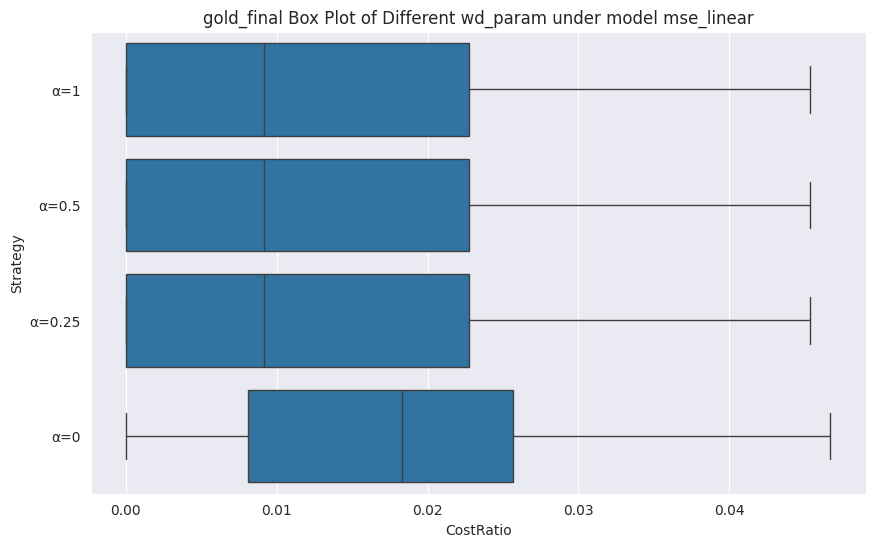

14296.95582
14296.95582
14296.95582
14296.95582


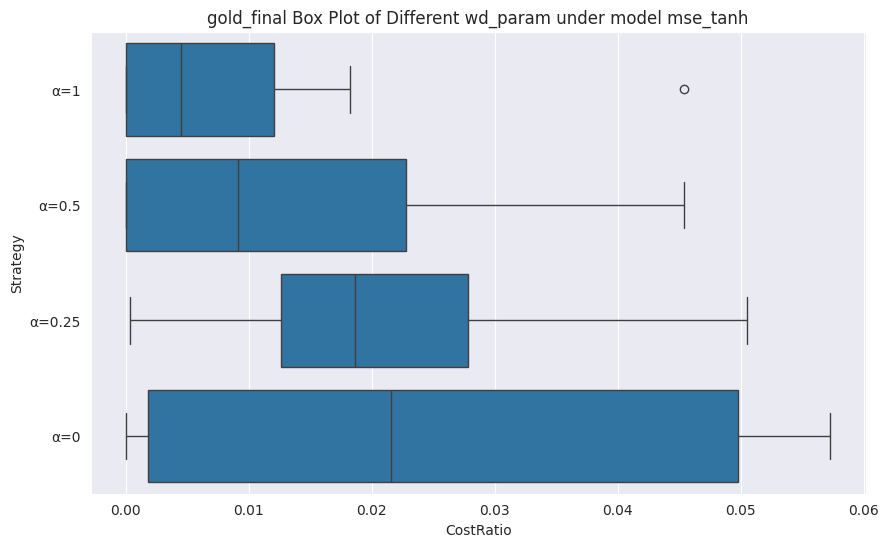

14296.95582
14296.95582
14296.95582
14296.95582


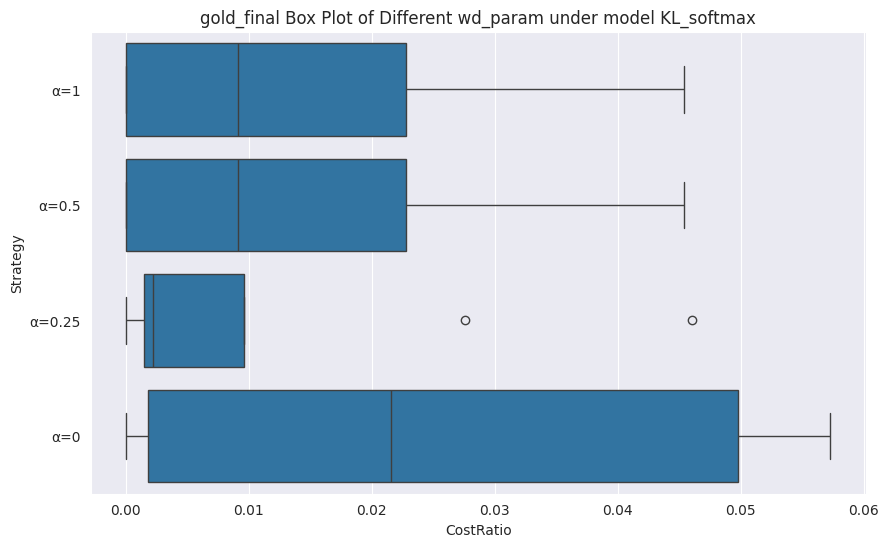

14296.95582
14296.95582
14296.95582
14296.95582


In [ ]:
## val
gold_final_was = cost_func_forWas(bootAll_y_final_wasg, bootAll_y_fpred_wasg, bootAll_y_fpred_wasg_1, bootAll_y_fpred_wasg_2, bootAll_y_fpred_wasg_3, x_final_real_wgR, 'gold', 'mse_linear', 'final')
gold_final_was_m1 = cost_func_forWas(bootAll_y_final_wasg1, bootAll_y_fpred_wasg1, bootAll_y_fpred_wasg1_1, bootAll_y_fpred_wasg1_2, bootAll_y_fpred_wasg1_3, x_final_real_wgR, 'gold', 'mse_tanh', 'final')
gold_final_was_m2 = cost_func_forWas(bootAll_y_final_wasg2, bootAll_y_fpred_wasg2, bootAll_y_fpred_wasg2_1, bootAll_y_fpred_wasg2_2, bootAll_y_fpred_wasg2_3, x_final_real_wgR, 'gold', 'KL_softmax', 'final')

In [ ]:
# Was
## x_val
### wd_param=1
bootAll_y_val_wasg=yValWasg[0]
bootAll_y_pred_wasg=yValWasg[1]

bootAll_y_val_wasg1=yValWasg1[0]
bootAll_y_pred_wasg1=yValWasg1[1]

bootAll_y_val_wasg2=yValWasg2[0]
bootAll_y_pred_wasg2=yValWasg2[1]

### wd_param=0.5
bootAll_y_val_wasg_1=yValWasg_1[0]
bootAll_y_pred_wasg_1=yValWasg_1[1]

bootAll_y_val_wasg1_1=yValWasg1_1[0]
bootAll_y_pred_wasg1_1=yValWasg1_1[1]

bootAll_y_val_wasg2_1=yValWasg2_1[0]
bootAll_y_pred_wasg2_1=yValWasg2_1[1]

### wd_param=0.25
bootAll_y_val_wasg_2=yValWasg_2[0]
bootAll_y_pred_wasg_2=yValWasg_2[1]

bootAll_y_val_wasg1_2=yValWasg1_2[0]
bootAll_y_pred_wasg1_2=yValWasg1_2[1]

bootAll_y_val_wasg2_2=yValWasg2_2[0]
bootAll_y_pred_wasg2_2=yValWasg2_2[1]

In [ ]:
x_bs_train_wsReal[0]

array([16.69700087, 16.66517535, 16.68939233, 16.72181816, 16.92665198,
       16.90733659, 16.91659506, 17.16669806, 17.1692921 , 17.32338908])

In [ ]:
x_val_wsReal[5]

array([24.2125668 , 24.21392675, 24.23091522, 24.26593741, 24.03129975,
       24.10379058, 24.11516551, 23.60278319, 23.68368512, 24.64772828])

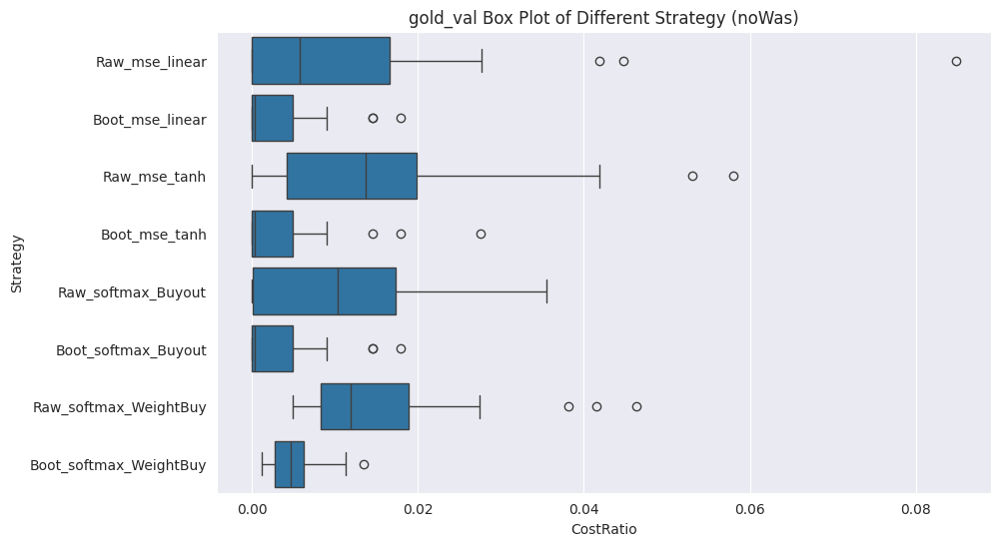

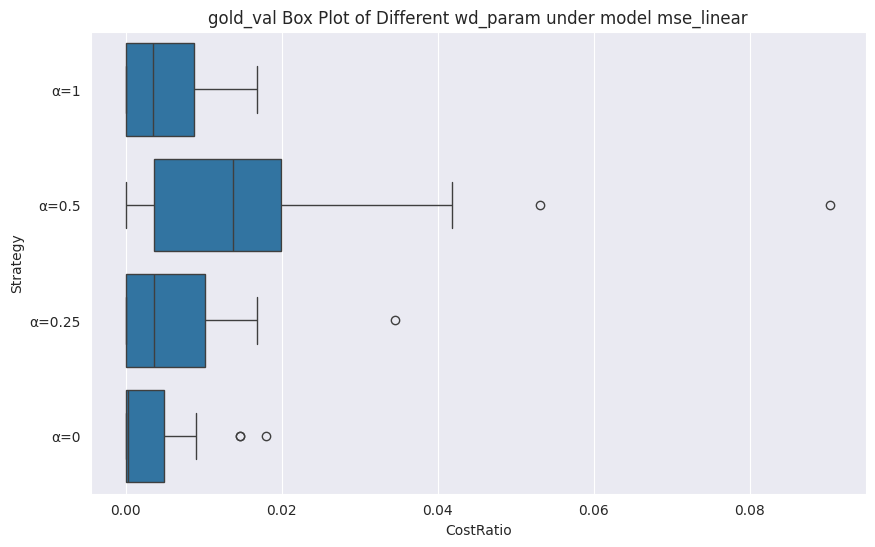

41146.5021
41146.5021
41146.5021
41146.5021


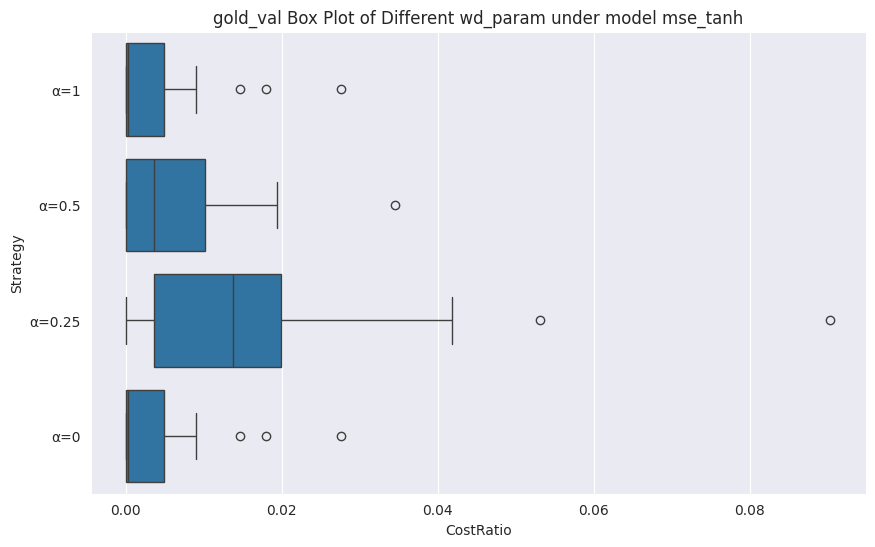

41146.5021
41146.5021
41146.5021
41146.5021


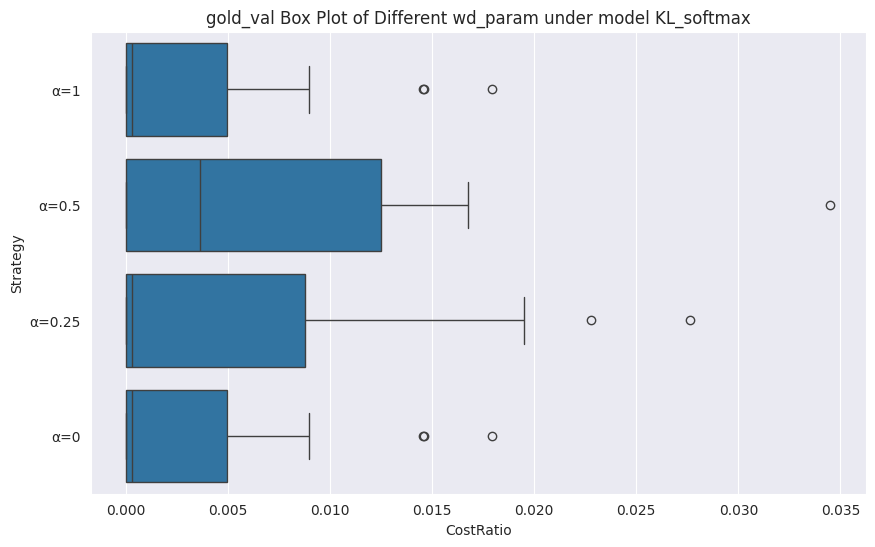

41146.5021
41146.5021
41146.5021
41146.5021


In [ ]:
## val
gold_data = cost_func(raw_y_valg, bootAll_y_valg, raw_pred_y_valg, bootAll_pred_y_valg, raw_pred_y_valg1, bootAll_pred_y_valg1, raw_y_valg2, bootAll_y_valg2, raw_pred_y_valg2, bootAll_pred_y_valg2, x_val_wgRReal, x_val_wgRReal, 'gold', 'val')

gold_data_was = cost_func_forWas(bootAll_y_val_wasg, bootAll_y_pred_wasg, bootAll_y_pred_wasg_1, bootAll_y_pred_wasg_2, bootAll_pred_y_valg, x_val_wgRReal, 'gold', 'mse_linear', 'val')
gold_data_was_m1 = cost_func_forWas(bootAll_y_val_wasg1, bootAll_y_pred_wasg1, bootAll_y_pred_wasg1_1, bootAll_y_pred_wasg1_2, bootAll_pred_y_valg1, x_val_wgRReal, 'gold', 'mse_tanh', 'val')
gold_data_was_m2 = cost_func_forWas(bootAll_y_val_wasg2, bootAll_y_pred_wasg2, bootAll_y_pred_wasg2_1, bootAll_y_pred_wasg2_2, bootAll_pred_y_valg2, x_val_wgRReal, 'gold', 'KL_softmax', 'val')

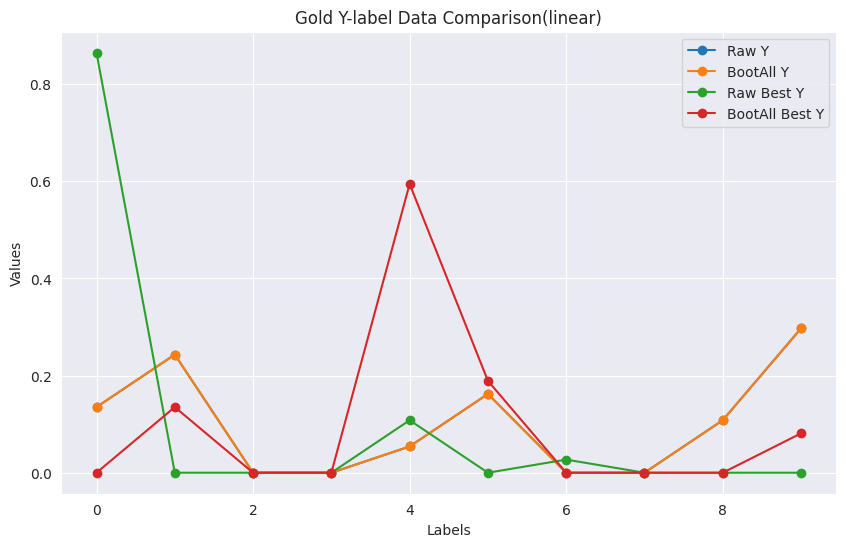

In [ ]:
raw_yg_dict = transform_to_dict(yOutcomeListRawg[0])
bootAll_yg_dict = transform_to_dict(yOutcomeListg[0])
raw_pred_yg_dict = transform_to_dict(yOutcomeListRawg[1])
bootAll_pred_yg_dict = transform_to_dict(yOutcomeListg[1])

labels1g, values1g = zip(*raw_yg_dict.items())
labels2g, values2g = zip(*bootAll_yg_dict.items())
labels3g, values3g = zip(*raw_pred_yg_dict.items())
labels4g, values4g = zip(*bootAll_pred_yg_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels1g, values1g, label='Raw Y', marker='o')
plt.plot(labels2g, values2g, label='BootAll Y', marker='o')
plt.plot(labels3g, values3g, label='Raw Best Y', marker='o')
plt.plot(labels4g, values4g, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('Gold Y-label Data Comparison(linear)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/gold/gold_ytrain_linear.png')

plt.show()

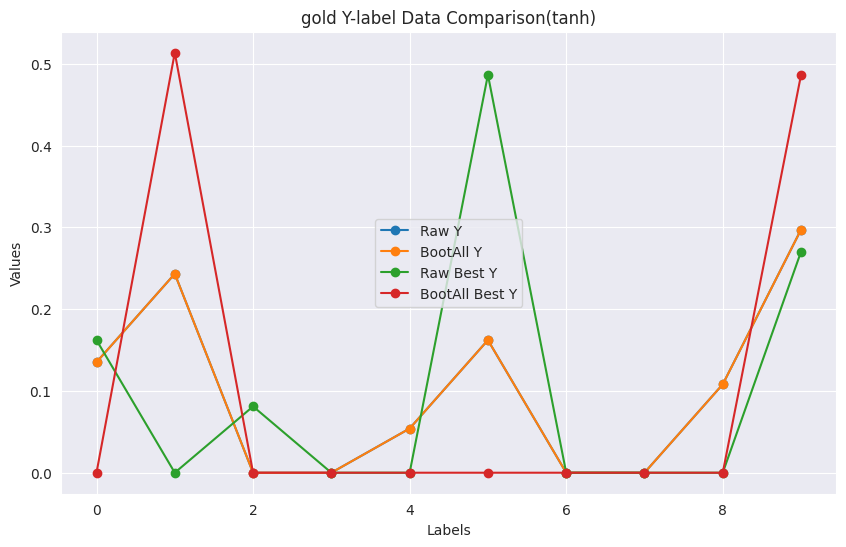

In [ ]:
raw_yg1_dict=transform_to_dict(raw_yg1)
bootAll_yg1_dict=transform_to_dict(bootAll_yg1)
raw_pred_yg1_dict=transform_to_dict(raw_pred_yg1)
bootAll_pred_yg1_dict=transform_to_dict(bootAll_pred_yg1)

labels11g, values11g = zip(*raw_yg1_dict.items())
labels21g, values21g = zip(*bootAll_yg1_dict.items())
labels31g, values31g = zip(*raw_pred_yg1_dict.items())
labels41g, values41g = zip(*bootAll_pred_yg1_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels11g, values11g, label='Raw Y', marker='o')
plt.plot(labels21g, values21g, label='BootAll Y', marker='o')
plt.plot(labels31g, values31g, label='Raw Best Y', marker='o')
plt.plot(labels41g, values41g, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('gold Y-label Data Comparison(tanh)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/gold/gold_ytrain_tanh.png')

plt.show()

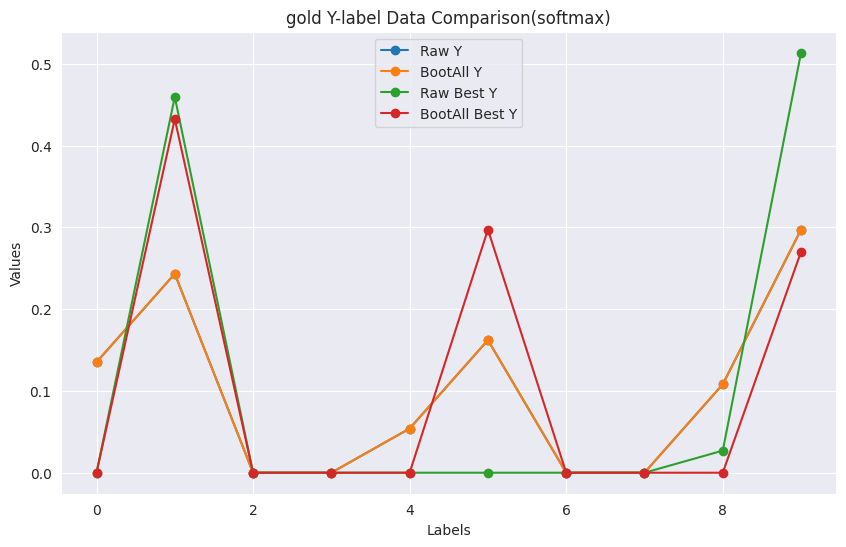

In [ ]:
raw_yg2_dict=transform_to_dict(raw_yg2)
bootAll_yg2_dict=transform_to_dict(bootAll_yg2)
raw_pred_yg2_dict=transform_to_dict(raw_pred_yg2)
bootAll_pred_yg2_dict=transform_to_dict(bootAll_pred_yg2)

labels12g, values12g = zip(*raw_yg2_dict.items())
labels22g, values22g = zip(*bootAll_yg2_dict.items())
labels32g, values32g = zip(*raw_pred_yg2_dict.items())
labels42g, values42g = zip(*bootAll_pred_yg2_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels12g, values12g, label='Raw Y', marker='o')
plt.plot(labels22g, values22g, label='BootAll Y', marker='o')
plt.plot(labels32g, values32g, label='Raw Best Y', marker='o')
plt.plot(labels42g, values42g, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('gold Y-label Data Comparison(softmax)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/gold/gold_ytrain_softmax.png')

plt.show()

#### lossFunc

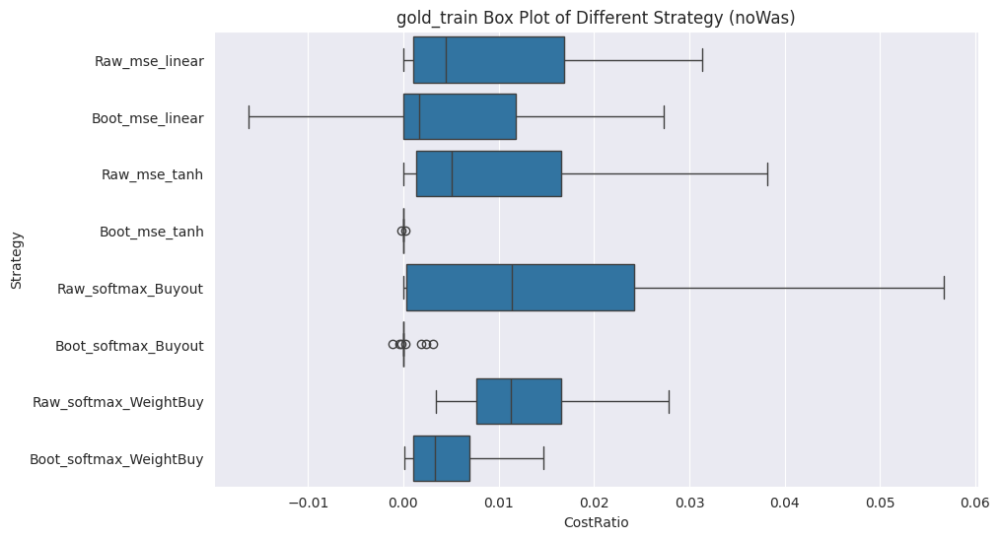

In [ ]:
gold_data = cost_func(raw_yg,bootAll_yg,raw_pred_yg,bootAll_pred_yg,raw_pred_yg1,bootAll_pred_yg1,raw_yg2,bootAll_yg2,raw_pred_yg2,bootAll_pred_yg2,x_bs_train_wgRReal,x_bs_train_wgReal,'gold', 'train')

#### y_test 真實資料 (右下那組) 與預測資料的比較

In [ ]:
image_paths = [f'{save_path}/image{i}.png' for i in range(1, 6)]
image_paths = [
    f'{save_path}/histograms_noteasy_0_0_g.png',
    f'{save_path}/gold_y_train.png',
    f'{save_path}/histograms_noteasy_0_1_g.png',
    f'{save_path}/gold_y_train.png',
    f'{save_path}/histograms_noteasy_0_2_g.png',
    f'{save_path}/gold_y_train.png',
    f'{save_path}/histograms_noteasy_1_0_g.png',
    f'{save_path}/gold_y_train.png',
    f'{save_path}/histograms_easy_0_0_g.png',
    f'{save_path}/gold_y_train.png'
]
# 創建一個大的圖框，並設定每個子圖的位置
plt.figure(figsize=(20, 16))  # 可以調整整體圖片的大小

for i, path in enumerate(image_paths):
    # 加載圖片
    img = mpimg.imread(path)
    # 添加子圖 (假設要5行1列，這裡的5和1可以按實際需要調整排列方式)
    plt.subplot(6, 2, i + 1)
    plt.imshow(img)
    plt.axis('off')  # 不顯示坐標軸

# 調整子圖間隔
plt.subplots_adjust(left=0.05, right=0.95, top=0.9, bottom=0.1, wspace=0.1, hspace=0.2)

# 顯示圖表
plt.show()

In [ ]:
import matplotlib.image as mpimg

In [ ]:
save_path='/content/drive/MyDrive/iLovePDF'

In [ ]:
image_paths = [f'{save_path}/image{i}.png' for i in range(1, 6)]
image_paths = [
    f'{save_path}/histograms_noteasy_0_0_g.png',
    f'{save_path}/histograms_noteasy_0_1_g.png',
    f'{save_path}/histograms_noteasy_0_2_g.png',
    f'{save_path}/histograms_noteasy_1_0_g.png',
    f'{save_path}/histograms_easy_0_0_g.png',
    f'{save_path}/gold_y_test.png'
]
# 創建一個大的圖框，並設定每個子圖的位置
plt.figure(figsize=(100, 62))  # 可以調整整體圖片的大小

for i, path in enumerate(image_paths):
    # 加載圖片
    img = mpimg.imread(path)
    # 添加子圖 (假設要5行1列，這裡的5和1可以按實際需要調整排列方式)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')  # 不顯示坐標軸

In [ ]:
#y_val
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
ax1.bar(x_reg_freq_g, y_reg_freq_g)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_val_Reg_g')
ax1.grid(True)

ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of Key y_val_softmax_g')
ax2.set_xticks(keys)
ax2.grid(True)

plt.tight_layout()
plt.savefig(f'{save_path}/gold_y_test.png')
plt.show()

### soybean

In [ ]:
raw_bestso=get_best_hyparams(X_train_soRegReal, X_test_soRegReal, y_train_soRegReal,0)
raw_bestso1=get_best_hyparams(X_train_soRegReal, X_test_soRegReal, y_train_soRegReal,1)
raw_bestso2=get_best_hyparams(X_train_soReal, X_test_soReal, y_train_soReal,2)

boot_bestso=get_best_hyparams(X_train_soReg, X_test_soReg, y_train_soReg,0)
boot_bestso1=get_best_hyparams(X_train_soReg, X_test_soReg, y_train_soReg,1)
boot_bestso2=get_best_hyparams(X_train_so, X_test_so, y_train_so,2)

100%|██████████| 20/20 [01:50<00:00,  5.51s/trial, best loss: -0.22604745626449585]


In [ ]:
so_dropoutRaw, so_lrRaw, so_rl2Raw, so_unitsRaw = raw_bestso['dropout'], raw_bestso['learning_rate'], raw_bestso['l2_reg'], overallUnits[raw_bestso['units']]
so_dropoutRaw1, so_lrRaw1, so_rl2Raw1, so_unitsRaw1 = raw_bestso1['dropout'], raw_bestso1['learning_rate'], raw_bestso1['l2_reg'], overallUnits[raw_bestso1['units']]
so_dropoutRaw2, so_lrRaw2, so_rl2Raw2, so_unitsRaw2 = raw_bestso2['dropout'], raw_bestso2['learning_rate'], raw_bestso2['l2_reg'], overallUnits[raw_bestso2['units']]

so_dropoutBoot, so_lrBoot, so_rl2Boot, so_unitsBoot = boot_bestso['dropout'], boot_bestso['learning_rate'], boot_bestso['l2_reg'], overallUnits[boot_bestso['units']]
so_dropoutBoot1, so_lrBoot1, so_rl2Boot1, so_unitsBoot1 = boot_bestso1['dropout'], boot_bestso1['learning_rate'], boot_bestso1['l2_reg'], overallUnits[boot_bestso1['units']]
so_dropoutBoot2, so_lrBoot2, so_rl2Boot2, so_unitsBoot2 = boot_bestso2['dropout'], boot_bestso2['learning_rate'], boot_bestso2['l2_reg'], overallUnits[boot_bestso2['units']]

In [ ]:
# Raw
yOutcomeListRawso=model_train(X_train_soRegReal, X_test_soRegReal, y_train_soRegReal, y_train_wsoR, X_test_soRegReal, y_test_soRegReal, 'noteasy',0, 0,'soybean',so_unitsRaw,so_lrRaw,so_dropoutRaw,so_rl2Raw,1, 'train')
yOutcomeListRawso1=model_train(X_train_soRegReal, X_test_soRegReal, y_train_soRegReal, y_train_wsoR, X_test_soRegReal, y_test_soRegReal,'noteasy', 0, 1, 'soybean', so_unitsRaw1, so_lrRaw1, so_dropoutRaw1, so_rl2Raw1, 1, 'train')
yOutcomeListRawso2=model_train(X_train_soReal, X_test_soReal, y_train_soReal, y_train_wsoR, X_test_soReal, y_test_soReal, 'noteasy', 0, 2, 'soybean', so_unitsRaw2, so_lrRaw2, so_dropoutRaw2, so_rl2Raw2, 1, 'train')

In [ ]:
# Boot All
yOutcomeListso=model_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, X_test_soRegReal, y_test_soRegReal, 'noteasy', 0, 0, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 0, 'val')
yOutcomeListso1=model_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, X_test_soRegReal, y_test_soRegReal, 'noteasy', 0, 1, 'soybean', so_unitsBoot1, so_lrBoot1, so_dropoutBoot1, so_rl2Boot1, 0, 'val')
yOutcomeListso2=model_train(X_train_so, X_test_so, y_train_so, y_train_soReg, X_test_soReal, y_test_soReal,'noteasy', 0, 2, 'soybean', so_unitsBoot2, so_lrBoot2, so_dropoutBoot2, so_rl2Boot2, 0, 'val')

In [ ]:
np.save(f'{save_path}/soybean/yOutcomeListRawso.npy', yOutcomeListRawso)
np.save(f'{save_path}/soybean/yOutcomeListso.npy', yOutcomeListso)
np.save(f'{save_path}/soybean/yOutcomeListRawso1.npy', yOutcomeListRawso1)
np.save(f'{save_path}/soybean/yOutcomeListso1.npy', yOutcomeListso1)
np.save(f'{save_path}/soybean/yOutcomeListRawso2.npy', yOutcomeListRawso2)
np.save(f'{save_path}/soybean/yOutcomeListso2.npy', yOutcomeListso2)

In [ ]:
# Was
# ValReal
## BootAll
### wd_param=1
yValWasso=model_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, X_test_soRegReal, y_test_soRegReal, 'noteasy', 1, 0, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')
yValWasso1=model_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, X_test_soRegReal, y_test_soRegReal, 'noteasy', 1, 1, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')
yValWasso2=model_train(X_train_so, X_test_so, y_train_so, y_train_soReg, X_test_soReal, y_test_soReal, 'noteasy',1, 2, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')

### wd_param=0.5
yValWasso_1=model_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, X_test_soRegReal, y_test_soRegReal, 'noteasy', 0.5, 0, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')
yValWasso1_1=model_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, X_test_soRegReal, y_test_soRegReal, 'noteasy', 0.5, 1, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')
yValWasso2_1=model_train(X_train_so, X_test_so, y_train_so, y_train_soReg, X_test_soReal, y_test_soReal, 'noteasy', 0.5, 2, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')

### wd_param=0.25
yValWasso_2=model_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, X_test_soRegReal, y_test_soRegReal, 'noteasy', 0.25, 0, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')
yValWasso1_2=model_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, X_test_soRegReal, y_test_soRegReal, 'noteasy', 0.25, 1, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')
yValWasso2_2=model_train(X_train_so, X_test_so, y_train_so, y_train_soReg, X_test_soReal, y_test_soReal, 'noteasy', 0.25, 2, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')

In [ ]:
so_unitsBoot=24

In [ ]:
yFinalWasso=final_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, x_final_wReg_soR, y_final_wReg_soR, 'noteasy', 1, 0, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')
yFinalWasso1=final_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, x_final_wReg_soR, y_final_wReg_soR, 'noteasy', 1, 1, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')
yFinalWasso2=final_train(X_train_so, X_test_so, y_train_so, y_train_soReg, x_final_wsoR, y_final_wsoR, 'noteasy',1, 2, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')

### wd_param=0.5
yFinalWasso_1=final_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, x_final_wReg_soR, y_final_wReg_soR, 'noteasy', 0.5, 0, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')
yFinalWasso1_1=final_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, x_final_wReg_soR, y_final_wReg_soR, 'noteasy', 0.5, 1, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')
yFinalWasso2_1=final_train(X_train_so, X_test_so, y_train_so, y_train_soReg, x_final_wsoR, y_final_wsoR, 'noteasy', 0.5, 2, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')

### wd_param=0.25
yFinalWasso_2=final_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, x_final_wReg_soR, y_final_wReg_soR, 'noteasy', 0.25, 0, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')
yFinalWasso1_2=final_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, x_final_wReg_soR, y_final_wReg_soR, 'noteasy', 0.25, 1, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')
yFinalWasso2_2=final_train(X_train_so, X_test_so, y_train_so, y_train_soReg, x_final_wsoR, y_final_wsoR, 'noteasy', 0.25, 2, 'soybean', so_unitsBoot, so_lrBoot, so_dropoutBoot, so_rl2Boot, 1, 'val')

1/1 [==============================] - 0s 243ms/step


In [ ]:
### wd_param=0
yFinalWasso_3=final_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, x_final_wReg_soR, y_final_wReg_soR, 'noteasy', 0, 0, 'soybean', 24, so_lrBoot, so_dropoutBoot, so_rl2Boot, 0, 'val')
yFinalWasso1_3=final_train(X_train_soReg, X_test_soReg, y_train_soReg, y_train_soReg, x_final_wReg_soR, y_final_wReg_soR, 'noteasy', 0, 1, 'soybean', 128, so_lrBoot, so_dropoutBoot, so_rl2Boot, 0, 'val')
yFinalWasso2_3=final_train(X_train_so, X_test_so, y_train_so, y_train_soReg, x_final_wsoR, y_final_wsoR, 'noteasy', 0, 2, 'soybean', 64, so_lrBoot, so_dropoutBoot, so_rl2Boot, 0, 'val')

1/1 [==============================] - 0s 231ms/step


In [ ]:
np.save(f'{save_path}/soybean/yFinalWasso.npy', yFinalWasso)
np.save(f'{save_path}/soybean/yFinalWasso1.npy', yFinalWasso1)
np.save(f'{save_path}/soybean/yFinalWasso2.npy', yFinalWasso2)

np.save(f'{save_path}/soybean/yFinalWasso_1.npy', yFinalWasso_1)
np.save(f'{save_path}/soybean/yFinalWasso1_1.npy', yFinalWasso1_1)
np.save(f'{save_path}/soybean/yFinalWasso2_1.npy', yFinalWasso2_1)

np.save(f'{save_path}/soybean/yFinalWasso_2.npy', yFinalWasso_2)
np.save(f'{save_path}/soybean/yFinalWasso1_2.npy', yFinalWasso1_2)
np.save(f'{save_path}/soybean/yFinalWasso2_2.npy', yFinalWasso2_2)

np.save(f'{save_path}/soybean/yFinalWasso_3.npy', yFinalWasso_3)
np.save(f'{save_path}/soybean/yFinalWasso1_3.npy', yFinalWasso1_3)
np.save(f'{save_path}/soybean/yFinalWasso2_3.npy', yFinalWasso2_3)

In [ ]:
yFinalWasso=np.load(f'{save_path}/soybean/yFinalWasso.npy')
yFinalWasso1=np.load(f'{save_path}/soybean/yFinalWasso1.npy')
yFinalWasso2=np.load(f'{save_path}/soybean/yFinalWasso2.npy')

yFinalWasso_1=np.load(f'{save_path}/soybean/yFinalWasso_1.npy')
yFinalWasso1_1=np.load(f'{save_path}/soybean/yFinalWasso1_1.npy')
yFinalWasso2_1=np.load(f'{save_path}/soybean/yFinalWasso2_1.npy')

yFinalWasso_2=np.load(f'{save_path}/soybean/yFinalWasso_2.npy')
yFinalWasso1_2=np.load(f'{save_path}/soybean/yFinalWasso1_2.npy')
yFinalWasso2_2=np.load(f'{save_path}/soybean/yFinalWasso2_2.npy')

yFinalWasso_3=np.load(f'{save_path}/soybean/yFinalWasso_3.npy')
yFinalWasso1_3=np.load(f'{save_path}/soybean/yFinalWasso1_3.npy')
yFinalWasso2_3=np.load(f'{save_path}/soybean/yFinalWasso2_3.npy')

In [ ]:
# Was
## final
### wd_param=1
bootAll_y_final_wasso=yFinalWasso[0]
bootAll_y_fpred_wasso=yFinalWasso[1]

bootAll_y_final_wasso1=yFinalWasso1[0]
bootAll_y_fpred_wasso1=yFinalWasso1[1]

bootAll_y_final_wasso2=yFinalWasso2[0]
bootAll_y_fpred_wasso2=yFinalWasso2[1]

### wd_param=0.5
bootAll_y_final_wasso_1=yFinalWasso_1[0]
bootAll_y_fpred_wasso_1=yFinalWasso_1[1]

bootAll_y_final_wasso1_1=yFinalWasso1_1[0]
bootAll_y_fpred_wasso1_1=yFinalWasso1_1[1]

bootAll_y_final_wasso2_1=yFinalWasso2_1[0]
bootAll_y_fpred_wasso2_1=yFinalWasso2_1[1]

### wd_param=0.25
bootAll_y_final_wasso_2=yFinalWasso_2[0]
bootAll_y_fpred_wasso_2=yFinalWasso_2[1]

bootAll_y_final_wasso1_2=yFinalWasso1_2[0]
bootAll_y_fpred_wasso1_2=yFinalWasso1_2[1]

bootAll_y_final_wasso2_2=yFinalWasso2_2[0]
bootAll_y_fpred_wasso2_2=yFinalWasso2_2[1]

### wd_param=0
bootAll_y_final_wasso_3=yFinalWasso_3[0]
bootAll_y_fpred_wasso_3=yFinalWasso_3[1]

bootAll_y_final_wasso1_3=yFinalWasso1_3[0]
bootAll_y_fpred_wasso1_3=yFinalWasso1_3[1]

bootAll_y_final_wasso2_3=yFinalWasso2_3[0]
bootAll_y_fpred_wasso2_3=yFinalWasso2_3[1]

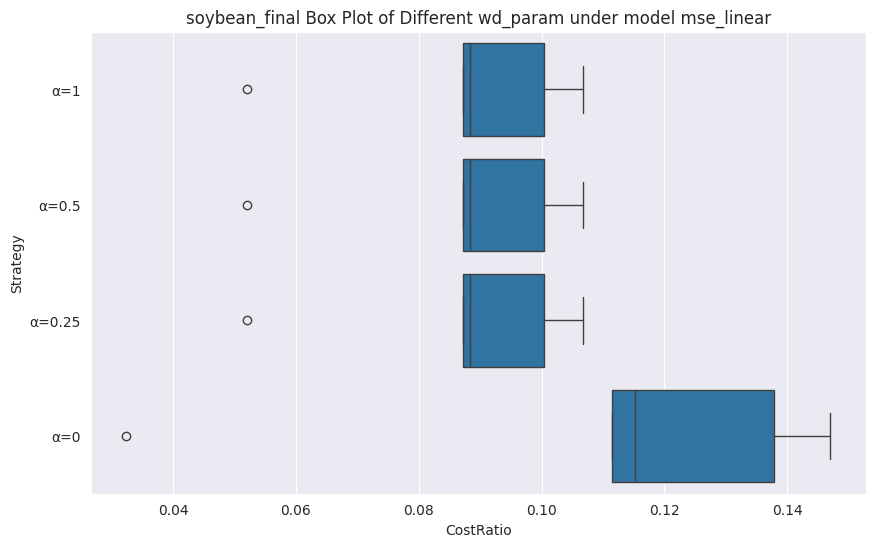

74.273
74.273
74.273
74.273


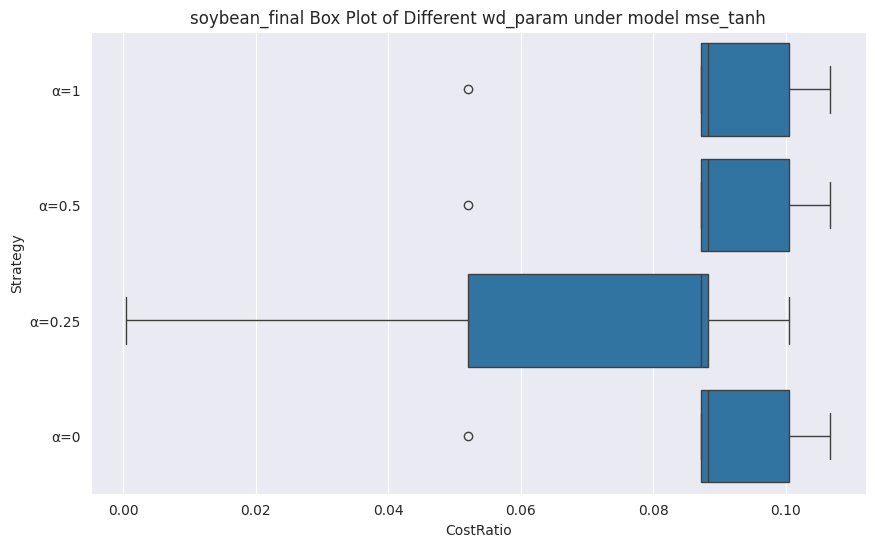

74.273
74.273
74.273
74.273


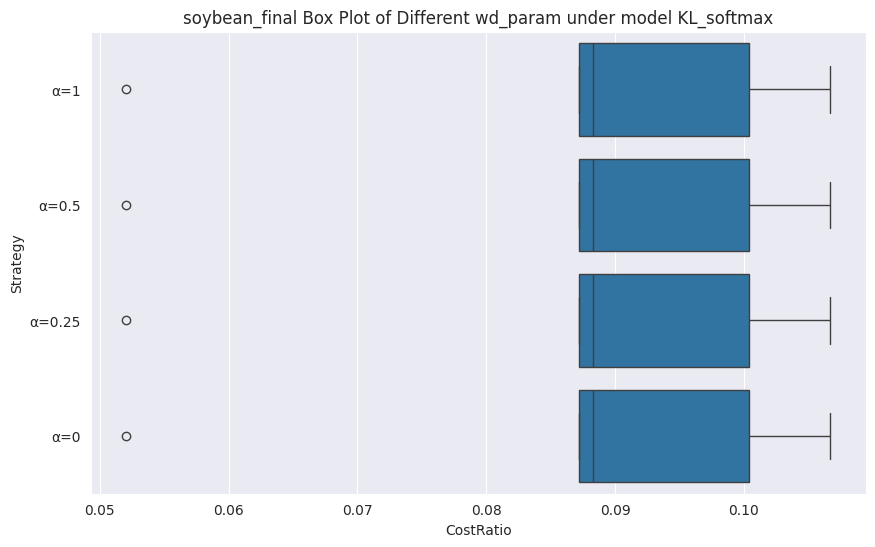

74.273
74.273
74.273
74.273


In [ ]:
soy_final_was = cost_func_forWas(bootAll_y_final_wasso, bootAll_y_fpred_wasso, bootAll_y_fpred_wasso_1, bootAll_y_fpred_wasso_2, bootAll_y_fpred_wasso_3, x_final_real_wsoR, 'soybean', 'mse_linear', 'final')
soy_final_was_m1 = cost_func_forWas(bootAll_y_final_wasso1, bootAll_y_fpred_wasso1, bootAll_y_fpred_wasso1_1, bootAll_y_fpred_wasso1_2, bootAll_y_fpred_wasso1_3, x_final_real_wsoR, 'soybean', 'mse_tanh', 'final')
soy_final_was_m2 = cost_func_forWas(bootAll_y_final_wasso2, bootAll_y_fpred_wasso2, bootAll_y_fpred_wasso2_1, bootAll_y_fpred_wasso2_2, bootAll_y_fpred_wasso2_3, x_final_real_wsoR, 'soybean', 'KL_softmax', 'final')

In [ ]:
soy_data_was = cost_func_forWas(bootAll_y_val_wasso, bootAll_y_pred_wasso, bootAll_y_pred_wasso_1, bootAll_y_pred_wasso_2, bootAll_pred_yso, x_val_wsoRReal, 'soybean', 'mse_linear', 'val')
soy_data_was_m1 = cost_func_forWas(bootAll_y_val_wasso1, bootAll_y_pred_wasso1, bootAll_y_pred_wasso1_1, bootAll_y_pred_wasso1_2, bootAll_pred_yso1, x_val_wsoRReal, 'soybean', 'mse_tanh', 'val')
soy_data_was_m2 = cost_func_forWas(bootAll_y_val_wasso2, bootAll_y_pred_wasso2, bootAll_y_pred_wasso2_1, bootAll_y_pred_wasso2_2, bootAll_pred_yso2, x_val_wsoRReal, 'soybean', 'KL_softmax', 'val')

In [ ]:
yValWasso=np.load(f'{save_path}/soybean/yValWasso.npy')
yValWasso1=np.load(f'{save_path}/soybean/yValWasso1.npy')
yValWasso2=np.load(f'{save_path}/soybean/yValWasso2.npy')

yValWasso_1=np.load(f'{save_path}/soybean/yValWasso_1.npy')
yValWasso1_1=np.load(f'{save_path}/soybean/yValWasso1_1.npy')
yValWasso2_1=np.load(f'{save_path}/soybean/yValWasso2_1.npy')

yValWasso_2=np.load(f'{save_path}/soybean/yValWasso_2.npy')
yValWasso1_2=np.load(f'{save_path}/soybean/yValWasso1_2.npy')
yValWasso2_2=np.load(f'{save_path}/soybean/yValWasso2_2.npy')

In [ ]:
# Was
## ValReal
### wd_param=1
bootAll_y_val_wasso=yValWasso[0]
bootAll_y_pred_wasso=yValWasso[1]

bootAll_y_val_wasso1=yValWasso1[0]
bootAll_y_pred_wasso1=yValWasso1[1]

bootAll_y_val_wasso2=yValWasso2[0]
bootAll_y_pred_wasso2=yValWasso2[1]

### wd_param=0.5
bootAll_y_val_wasso_1=yValWasso_1[0]
bootAll_y_pred_wasso_1=yValWasso_1[1]

bootAll_y_val_wasso1_1=yValWasso1_1[0]
bootAll_y_pred_wasso1_1=yValWasso1_1[1]

bootAll_y_val_wasso2_1=yValWasso2_1[0]
bootAll_y_pred_wasso2_1=yValWasso2_1[1]

### wd_param=0.25
bootAll_y_val_wasso_2=yValWasso_2[0]
bootAll_y_pred_wasso_2=yValWasso_2[1]

bootAll_y_val_wasso1_2=yValWasso1_2[0]
bootAll_y_pred_wasso1_2=yValWasso1_2[1]

bootAll_y_val_wasso2_2=yValWasso2_2[0]
bootAll_y_pred_wasso2_2=yValWasso2_2[1]

In [ ]:
np.save(f'{save_path}/soybean/yValWasso.npy', yValWasso)
np.save(f'{save_path}/soybean/yValWasso1.npy', yValWasso1)
np.save(f'{save_path}/soybean/yValWasso2.npy', yValWasso2)

np.save(f'{save_path}/soybean/yValWasso_1.npy', yValWasso_1)
np.save(f'{save_path}/soybean/yValWasso1_1.npy', yValWasso1_1)
np.save(f'{save_path}/soybean/yValWasso2_1.npy', yValWasso2_1)

np.save(f'{save_path}/soybean/yValWasso_2.npy', yValWasso_2)
np.save(f'{save_path}/soybean/yValWasso1_2.npy', yValWasso1_2)
np.save(f'{save_path}/soybean/yValWasso2_2.npy', yValWasso2_2)

In [ ]:
yOutcomeListRawso = np.load(f'{save_path}/soybean/yOutcomeListRawso.npy')
yOutcomeListso = np.load(f'{save_path}/soybean/yOutcomeListso.npy')
yOutcomeListRawso1 = np.load(f'{save_path}/soybean/yOutcomeListRawso1.npy')
yOutcomeListso1 = np.load(f'{save_path}/soybean/yOutcomeListso1.npy')
yOutcomeListRawso2 = np.load(f'{save_path}/soybean/yOutcomeListRawso2.npy')
yOutcomeListso2 = np.load(f'{save_path}/soybean/yOutcomeListso2.npy')

In [ ]:
raw_yso=yOutcomeListRawso[0]
bootAll_yso=yOutcomeListso[0]
raw_pred_yso=yOutcomeListRawso[1]
bootAll_pred_yso=yOutcomeListso[1]

raw_yso1=yOutcomeListRawso1[0]
bootAll_yso1=yOutcomeListso1[0]
raw_pred_yso1=yOutcomeListRawso1[1]
bootAll_pred_yso1=yOutcomeListso1[1]

raw_yso2=yOutcomeListRawso2[0]
bootAll_yso2=yOutcomeListso2[0]
raw_pred_yso2=yOutcomeListRawso2[1]
bootAll_pred_yso2=yOutcomeListso2[1]

In [ ]:
bootAll_pred_yso1.shape

(17, 10)

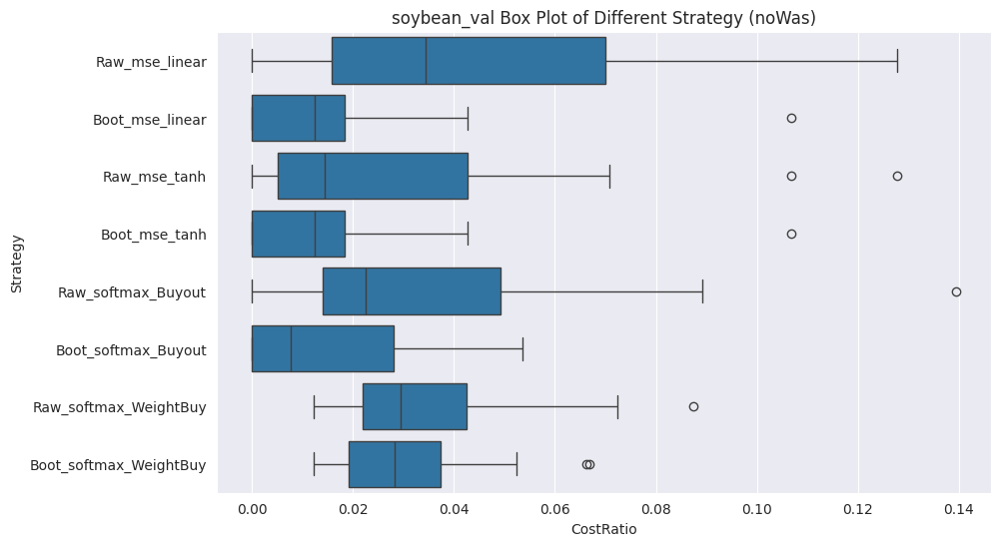

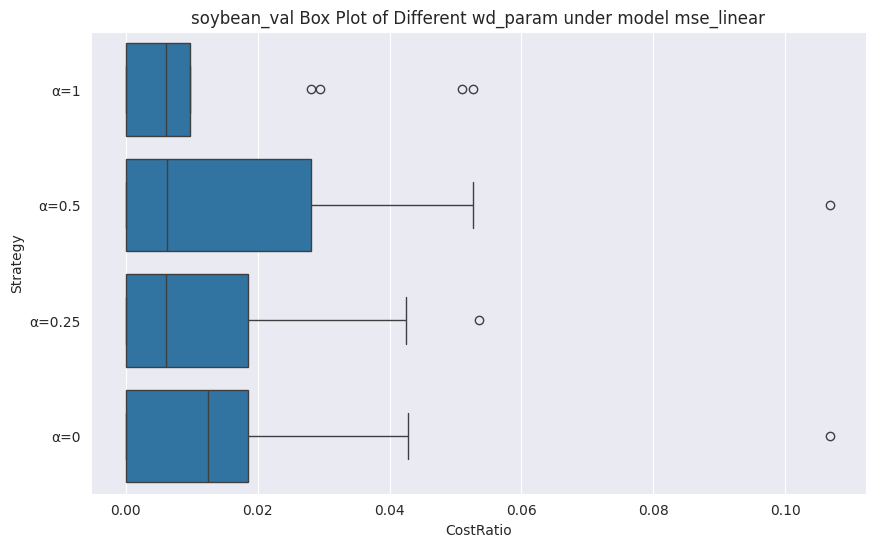

229.003
229.003
229.003
229.003


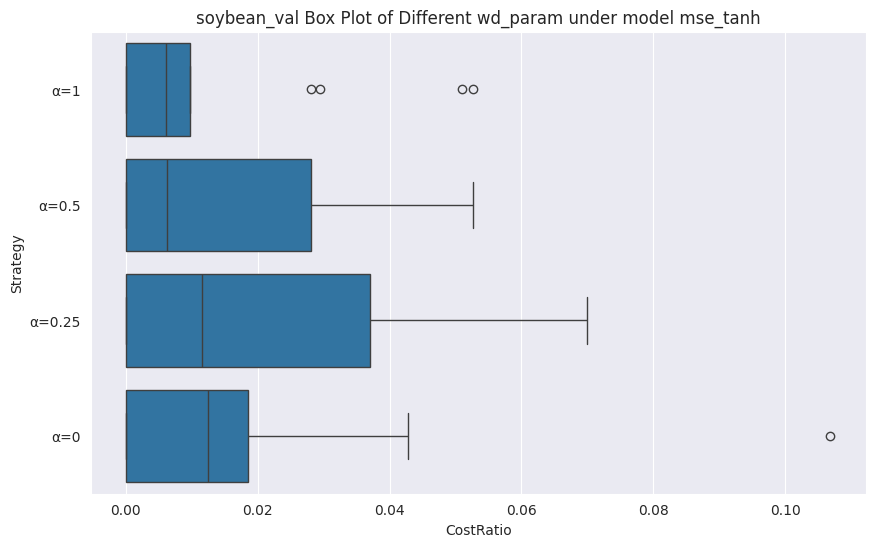

229.003
229.003
229.003
229.003


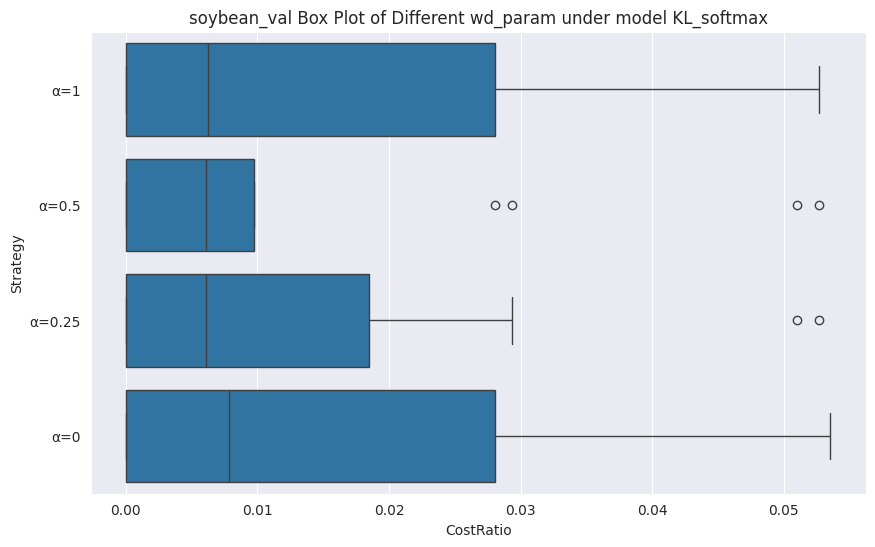

229.003
229.003
229.003
229.003


In [ ]:
## val
soy_data = cost_func(raw_yso, bootAll_yso, raw_pred_yso, bootAll_pred_yso, raw_pred_yso1, bootAll_pred_yso1, raw_yso2, bootAll_yso2, raw_pred_yso2, bootAll_pred_yso2, x_val_wsoRReal, x_val_wsoRReal, 'soybean', 'val')

# Was
## val
soy_data_was = cost_func_forWas(bootAll_y_val_wasso, bootAll_y_pred_wasso, bootAll_y_pred_wasso_1, bootAll_y_pred_wasso_2, bootAll_pred_yso, x_val_wsoRReal, 'soybean', 'mse_linear', 'val')
soy_data_was_m1 = cost_func_forWas(bootAll_y_val_wasso1, bootAll_y_pred_wasso1, bootAll_y_pred_wasso1_1, bootAll_y_pred_wasso1_2, bootAll_pred_yso1, x_val_wsoRReal, 'soybean', 'mse_tanh', 'val')
soy_data_was_m2 = cost_func_forWas(bootAll_y_val_wasso2, bootAll_y_pred_wasso2, bootAll_y_pred_wasso2_1, bootAll_y_pred_wasso2_2, bootAll_pred_yso2, x_val_wsoRReal, 'soybean', 'KL_softmax', 'val')

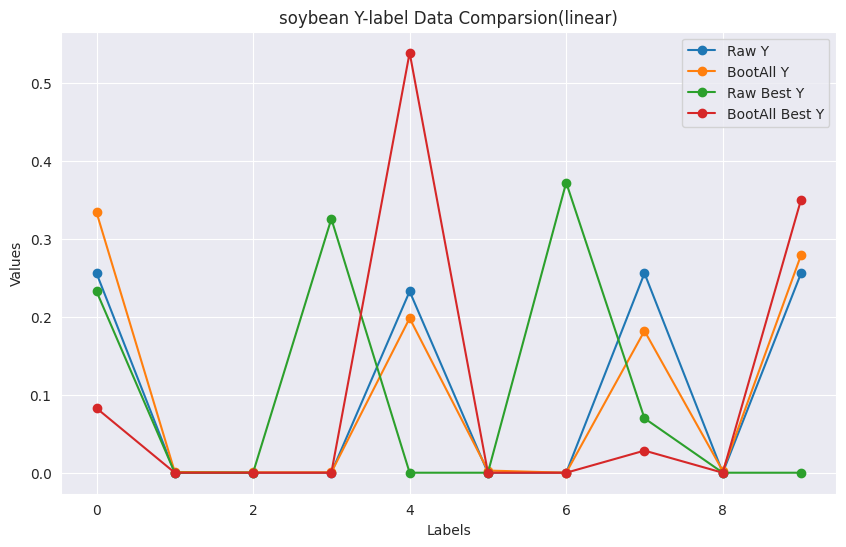

In [ ]:
raw_yso_dict = transform_to_dict(raw_yso)
bootAll_yso_dict = transform_to_dict(bootAll_yso)
raw_pred_yso_dict = transform_to_dict(raw_pred_yso)
bootAll_pred_yso_dict = transform_to_dict(bootAll_pred_yso)

labels1so, values1so = zip(*raw_yso_dict.items())
labels2so, values2so = zip(*bootAll_yso_dict.items())
labels3so, values3so = zip(*raw_pred_yso_dict.items())
labels4so, values4so = zip(*bootAll_pred_yso_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels1so, values1so, label='Raw Y', marker='o')
plt.plot(labels2so, values2so, label='BootAll Y', marker='o')
plt.plot(labels3so, values3so, label='Raw Best Y', marker='o')
plt.plot(labels4so, values4so, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('soybean Y-label Data Comparsion(linear)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/soybean/soybean_y_linear.png')

plt.show()

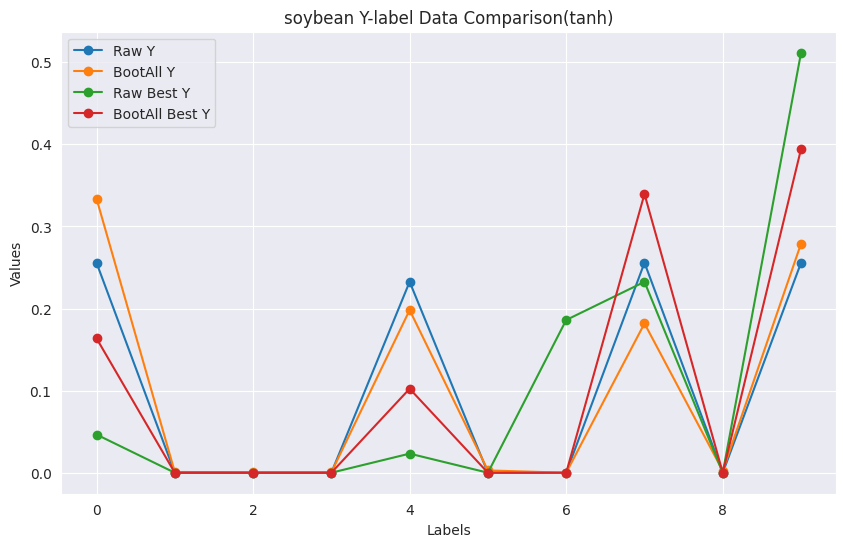

In [ ]:
raw_yso1_dict=transform_to_dict(raw_yso1)
bootAll_yso1_dict=transform_to_dict(bootAll_yso1)
raw_pred_yso1_dict=transform_to_dict(raw_pred_yso1)
bootAll_pred_yso1_dict=transform_to_dict(bootAll_pred_yso1)

labels11so, values11so = zip(*raw_yso1_dict.items())
labels21so, values21so = zip(*bootAll_yso1_dict.items())
labels31so, values31so = zip(*raw_pred_yso1_dict.items())
labels41so, values41so = zip(*bootAll_pred_yso1_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels11so, values11so, label='Raw Y', marker='o')
plt.plot(labels21so, values21so, label='BootAll Y', marker='o')
plt.plot(labels31so, values31so, label='Raw Best Y', marker='o')
plt.plot(labels41so, values41so, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('soybean Y-label Data Comparison(tanh)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/soybean/soybean_y_tanh.png')

plt.show()

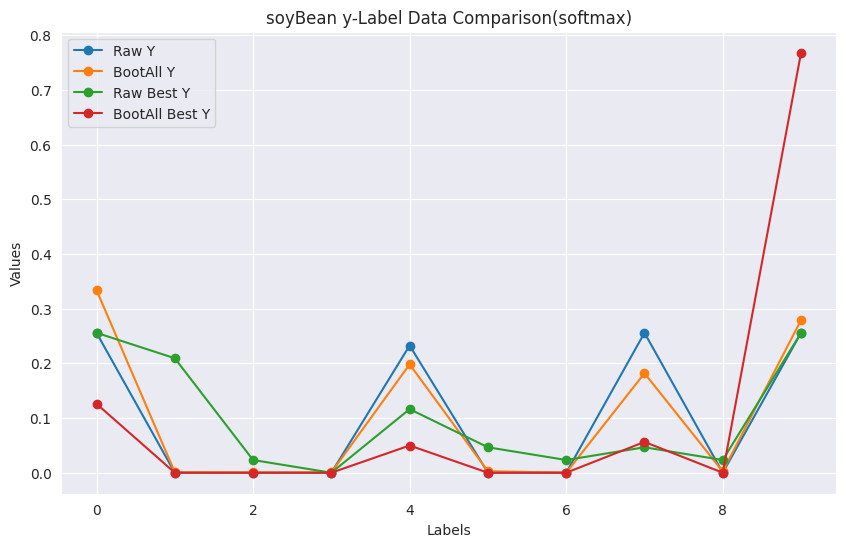

In [ ]:
raw_yso2_dict=transform_to_dict(raw_yso2)
bootAll_yso2_dict=transform_to_dict(bootAll_yso2)
raw_pred_yso2_dict=transform_to_dict(raw_pred_yso2)
bootAll_pred_yso2_dict=transform_to_dict(bootAll_pred_yso2)

labels21so, values21so = zip(*raw_yso2_dict.items())
labels22so, values22so = zip(*bootAll_yso2_dict.items())
labels32so, values32so = zip(*raw_pred_yso2_dict.items())
labels42so, values42so = zip(*bootAll_pred_yso2_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels21so, values21so, label='Raw Y', marker='o')
plt.plot(labels22so, values22so, label='BootAll Y', marker='o')
plt.plot(labels32so, values32so, label='Raw Best Y', marker='o')
plt.plot(labels42so, values42so, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('soyBean y-Label Data Comparison(softmax)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/soybean/soybean_y_softmax.png')

plt.show()

#### Cost Function 的計算


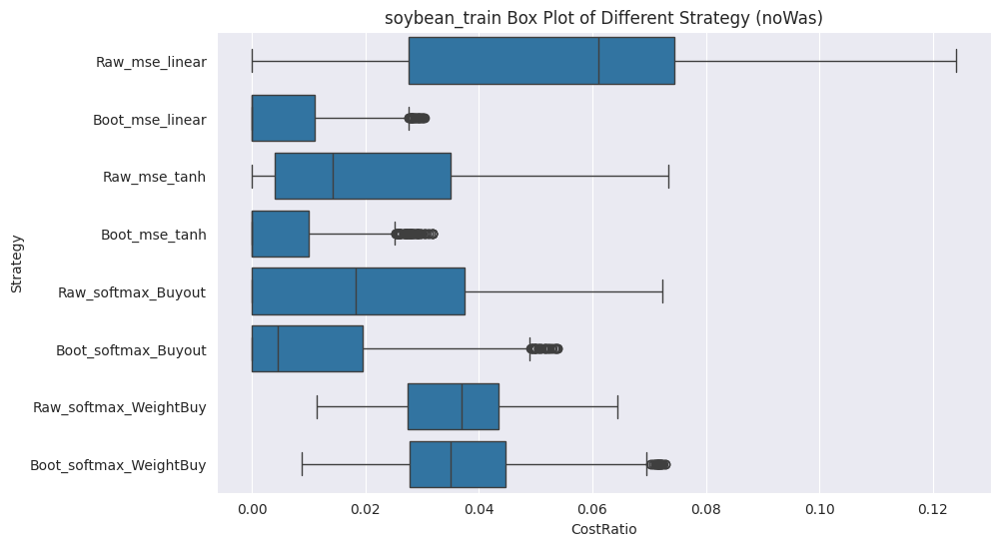

In [ ]:
soy_data = cost_func(raw_yso,bootAll_yso,raw_pred_yso,bootAll_pred_yso,raw_pred_yso1,bootAll_pred_yso1,raw_yso2,bootAll_yso2,raw_pred_yso2,bootAll_pred_yso2,x_bs_train_wsoRReal,x_bs_train_wsoReal,'soybean','train')


#### y_test 真實資料 (右下那組) 與預測資料的比較

In [ ]:
image_paths = [f'{save_path}/image{i}.png' for i in range(1, 6)]
image_paths = [
    f'{save_path}/histograms_noteasy_0_0_so.png',
    f'{save_path}/histograms_noteasy_0_1_so.png',
    f'{save_path}/histograms_noteasy_0_2_so.png',
    f'{save_path}/histograms_noteasy_1_0_so.png',
    f'{save_path}/histograms_easy_0_0_so.png',
    f'{save_path}/soy_y_test.png'
]
# 創建一個大的圖框，並設定每個子圖的位置
plt.figure(figsize=(100, 62))  # 可以調整整體圖片的大小

for i, path in enumerate(image_paths):
    # 加載圖片
    img = mpimg.imread(path)
    # 添加子圖 (假設要5行1列，這裡的5和1可以按實際需要調整排列方式)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')  # 不顯示坐標軸

In [ ]:
#y_val
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_train_wReg 每一欄 1 的出現頻率
y_reg_freq_so = np.mean(y_val_wReg_so == 1, axis=0)
x_reg_freq_so = range(len(y_reg_freq_so))  # 創建 x 軸的索引

# 計算 y_train_w 的最大值索引出現次數
count_soo = dict()
for i in range(len(y_val_wso)):
    max_index = np.argmax(y_val_wso[i])
    if max_index in count_soo:
        count_soo[max_index] += 1
    else:
        count_soo[max_index] = 1

keys = list(count_soo.keys())
values = list(count_soo.values())
values_n = [i/len(y_val_wso) for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq_so, y_reg_freq_so)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_val_Reg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of Key y_val_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.savefig(f'{save_path}/soy_y_test.png')
plt.show()

### platinum

In [ ]:
raw_bestp=get_best_hyparams(X_train_pRegReal, X_test_pRegReal, y_train_pRegReal,0)
raw_bestp1=get_best_hyparams(X_train_pRegReal, X_test_pRegReal, y_train_pRegReal,1)
raw_bestp2=get_best_hyparams(X_train_pReal, X_test_pReal, y_train_pReal,2)

boot_bestp=get_best_hyparams(X_train_pReg, X_test_pReg, y_train_pReg,0)
boot_bestp1=get_best_hyparams(X_train_pReg, X_test_pReg, y_train_pReg,1)
boot_bestp2=get_best_hyparams(X_train_p, X_test_p, y_train_p,2)

100%|██████████| 20/20 [01:47<00:00,  5.39s/trial, best loss: -19786.68359375]


In [ ]:
# Raw
p_dropoutRaw, p_lrRaw, p_rl2Raw, p_unitsRaw = raw_bestp['dropout'], raw_bestp['learning_rate'], raw_bestp['l2_reg'], overallUnits[raw_bestp['units']]
p_dropoutRaw1, p_lrRaw1, p_rl2Raw1, p_unitsRaw1 = raw_bestp1['dropout'], raw_bestp1['learning_rate'], raw_bestp1['l2_reg'], overallUnits[raw_bestp1['units']]
p_dropoutRaw2, p_lrRaw2, p_rl2Raw2, p_unitsRaw2 = raw_bestp2['dropout'], raw_bestp2['learning_rate'], raw_bestp2['l2_reg'], overallUnits[raw_bestp2['units']]

# Boot All
p_dropoutBoot, p_lrBoot, p_rl2Boot, p_unitsBoot = boot_bestp['dropout'], boot_bestp['learning_rate'], boot_bestp['l2_reg'], overallUnits[boot_bestp['units']]
p_dropoutBoot1, p_lrBoot1, p_rl2Boot1, p_unitsBoot1 = boot_bestp1['dropout'], boot_bestp1['learning_rate'], boot_bestp1['l2_reg'], overallUnits[boot_bestp1['units']]
p_dropoutBoot2, p_lrBoot2, p_rl2Boot2, p_unitsBoot2 = boot_bestp2['dropout'], boot_bestp2['learning_rate'], boot_bestp2['l2_reg'], overallUnits[boot_bestp2['units']]

In [ ]:
# Raw
yOutcomeListRawp=model_train(X_train_pRegReal, X_test_pRegReal, y_train_pRegReal, y_train_pRegReal, X_test_pRegReal, y_test_pRegReal, 'noteasy', 0, 0, 'platinum', p_unitsRaw, p_lrRaw, p_dropoutRaw, p_rl2Raw, 1, 'val')
yOutcomeListRawp1=model_train(X_train_pRegReal, X_test_pRegReal, y_train_pRegReal, y_train_pRegReal, X_test_pRegReal, y_test_pRegReal, 'noteasy', 0, 1, 'platinum', p_unitsRaw1, p_lrRaw1, p_dropoutRaw1, p_rl2Raw1, 1, 'val')
yOutcomeListRawp2=model_train(X_train_pReal, X_test_pReal, y_train_pReal, y_train_pReal, X_test_pReal, y_test_pReal, 'noteasy', 0, 2, 'platinum', p_unitsRaw2, p_lrRaw2, p_dropoutRaw2, p_rl2Raw2, 1, 'val')

# # Raw Real
# yOutcomeListRawpRaw=model_train(X_train_pRawRegReal, X_test_pRawRegReal, y_train_pRawRegReal, y_train_pRawRegReal, 'noteasy', 0, 0, 'p', p_unitsRawRaw, p_lrRawRaw, p_dropoutRawRaw, p_rl2RawRaw, 1)
# yOutcomeListRawpRaw1=model_train(X_train_pRawRegReal, X_test_pRawRegReal, y_train_pRawRegReal, y_train_pRawRegReal, 'noteasy', 0, 0, 'p', p_unitsRawRaw1, p_lrRawRaw1, p_dropoutRawRaw1, p_rl2RawRaw1, 1)
# yOutcomeListRawpRaw2=model_train(X_train_pRawReal, X_test_pRawReal, y_train_pRawReal, y_train_pRawReal, 'noteasy', 0, 0, 'p', p_unitsRawRaw2, p_lrRawRaw2, p_dropoutRawRaw2, p_rl2RawRaw2, 1)

# Boot All
yOutcomeListp=model_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, X_test_pRegReal, y_test_pRegReal, 'noteasy', 0, 0, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yOutcomeListp1=model_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, X_test_pRegReal, y_test_pRegReal, 'noteasy', 0, 1, 'platinum', p_unitsBoot1, p_lrBoot1, p_dropoutBoot1, p_rl2Boot1, 1, 'val')
yOutcomeListp2=model_train(X_train_p, X_test_p, y_train_p, y_train_pReg, X_test_pReal, y_test_pReal, 'noteasy', 0, 2, 'platinum', p_unitsBoot2, p_lrBoot2, p_dropoutBoot2, p_rl2Boot2, 1, 'val')

In [ ]:
np.save(f'{save_path}/platinum/yOutcomeListRawp.npy', yOutcomeListRawp)
np.save(f'{save_path}/platinum/yOutcomeListp.npy', yOutcomeListp)
np.save(f'{save_path}/platinum/yOutcomeListRawp1.npy', yOutcomeListRawp1)
np.save(f'{save_path}/platinum/yOutcomeListp1.npy', yOutcomeListp1)
np.save(f'{save_path}/platinum/yOutcomeListRawp2.npy', yOutcomeListRawp2)
np.save(f'{save_path}/platinum/yOutcomeListp2.npy', yOutcomeListp2)

In [ ]:
# Was
# ValReal
## BootAll
### wd_param=1
yValWasp=model_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, X_test_pRegReal, y_test_pRegReal, 'noteasy', 1, 0, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yValWasp1=model_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, X_test_pRegReal, y_test_pRegReal, 'noteasy', 1, 1, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yValWasp2=model_train(X_train_p, X_test_p, y_train_p, y_train_pReg, X_test_pReal, y_test_pReal, 'noteasy', 1, 2, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')

### wd_param=0.5
yValWasp_1=model_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, X_test_pRegReal, y_test_pRegReal, 'noteasy', 0.5, 0, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yValWasp1_1=model_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, X_test_pRegReal, y_test_pRegReal, 'noteasy', 0.5, 1, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yValWasp2_1=model_train(X_train_p, X_test_p, y_train_p, y_train_pReg, X_test_pReal, y_test_pReal, 'noteasy', 0.5, 2, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')

### wd_param=0.25
yValWasp_2=model_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, X_test_pRegReal, y_test_pRegReal, 'noteasy', 0.25, 0, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yValWasp1_2=model_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, X_test_pRegReal, y_test_pRegReal, 'noteasy', 0.25, 1, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yValWasp2_2=model_train(X_train_p, X_test_p, y_train_p, y_train_pReg, X_test_pReal, y_test_pReal, 'noteasy', 0.25, 2, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')


In [ ]:
p_unitsBoot=64

In [ ]:
yFinalWasp=final_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, x_final_wReg_pR, y_final_wReg_pR, 'noteasy', 1, 0, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yFinalWasp1=final_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, x_final_wReg_pR, y_final_wReg_pR, 'noteasy', 1, 1, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yFinalWasp2=final_train(X_train_p, X_test_p, y_train_p, y_train_pReg, x_final_wpR, y_final_wpR, 'noteasy', 1, 2, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')

### wd_param=0.5
yFinalWasp_1=final_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, x_final_wReg_pR, y_final_wReg_pR, 'noteasy', 0.5, 0, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yFinalWasp1_1=final_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, x_final_wReg_pR, y_final_wReg_pR, 'noteasy', 0.5, 1, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yFinalWasp2_1=final_train(X_train_p, X_test_p, y_train_p, y_train_pReg, x_final_wpR, y_final_wpR, 'noteasy', 0.5, 2, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')

### wd_param=0.25
yFinalWasp_2=final_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, x_final_wReg_pR, y_final_wReg_pR, 'noteasy', 0.25, 0, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yFinalWasp1_2=final_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, x_final_wReg_pR, y_final_wReg_pR, 'noteasy', 0.25, 1, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yFinalWasp2_2=final_train(X_train_p, X_test_p, y_train_p, y_train_pReg, x_final_wpR, y_final_wpR, 'noteasy', 0.25, 2, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')

1/1 [==============================] - 0s 236ms/step


In [ ]:
### wd_param=0
yFinalWasp_3=final_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, x_final_wReg_pR, y_final_wReg_pR, 'noteasy', 0, 0, 'platinum', p_unitsBoot, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yFinalWasp1_3=final_train(X_train_pReg, X_test_pReg, y_train_pReg, y_train_pReg, x_final_wReg_pR, y_final_wReg_pR, 'noteasy', 0, 1, 'platinum', 24, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')
yFinalWasp2_3=final_train(X_train_p, X_test_p, y_train_p, y_train_pReg, x_final_wpR, y_final_wpR, 'noteasy', 0, 2, 'platinum', 128, p_lrBoot, p_dropoutBoot, p_rl2Boot, 1, 'val')

1/1 [==============================] - 0s 233ms/step


In [ ]:
np.save(f'{save_path}/platinum/yFinalWasp.npy', yFinalWasp)
np.save(f'{save_path}/platinum/yFinalWasp1.npy', yFinalWasp1)
np.save(f'{save_path}/platinum/yFinalWasp2.npy', yFinalWasp2)

np.save(f'{save_path}/platinum/yFinalWasp_1.npy', yFinalWasp_1)
np.save(f'{save_path}/platinum/yFinalWasp1_1.npy', yFinalWasp1_1)
np.save(f'{save_path}/platinum/yFinalWasp2_1.npy', yFinalWasp2_1)

np.save(f'{save_path}/platinum/yFinalWasp_2.npy', yFinalWasp_2)
np.save(f'{save_path}/platinum/yFinalWasp1_2.npy', yFinalWasp1_2)
np.save(f'{save_path}/platinum/yFinalWasp2_2.npy', yFinalWasp2_2)

np.save(f'{save_path}/platinum/yFinalWasp_3.npy', yFinalWasp_3)
np.save(f'{save_path}/platinum/yFinalWasp1_3.npy', yFinalWasp1_3)
np.save(f'{save_path}/platinum/yFinalWasp2_3.npy', yFinalWasp2_3)

In [ ]:
yFinalWasp = np.load(f'{save_path}/platinum/yFinalWasp.npy')
yFinalWasp1 = np.load(f'{save_path}/platinum/yFinalWasp1.npy')
yFinalWasp2 = np.load(f'{save_path}/platinum/yFinalWasp2.npy')

yFinalWasp_1 = np.load(f'{save_path}/platinum/yFinalWasp_1.npy')
yFinalWasp1_1 = np.load(f'{save_path}/platinum/yFinalWasp1_1.npy')
yFinalWasp2_1 = np.load(f'{save_path}/platinum/yFinalWasp2_1.npy')

yFinalWasp_2 = np.load(f'{save_path}/platinum/yFinalWasp_2.npy')
yFinalWasp1_2 = np.load(f'{save_path}/platinum/yFinalWasp1_2.npy')
yFinalWasp2_2 = np.load(f'{save_path}/platinum/yFinalWasp2_2.npy')

yFinalWasp_3 = np.load(f'{save_path}/platinum/yFinalWasp_3.npy')
yFinalWasp1_3 = np.load(f'{save_path}/platinum/yFinalWasp1_3.npy')
yFinalWasp2_3 = np.load(f'{save_path}/platinum/yFinalWasp2_3.npy')

In [ ]:
# Was
## Final
### wd_param=1
bootAll_y_final_wasp=yFinalWasp[0]
bootAll_y_pred_final_wasp=yFinalWasp[1]

bootAll_y_final_wasp1=yFinalWasp1[0]
bootAll_y_pred_final_wasp1=yFinalWasp1[1]

bootAll_y_final_wasp2=yFinalWasp2[0]
bootAll_y_pred_final_wasp2=yFinalWasp2[1]

### wd_param=0.5
bootAll_y_final_wasp_1=yFinalWasp_1[0]
bootAll_y_pred_final_wasp_1=yFinalWasp_1[1]

bootAll_y_final_wasp1_1=yFinalWasp1_1[0]
bootAll_y_pred_final_wasp1_1=yFinalWasp1_1[1]

bootAll_y_final_wasp2_1=yFinalWasp2_1[0]
bootAll_y_pred_final_wasp2_1=yFinalWasp2_1[1]

### wd_param=0.25
bootAll_y_final_wasp_2=yFinalWasp_2[0]
bootAll_y_pred_final_wasp_2=yFinalWasp_2[1]

bootAll_y_final_wasp1_2=yFinalWasp1_2[0]
bootAll_y_pred_final_wasp1_2=yFinalWasp1_2[1]

bootAll_y_final_wasp2_2=yFinalWasp2_2[0]
bootAll_y_pred_final_wasp2_2=yFinalWasp2_2[1]

### wd_param=0
bootAll_y_final_wasp_3=yFinalWasp_3[0]
bootAll_y_pred_final_wasp_3=yFinalWasp_3[1]

bootAll_y_final_wasp1_3=yFinalWasp1_3[0]
bootAll_y_pred_final_wasp1_3=yFinalWasp1_3[1]

bootAll_y_final_wasp2_3=yFinalWasp2_3[0]
bootAll_y_pred_final_wasp2_3=yFinalWasp2_3[1]

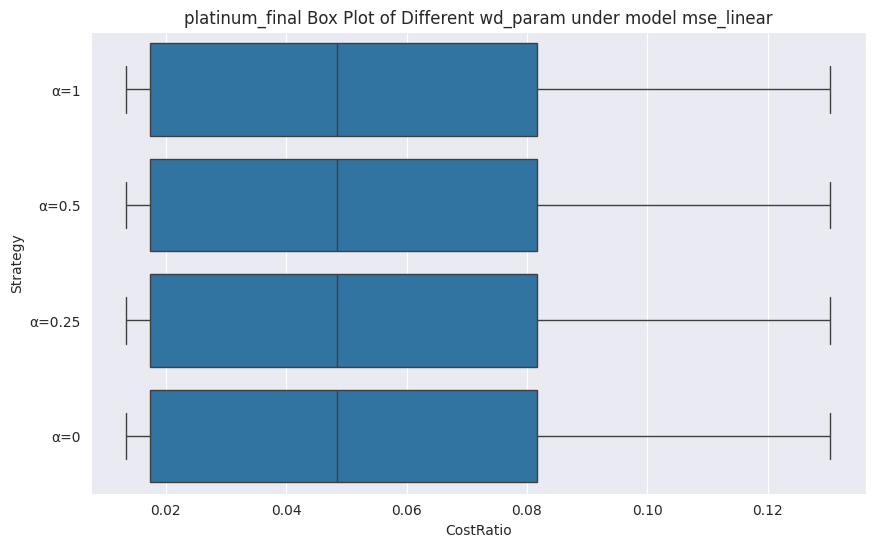

7259.654783092352
7259.654783092352
7259.654783092352
7259.654783092352


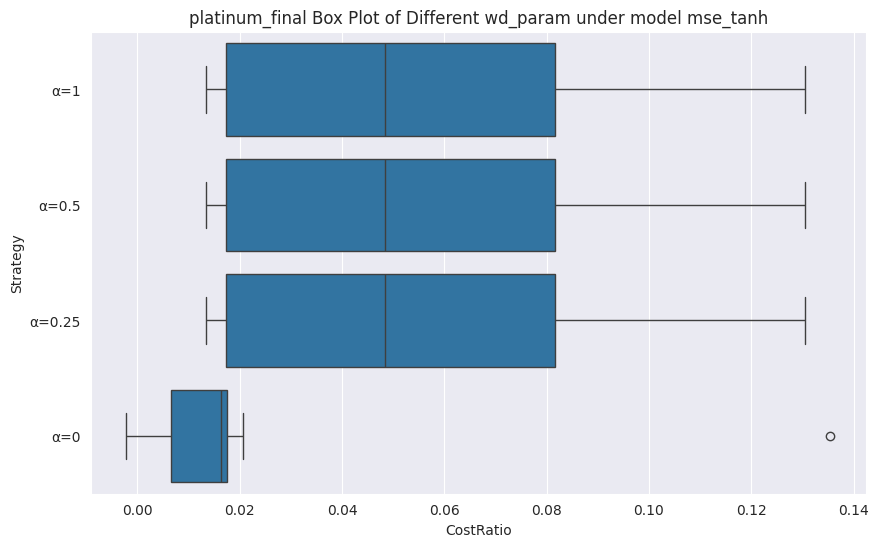

7259.654783092352
7259.654783092352
7259.654783092352
7259.654783092352


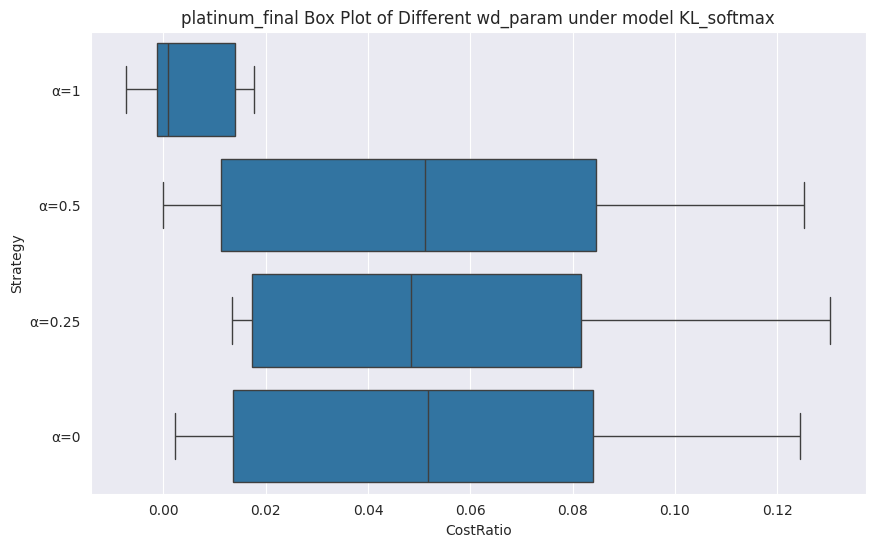

7259.654783092352
7259.654783092352
7259.654783092352
7259.654783092352


In [ ]:
plat_final_was = cost_func_forWas(bootAll_y_final_wasp, bootAll_y_pred_final_wasp, bootAll_y_pred_final_wasp_1, bootAll_y_pred_final_wasp_2, bootAll_y_pred_final_wasp_3, x_final_wpR, 'platinum', 'mse_linear', 'final')
plat_final_was_m1 = cost_func_forWas(bootAll_y_final_wasp1, bootAll_y_pred_final_wasp1, bootAll_y_pred_final_wasp1_1, bootAll_y_pred_final_wasp1_2, bootAll_y_pred_final_wasp1_3, x_final_wpR, 'platinum', 'mse_tanh', 'final')
plat_final_was_m2 = cost_func_forWas(bootAll_y_final_wasp2, bootAll_y_pred_final_wasp2, bootAll_y_pred_final_wasp2_1, bootAll_y_pred_final_wasp2_2, bootAll_y_pred_final_wasp2_3, x_final_wpR, 'platinum', 'KL_softmax', 'final')

In [ ]:
yValWasp=np.load(f'{save_path}/platinum/yValWasp.npy')
yValWasp1=np.load(f'{save_path}/platinum/yValWasp1.npy')
yValWasp2=np.load(f'{save_path}/platinum/yValWasp2.npy')

yValWasp_1=np.load(f'{save_path}/platinum/yValWasp_1.npy')
yValWasp1_1=np.load(f'{save_path}/platinum/yValWasp1_1.npy')
yValWasp2_1=np.load(f'{save_path}/platinum/yValWasp2_1.npy')

yValWasp_2=np.load(f'{save_path}/platinum/yValWasp_2.npy')
yValWasp1_2=np.load(f'{save_path}/platinum/yValWasp1_2.npy')
yValWasp2_2=np.load(f'{save_path}/platinum/yValWasp2_2.npy')

In [ ]:
# Was
## x_val
### wd_param=1
bootAll_y_val_wasp=yValWasp[0]
bootAll_y_pred_wasp=yValWasp[1]

bootAll_y_val_wasp1=yValWasp1[0]
bootAll_y_pred_wasp1=yValWasp1[1]

bootAll_y_val_wasp2=yValWasp2[0]
bootAll_y_pred_wasp2=yValWasp2[1]

### wd_param=0.5
bootAll_y_val_wasp_1=yValWasp_1[0]
bootAll_y_pred_wasp_1=yValWasp_1[1]

bootAll_y_val_wasp1_1=yValWasp1_1[0]
bootAll_y_pred_wasp1_1=yValWasp1_1[1]

bootAll_y_val_wasp2_1=yValWasp2_1[0]
bootAll_y_pred_wasp2_1=yValWasp2_1[1]

### wd_param=0.25
bootAll_y_val_wasp_2=yValWasp_2[0]
bootAll_y_pred_wasp_2=yValWasp_2[1]

bootAll_y_val_wasp1_2=yValWasp1_2[0]
bootAll_y_pred_wasp1_2=yValWasp1_2[1]

bootAll_y_val_wasp2_2=yValWasp2_2[0]
bootAll_y_pred_wasp2_2=yValWasp2_2[1]

In [ ]:
np.save(f'{save_path}/platinum/yValWasp.npy', yValWasp)
np.save(f'{save_path}/platinum/yValWasp1.npy', yValWasp1)
np.save(f'{save_path}/platinum/yValWasp2.npy', yValWasp2)

np.save(f'{save_path}/platinum/yValWasp_1.npy', yValWasp_1)
np.save(f'{save_path}/platinum/yValWasp1_1.npy', yValWasp1_1)
np.save(f'{save_path}/platinum/yValWasp2_1.npy', yValWasp2_1)

np.save(f'{save_path}/platinum/yValWasp_2.npy', yValWasp_2)
np.save(f'{save_path}/platinum/yValWasp1_2.npy', yValWasp1_2)
np.save(f'{save_path}/platinum/yValWasp2_2.npy', yValWasp2_2)

In [ ]:
yOutcomeListRawp = np.load(f'{save_path}/platinum/yOutcomeListRawp.npy')
yOutcomeListp = np.load(f'{save_path}/platinum/yOutcomeListp.npy')
yOutcomeListRawp1 = np.load(f'{save_path}/platinum/yOutcomeListRawp1.npy')
yOutcomeListp1 = np.load(f'{save_path}/platinum/yOutcomeListp1.npy')
yOutcomeListRawp2 = np.load(f'{save_path}/platinum/yOutcomeListRawp2.npy')
yOutcomeListp2 = np.load(f'{save_path}/platinum/yOutcomeListp2.npy')

In [ ]:
raw_yp=yOutcomeListRawp[0]
bootAll_yp=yOutcomeListp[0]
raw_pred_yp=yOutcomeListRawp[1]
bootAll_pred_yp=yOutcomeListp[1]

raw_yp1=yOutcomeListRawp1[0]
bootAll_yp1=yOutcomeListp1[0]
raw_pred_yp1=yOutcomeListRawp1[1]
bootAll_pred_yp1=yOutcomeListp1[1]

raw_yp2=yOutcomeListRawp2[0]
bootAll_yp2=yOutcomeListp2[0]
raw_pred_yp2=yOutcomeListRawp2[1]
bootAll_pred_yp2=yOutcomeListp2[1]

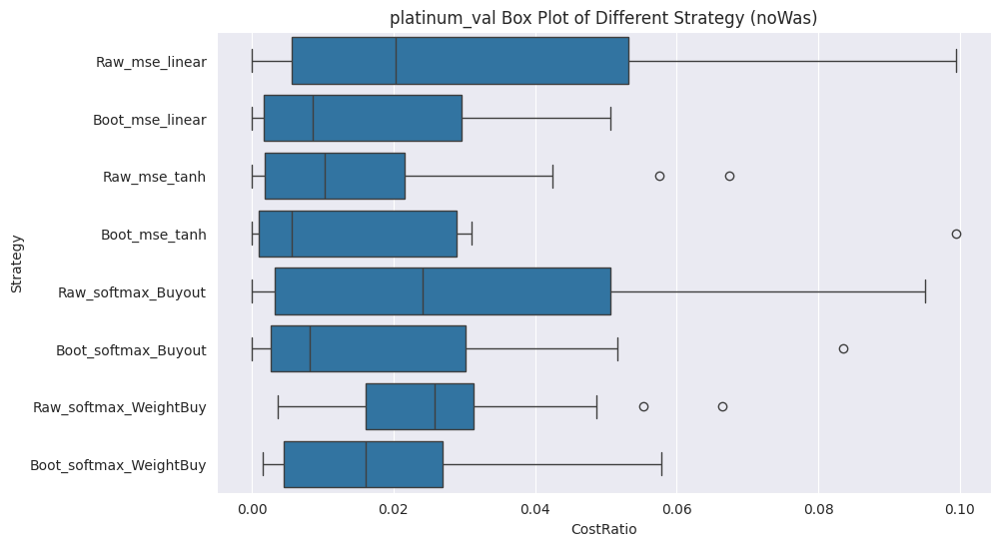

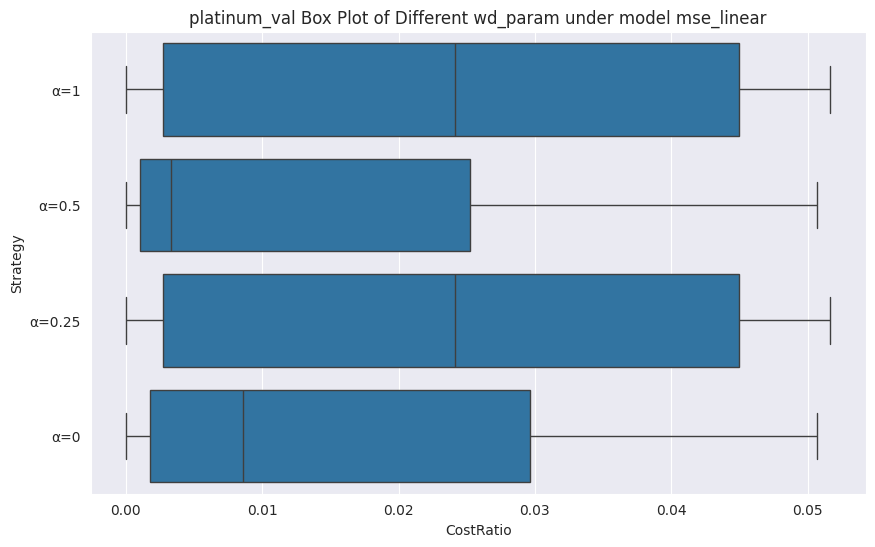

13649.310280000002
13649.310280000002
13649.310280000002
13649.310280000002


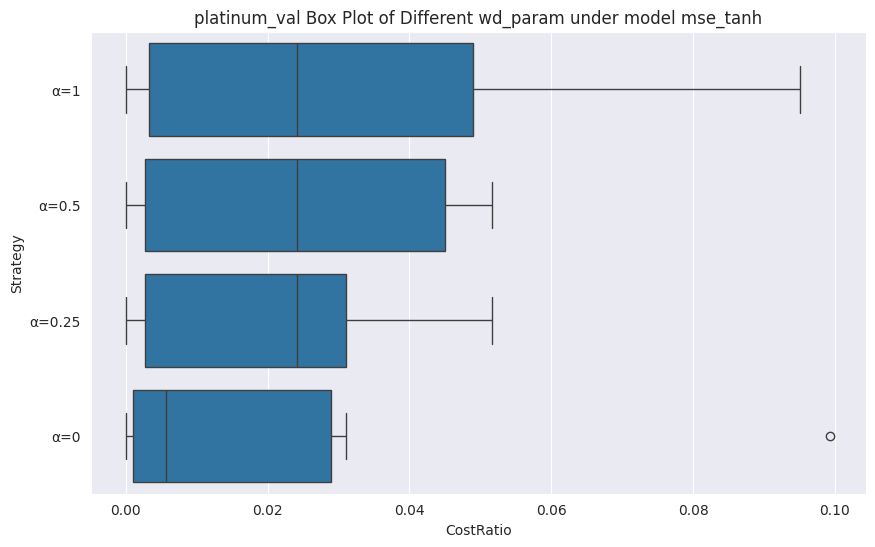

13649.310280000002
13649.310280000002
13649.310280000002
13649.310280000002


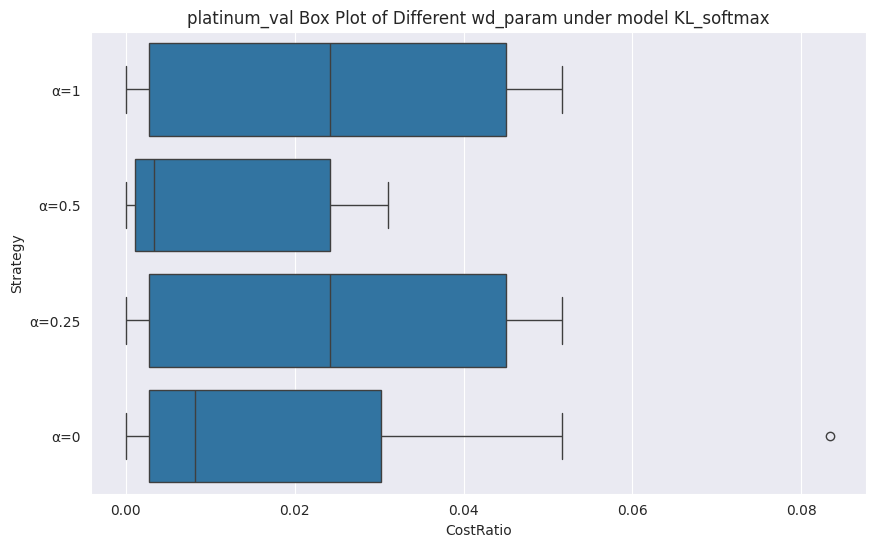

13649.310280000002
13649.310280000002
13649.310280000002
13649.310280000002


In [ ]:
## val
plat_data = cost_func(raw_yp, bootAll_yp, raw_pred_yp, bootAll_pred_yp, raw_pred_yp1, bootAll_pred_yp1, raw_yp2, bootAll_yp2, raw_pred_yp2, bootAll_pred_yp2, x_val_wpRReal, x_val_wpRReal, 'platinum', 'val')

# Was
## val
plat_data_was = cost_func_forWas(bootAll_y_val_wasp, bootAll_y_pred_wasp, bootAll_y_pred_wasp_1, bootAll_y_pred_wasp_2, bootAll_pred_yp, x_val_wpRReal, 'platinum', 'mse_linear', 'val')
plat_data_was_m1 = cost_func_forWas(bootAll_y_val_wasp1, bootAll_y_pred_wasp1, bootAll_y_pred_wasp1_1, bootAll_y_pred_wasp1_2, bootAll_pred_yp1, x_val_wpRReal, 'platinum', 'mse_tanh', 'val')
plat_data_was_m2 = cost_func_forWas(bootAll_y_val_wasp2, bootAll_y_pred_wasp2, bootAll_y_pred_wasp2_1, bootAll_y_pred_wasp2_2, bootAll_pred_yp2, x_val_wpRReal, 'platinum', 'KL_softmax', 'val')

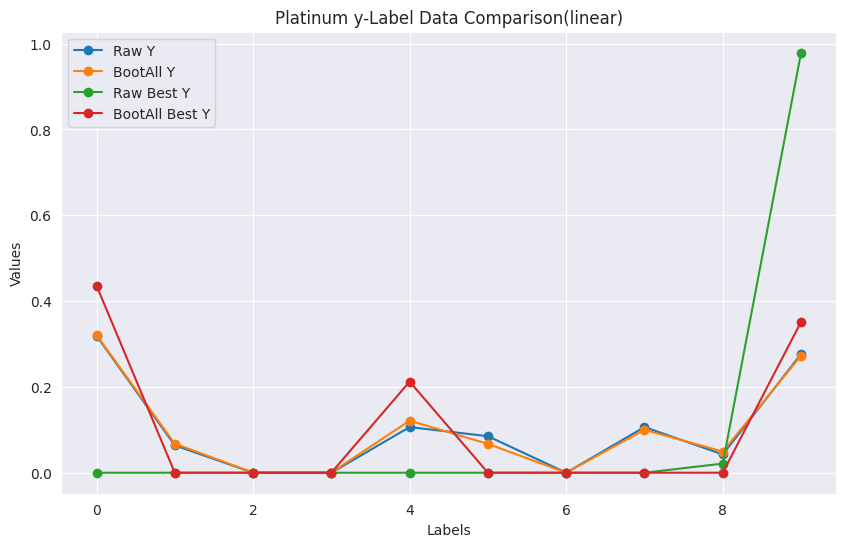

In [ ]:
raw_yp_dict = transform_to_dict(raw_yp)
bootAll_yp_dict = transform_to_dict(bootAll_yp)
raw_pred_yp_dict = transform_to_dict(raw_pred_yp)
bootAll_pred_yp_dict = transform_to_dict(bootAll_pred_yp)

labels1p, values1p = zip(*raw_yp_dict.items())
labels2p, values2p = zip(*bootAll_yp_dict.items())
labels3p, values3p = zip(*raw_pred_yp_dict.items())
labels4p, values4p = zip(*bootAll_pred_yp_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels1p, values1p, label='Raw Y', marker='o')
plt.plot(labels2p, values2p, label='BootAll Y', marker='o')
plt.plot(labels3p, values3p, label='Raw Best Y', marker='o')
plt.plot(labels4p, values4p, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('Platinum y-Label Data Comparison(linear)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/platinum/platinum_y_linear.png')

plt.show()

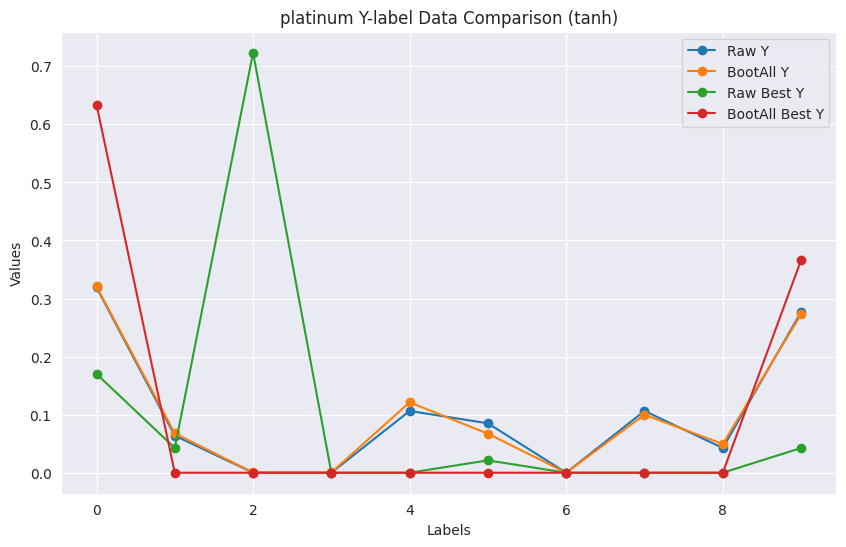

In [ ]:
raw_yp1_dict=transform_to_dict(raw_yp1)
bootAll_yp1_dict=transform_to_dict(bootAll_yp1)
raw_pred_yp1_dict=transform_to_dict(raw_pred_yp1)
bootAll_pred_yp1_dict=transform_to_dict(bootAll_pred_yp1)

labels11p, values11p = zip(*raw_yp1_dict.items())
labels21p, values21p = zip(*bootAll_yp1_dict.items())
labels31p, values31p = zip(*raw_pred_yp1_dict.items())
labels41p, values41p = zip(*bootAll_pred_yp1_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels11p, values11p, label='Raw Y', marker='o')
plt.plot(labels21p, values21p, label='BootAll Y', marker='o')
plt.plot(labels31p, values31p, label='Raw Best Y', marker='o')
plt.plot(labels41p, values41p, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('platinum Y-label Data Comparison (tanh)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/platinum/platinum_y_tanh.png')

plt.show()

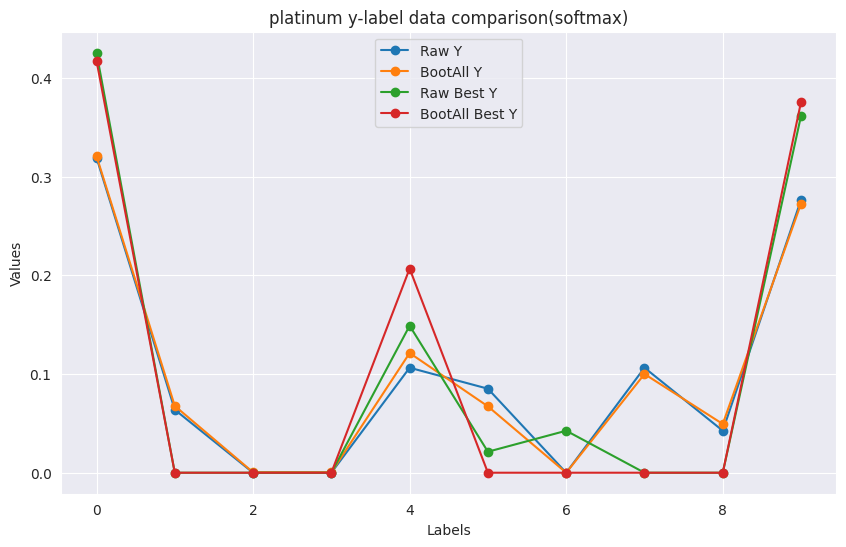

In [ ]:
raw_yp2_dict=transform_to_dict(raw_yp2)
bootAll_yp2_dict=transform_to_dict(bootAll_yp2)
raw_pred_yp2_dict=transform_to_dict(raw_pred_yp2)
bootAll_pred_yp2_dict=transform_to_dict(bootAll_pred_yp2)

labels21p, values21p = zip(*raw_yp2_dict.items())
labels22p, values22p = zip(*bootAll_yp2_dict.items())
labels32p, values32p = zip(*raw_pred_yp2_dict.items())
labels42p, values42p = zip(*bootAll_pred_yp2_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels21p, values21p, label='Raw Y', marker='o')
plt.plot(labels22p, values22p, label='BootAll Y', marker='o')
plt.plot(labels32p, values32p, label='Raw Best Y', marker='o')
plt.plot(labels42p, values42p, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('platinum y-label data comparison(softmax)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/platinum/platinum_y_softmax.png')

plt.show()

#### Cost Function 的計算

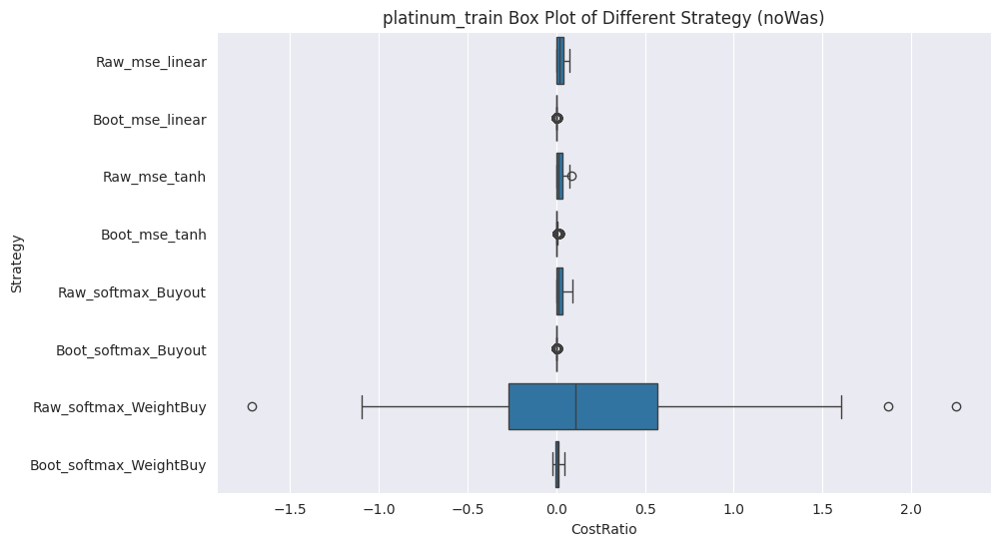

In [ ]:
plat_data = cost_func(raw_yp,bootAll_yp,raw_pred_yp,bootAll_pred_yp,raw_pred_yp1,bootAll_pred_yp1,raw_yp2,bootAll_yp2,raw_pred_yp2,bootAll_pred_yp2,x_bs_train_wpRReal,x_bs_train_wpReal,'platinum','train')

#### y_test 真實資料 (右下那組) & 預測資料的比較

In [ ]:
image_paths = [f'{save_path}/image{i}.png' for i in range(1, 6)]
image_paths = [
    f'{save_path}/histograms_noteasy_0_0_p.png',
    f'{save_path}/histograms_noteasy_0_1_p.png',
    f'{save_path}/histograms_noteasy_0_2_p.png',
    f'{save_path}/histograms_noteasy_1_0_p.png',
    f'{save_path}/histograms_easy_0_0_p.png',
    f'{save_path}/plat_y_test.png'
]
# 創建一個大的圖框，並設定每個子圖的位置
plt.figure(figsize=(100, 62))  # 可以調整整體圖片的大小

for i, path in enumerate(image_paths):
    # 加載圖片
    img = mpimg.imread(path)
    # 添加子圖 (假設要5行1列，這裡的5和1可以按實際需要調整排列方式)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')  # 不顯示坐標軸

In [ ]:
#y_val
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_train_wReg 每一欄 1 的出現頻率
y_reg_freq_p = np.mean(y_val_wReg_p == 1, axis=0)
x_reg_freq_p = range(len(y_reg_freq_p))  # 創建 x 軸的索引

# 計算 y_train_w 的最大值索引出現次數
count_pp = dict()
for i in range(len(y_val_wp)):
    max_index = np.argmax(y_val_wp[i])
    if max_index in count_pp:
        count_pp[max_index] += 1
    else:
        count_pp[max_index] = 1

keys = list(count_pp.keys())
values = list(count_pp.values())
values_n = [i/len(y_val_wp) for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq_p, y_reg_freq_p)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_val_Reg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of Key y_val_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.savefig(f'{save_path}/plat_y_test.png')
plt.show()

### copper

In [ ]:
raw_bestc=get_best_hyparams(X_train_cRegReal, X_test_cRegReal, y_train_cRegReal, 0)
raw_bestc1=get_best_hyparams(X_train_cRegReal, X_test_cRegReal, y_train_cRegReal, 1)
raw_bestc2=get_best_hyparams(X_train_cReal, X_test_cReal, y_train_cReal, 2)

boot_bestc=get_best_hyparams(X_train_cReg, X_test_cReg, y_train_cReg, 0)
boot_bestc1=get_best_hyparams(X_train_cReg, X_test_cReg, y_train_cReg, 1)
boot_bestc2=get_best_hyparams(X_train_c, X_test_c, y_train_c, 2)

100%|██████████| 20/20 [01:57<00:00,  5.85s/trial, best loss: -0.1031000018119812]


In [ ]:
c_dropoutRaw, c_lrRaw, c_rl2Raw, c_unitsRaw = raw_bestc['dropout'], raw_bestc['learning_rate'], raw_bestc['l2_reg'], overallUnits[raw_bestc['units']]
c_dropoutRaw1, c_lrRaw1, c_rl2Raw1, c_unitsRaw1 = raw_bestc1['dropout'], raw_bestc1['learning_rate'], raw_bestc1['l2_reg'], overallUnits[raw_bestc1['units']]
c_dropoutRaw2, c_lrRaw2, c_rl2Raw2, c_unitsRaw2 = raw_bestc2['dropout'], raw_bestc2['learning_rate'], raw_bestc2['l2_reg'], overallUnits[raw_bestc2['units']]

c_dropoutBoot, c_lrBoot, c_rl2Boot, c_unitsBoot = boot_bestc['dropout'], boot_bestc['learning_rate'], boot_bestc['l2_reg'], overallUnits[boot_bestc['units']]
c_dropoutBoot1, c_lrBoot1, c_rl2Boot1, c_unitsBoot1 = boot_bestc1['dropout'], boot_bestc1['learning_rate'], boot_bestc1['l2_reg'], overallUnits[boot_bestc1['units']]
c_dropoutBoot2, c_lrBoot2, c_rl2Boot2, c_unitsBoot2 = boot_bestc2['dropout'], boot_bestc2['learning_rate'], boot_bestc2['l2_reg'], overallUnits[boot_bestc2['units']]

In [ ]:
yOutcomeListRawc=model_train(X_train_cRegReal, X_test_cRegReal, y_train_cRegReal, y_train_cRegReal, X_test_cRegReal, y_test_cRegReal, 'noteasy', 0, 0, 'copper', c_unitsRaw, c_lrRaw, c_dropoutRaw, c_rl2Raw, 1, 'val')
yOutcomeListRawc1=model_train(X_train_cRegReal, X_test_cRegReal, y_train_cRegReal, y_train_cRegReal, X_test_cRegReal, y_test_cRegReal, 'noteasy', 0, 1, 'copper', c_unitsRaw1, c_lrRaw1, c_dropoutRaw1, c_rl2Raw1, 1, 'val')
yOutcomeListRawc2=model_train(X_train_cReal, X_test_cReal, y_train_cReal, y_train_cReal, X_test_cReal, y_test_cReal, 'noteasy', 0, 2, 'copper', c_unitsRaw2, c_lrRaw2, c_dropoutRaw2, c_rl2Raw2, 1, 'val')

# yOutcomeListRawcRaw=model_train(X_train_cRawRegReal, X_test_cRawRegReal, y_train_cRawRegReal, y_train_cRawRegReal, 'noteasy', 0, 0, 'c', c_unitsRawRaw, c_lrRawRaw, c_dropoutRawRaw, c_rl2RawRaw, 1)
# yOutcomeListRawcRaw1=model_train(X_train_cRawRegReal, X_test_cRawRegReal, y_train_cRawRegReal, y_train_cRawRegReal, 'noteasy', 0, 1, 'c', c_unitsRawRaw1, c_lrRawRaw1, c_dropoutRawRaw1, c_rl2RawRaw1, 1)
# yOutcomeListRawcRaw2=model_train(X_train_cRawReal, X_test_cRawReal, y_train_cRawReal, y_train_cRawReal, 'noteasy', 0, 2, 'c', c_unitsRawRaw2, c_lrRawRaw2, c_dropoutRawRaw2, c_rl2RawRaw2, 1)

yOutcomeList=model_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, X_test_cRegReal, y_test_cRegReal, 'noteasy', 0, 0, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yOutcomeList1=model_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, X_test_cRegReal, y_test_cRegReal, 'noteasy', 0, 1, 'copper', c_unitsBoot1, c_lrBoot1, c_dropoutBoot1, c_rl2Boot1, 0, 'val')
yOutcomeList2=model_train(X_train_c, X_test_c, y_train_c, y_train_c, X_test_cReal, y_test_cReal, 'noteasy', 0, 2, 'copper', c_unitsBoot2, c_lrBoot2, c_dropoutBoot2, c_rl2Boot2, 0, 'val')

In [ ]:
np.save(f'{save_path}/copper/yOutcomeListRawc.npy', yOutcomeListRawc)
np.save(f'{save_path}/copper/yOutcomeListc.npy', yOutcomeList)
np.save(f'{save_path}/copper/yOutcomeListRawc1.npy', yOutcomeListRawc1)
np.save(f'{save_path}/copper/yOutcomeListc1.npy', yOutcomeList1)
np.save(f'{save_path}/copper/yOutcomeListRawc2.npy', yOutcomeListRawc2)
np.save(f'{save_path}/copper/yOutcomeListc2.npy', yOutcomeList2)

In [ ]:
# Was
# ValReal
## BootAll
### wd_param=1
yValWasc=model_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, X_test_cRegReal, y_test_cRegReal, 'noteasy', 1, 0, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yValWasc1=model_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, X_test_cRegReal, y_test_cRegReal, 'noteasy', 1, 1, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yValWasc2=model_train(X_train_c, X_test_c, y_train_c, y_train_cReg, X_test_cReal, y_test_cReal, 'noteasy', 1, 2, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')

### wd_param=0.5
yValWasc_1=model_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, X_test_cRegReal, y_test_cRegReal, 'noteasy', 0.5, 0, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yValWasc1_1=model_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, X_test_cRegReal, y_test_cRegReal, 'noteasy', 0.5, 1, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yValWasc2_1=model_train(X_train_c, X_test_c, y_train_c, y_train_cReg, X_test_cReal, y_test_cReal, 'noteasy', 0.5, 2, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')

### wd_param=0.25
yValWasc_2=model_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, X_test_cRegReal, y_test_cRegReal, 'noteasy', 0.25, 0, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yValWasc1_2=model_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, X_test_cRegReal, y_test_cRegReal, 'noteasy', 0.25, 1, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yValWasc2_2=model_train(X_train_c, X_test_c, y_train_c, y_train_cReg, X_test_cReal, y_test_cReal, 'noteasy', 0.25, 2, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')

In [ ]:
c_unitsBoot=32

In [ ]:
### wd_param=1
yFinalWasc=final_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, x_final_wReg_cR, y_final_wReg_cR, 'noteasy', 1, 0, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yFinalWasc1=final_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, x_final_wReg_cR, y_final_wReg_cR, 'noteasy', 1, 1, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yFinalWasc2=final_train(X_train_c, X_test_c, y_train_c, y_train_cReg, x_final_wcR, y_final_wcR, 'noteasy', 1, 2, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')

### wd_param=0.5
yFinalWasc_1=final_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, x_final_wReg_cR, y_final_wReg_cR, 'noteasy', 0.5, 0, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yFinalWasc1_1=final_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, x_final_wReg_cR, y_final_wReg_cR, 'noteasy', 0.5, 1, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yFinalWasc2_1=final_train(X_train_c, X_test_c, y_train_c, y_train_cReg, x_final_wcR, y_final_wcR, 'noteasy', 0.5, 2, 'copper', c_unitsBoot, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')

### wd_param=0.25
yFinalWasc_2=final_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, x_final_wReg_cR, y_final_wReg_cR, 'noteasy', 0.25, 0, 'copper', 256, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yFinalWasc1_2=final_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, x_final_wReg_cR, y_final_wReg_cR, 'noteasy', 0.25, 1, 'copper', 256, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yFinalWasc2_2=final_train(X_train_c, X_test_c, y_train_c, y_train_cReg, x_final_wcR, y_final_wcR, 'noteasy', 0.25, 2, 'copper', 256, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')

1/1 [==============================] - 0s 233ms/step


In [ ]:
### wd_param=0
yFinalWasc_3=final_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, x_final_wReg_cR, y_final_wReg_cR, 'noteasy', 0, 0, 'copper', 32, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yFinalWasc1_3=final_train(X_train_cReg, X_test_cReg, y_train_cReg, y_train_cReg, x_final_wReg_cR, y_final_wReg_cR, 'noteasy', 0, 1, 'copper', 32, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')
yFinalWasc2_3=final_train(X_train_c, X_test_c, y_train_c, y_train_cReg, x_final_wcR, y_final_wcR, 'noteasy', 0, 2, 'copper', 128, c_lrBoot, c_dropoutBoot, c_rl2Boot, 0, 'val')

1/1 [==============================] - 0s 386ms/step


In [ ]:
np.save(f'{save_path}/copper/yFinalWasc.npy', yFinalWasc)
np.save(f'{save_path}/copper/yFinalWasc1.npy', yFinalWasc1)
np.save(f'{save_path}/copper/yFinalWasc2.npy', yFinalWasc2)

np.save(f'{save_path}/copper/yFinalWasc_1.npy', yFinalWasc_1)
np.save(f'{save_path}/copper/yFinalWasc1_1.npy', yFinalWasc1_1)
np.save(f'{save_path}/copper/yFinalWasc2_1.npy', yFinalWasc2_1)

np.save(f'{save_path}/copper/yFinalWasc_2.npy', yFinalWasc_2)
np.save(f'{save_path}/copper/yFinalWasc1_2.npy', yFinalWasc1_2)
np.save(f'{save_path}/copper/yFinalWasc2_2.npy', yFinalWasc2_2)

np.save(f'{save_path}/copper/yFinalWasc_3.npy', yFinalWasc_3)
np.save(f'{save_path}/copper/yFinalWasc1_3.npy', yFinalWasc1_3)
np.save(f'{save_path}/copper/yFinalWasc2_3.npy', yFinalWasc2_3)

In [ ]:
yFinalWasc=np.load(f'{save_path}/copper/yFinalWasc.npy')
yFinalWasc1=np.load(f'{save_path}/copper/yFinalWasc1.npy')
yFinalWasc2=np.load(f'{save_path}/copper/yFinalWasc2.npy')

yFinalWasc_1=np.load(f'{save_path}/copper/yFinalWasc_1.npy')
yFinalWasc1_1=np.load(f'{save_path}/copper/yFinalWasc1_1.npy')
yFinalWasc2_1=np.load(f'{save_path}/copper/yFinalWasc2_1.npy')

yFinalWasc_2=np.load(f'{save_path}/copper/yFinalWasc_2.npy')
yFinalWasc1_2=np.load(f'{save_path}/copper/yFinalWasc1_2.npy')
yFinalWasc2_2=np.load(f'{save_path}/copper/yFinalWasc2_2.npy')

yFinalWasc_3=np.load(f'{save_path}/copper/yFinalWasc_3.npy')
yFinalWasc1_3=np.load(f'{save_path}/copper/yFinalWasc1_3.npy')
yFinalWasc2_3=np.load(f'{save_path}/copper/yFinalWasc2_3.npy')

In [ ]:
bootAll_y_final_wasc=yFinalWasc[0]
bootAll_y_pred_final_wasc=yFinalWasc[1]

bootAll_y_final_wasc1=yFinalWasc1[0]
bootAll_y_pred_final_wasc1=yFinalWasc1[1]

bootAll_y_final_wasc2=yFinalWasc2[0]
bootAll_y_pred_final_wasc2=yFinalWasc2[1]

bootAll_y_final_wasc_1=yFinalWasc_1[0]
bootAll_y_pred_final_wasc_1=yFinalWasc_1[1]

bootAll_y_final_wasc1_1=yFinalWasc1_1[0]
bootAll_y_pred_final_wasc1_1=yFinalWasc1_1[1]

bootAll_y_final_wasc2_1=yFinalWasc2_1[0]
bootAll_y_pred_final_wasc2_1=yFinalWasc2_1[1]

bootAll_y_final_wasc_2=yFinalWasc_2[0]
bootAll_y_pred_final_wasc_2=yFinalWasc_2[1]

bootAll_y_final_wasc1_2=yFinalWasc1_2[0]
bootAll_y_pred_final_wasc1_2=yFinalWasc1_2[1]

bootAll_y_final_wasc2_2=yFinalWasc2_2[0]
bootAll_y_pred_final_wasc2_2=yFinalWasc2_2[1]

bootAll_y_final_wasc_3=yFinalWasc_3[0]
bootAll_y_pred_final_wasc_3=yFinalWasc_3[1]

bootAll_y_final_wasc1_3=yFinalWasc1_3[0]
bootAll_y_pred_final_wasc1_3=yFinalWasc1_3[1]

bootAll_y_final_wasc2_3=yFinalWasc2_3[0]
bootAll_y_pred_final_wasc2_3=yFinalWasc2_3[1]

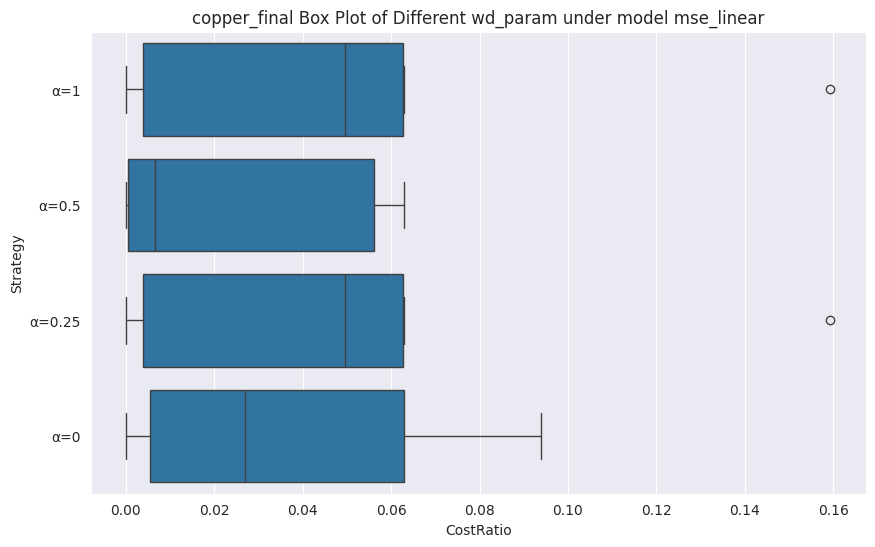

27.639699999999998
27.639699999999998
27.639699999999998
27.639699999999998


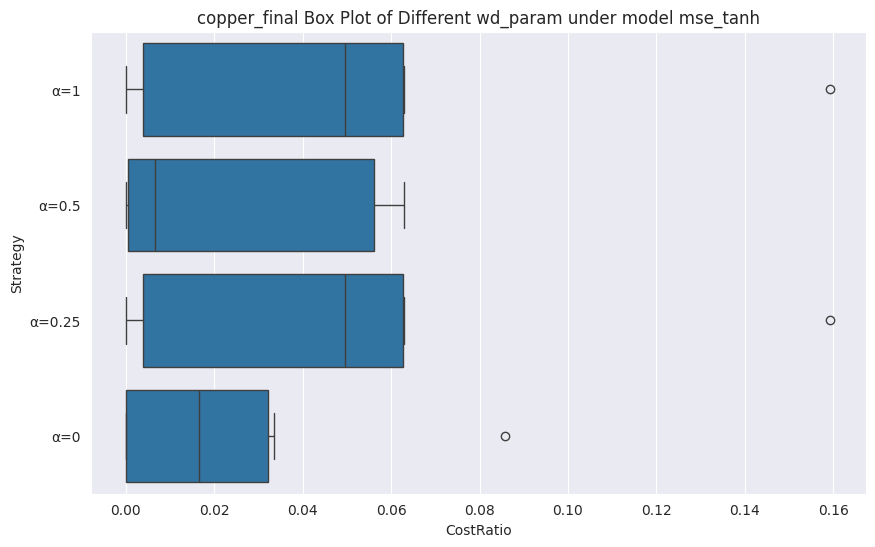

27.639699999999998
27.639699999999998
27.639699999999998
27.639699999999998


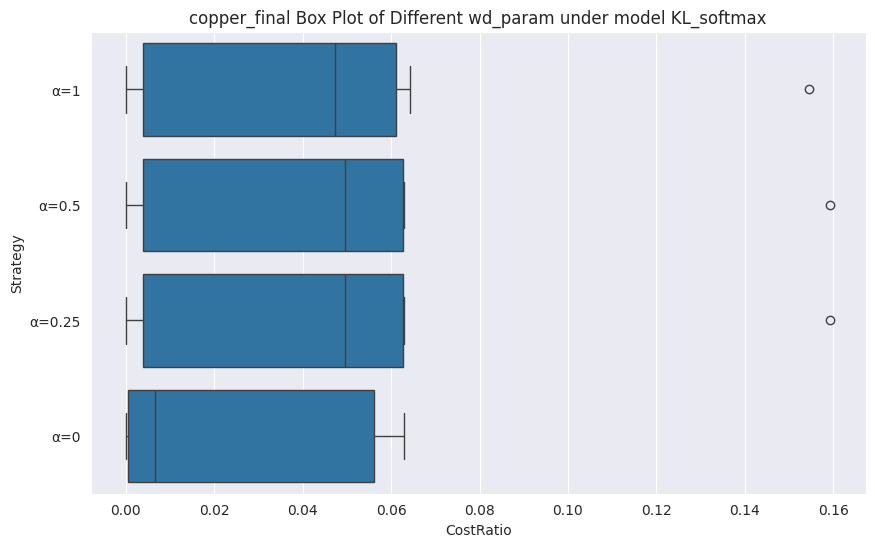

27.639699999999998
27.639699999999998
27.639699999999998
27.639699999999998


In [ ]:
copper_final_was = cost_func_forWas(bootAll_y_final_wasc, bootAll_y_pred_final_wasc, bootAll_y_pred_final_wasc_1, bootAll_y_pred_final_wasc_2, bootAll_y_pred_final_wasc_3, x_final_real_wcR, 'copper', 'mse_linear', 'final')
copper_final_was_m1 = cost_func_forWas(bootAll_y_final_wasc1, bootAll_y_pred_final_wasc1, bootAll_y_pred_final_wasc1_1, bootAll_y_pred_final_wasc1_2, bootAll_y_pred_final_wasc1_3, x_final_real_wcR, 'copper', 'mse_tanh', 'final')
copper_final_was_m2 = cost_func_forWas(bootAll_y_final_wasc2, bootAll_y_pred_final_wasc2, bootAll_y_pred_final_wasc2_1, bootAll_y_pred_final_wasc2_2, bootAll_y_pred_final_wasc2_3, x_final_real_wcR, 'copper', 'KL_softmax', 'final')

In [ ]:
copper_data_was = cost_func_forWas(bootAll_y_val_wasc, bootAll_y_pred_wasc, bootAll_y_pred_wasc_1, bootAll_y_pred_wasc_2, bootAll_pred_yc, x_val_wcRReal, 'copper', 'mse_linear', 'val')
copper_data_was_m1 = cost_func_forWas(bootAll_y_val_wasc1, bootAll_y_pred_wasc1, bootAll_y_pred_wasc1_1, bootAll_y_pred_wasc1_2, bootAll_pred_yc1, x_val_wcRReal, 'copper', 'mse_tanh', 'val')
copper_data_was_m2 = cost_func_forWas(bootAll_y_val_wasc2, bootAll_y_pred_wasc2, bootAll_y_pred_wasc2_1, bootAll_y_pred_wasc2_2, bootAll_pred_yc2, x_val_wcRReal, 'copper', 'KL_softmax', 'val')

In [ ]:
yValWasc=np.load(f'{save_path}/copper/yValWasc.npy')
yValWasc1=np.load(f'{save_path}/copper/yValWasc1.npy')
yValWasc2=np.load(f'{save_path}/copper/yValWasc2.npy')

yValWasc_1=np.load(f'{save_path}/copper/yValWasc_1.npy')
yValWasc1_1=np.load(f'{save_path}/copper/yValWasc1_1.npy')
yValWasc2_1=np.load(f'{save_path}/copper/yValWasc2_1.npy')

yValWasc_2=np.load(f'{save_path}/copper/yValWasc_2.npy')
yValWasc1_2=np.load(f'{save_path}/copper/yValWasc1_2.npy')
yValWasc2_2=np.load(f'{save_path}/copper/yValWasc2_2.npy')

In [ ]:
# Was
## x_val
### wd_param=1
bootAll_y_val_wasc=yValWasc[0]
bootAll_y_pred_wasc=yValWasc[1]

bootAll_y_val_wasc1=yValWasc1[0]
bootAll_y_pred_wasc1=yValWasc1[1]

bootAll_y_val_wasc2=yValWasc2[0]
bootAll_y_pred_wasc2=yValWasc2[1]

### wd_param=0.5
bootAll_y_val_wasc_1=yValWasc_1[0]
bootAll_y_pred_wasc_1=yValWasc_1[1]

bootAll_y_val_wasc1_1=yValWasc1_1[0]
bootAll_y_pred_wasc1_1=yValWasc1_1[1]

bootAll_y_val_wasc2_1=yValWasc2_1[0]
bootAll_y_pred_wasc2_1=yValWasc2_1[1]

### wd_param=0.25
bootAll_y_val_wasc_2=yValWasc_2[0]
bootAll_y_pred_wasc_2=yValWasc_2[1]

bootAll_y_val_wasc1_2=yValWasc1_2[0]
bootAll_y_pred_wasc1_2=yValWasc1_2[1]

bootAll_y_val_wasc2_2=yValWasc2_2[0]
bootAll_y_pred_wasc2_2=yValWasc2_2[1]

In [ ]:
yOutcomeListRawc = np.load(f'{save_path}/copper/yOutcomeListRawc.npy')
yOutcomeListc = np.load(f'{save_path}/copper/yOutcomeListc.npy')
yOutcomeListRawc1 = np.load(f'{save_path}/copper/yOutcomeListRawc1.npy')
yOutcomeListc1 = np.load(f'{save_path}/copper/yOutcomeListc1.npy')
yOutcomeListRawc2 = np.load(f'{save_path}/copper/yOutcomeListRawc2.npy')
yOutcomeListc2 = np.load(f'{save_path}/copper/yOutcomeListc2.npy')

In [ ]:
raw_yc=yOutcomeListRawc[0]
bootAll_yc=yOutcomeListc[0]
raw_pred_yc=yOutcomeListRawc[1]
bootAll_pred_yc=yOutcomeListc[1]

raw_yc1=yOutcomeListRawc1[0]
bootAll_yc1=yOutcomeListc1[0]
raw_pred_yc1=yOutcomeListRawc1[1]
bootAll_pred_yc1=yOutcomeListc1[1]

raw_yc2=yOutcomeListRawc2[0]
bootAll_yc2=yOutcomeListc2[0]
raw_pred_yc2=yOutcomeListRawc2[1]
bootAll_pred_yc2=yOutcomeListc2[1]

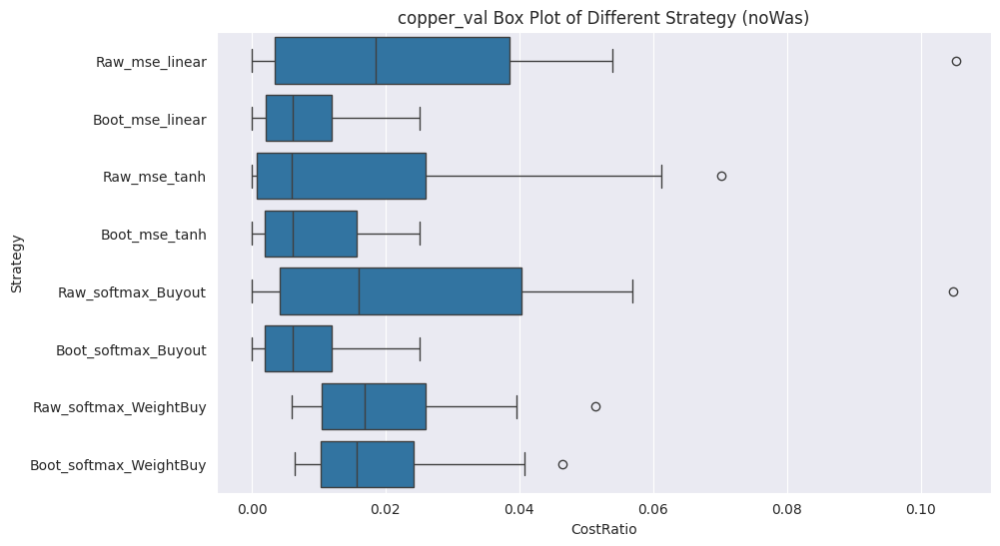

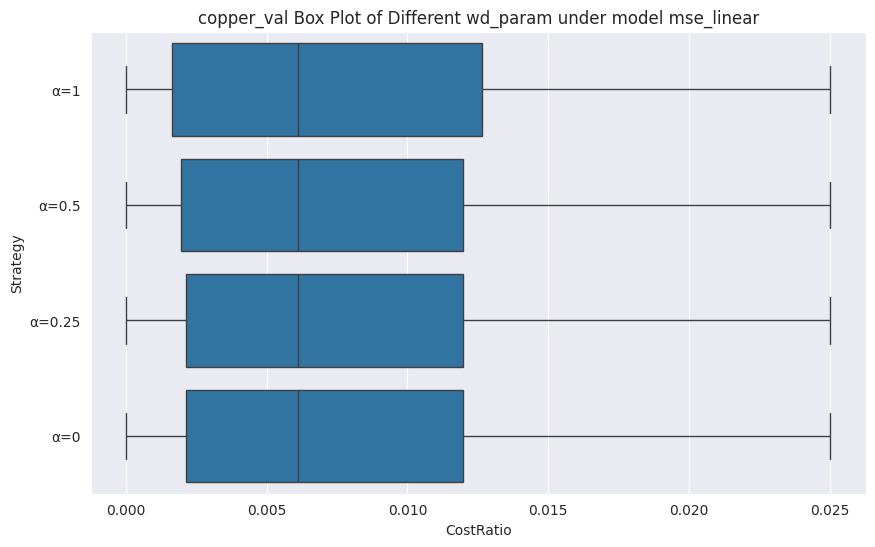

62.3655
62.3655
62.3655
62.3655


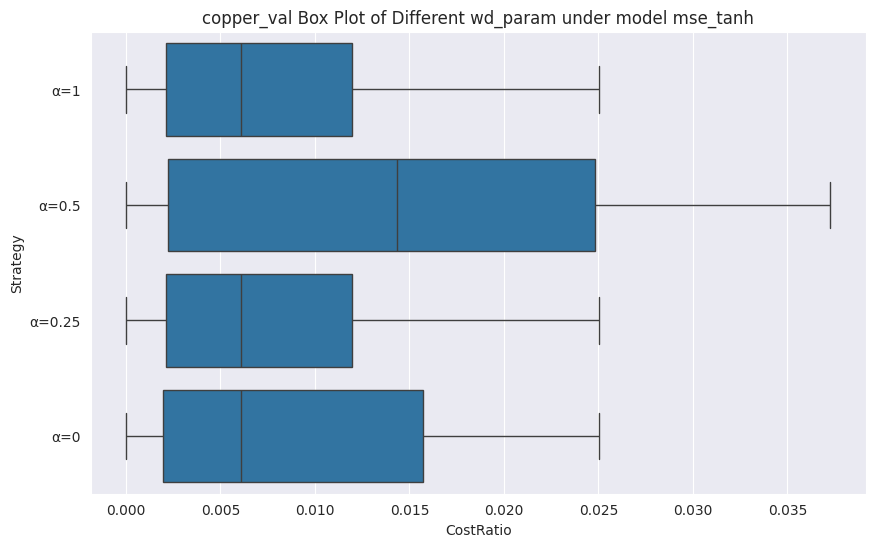

62.3655
62.3655
62.3655
62.3655


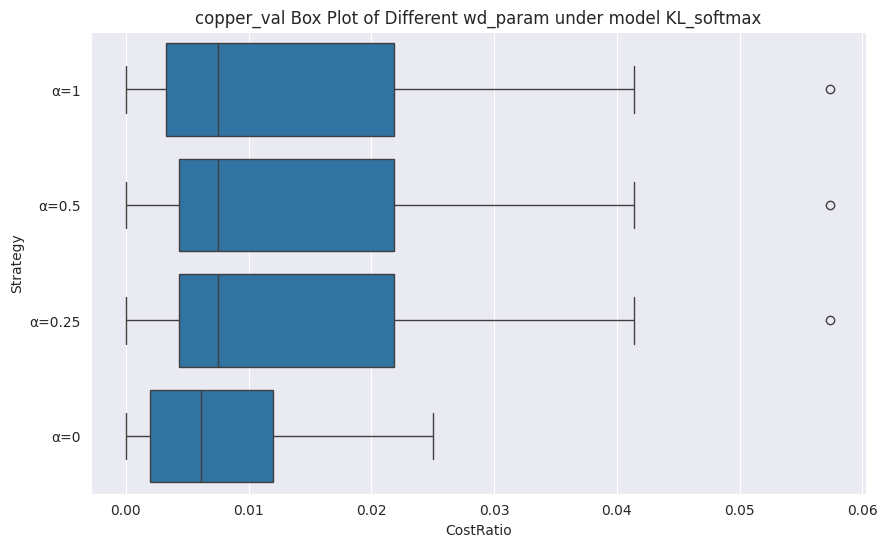

62.3655
62.3655
62.3655
62.3655


In [ ]:
## val
copp_data = cost_func(raw_yc, bootAll_yc, raw_pred_yc, bootAll_pred_yc, raw_pred_yc1, bootAll_pred_yc1, raw_yc2, bootAll_yc2, raw_pred_yc2, bootAll_pred_yc2, x_val_wcRReal, x_val_wcRReal, 'copper', 'val')

# Was
## val
copper_data_was = cost_func_forWas(bootAll_y_val_wasc, bootAll_y_pred_wasc, bootAll_y_pred_wasc_1, bootAll_y_pred_wasc_2, bootAll_pred_yc, x_val_wcRReal, 'copper', 'mse_linear', 'val')
copper_data_was_m1 = cost_func_forWas(bootAll_y_val_wasc1, bootAll_y_pred_wasc1, bootAll_y_pred_wasc1_1, bootAll_y_pred_wasc1_2, bootAll_pred_yc1, x_val_wcRReal, 'copper', 'mse_tanh', 'val')
copper_data_was_m2 = cost_func_forWas(bootAll_y_val_wasc2, bootAll_y_pred_wasc2, bootAll_y_pred_wasc2_1, bootAll_y_pred_wasc2_2, bootAll_pred_yc2, x_val_wcRReal, 'copper', 'KL_softmax', 'val')

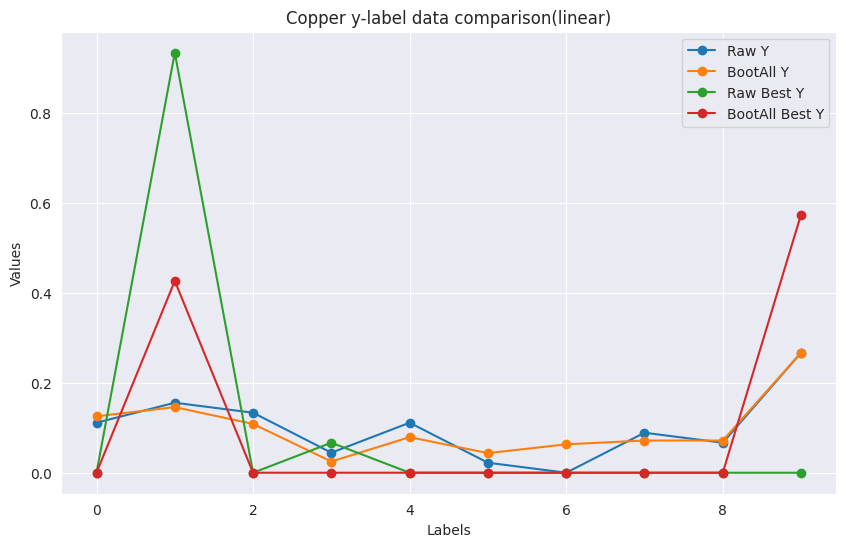

In [ ]:
raw_yc_dict = transform_to_dict(raw_yc)
bootAll_yc_dict = transform_to_dict(bootAll_yc)
raw_pred_yc_dict = transform_to_dict(raw_pred_yc)
bootAll_pred_yc_dict = transform_to_dict(bootAll_pred_yc)

labels1c, values1c = zip(*raw_yc_dict.items())
labels2c, values2c = zip(*bootAll_yc_dict.items())
labels3c, values3c = zip(*raw_pred_yc_dict.items())
labels4c, values4c = zip(*bootAll_pred_yc_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels1c, values1c, label='Raw Y', marker='o')
plt.plot(labels2c, values2c, label='BootAll Y', marker='o')
plt.plot(labels3c, values3c, label='Raw Best Y', marker='o')
plt.plot(labels4c, values4c, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('Copper y-label data comparison(linear)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/copper/copper_y_linear.png')

plt.show()

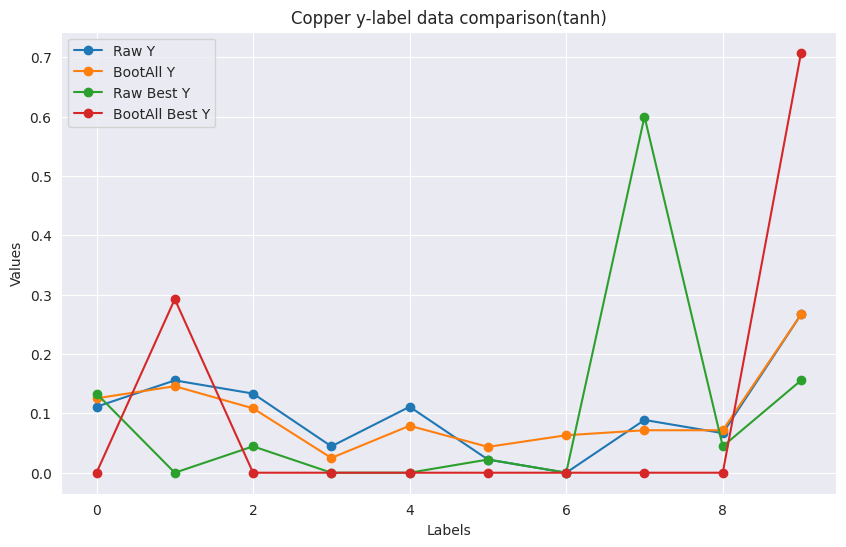

In [ ]:
raw_yc1_dict=transform_to_dict(raw_yc1)
bootAll_yc1_dict=transform_to_dict(bootAll_yc1)
raw_pred_yc1_dict=transform_to_dict(raw_pred_yc1)
bootAll_pred_yc1_dict=transform_to_dict(bootAll_pred_yc1)

labels11c, values11c = zip(*raw_yc1_dict.items())
labels21c, values21c = zip(*bootAll_yc1_dict.items())
labels31c, values31c = zip(*raw_pred_yc1_dict.items())
labels41c, values41c = zip(*bootAll_pred_yc1_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels11c, values11c, label='Raw Y', marker='o')
plt.plot(labels21c, values21c, label='BootAll Y', marker='o')
plt.plot(labels31c, values31c, label='Raw Best Y', marker='o')
plt.plot(labels41c, values41c, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('Copper y-label data comparison(tanh)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/copper/copper_y_tanh.png')

plt.show()

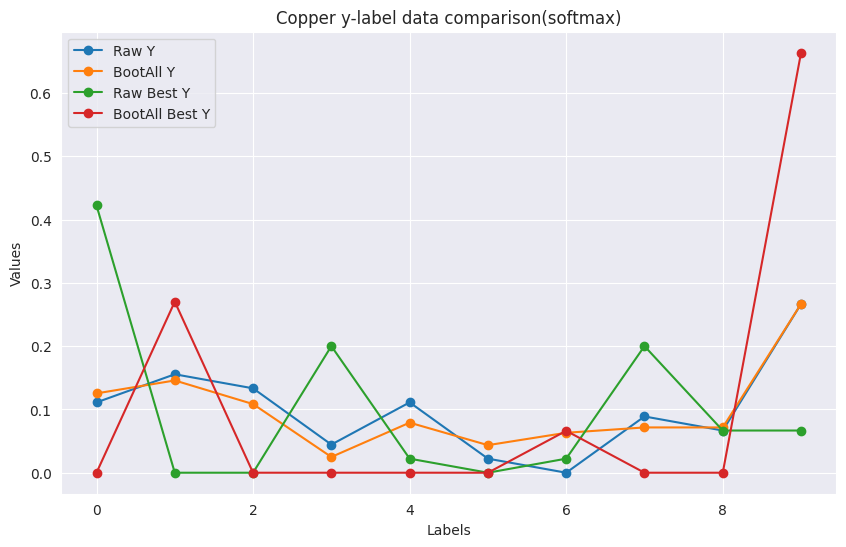

In [ ]:
raw_yc2_dict = transform_to_dict(raw_yc2)
bootAll_yc2_dict = transform_to_dict(bootAll_yc2)
raw_pred_yc2_dict = transform_to_dict(raw_pred_yc2)
bootAll_pred_yc2_dict = transform_to_dict(bootAll_pred_yc2)

labels12c, values12c = zip(*raw_yc2_dict.items())
labels22c, values22c = zip(*bootAll_yc2_dict.items())
labels32c, values32c = zip(*raw_pred_yc2_dict.items())
labels42c, values42c = zip(*bootAll_pred_yc2_dict.items())

plt.figure(figsize=(10, 6))

plt.plot(labels12c, values12c, label='Raw Y', marker='o')
plt.plot(labels22c, values22c, label='BootAll Y', marker='o')
plt.plot(labels32c, values32c, label='Raw Best Y', marker='o')
plt.plot(labels42c, values42c, label='BootAll Best Y', marker='o')

plt.legend()

plt.title('Copper y-label data comparison(softmax)')
plt.xlabel('Labels')
plt.ylabel('Values')

plt.savefig(f'{save_path}/copper/copper_y_softmax.png')

plt.show()

#### Cost Function 的計算

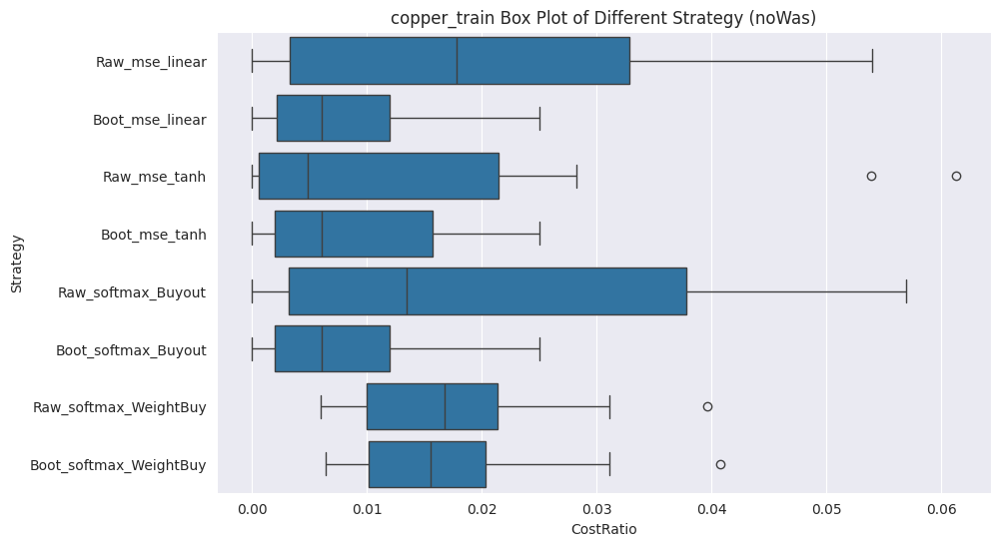

In [ ]:
copp_data = cost_func(raw_yc,bootAll_yc,raw_pred_yc,bootAll_pred_yc,raw_pred_yc1,bootAll_pred_yc1,raw_yc2,bootAll_yc2,raw_pred_yc2,bootAll_pred_yc2,x_val_wcRReal,x_val_wcRReal,'copper','train')

#### y_test 真實資料 (右下那組) & 預測資料的比較

In [ ]:
image_paths = [f'{save_path}/image{i}.png' for i in range(1, 6)]
image_paths = [
    f'{save_path}/histograms_noteasy_0_0_c.png',
    f'{save_path}/histograms_noteasy_0_1_c.png',
    f'{save_path}/histograms_noteasy_0_2_c.png',
    f'{save_path}/histograms_noteasy_1_0_c.png',
    f'{save_path}/histograms_easy_0_0_c.png',
    f'{save_path}/copper_y_test.png'
]
# 創建一個大的圖框，並設定每個子圖的位置
plt.figure(figsize=(100, 62))  # 可以調整整體圖片的大小

for i, path in enumerate(image_paths):
    # 加載圖片
    img = mpimg.imread(path)
    # 添加子圖 (假設要5行1列，這裡的5和1可以按實際需要調整排列方式)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')  # 不顯示坐標軸

In [ ]:
#y_val
import matplotlib.pyplot as plt
import numpy as np

# 計算 y_train_wReg 每一欄 1 的出現頻率
y_reg_freq = np.mean(y_val_wReg_c == 1, axis=0)
x_reg_freq = range(len(y_reg_freq))  # 創建 x 軸的索引

# 計算 y_train_w 的最大值索引出現次數
count = dict()
for i in range(len(y_val_wc)):
    max_index = np.argmax(y_val_wc[i])
    if max_index in count:
        count[max_index] += 1
    else:
        count[max_index] = 1

keys = list(count.keys())
values = list(count.values())
values_n = [i/len(y_val_wc) for i in values]

# 創建兩個子圖
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 第一個直方圖
ax1.bar(x_reg_freq, y_reg_freq)
ax1.set_xlabel('period')
ax1.set_ylabel('Freq')
ax1.set_title('Histogram with y_val_Reg')
ax1.grid(True)

# 第二個直方圖
ax2.bar(keys, values_n, color='skyblue')
ax2.set_xlabel('Key')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of Key y_val_softmax')
ax2.set_xticks(keys)
ax2.grid(True)

# 顯示圖表
plt.tight_layout()
plt.savefig(f'{save_path}/copper_y_test.png')
plt.show()

### Overall Table Comparison

In [ ]:
tableEdit = pd.DataFrame({
    'silver': [silver_data[0], silver_data[1], silver_data[2], silver_data[3], silver_data[4], silver_data[5], silver_data[6], silver_data[7]],
    'gold': [gold_data[0], gold_data[1], gold_data[2], gold_data[3], gold_data[4], gold_data[5], gold_data[6], gold_data[7]],
    'copper': [copp_data[0], copp_data[1], copp_data[2], copp_data[3], copp_data[4], copp_data[5], copp_data[6], copp_data[7]],
    'platinum': [plat_data[0], plat_data[1], plat_data[2], plat_data[3], plat_data[4], plat_data[5], plat_data[6], plat_data[7]],
    'soybean': [soy_data[0], soy_data[1], soy_data[2], soy_data[3], soy_data[4], soy_data[5], soy_data[6], soy_data[7]]
}, index=['raw_mse_linear', 'boot_mse_linear', 'raw_mse_tanh', 'boot_mse_tanh', 'raw_kl_softmax_buyout', 'boot_kl_softmax_buyout', 'raw_kl_softmax_weight', 'boot_kl_softmax_weight'])

tableEdit = tableEdit.round(4)
tableEdit

,silver,gold,copper,platinum,soybean
raw_mse_linear,0.0276,0.0137,0.0255,0.0312,0.0455
boot_mse_linear,0.0089,0.0037,0.0079,0.0165,0.0184
raw_mse_tanh,0.0490,0.0168,0.0185,0.0194,0.0312
boot_mse_tanh,0.0135,0.0043,0.0088,0.0191,0.0186
raw_kl_softmax_buyout,0.0367,0.0112,0.0259,0.0328,0.0389
boot_kl_softmax_buyout,0.0088,0.0037,0.0078,0.0198,0.0152
raw_kl_softmax_weight,0.0355,0.0163,0.0201,0.0282,0.0371
boot_kl_softmax_weight,0.0266,0.0053,0.0193,0.0212,0.0325


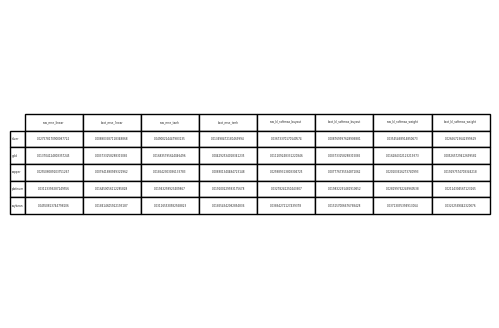

In [ ]:
# 組成表格
table = pd.DataFrame({
    'raw_mse_linear': [silver_data[0], gold_data[0], copp_data[0], plat_data[0], soy_data[0]],
    'boot_mse_linear': [silver_data[1], gold_data[1], copp_data[1], plat_data[1], soy_data[1]],
    'raw_mse_tanh': [silver_data[2], gold_data[2], copp_data[2], plat_data[2], soy_data[2]],
    'boot_mse_tanh': [silver_data[3], gold_data[3], copp_data[3], plat_data[3], soy_data[3]],
    'raw_kl_softmax_buyout': [silver_data[4], gold_data[4], copp_data[4], plat_data[4], soy_data[4]],
    'boot_kl_softmax_buyout': [silver_data[5], gold_data[5], copp_data[5], plat_data[5], soy_data[5]],
    'raw_kl_softmax_weight': [silver_data[6], gold_data[6], copp_data[6], plat_data[6], soy_data[6]],
    'boot_kl_softmax_weight': [silver_data[7], gold_data[7], copp_data[7], plat_data[7], soy_data[7]]
}, index=['silver', 'gold', 'copper', 'platinum', 'soybean'])

# 繪製表格
plt.figure(figsize=(6, 4))
plt.table(cellText=table.values, colLabels=table.columns, rowLabels=table.index, cellLoc='center', loc='center')
plt.axis('off')

# 儲存成圖檔
plt.savefig(f'{save_path}/data/overall_table.png', bbox_inches='tight', dpi=300)
plt.show()

In [ ]:
table

,raw_mse_linear,boot_mse_linear,raw_mse_tanh,boot_mse_tanh,raw_kl_softmax_buyout,boot_kl_softmax_buyout,raw_kl_softmax_weight,boot_kl_softmax_weight
silver,0.027578,0.008904,0.049002,0.013498,0.036734,0.008770,0.035455,0.026567
gold,0.013704,0.003733,0.016836,0.004293,0.011209,0.003733,0.016284,0.005266
copper,0.025506,0.007942,0.018542,0.008801,0.025889,0.007777,0.020104,0.019298
platinum,0.031234,0.016450,0.019433,0.019100,0.032782,0.019832,0.028200,0.021243
soybean,0.045508,0.018415,0.031166,0.018554,0.038943,0.015157,0.037130,0.032526


In [ ]:
# m1 table (mse_linear)
tablem1 = pd.DataFrame({
    'alpha=1': [silver_data_was[0], gold_data_was[0], copper_data_was[0], plat_data_was[0], soy_data_was[0]],
    'alpha=0.5': [silver_data_was[1], gold_data_was[1], copper_data_was[1], plat_data_was[1], soy_data_was[1]],
    'alpha=0.25': [silver_data_was[2], gold_data_was[2], copper_data_was[2], plat_data_was[2], soy_data_was[2]],
    'alpha=0': [silver_data_was[3], gold_data_was[3], copper_data_was[3], plat_data_was[3], soy_data_was[3]]
}, index=['silver', 'gold', 'copper', 'platinum', 'soybean'])

tablem1

,alpha=1,alpha=0.5,alpha=0.25,alpha=0
silver,0.006059,0.017146,0.008226,0.008904
gold,0.004858,0.017871,0.006263,0.003733
copper,0.007717,0.007777,0.007942,0.007942
platinum,0.022678,0.014223,0.022678,0.016450
soybean,0.012450,0.019611,0.013140,0.018415


In [ ]:
# m2 table (mse_tanh)
tablem2 = pd.DataFrame({
    'alpha=1': [silver_data_was_m1[0], gold_data_was_m1[0], copper_data_was_m1[0], plat_data_was_m1[0], soy_data_was_m1[0]],
    'alpha=0.5': [silver_data_was_m1[1], gold_data_was_m1[1], copper_data_was_m1[1], plat_data_was_m1[1], soy_data_was_m1[1]],
    'alpha=0.25': [silver_data_was_m1[2], gold_data_was_m1[2], copper_data_was_m1[2], plat_data_was_m1[2], soy_data_was_m1[2]],
    'alpha=0': [silver_data_was_m1[3], gold_data_was_m1[3], copper_data_was_m1[3], plat_data_was_m1[3], soy_data_was_m1[3]]
}, index=['silver', 'gold', 'copper', 'platinum', 'soybean'])

tablem2

,alpha=1,alpha=0.5,alpha=0.25,alpha=0
silver,0.029812,0.019361,0.011250,0.013498
gold,0.004293,0.006522,0.017871,0.004293
copper,0.007942,0.014797,0.007942,0.008801
platinum,0.029911,0.022678,0.020814,0.019100
soybean,0.012450,0.015314,0.020353,0.018554


In [ ]:
# m3 table (KL_softmax)
tablem3 = pd.DataFrame({
    'alpha=1': [silver_data_was_m2[0], gold_data_was_m2[0], copper_data_was_m2[0], plat_data_was_m2[0], soy_data_was_m2[0]],
    'alpha=0.5': [silver_data_was_m2[1], gold_data_was_m2[1], copper_data_was_m2[1], plat_data_was_m2[1], soy_data_was_m2[1]],
    'alpha=0.25': [silver_data_was_m2[2], gold_data_was_m2[2], copper_data_was_m2[2], plat_data_was_m2[2], soy_data_was_m2[2]],
    'alpha=0': [silver_data_was_m2[3], gold_data_was_m2[3], copper_data_was_m2[3], plat_data_was_m2[3], soy_data_was_m2[3]]
}, index=['silver', 'gold', 'copper', 'platinum', 'soybean'])

tablem3

,alpha=1,alpha=0.5,alpha=0.25,alpha=0
silver,0.007638,0.005766,0.007844,0.008770
gold,0.003733,0.006623,0.005819,0.003733
copper,0.015209,0.015626,0.015626,0.007777
platinum,0.022678,0.010229,0.022678,0.019832
soybean,0.015410,0.012450,0.012982,0.015157


In [ ]:
# m1 table (mse_linear)
tablefm1 = pd.DataFrame({
    'alpha=1': [silver_final_was[0], gold_final_was[0], copper_final_was[0], plat_final_was[0], soy_final_was[0]],
    'alpha=0.5': [silver_final_was[1], gold_final_was[1], copper_final_was[1], plat_final_was[1], soy_final_was[1]],
    'alpha=0.25': [silver_final_was[2], gold_final_was[2], copper_final_was[2], plat_final_was[2], soy_final_was[2]],
    'alpha=0': [silver_final_was[3], gold_final_was[3], copper_final_was[3], plat_final_was[3], soy_final_was[3]]
}, index=['silver', 'gold', 'copper', 'platinum', 'soybean'])

tablefm1

,alpha=1,alpha=0.5,alpha=0.25,alpha=0
silver,0.058761,0.057945,0.056776,0.057945
gold,0.014927,0.014927,0.014927,0.019586
copper,0.044874,0.025945,0.044874,0.034624
platinum,0.055096,0.055096,0.055096,0.055096
soybean,0.086478,0.086478,0.086478,0.106270


In [ ]:
tablefm2 = pd.DataFrame({
    'alpha=1': [silver_final_was_m1[0], gold_final_was_m1[0], copper_final_was_m1[0], plat_final_was_m1[0], soy_final_was_m1[0]],
    'alpha=0.5': [silver_final_was_m1[1], gold_final_was_m1[1], copper_final_was_m1[1], plat_final_was_m1[1], soy_final_was_m1[1]],
    'alpha=0.25': [silver_final_was_m1[2], gold_final_was_m1[2], copper_final_was_m1[2], plat_final_was_m1[2], soy_final_was_m1[2]],
    'alpha=0': [silver_final_was_m1[3], gold_final_was_m1[3], copper_final_was_m1[3], plat_final_was_m1[3], soy_final_was_m1[3]]
}, index=['silver', 'gold', 'copper', 'platinum', 'soybean'])

tablefm2

,alpha=1,alpha=0.5,alpha=0.25,alpha=0
silver,0.058761,0.021557,0.058761,0.058761
gold,0.010663,0.014927,0.020648,0.025181
copper,0.044874,0.025945,0.044874,0.022182
platinum,0.055096,0.055096,0.055096,0.025763
soybean,0.086478,0.086478,0.064801,0.086478


In [ ]:
tablefm3 = pd.DataFrame({
    'alpha=1': [silver_final_was_m2[0], gold_final_was_m2[0], copper_final_was_m2[0], plat_final_was_m2[0], soy_final_was_m2[0]],
    'alpha=0.5': [silver_final_was_m2[1], gold_final_was_m2[1], copper_final_was_m2[1], plat_final_was_m2[1], soy_final_was_m2[1]],
    'alpha=0.25': [silver_final_was_m2[2], gold_final_was_m2[2], copper_final_was_m2[2], plat_final_was_m2[2], soy_final_was_m2[2]],
    'alpha=0': [silver_final_was_m2[3], gold_final_was_m2[3], copper_final_was_m2[3], plat_final_was_m2[3], soy_final_was_m2[3]]
}, index=['silver', 'gold', 'copper', 'platinum', 'soybean'])

tablefm3

,alpha=1,alpha=0.5,alpha=0.25,alpha=0
silver,0.021557,0.025278,0.016190,0.025278
gold,0.014927,0.014927,0.009855,0.025181
copper,0.043571,0.044874,0.044874,0.025945
platinum,0.004566,0.051907,0.055096,0.052973
soybean,0.086478,0.086478,0.086478,0.086478


In [ ]:
tableFOverallEdit = pd.DataFrame({
    'silver': [silver_final_was[2], silver_final_was_m1[1], silver_final_was_m2[2], silver_final_was_m2[3]],
    'gold': [gold_final_was[0], gold_final_was_m1[0], gold_final_was_m2[2], gold_final_was[3]],
    'copper': [copper_final_was[1], copper_final_was_m1[1], copper_final_was_m2[0], copper_final_was_m1[3]],
    'platinum': [plat_final_was[0], plat_final_was_m1[0], plat_final_was_m2[0], plat_final_was_m2[3]],
    'soybean': [soy_final_was[0], soy_final_was_m1[2], soy_final_was_m2[0], soy_final_was[3]],
}, index=['Was_NN(α>0)_mse_linear_best', 'Was_NN(α>0)_mse_tanh_best', 'Was_NN(α>0)_KL_softmax_best', 'NoWas_NN(α=0)_best'])

tableFOverallEdit = tableFOverallEdit.round(4)
tableFOverallEdit

,silver,gold,copper,platinum,soybean
Was_NN(α>0)_mse_linear_best,0.0568,0.0149,0.0259,0.0551,0.0865
Was_NN(α>0)_mse_tanh_best,0.0216,0.0107,0.0259,0.0551,0.0648
Was_NN(α>0)_KL_softmax_best,0.0162,0.0099,0.0436,0.0046,0.0865
NoWas_NN(α=0)_best,0.0253,0.0196,0.0222,0.0551,0.1063


In [ ]:
tableOverallEdit = pd.DataFrame({
    'silver': [silver_data_was[0], silver_data_was_m1[2], silver_data_was_m2[1], silver_data_was_m2[3]],
    'gold': [gold_data_was[0], gold_data_was_m1[0], gold_data_was_m2[0], gold_data_was[3]],
    'copper': [copper_data_was[0], copper_data_was_m1[0], copper_data_was_m2[0], copper_data_was_m2[3]],
    'platinum': [plat_data_was[1], plat_data_was_m1[2], plat_data_was_m2[1], plat_data_was[3]],
    'soybean': [soy_data_was[0], soy_data_was_m1[0], soy_data_was_m2[1], soy_data_was_m2[3]]
}, index=['Was_NN(α>0)_mse_linear_best', 'Was_NN(α>0)_mse_tanh_best', 'Was_NN(α>0)_KL_softmax_best', 'NoWas_NN(α=0)_best'])

tableOverallEdit = tableOverallEdit.round(4)
tableOverallEdit

,silver,gold,copper,platinum,soybean
Was_NN(α>0)_mse_linear_best,0.0061,0.0049,0.0077,0.0142,0.0124
Was_NN(α>0)_mse_tanh_best,0.0113,0.0043,0.0079,0.0208,0.0124
Was_NN(α>0)_KL_softmax_best,0.0058,0.0037,0.0152,0.0102,0.0124
NoWas_NN(α=0)_best,0.0088,0.0037,0.0078,0.0165,0.0152


In [ ]:
tableOverall = pd.DataFrame({
    'mse_linear alpha=1': [silver_data_was[0], gold_data_was[0], copper_data_was[0], plat_data_was[0], soy_data_was[0]],
    'mse_linear alpha=0.5': [silver_data_was[1], gold_data_was[1], copper_data_was[1], plat_data_was[1], soy_data_was[1]],
    'mse_linear alpha=0.25': [silver_data_was[2], gold_data_was[2], copper_data_was[2], plat_data_was[2], soy_data_was[2]],
    'mse_linear alpha=0': [silver_data_was[3], gold_data_was[3], copper_data_was[3], plat_data_was[3], soy_data_was[3]],
    'mse_tanh alpha=1': [silver_data_was_m1[0], gold_data_was_m1[0], copper_data_was_m1[0], plat_data_was_m1[0], soy_data_was_m1[0]],
    'mse_tanh alpha=0.5': [silver_data_was_m1[1], gold_data_was_m1[1], copper_data_was_m1[1], plat_data_was_m1[1], soy_data_was_m1[1]],
    'mse_tanh alpha=0.25': [silver_data_was_m1[2], gold_data_was_m1[2], copper_data_was_m1[2], plat_data_was_m1[2], soy_data_was_m1[2]],
    'mse_tanh alpha=0': [silver_data_was_m1[3], gold_data_was_m1[3], copper_data_was_m1[3], plat_data_was_m1[3], soy_data_was_m1[3]],
    'KL_softmax alpha=1': [silver_data_was_m2[0], gold_data_was_m2[0], copper_data_was_m2[0], plat_data_was_m2[0], soy_data_was_m2[0]],
    'KL_softmax alpha=0.5': [silver_data_was_m2[1], gold_data_was_m2[1], copper_data_was_m2[1], plat_data_was_m2[1], soy_data_was_m2[1]],
    'KL_softmax alpha=0.25': [silver_data_was_m2[2], gold_data_was_m2[2], copper_data_was_m2[2], plat_data_was_m2[2], soy_data_was_m2[2]],
    'KL_softmax alpha=0': [silver_data_was_m2[3], gold_data_was_m2[3], copper_data_was_m2[3], plat_data_was_m2[3], soy_data_was_m2[3]]
}, index=['silver', 'gold', 'copper', 'platinum', 'soybean'])

tableOverall

,mse_linear alpha=1,mse_linear alpha=0.5,mse_linear alpha=0.25,mse_linear alpha=0,mse_tanh alpha=1,mse_tanh alpha=0.5,mse_tanh alpha=0.25,mse_tanh alpha=0,KL_softmax alpha=1,KL_softmax alpha=0.5,KL_softmax alpha=0.25,KL_softmax alpha=0
silver,0.006059,0.017146,0.008226,0.008904,0.029812,0.019361,0.011250,0.013498,0.007638,0.005766,0.007844,0.008770
gold,0.004858,0.017871,0.006263,0.003733,0.004293,0.006522,0.017871,0.004293,0.003733,0.006623,0.005819,0.003733
copper,0.007717,0.007777,0.007942,0.007942,0.007942,0.014797,0.007942,0.008801,0.015209,0.015626,0.015626,0.007777
platinum,0.022678,0.014223,0.022678,0.016450,0.029911,0.022678,0.020814,0.019100,0.022678,0.010229,0.022678,0.019832
soybean,0.012450,0.019611,0.013140,0.018415,0.012450,0.015314,0.020353,0.018554,0.015410,0.012450,0.012982,0.015157


### 公版

In [ ]:
def cost_func_forWas(bootAll_y, bootAll_pred_y, bootAll_pred_y1, bootAll_pred_y2, bootAll_pred_y3, X_real, commodity, modelType, dataType):
    ## Strategy1 (wd_param=1)
    costm1=[]
    dividem1=[]
    realPointm1=[]
    for i in range(len(bootAll_y)):
        modelPredict=np.argmax(bootAll_pred_y[i])
        realPoint=np.argmax(bootAll_y[i])
        modelPredictPrice=X_real[i][modelPredict]
        realPointPrice=X_real[i][realPoint]
        dividem1.append(modelPredictPrice-realPointPrice)
        realPointm1.append(realPointPrice)
        costm1.append((modelPredictPrice-realPointPrice)/realPointPrice)
    costm1=np.array(costm1)

    ## Strategy2 (wd_param=0.5)
    costm2=[]
    dividem2=[]
    realPointm2=[]
    for j in range(len(bootAll_y)):
        modelPredict2=np.argmax(bootAll_pred_y1[j])
        realPoint2=np.argmax(bootAll_y[j])
        modelPredictPrice2=X_real[j][modelPredict2]
        realPointPrice2=X_real[j][realPoint2]
        dividem2.append(modelPredictPrice2-realPointPrice2)
        realPointm2.append(realPointPrice2)
        costm2.append((modelPredictPrice2-realPointPrice2)/realPointPrice2)
    costm2=np.array(costm2)

    ## Strategy3 (wd_param=0.25)
    costm3=[]
    dividem3=[]
    realPointm3=[]
    for k in range(len(bootAll_y)):
        modelPredict3=np.argmax(bootAll_pred_y2[k])
        realPoint3=np.argmax(bootAll_y[k])
        modelPredictPrice3=X_real[k][modelPredict3]
        realPointPrice3=X_real[k][realPoint3]
        dividem3.append(modelPredictPrice3-realPointPrice3)
        realPointm3.append(realPointPrice3)
        costm3.append((modelPredictPrice3-realPointPrice3)/realPointPrice3)
    costm3=np.array(costm3)

    ## Strategy4 (wd_param=0)
    costm4=[]
    dividem4=[]
    realPointm4=[]
    for l in range(len(bootAll_y)):
        modelPredict4=np.argmax(bootAll_pred_y3[l])
        realPoint4=np.argmax(bootAll_y[l])
        modelPredictPrice4=X_real[l][modelPredict4]
        realPointPrice4=X_real[l][realPoint4]
        dividem4.append(modelPredictPrice4-realPointPrice4)
        realPointm4.append(realPointPrice4)
        costm4.append((modelPredictPrice4-realPointPrice4)/realPointPrice4)
    costm4=np.array(costm4)

    # 数据
    data = {
        'α=1': costm1,
        'α=0.5': costm2,
        'α=0.25': costm3,
        'α=0': costm4
    }

    # def remove_outliers(array):
    #     Q1 = np.percentile(array, 25)
    #     Q3 = np.percentile(array, 75)
    #     IQR = Q3 - Q1
    #     lower_bound = Q1 - 1.5 * IQR
    #     upper_bound = Q3 + 1.5 * IQR
    #     return array[(array >= lower_bound) & (array <= upper_bound)]

    # # 剔除异常值
    # filtered_data = {key: remove_outliers(value) for key, value in data.items()}

    # 转换为 DataFrame
    df = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in data.items()]))

    # 转为长格式
    df_melted = df.melt(var_name='Category', value_name='Values')

    # 绘制箱线图
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Values', y='Category', data=df_melted, orient='h')

    # 创建一个包含加粗 modelType 的富文本字符串
    modelType1 = modelType
    title_text = f'{commodity}_{dataType} Box Plot of Different wd_param under model '
    title_bold = r'$\bf{' + modelType1 + '}$'

    # 合并普通字符串和富文本字符串
    full_title = title_text + title_bold


    plt.title(full_title, fontsize=14)
    plt.xlabel('CostRatio')
    plt.ylabel('Strategy')
    plt.savefig(f'{save_path}/{commodity}/{modelType}_{dataType}_Was_boxplot.png')
    plt.show()

    # table plot [每個商品不同所以要回傳 overall Cost]
    ## 運用上方的資料計算 overall
    overallCost1=np.sum(dividem1)/np.sum(realPointm1)
    overallCost2=np.sum(dividem2)/np.sum(realPointm2)
    overallCost3=np.sum(dividem3)/np.sum(realPointm3)
    overallCost4=np.sum(dividem4)/np.sum(realPointm4)

    print(np.sum(realPointm1))
    print(np.sum(realPointm2))
    print(np.sum(realPointm3))
    print(np.sum(realPointm4))

    return [overallCost1, overallCost2, overallCost3, overallCost4]

In [ ]:
def cost_func(raw_y, bootAll_y, raw_pred_y, bootAll_pred_y, raw_pred_y1, bootAll_pred_y1, raw_y2, bootAll_y2, raw_pred_y2, bootAll_pred_y2, X_trainReal, X_train, commodity, dataType):
    ## strategy1-1 (model1, noBoot)
    costm1noBoot=[]
    dividem1noBoot=[]
    realPointm1noBoot=[]
    for i in range(len(raw_y)):
        modelPredict=np.argmax(raw_pred_y[i])
        realPoint=np.argmax(raw_y[i])
        modelPredictPrice=X_trainReal[i][modelPredict]
        realPointPrice=X_trainReal[i][realPoint]
        dividem1noBoot.append(modelPredictPrice-realPointPrice)
        realPointm1noBoot.append(realPointPrice)
        costm1noBoot.append((modelPredictPrice-realPointPrice)/realPointPrice)
    costm1noBoot=np.array(costm1noBoot)

    ## strategy1-2 (model1, Boot)
    costm1Boot=[]
    dividem1Boot=[]
    realPointm1Boot=[]
    for j in range(len(bootAll_y)):
        modelPredict2=np.argmax(bootAll_pred_y[j])
        realPoint2=np.argmax(bootAll_y[j])
        modelPredictPrice2=X_train[j][modelPredict2]
        realPointPrice2=X_train[j][realPoint2]
        dividem1Boot.append(modelPredictPrice2-realPointPrice2)
        realPointm1Boot.append(realPointPrice2)
        costm1Boot.append((modelPredictPrice2-realPointPrice2)/realPointPrice2)
    costm1Boot=np.array(costm1Boot)

    ## strategy2-1 (model2, noBoot)
    costm2noBoot=[]
    dividem2noBoot=[]
    realPointm2noBoot=[]
    for k in range(len(raw_y)):
        modelPredict3=np.argmax(raw_pred_y1[k])
        realPoint3=np.argmax(raw_y[k])
        modelPredictPrice3=X_trainReal[k][modelPredict3]
        realPointPrice3=X_trainReal[k][realPoint3]
        dividem2noBoot.append(modelPredictPrice3-realPointPrice3)
        realPointm2noBoot.append(realPointPrice3)
        costm2noBoot.append((modelPredictPrice3-realPointPrice3)/realPointPrice3)
    costm2noBoot=np.array(costm2noBoot)

    ## strategy2-2 (model2, Boot)
    costm2Boot=[]
    dividem2Boot=[]
    realPointm2Boot=[]
    for l in range(len(bootAll_y)):
        modelPredict4=np.argmax(bootAll_pred_y1[l])
        realPoint4=np.argmax(bootAll_y[l])
        modelPredictPrice4=X_train[l][modelPredict4]
        realPointPrice4=X_train[l][realPoint4]
        dividem2Boot.append(modelPredictPrice4-realPointPrice4)
        realPointm2Boot.append(realPointPrice4)
        costm2Boot.append((modelPredictPrice4-realPointPrice4)/realPointPrice4)
    costm2Boot=np.array(costm2Boot)

    ## strategy3-1 (model3, noBoot, buyout)
    costm3noBootBuyout=[]
    dividem3noBootBuyout=[]
    realPointm3noBootBuyout=[]
    for m in range(len(raw_y2)):
        modelPredict5=np.argmax(raw_pred_y2[m])
        realPoint5=np.argmax(raw_y2[m])
        modelPredictPrice5=X_trainReal[m][modelPredict5]
        realPointPrice5=X_trainReal[m][realPoint5]
        dividem3noBootBuyout.append(modelPredictPrice5-realPointPrice5)
        realPointm3noBootBuyout.append(realPointPrice5)
        costm3noBootBuyout.append((modelPredictPrice5-realPointPrice5)/realPointPrice5)
    costm3noBootBuyout=np.array(costm3noBootBuyout)

    ## strategy3-2 (model3, Boot, buyout)
    costm3BootBuyout=[]
    dividem3BootBuyout=[]
    realPointm3BootBuyout=[]
    for n in range(len(bootAll_y2)):
        modelPredict6=np.argmax(bootAll_pred_y2[n])
        realPoint6=np.argmax(bootAll_y2[n])
        modelPredictPrice6=X_train[n][modelPredict6]
        realPointPrice6=X_train[n][realPoint6]
        dividem3BootBuyout.append(modelPredictPrice6-realPointPrice6)
        realPointm3BootBuyout.append(realPointPrice6)
        costm3BootBuyout.append((modelPredictPrice6-realPointPrice6)/realPointPrice6)
    costm3BootBuyout=np.array(costm3BootBuyout)

    ## strategy3-3 (model3, noBoot, weightBuy)
    costm3noBootWeightBuy=[]
    dividem3noBootWeightBuy=[]
    realPointm3noBootWeightBuy=[]
    for o in range(len(raw_y2)):
        modelPredictPrice7=0
        for p in range(len(raw_y2[i])):
            modelPredictPrice7 += raw_pred_y2[o][p]*X_trainReal[o][p]
        realPoint7=np.argmax(raw_y2[o])
        realPointPrice7=X_trainReal[o][realPoint7]
        dividem3noBootWeightBuy.append(modelPredictPrice7-realPointPrice7)
        realPointm3noBootWeightBuy.append(realPointPrice7)
        costm3noBootWeightBuy.append((modelPredictPrice7-realPointPrice7)/realPointPrice7)
    costm3noBootWeightBuy=np.array(costm3noBootWeightBuy)

    ## strategy3-4 (model3, Boot, weightBuy)
    costm3BootWeightBuy=[]
    dividem3BootWeightBuy=[]
    realPointm3BootWeightBuy=[]
    for q in range(len(bootAll_y2)):
        modelPredictPrice8=0
        for r in range(len(bootAll_y2[q])):
            modelPredictPrice8 += bootAll_pred_y2[q][r]*X_train[q][r]
        realPoint8=np.argmax(bootAll_y2[q])
        realPointPrice8=X_train[q][realPoint8]
        dividem3BootWeightBuy.append(modelPredictPrice8-realPointPrice8)
        realPointm3BootWeightBuy.append(realPointPrice8)
        costm3BootWeightBuy.append((modelPredictPrice8-realPointPrice8)/realPointPrice8)
    costm3BootWeightBuy=np.array(costm3BootWeightBuy)

    # 数据
    data = {
        'Raw_mse_linear': costm1noBoot,
        'Boot_mse_linear': costm1Boot,
        'Raw_mse_tanh': costm2noBoot,
        'Boot_mse_tanh': costm2Boot,
        'Raw_softmax_Buyout': costm3noBootBuyout,
        'Boot_softmax_Buyout': costm3BootBuyout,
        'Raw_softmax_WeightBuy': costm3noBootWeightBuy,
        'Boot_softmax_WeightBuy': costm3BootWeightBuy
    }

    # print(costm1Boot)
    # print(costm2noBoot)
    # print(costm2Boot)
    # print(costm3noBootBuyout)
    # print(costm3BootBuyout)
    # print(costm3noBootWeightBuy)
    # print(costm3BootWeightBuy)

    # def remove_outliers(array):
    #     Q1 = np.percentile(array, 25)
    #     Q3 = np.percentile(array, 75)
    #     IQR = Q3 - Q1
    #     lower_bound = Q1 - 1.5 * IQR
    #     upper_bound = Q3 + 1.5 * IQR
    #     return array[(array >= lower_bound) & (array <= upper_bound)]

    # # 剔除异常值
    # filtered_data = {key: remove_outliers(value) for key, value in data.items()}

    # 转换为 DataFrame
    df = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in data.items()]))

    # 转为长格式
    df_melted = df.melt(var_name='Category', value_name='Values')

    # 绘制箱线图
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Values', y='Category', data=df_melted, orient='h')
    plt.title(f'{commodity}_{dataType} Box Plot of Different Strategy (noWas)')
    plt.xlabel('CostRatio')
    plt.ylabel('Strategy')
    plt.xlim(left=0, right=0.2)
    plt.savefig(f'{save_path}/{commodity}/{dataType}_strategy_boxplot(noWas).png')
    plt.show()

    # table plot [每個商品不同所以要回傳 overall Cost]
    ## 運用上方的資料計算 overall
    overallStrategy1 = np.sum(dividem1noBoot) / np.sum(realPointm1noBoot)
    overallStrategy2 = np.sum(dividem1Boot) / np.sum(realPointm1Boot)
    overallStrategy3 = np.sum(dividem2noBoot) / np.sum(realPointm2noBoot)
    overallStrategy4 = np.sum(dividem2Boot) / np.sum(realPointm2Boot)
    overallStrategy5 = np.sum(dividem3noBootBuyout) / np.sum(realPointm3noBootBuyout)
    overallStrategy6 = np.sum(dividem3BootBuyout) / np.sum(realPointm3BootBuyout)
    overallStrategy7 = np.sum(dividem3noBootWeightBuy) / np.sum(realPointm3noBootWeightBuy)
    overallStrategy8 = np.sum(dividem3BootWeightBuy) / np.sum(realPointm3BootWeightBuy)

    return [overallStrategy1, overallStrategy2, overallStrategy3, overallStrategy4, overallStrategy5, overallStrategy6, overallStrategy7, overallStrategy8, dividem3BootBuyout, dividem3BootWeightBuy]

In [ ]:
def final_train(X_train, X_test, y_train, y_test, X_real, y_real, layerType, wd_param, lossFunc, commodity, unit, lr, drop, rl2, isReal, isTrain):
    save_path='/content/drive/MyDrive/iLovePDF'
    os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
    warnings.filterwarnings("ignore")

    # Load real-world data variables: mean_train, cov_train, mean_test, cov_test, f_hat
    rw_data = np.load('/content/rw_data.npz')
    mean_train = rw_data['mean_train']
    cov_train = rw_data['cov_train']
    mean_test = rw_data['mean_test']
    cov_test = rw_data['cov_test']
    diff_vec = mean_test - mean_train
    sig_y = rw_data['sig_y']
    # print(sig_y)

    nonlin = 'rf'

    #%% Generate train and test data
    # Load hyperparameters
    hyper_path = "/content/" + "Optim_hyperpar_" + nonlin + "_" + error + ".txt"
    hyperpars = open(hyper_path,'r').read()
    params_all = ast.literal_eval(hyperpars)
    params_elnet = params_all['Elastic Net']
    input_shape = (X_train.shape[1],)
    neurons_reg = unit
    neurons_fe = unit
    learning_rate = lr
    decay_factor = 300
    epochs = int(params_all['Artificial Neural Network']['epochs'])
    if isReal == 1:
        batch_size=10
    else:
        batch_size = int(params_all['Artificial Neural Network']['batch_size'])
    # neurons_fe = int(params_all['Artificial Neural Network']['neurons_fe'])
    # regularization = params_all['Artificial Neural Network']['regularization']
    regularization=rl2
    # dropout = params_all['Artificial Neural Network']['dropout']
    dropout = drop
    steps = int(X_train.shape[0]/batch_size)

    def feature_extraction(neurons_fe):
        model = Sequential()

        if layerType == 'easy':
            model.add(Dense(neurons_fe, input_shape = input_shape, kernel_regularizer = l2(regularization),
                        activation = "relu", kernel_constraint=MaxNorm(3)))
            model.add(Dropout(dropout))
        else:
            model.add(Dense(neurons_fe, input_shape=input_shape, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.1))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(64, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.1))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(32, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.1))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(neurons_fe, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3), activation='relu'))
            model.add(Dropout(dropout))
        return model

    def regression(neurons_reg):
        model = Sequential()

        if layerType == 'easy':
            model.add(Dense(neurons_reg, activation = "relu", kernel_constraint=MaxNorm(3)))
            model.add(Dropout(dropout))
        else:
            model.add(Dense(neurons_reg, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(64, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(32, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(32, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(16, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(16, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

        if lossFunc == 0:
            model.add(Dense(10, activation='linear'))
        elif lossFunc == 1:
            model.add(Dense(10, activation='tanh'))
        else:
            model.add(Dense(10, activation='softmax'))
        return model

    feature_extractor = feature_extraction(neurons_fe)
    regressor = regression(neurons_reg)
    inputs = Input(shape = input_shape)
    features = feature_extractor(inputs)
    outputs = regressor(features)
    n_source = X_train.shape[0] // batch_size

    baseline_model = Model(inputs=inputs, outputs=outputs)
    baseline_model.compile(optimizer = tf.keras.optimizers.legacy.Adam(learning_rate, decay = learning_rate/decay_factor),
                            loss=["mse"], metrics = ["mse"])

    # for epoch in range(epochs):
    #     for i in range(steps):
    #         ind_source = np.random.randint(0, n_source)
    #         x_source_batch = X_train[ind_source * batch_size:(ind_source + 1) * batch_size]
    #         y_source_batch = y_train[ind_source * batch_size:(ind_source + 1) * batch_size]
    #         baseline_model.train_on_batch(x_source_batch, y_source_batch)

    # y_pred_baseline = baseline_model.predict(X_test)

    # Train models: WDGRL
    training_ratio = 1
    gen_rate = 0.0005
    gradient_penalty_weight = 1
    was_rate = 0.0005
    wd_param = wd_param

    def wasserstein_loss(y_true, y_pred):
        return K.mean(y_true * y_pred)

    def gradient_penalty_loss(y_true, y_pred, averaged_samples, gradient_penalty_weight):
        gradients = K.gradients(y_pred, averaged_samples)[0]
        gradients_sqr = K.square(gradients)
        gradients_sqr_sum = K.sum(gradients_sqr, axis=np.arange(1, len(gradients_sqr.shape)))
        gradient_l2_norm = K.sqrt(gradients_sqr_sum)
        gradient_penalty = gradient_penalty_weight * K.square(1 - gradient_l2_norm)
        return K.mean(gradient_penalty)

    def make_wasserstein(neurons_fe):
        model = Sequential()

        if layerType == 'easy':
            model.add(Dense(int(neurons_reg),  input_shape = (int(neurons_fe),)))
            model.add(LeakyReLU())
        else:
            model.add(Dense(32, input_shape=(int(neurons_fe),), kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.01))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(32, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.01))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(int(neurons_reg), kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.01))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

        # 輸出層
        model.add(Dense(1))
        return model

    class RandomWeightedAverage(Layer):
        def __init__(self, batch_size):
            super().__init__()
            self.batch_size = batch_size

        def call(self, inputs):
            weights = K.random_uniform((self.batch_size, 1))
            return (weights * inputs[0]) + ((1 - weights) * inputs[1])

    feature_extractor = feature_extraction(neurons_fe)
    regressor = regression(neurons_reg)
    inputs = Input(shape = input_shape)
    features = feature_extractor(inputs)
    outputs = regressor(features)

    reg_model = Model(inputs = inputs, outputs = outputs)
    if lossFunc == 2:
        reg_model.compile(optimizer = tf.keras.optimizers.legacy.Adam(learning_rate, decay = learning_rate/decay_factor), loss = ["kullback_leibler_divergence"], metrics = ["kullback_leibler_divergence"])
    else:
        reg_model.compile(optimizer = tf.keras.optimizers.legacy.Adam(learning_rate, decay = learning_rate/decay_factor), loss = ["mse"], metrics = ["mse"])

    generator_input_for_wasserstein1 = Input(shape=input_shape)
    generator_input_for_wasserstein2 = Input(shape=input_shape)

    generated_samples_for_wasserstein1 = feature_extractor(generator_input_for_wasserstein1)
    generated_samples_for_wasserstein2 = feature_extractor(generator_input_for_wasserstein2)

    wasserstein = make_wasserstein(neurons_fe)

    wasserstein_output_from_generator1 = wasserstein(generated_samples_for_wasserstein1)
    wasserstein_output_from_generator2 = wasserstein(generated_samples_for_wasserstein2)

    regressor_output_from_generator1 = regressor(generated_samples_for_wasserstein1)

    averaged_samples = RandomWeightedAverage(batch_size)([generated_samples_for_wasserstein2, generated_samples_for_wasserstein1])
    averaged_samples_out = wasserstein(averaged_samples)
    partial_gp_loss = partial(gradient_penalty_loss, averaged_samples=averaged_samples, gradient_penalty_weight=gradient_penalty_weight)
    partial_gp_loss.__name__ = "gradient_penalty"

    for layer in wasserstein.layers:
        layer.trainable = True
    wasserstein.trainable = True

    for layer in feature_extractor.layers:
        layer.trainable = False
    feature_extractor.trainable = False

    for layer in regressor.layers:
        layer.trainable = False
    regressor.trainable = False

    wasserstein_model = Model(inputs=[generator_input_for_wasserstein2, generator_input_for_wasserstein1], outputs=[wasserstein_output_from_generator2, wasserstein_output_from_generator1, averaged_samples_out])
    wasserstein_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(was_rate, decay = was_rate/decay_factor), loss=[wasserstein_loss, wasserstein_loss, partial_gp_loss])

    for layer in wasserstein.layers:
        layer.trainable = False
    wasserstein.trainable = False

    for layer in feature_extractor.layers:
        layer.trainable = True
    feature_extractor.trainable = True

    for layer in regressor.layers:
        layer.trainable = True
    regressor.trainable = True

    generator_model = Model(inputs=[generator_input_for_wasserstein2, generator_input_for_wasserstein1], outputs=[regressor_output_from_generator1, wasserstein_output_from_generator2, wasserstein_output_from_generator1])
    if lossFunc == 2:
        generator_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(gen_rate, decay = gen_rate/decay_factor), loss=["kullback_leibler_divergence", wasserstein_loss, wasserstein_loss], loss_weights = [1, wd_param, wd_param])
    else:
        generator_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(gen_rate, decay = gen_rate/decay_factor), loss=["mse", wasserstein_loss, wasserstein_loss], loss_weights = [1, wd_param, wd_param])

    positive_y = np.ones((batch_size, 1), dtype=np.float32)
    negative_y = -positive_y
    dummy_y = np.zeros((batch_size, 1), dtype=np.float32)

    n_source = X_train.shape[0] // batch_size
    n_target = X_test.shape[0] // batch_size

    losses = {
        'wasserstein': [],
        'generator': []
    }

    if wd_param==0.25:
        wd=3
        reg_model.load_weights(f'{save_path}/{commodity}/reg_model_epoch_{layerType}_{wd}_{lossFunc}_{commodity}_{isReal}_{isTrain}.h5')
    elif wd_param==0.5:
        wd=2
        reg_model.load_weights(f'{save_path}/{commodity}/reg_model_epoch_{layerType}_{wd}_{lossFunc}_{commodity}_{isReal}_{isTrain}.h5')
    else:
        reg_model.load_weights(f'{save_path}/{commodity}/reg_model_epoch_{layerType}_{wd_param}_{lossFunc}_{commodity}_{isReal}_{isTrain}.h5')

    # Create Prediction Y
    y_pred_wdgrl = reg_model.predict(X_real)

    return [y_real, y_pred_wdgrl]

In [ ]:
import os
import ast
import warnings
import numpy as np
import random
import joblib
from sklearn.linear_model import ElasticNet
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, Input, LeakyReLU, Layer
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.constraints import MaxNorm
import tensorflow.keras.backend as K
from functools import partial
from tensorflow.python.framework.ops import disable_eager_execution
from keras.models import Sequential
from keras.layers import Dense, Dropout, BatchNormalization
from keras.constraints import MaxNorm
from keras.regularizers import l2
import matplotlib.pyplot as plt
from copy import deepcopy

def model_train(X_train, X_test, y_train, y_test, X_real, y_real, layerType, wd_param, lossFunc, commodity, unit, lr, drop, rl2, isReal, isTrain):
    save_path='/content/drive/MyDrive/iLovePDF'
    disable_eager_execution()
    os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
    warnings.filterwarnings("ignore")

    # Load real-world data variables: mean_train, cov_train, mean_test, cov_test, f_hat
    rw_data = np.load('/content/rw_data.npz')
    mean_train = rw_data['mean_train']
    cov_train = rw_data['cov_train']
    mean_test = rw_data['mean_test']
    cov_test = rw_data['cov_test']
    diff_vec = mean_test - mean_train
    sig_y = rw_data['sig_y']

    nonlin = 'rf'

    #%% Generate train and test data

    # Load hyperparameters
    hyper_path = "/content/" + "Optim_hyperpar_" + nonlin + "_" + error + ".txt"
    hyperpars = open(hyper_path,'r').read()
    params_all = ast.literal_eval(hyperpars)
    params_elnet = params_all['Elastic Net']

    input_shape = (X_train.shape[1],)
    neurons_reg = unit
    neurons_fe = unit
    learning_rate = lr
    decay_factor = 300
    epochs = int(params_all['Artificial Neural Network']['epochs'])
    if isReal == 1:
        batch_size=10
    else:
        batch_size = int(params_all['Artificial Neural Network']['batch_size'])
    # neurons_fe = int(params_all['Artificial Neural Network']['neurons_fe'])
    # regularization = params_all['Artificial Neural Network']['regularization']
    regularization=rl2
    # dropout = params_all['Artificial Neural Network']['dropout']
    dropout = drop
    steps = int(X_train.shape[0]/batch_size)

    def feature_extraction(neurons_fe):
        model = Sequential()

        if layerType == 'easy':
            model.add(Dense(neurons_fe, input_shape = input_shape, kernel_regularizer = l2(regularization),
                        activation = "relu", kernel_constraint=MaxNorm(3)))
            model.add(Dropout(dropout))
        else:
            model.add(Dense(neurons_fe, input_shape=input_shape, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.1))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(64, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.1))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(32, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.1))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(neurons_fe, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3), activation='relu'))
            model.add(Dropout(dropout))
        return model

    def regression(neurons_reg):
        model = Sequential()

        if layerType == 'easy':
            model.add(Dense(neurons_reg, activation = "relu", kernel_constraint=MaxNorm(3)))
            model.add(Dropout(dropout))
        else:
            model.add(Dense(neurons_reg, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(64, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(32, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(32, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(16, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(16, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

        if lossFunc == 0:
            model.add(Dense(10, activation='linear'))
        elif lossFunc == 1:
            model.add(Dense(10, activation='tanh'))
        else:
            model.add(Dense(10, activation='softmax'))
        return model

    feature_extractor = feature_extraction(neurons_fe)
    regressor = regression(neurons_reg)
    inputs = Input(shape = input_shape)
    features = feature_extractor(inputs)
    outputs = regressor(features)
    n_source = X_train.shape[0] // batch_size

    baseline_model = Model(inputs=inputs, outputs=outputs)
    baseline_model.compile(optimizer = tf.keras.optimizers.legacy.Adam(learning_rate, decay = learning_rate/decay_factor),
                            loss=["mse"], metrics = ["mse"])

    # for epoch in range(epochs):
    #     for i in range(steps):
    #         ind_source = np.random.randint(0, n_source)
    #         x_source_batch = X_train[ind_source * batch_size:(ind_source + 1) * batch_size]
    #         y_source_batch = y_train[ind_source * batch_size:(ind_source + 1) * batch_size]
    #         baseline_model.train_on_batch(x_source_batch, y_source_batch)

    # y_pred_baseline = baseline_model.predict(X_test)

    # Train models: WDGRL
    training_ratio = 1
    gen_rate = 0.0005
    gradient_penalty_weight = 1
    was_rate = 0.0005
    wd_param = wd_param

    def wasserstein_loss(y_true, y_pred):
        return K.mean(y_true * y_pred)

    def gradient_penalty_loss(y_true, y_pred, averaged_samples, gradient_penalty_weight):
        gradients = K.gradients(y_pred, averaged_samples)[0]
        gradients_sqr = K.square(gradients)
        gradients_sqr_sum = K.sum(gradients_sqr, axis=np.arange(1, len(gradients_sqr.shape)))
        gradient_l2_norm = K.sqrt(gradients_sqr_sum)
        gradient_penalty = gradient_penalty_weight * K.square(1 - gradient_l2_norm)
        return K.mean(gradient_penalty)

    def make_wasserstein(neurons_fe):
        model = Sequential()

        if layerType == 'easy':
            model.add(Dense(int(neurons_reg),  input_shape = (int(neurons_fe),)))
            model.add(LeakyReLU())
        else:
            model.add(Dense(32, input_shape=(int(neurons_fe),), kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.01))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(32, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.01))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(int(neurons_reg), kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.01))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

        # 輸出層
        model.add(Dense(1))
        return model

    class RandomWeightedAverage(Layer):
        def __init__(self, batch_size):
            super().__init__()
            self.batch_size = batch_size

        def call(self, inputs):
            weights = K.random_uniform((self.batch_size, 1))
            return (weights * inputs[0]) + ((1 - weights) * inputs[1])

    feature_extractor = feature_extraction(neurons_fe)
    regressor = regression(neurons_reg)
    inputs = Input(shape = input_shape)
    features = feature_extractor(inputs)
    outputs = regressor(features)

    reg_model = Model(inputs = inputs, outputs = outputs)
    if lossFunc == 2:
        reg_model.compile(optimizer = tf.keras.optimizers.legacy.Adam(learning_rate, decay = learning_rate/decay_factor), loss = ["kullback_leibler_divergence"], metrics = ["kullback_leibler_divergence"])
    else:
        reg_model.compile(optimizer = tf.keras.optimizers.legacy.Adam(learning_rate, decay = learning_rate/decay_factor), loss = ["mse"], metrics = ["mse"])

    generator_input_for_wasserstein1 = Input(shape=input_shape)
    generator_input_for_wasserstein2 = Input(shape=input_shape)

    generated_samples_for_wasserstein1 = feature_extractor(generator_input_for_wasserstein1)
    generated_samples_for_wasserstein2 = feature_extractor(generator_input_for_wasserstein2)

    wasserstein = make_wasserstein(neurons_fe)

    wasserstein_output_from_generator1 = wasserstein(generated_samples_for_wasserstein1)
    wasserstein_output_from_generator2 = wasserstein(generated_samples_for_wasserstein2)

    regressor_output_from_generator1 = regressor(generated_samples_for_wasserstein1)

    averaged_samples = RandomWeightedAverage(batch_size)([generated_samples_for_wasserstein2, generated_samples_for_wasserstein1])
    averaged_samples_out = wasserstein(averaged_samples)
    partial_gp_loss = partial(gradient_penalty_loss, averaged_samples=averaged_samples, gradient_penalty_weight=gradient_penalty_weight)
    partial_gp_loss.__name__ = "gradient_penalty"

    for layer in wasserstein.layers:
        layer.trainable = True
    wasserstein.trainable = True

    for layer in feature_extractor.layers:
        layer.trainable = False
    feature_extractor.trainable = False

    for layer in regressor.layers:
        layer.trainable = False
    regressor.trainable = False

    wasserstein_model = Model(inputs=[generator_input_for_wasserstein2, generator_input_for_wasserstein1], outputs=[wasserstein_output_from_generator2, wasserstein_output_from_generator1, averaged_samples_out])
    wasserstein_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(was_rate, decay = was_rate/decay_factor), loss=[wasserstein_loss, wasserstein_loss, partial_gp_loss])

    for layer in wasserstein.layers:
        layer.trainable = False
    wasserstein.trainable = False

    for layer in feature_extractor.layers:
        layer.trainable = True
    feature_extractor.trainable = True

    for layer in regressor.layers:
        layer.trainable = True
    regressor.trainable = True

    generator_model = Model(inputs=[generator_input_for_wasserstein2, generator_input_for_wasserstein1], outputs=[regressor_output_from_generator1, wasserstein_output_from_generator2, wasserstein_output_from_generator1])
    if lossFunc == 2:
        generator_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(gen_rate, decay = gen_rate/decay_factor), loss=["kullback_leibler_divergence", wasserstein_loss, wasserstein_loss], loss_weights = [1, wd_param, wd_param])
    else:
        generator_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(gen_rate, decay = gen_rate/decay_factor), loss=["mse", wasserstein_loss, wasserstein_loss], loss_weights = [1, wd_param, wd_param])

    positive_y = np.ones((batch_size, 1), dtype=np.float32)
    negative_y = -positive_y
    dummy_y = np.zeros((batch_size, 1), dtype=np.float32)

    n_source = X_train.shape[0] // batch_size
    n_target = X_test.shape[0] // batch_size

    losses = {
        'wasserstein': [],
        'generator': []
    }

    for epoch in range(epochs):
        for i in range(steps):
            ind_source = np.random.randint(0, n_source)
            ind_target = np.random.randint(0, n_target)
            x_source_batch = X_train[ind_source * batch_size:(ind_source + 1) * batch_size]
            y_source_batch = y_train[ind_source * batch_size:(ind_source + 1) * batch_size]
            x_target_batch = X_test[ind_target * batch_size:(ind_target + 1) * batch_size]
            was_loss = wasserstein_model.train_on_batch([x_target_batch, x_source_batch], [positive_y, negative_y, dummy_y])
            losses['wasserstein'].append(was_loss)
            if i % training_ratio == 0:
                gen_loss = generator_model.train_on_batch([x_target_batch, x_source_batch], [y_source_batch, negative_y, positive_y])
                losses['generator'].append(gen_loss)

    # save weight
    if wd_param==0.25:
        wd=3
        reg_model.save_weights(f'{save_path}/{commodity}/reg_model_epoch_{layerType}_{wd}_{lossFunc}_{commodity}_{isReal}_{isTrain}.h5')
        generator_model.save_weights(f'{save_path}/{commodity}/generator_model_epoch_{layerType}_{wd_param}_{lossFunc}_{commodity}_{isReal}_{isTrain}.h5')
        wasserstein_model.save_weights(f'{save_path}/{commodity}/wasserstein_model_epoch_{layerType}_{wd_param}_{lossFunc}_{commodity}_{isReal}_{isTrain}.h5')
    elif wd_param==0.5:
        wd=2
        reg_model.save_weights(f'{save_path}/{commodity}/reg_model_epoch_{layerType}_{wd}_{lossFunc}_{commodity}_{isReal}_{isTrain}.h5')
        generator_model.save_weights(f'{save_path}/{commodity}/generator_model_epoch_{layerType}_{wd_param}_{lossFunc}_{commodity}_{isReal}_{isTrain}.h5')
        wasserstein_model.save_weights(f'{save_path}/{commodity}/wasserstein_model_epoch_{layerType}_{wd_param}_{lossFunc}_{commodity}_{isReal}_{isTrain}.h5')
    else:
        reg_model.save_weights(f'{save_path}/{commodity}/reg_model_epoch_{layerType}_{wd_param}_{lossFunc}_{commodity}_{isReal}_{isTrain}.h5')
        generator_model.save_weights(f'{save_path}/{commodity}/generator_model_epoch_{layerType}_{wd_param}_{lossFunc}_{commodity}_{isReal}_{isTrain}.h5')
        wasserstein_model.save_weights(f'{save_path}/{commodity}/wasserstein_model_epoch_{layerType}_{wd_param}_{lossFunc}_{commodity}_{isReal}_{isTrain}.h5')


    # Create Prediction Y
    y_pred_wdgrl = reg_model.predict(X_real)

    return [y_real, y_pred_wdgrl]

In [ ]:
def cost_func_real(realY, predY1, predY2, predY3, predY4, predY5, predY6, realX, commodity, dataType):
    ## Strategy1
    costm1=[]
    dividem1=[]
    realPointm1=[]
    for i in range(len(realY)):
        modelPredict=np.argmax(predY1[i])
        realPoint=np.argmax(realY[i])
        modelPredictPrice=realX[i][modelPredict]
        realPointPrice=realX[i][realPoint]
        dividem1.append(modelPredictPrice-realPointPrice)
        realPointm1.append(realPointPrice)
        costm1.append((modelPredictPrice-realPointPrice)/realPointPrice)
    costm1=np.array(costm1)

    ## Strategy2
    costm2=[]
    dividem2=[]
    realPointm2=[]
    for j in range(len(realY)):
        modelPredict=np.argmax(predY2[j])
        realPoint=np.argmax(realY[j])
        modelPredictPrice=realX[j][modelPredict]
        realPointPrice=realX[j][realPoint]
        dividem2.append(modelPredictPrice-realPointPrice)
        realPointm2.append(realPointPrice)
        costm2.append((modelPredictPrice-realPointPrice)/realPointPrice)
    costm2=np.array(costm2)

    ## Strategy3
    costm3=[]
    dividem3=[]
    realPointm3=[]
    for k in range(len(realY)):
        modelPredict=np.argmax(predY3[k])
        realPoint=np.argmax(realY[k])
        modelPredictPrice=realX[k][modelPredict]
        realPointPrice=realX[k][realPoint]
        dividem3.append(modelPredictPrice-realPointPrice)
        realPointm3.append(realPointPrice)
        costm3.append((modelPredictPrice-realPointPrice)/realPointPrice)
    costm3=np.array(costm3)

    ## Strategy4
    costm4=[]
    dividem4=[]
    realPointm4=[]
    for l in range(len(realY)):
        modelPredict=np.argmax(predY4[l])
        realPoint=np.argmax(realY[l])
        modelPredictPrice=realX[l][modelPredict]
        realPointPrice=realX[l][realPoint]
        dividem4.append(modelPredictPrice-realPointPrice)
        realPointm4.append(realPointPrice)
        costm4.append((modelPredictPrice-realPointPrice)/realPointPrice)
    costm4=np.array(costm4)

    ## Strategy5
    costm5=[]
    dividem5=[]
    realPointm5=[]
    for m in range(len(realY)):
        modelPredict=np.argmax(predY5[m])
        realPoint=np.argmax(realY[m])
        modelPredictPrice=realX[m][modelPredict]
        realPointPrice=realX[m][realPoint]
        dividem5.append(modelPredictPrice-realPointPrice)
        realPointm5.append(realPointPrice)
        costm5.append((modelPredictPrice-realPointPrice)/realPointPrice)
    costm5=np.array(costm5)

    ## Strategy6
    costm6=[]
    dividem6=[]
    realPointm6=[]
    for n in range(len(realY)):
        modelPredict=np.argmax(predY6[n])
        realPoint=np.argmax(realY[n])
        modelPredictPrice=realX[n][modelPredict]
        realPointPrice=realX[n][realPoint]
        dividem6.append(modelPredictPrice-realPointPrice)
        realPointm6.append(realPointPrice)
        costm6.append((modelPredictPrice-realPointPrice)/realPointPrice)
    costm6=np.array(costm6)

    # 數據
    data = {
        'wd=0 m1': costm1,
        'wd=0 m2': costm2,
        'wd=0 m3': costm3,
        'wd=1 m3': costm4,
        'wd=0.25 m3': costm5,
        'wd=1 m1': costm6
    }

    def remove_outliers(array):
        Q1 = np.percentile(array, 25)
        Q3 = np.percentile(array, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        return array[(array >= lower_bound) & (array <= upper_bound)]

    # 剔除異常值
    filtered_data = {key: remove_outliers(value) for key, value in data.items()}

    # 轉換為 DataFrame
    df = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in filtered_data.items()]))

    # 轉為長格式
    df_melted = df.melt(var_name='Category', value_name='Values')

    # 畫箱線圖
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Values', y='Category', data=df_melted, orient='h')
    plt.title(f'{commodity}_{dataType} Box Plot of Different final Strategies')
    plt.xlabel('Values')
    plt.ylabel('Strategy')
    plt.savefig(f'{save_path}/{commodity}/{dataType}_test_boxplot.png')
    plt.show()

    # table plot [每個商品不同所以要回傳 overall Cost]
    ## 運用上方的資料計算 overall
    overallCost1=np.sum(dividem1)/np.sum(realPointm1)
    overallCost2=np.sum(dividem2)/np.sum(realPointm2)
    overallCost3=np.sum(dividem3)/np.sum(realPointm3)
    overallCost4=np.sum(dividem4)/np.sum(realPointm4)
    overallCost5=np.sum(dividem5)/np.sum(realPointm5)
    overallCost6=np.sum(dividem6)/np.sum(realPointm6)

    return [overallCost1, overallCost2, overallCost3, overallCost4, overallCost5, overallCost6]

In [ ]:
def transform_to_dict(y_data):
    # answer_dict={i:0 for i in range(0,10)}
    # for i in y_data:
    #     min_a = np.argmin(i)
    #     if min_a not in answer_dict:
    #         continue
    #     else:
    #         answer_dict[min_a]+=(1/len(y_pred_wdgrl))
    # Create Real Data
    real_best_y={i:0 for i in range(0,10)}
    for i in y_data:
        bestPoint = np.argmax(i)
        if bestPoint not in real_best_y:
            continue
        else:
            real_best_y[bestPoint]+=(1/len(y_data))
    return real_best_y

In [ ]:
def model_predict(X_train, y_train, layerType, wd_param, lossFunc, commodity, unit, lr, drop, rl2, isReal):
    save_path='/content/drive/MyDrive/iLovePDF'
    save_path='/content/drive/MyDrive/iLovePDF'
    disable_eager_execution()
    os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
    warnings.filterwarnings("ignore")

    # Load real-world data variables: mean_train, cov_train, mean_test, cov_test, f_hat
    rw_data = np.load('/content/rw_data.npz')
    mean_train = rw_data['mean_train']
    cov_train = rw_data['cov_train']
    mean_test = rw_data['mean_test']
    cov_test = rw_data['cov_test']
    diff_vec = mean_test - mean_train
    sig_y = rw_data['sig_y']

    nonlin = 'rf'

    #%% Generate train and test data

    # Load hyperparameters
    hyper_path = "/content/" + "Optim_hyperpar_" + nonlin + "_" + error + ".txt"
    hyperpars = open(hyper_path,'r').read()
    params_all = ast.literal_eval(hyperpars)
    params_elnet = params_all['Elastic Net']

    input_shape = (X_train.shape[1],)
    neurons_reg = unit
    neurons_fe = unit
    learning_rate = lr
    decay_factor = 300
    epochs = int(params_all['Artificial Neural Network']['epochs'])
    if isReal == 1:
        batch_size=10
    else:
        batch_size = int(params_all['Artificial Neural Network']['batch_size'])
    # neurons_fe = int(params_all['Artificial Neural Network']['neurons_fe'])
    # regularization = params_all['Artificial Neural Network']['regularization']
    regularization=rl2
    # dropout = params_all['Artificial Neural Network']['dropout']
    dropout = drop
    steps = int(X_train.shape[0]/batch_size)

    def feature_extraction(neurons_fe):
        model = Sequential()

        if layerType == 'easy':
            model.add(Dense(neurons_fe, input_shape = input_shape, kernel_regularizer = l2(regularization),
                        activation = "relu", kernel_constraint=MaxNorm(3)))
            model.add(Dropout(dropout))
        else:
            model.add(Dense(neurons_fe, input_shape=input_shape, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.1))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(64, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.1))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(32, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.1))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(neurons_fe, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3), activation='relu'))
            model.add(Dropout(dropout))
        return model

    def regression(neurons_reg):
        model = Sequential()

        if layerType == 'easy':
            model.add(Dense(neurons_reg, activation = "relu", kernel_constraint=MaxNorm(3)))
            model.add(Dropout(dropout))
        else:
            model.add(Dense(neurons_reg, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(64, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(32, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(32, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(16, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(16, activation='relu', kernel_constraint=MaxNorm(3), kernel_regularizer=l2(0.01)))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

        if lossFunc == 0:
            model.add(Dense(10, activation='linear'))
        elif lossFunc == 1:
            model.add(Dense(10, activation='tanh'))
        else:
            model.add(Dense(10, activation='softmax'))
        return model

    feature_extractor = feature_extraction(neurons_fe)
    regressor = regression(neurons_reg)
    inputs = Input(shape = input_shape)
    features = feature_extractor(inputs)
    outputs = regressor(features)
    n_source = X_train.shape[0] // batch_size

    # Train models: WDGRL
    training_ratio = 1
    gen_rate = 0.0005
    gradient_penalty_weight = 1
    was_rate = 0.0005
    wd_param = wd_param

    def wasserstein_loss(y_true, y_pred):
        return K.mean(y_true * y_pred)

    def gradient_penalty_loss(y_true, y_pred, averaged_samples, gradient_penalty_weight):
        gradients = K.gradients(y_pred, averaged_samples)[0]
        gradients_sqr = K.square(gradients)
        gradients_sqr_sum = K.sum(gradients_sqr, axis=np.arange(1, len(gradients_sqr.shape)))
        gradient_l2_norm = K.sqrt(gradients_sqr_sum)
        gradient_penalty = gradient_penalty_weight * K.square(1 - gradient_l2_norm)
        return K.mean(gradient_penalty)

    def make_wasserstein(neurons_fe):
        model = Sequential()

        if layerType == 'easy':
            model.add(Dense(int(neurons_reg),  input_shape = (int(neurons_fe),)))
            model.add(LeakyReLU())
        else:
            model.add(Dense(32, input_shape=(int(neurons_fe),), kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.01))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(32, kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.01))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

            model.add(Dense(int(neurons_reg), kernel_regularizer=l2(regularization), kernel_constraint=MaxNorm(3)))
            model.add(LeakyReLU(alpha=0.01))
            model.add(BatchNormalization())
            model.add(Dropout(dropout))

        # 輸出層
        model.add(Dense(1))
        return model

    class RandomWeightedAverage(Layer):
        def __init__(self, batch_size):
            super().__init__()
            self.batch_size = batch_size

        def call(self, inputs):
            weights = K.random_uniform((self.batch_size, 1))
            return (weights * inputs[0]) + ((1 - weights) * inputs[1])

    feature_extractor = feature_extraction(neurons_fe)
    regressor = regression(neurons_reg)
    inputs = Input(shape = input_shape)
    features = feature_extractor(inputs)
    outputs = regressor(features)

    reg_model = Model(inputs = inputs, outputs = outputs)
    if lossFunc == 2:
        reg_model.compile(optimizer = tf.keras.optimizers.legacy.Adam(learning_rate, decay = learning_rate/decay_factor), loss = ["kullback_leibler_divergence"], metrics = ["kullback_leibler_divergence"])
    else:
        reg_model.compile(optimizer = tf.keras.optimizers.legacy.Adam(learning_rate, decay = learning_rate/decay_factor), loss = ["mse"], metrics = ["mse"])

    generator_input_for_wasserstein1 = Input(shape=input_shape)
    generator_input_for_wasserstein2 = Input(shape=input_shape)

    generated_samples_for_wasserstein1 = feature_extractor(generator_input_for_wasserstein1)
    generated_samples_for_wasserstein2 = feature_extractor(generator_input_for_wasserstein2)

    wasserstein = make_wasserstein(neurons_fe)

    wasserstein_output_from_generator1 = wasserstein(generated_samples_for_wasserstein1)
    wasserstein_output_from_generator2 = wasserstein(generated_samples_for_wasserstein2)

    regressor_output_from_generator1 = regressor(generated_samples_for_wasserstein1)

    averaged_samples = RandomWeightedAverage(batch_size)([generated_samples_for_wasserstein2, generated_samples_for_wasserstein1])
    averaged_samples_out = wasserstein(averaged_samples)
    partial_gp_loss = partial(gradient_penalty_loss, averaged_samples=averaged_samples, gradient_penalty_weight=gradient_penalty_weight)
    partial_gp_loss.__name__ = "gradient_penalty"

    for layer in wasserstein.layers:
        layer.trainable = True
    wasserstein.trainable = True

    for layer in feature_extractor.layers:
        layer.trainable = False
    feature_extractor.trainable = False

    for layer in regressor.layers:
        layer.trainable = False
    regressor.trainable = False

    wasserstein_model = Model(inputs=[generator_input_for_wasserstein2, generator_input_for_wasserstein1], outputs=[wasserstein_output_from_generator2, wasserstein_output_from_generator1, averaged_samples_out])
    wasserstein_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(was_rate, decay = was_rate/decay_factor), loss=[wasserstein_loss, wasserstein_loss, partial_gp_loss])

    for layer in wasserstein.layers:
        layer.trainable = False
    wasserstein.trainable = False

    for layer in feature_extractor.layers:
        layer.trainable = True
    feature_extractor.trainable = True

    for layer in regressor.layers:
        layer.trainable = True
    regressor.trainable = True

    generator_model = Model(inputs=[generator_input_for_wasserstein2, generator_input_for_wasserstein1], outputs=[regressor_output_from_generator1, wasserstein_output_from_generator2, wasserstein_output_from_generator1])
    if lossFunc == 2:
        generator_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(gen_rate, decay = gen_rate/decay_factor), loss=["kullback_leibler_divergence", wasserstein_loss, wasserstein_loss], loss_weights = [1, wd_param, wd_param])
    else:
        generator_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(gen_rate, decay = gen_rate/decay_factor), loss=["mse", wasserstein_loss, wasserstein_loss], loss_weights = [1, wd_param, wd_param])

    positive_y = np.ones((batch_size, 1), dtype=np.float32)
    negative_y = -positive_y
    dummy_y = np.zeros((batch_size, 1), dtype=np.float32)

    n_source = X_train.shape[0] // batch_size

    losses = {
        'wasserstein': [],
        'generator': []
    }

    wd=0

    if wd_param==0.25:
        wd=3
    elif wd_param==0.5:
        wd=2
    elif wd_param==1:
        wd=1
    else:
        wd=0
    print(wd)

    reg_model.load_weights(f'{save_path}/reg_model_epoch_{layerType}_{wd}_{lossFunc}_{commodity}.h5')
    # generator_model.load_weights(f'{save_path}/generator_model_epoch_{layerType}_{wd}_{lossFunc}_{commodity}.h5')
    # wasserstein.load_weights(f'{save_path}/wasserstein_epoch_{layerType}_{wd}_{lossFunc}_{commodity}.h5')


    y_pred_wdgrl = reg_model.predict(X_train)
    return [y_train, y_pred_wdgrl]